# Week 6 - Classification

This week, we shift from gathering human textual classifications through crowdsourcing, to using machine learning models and algorithms that train on those human classifications and extend them to documents far too numerous to read. If you recall, *clustering* allows us to stably partition text data (e.g., documents, turns of conversation) according to all patterns of covariation among available text features. *Classification*, by contrast, partitions text data according to only those features and their variation that enable us to mimic and extrapolate human annotations.

In this notebook, we will show how to use a variety of classification methods, including Naïve Bayes, Logistic regression, K-nearest neighbor, decision trees and random forests, support vector machines and even a simple neural network, the perceptron. We will also demonstrate ensemble techniques that can link several such methods into a single, more accurate, classification pipeline. We will finally learn to use conventions and metrics to evaluate classifier performance on out-of-sample data. 

For this notebook we will be using the following packages.

In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud #pip install -U git+git://github.com/Computational-Content-Analysis-2018/lucem_illud.git

#All these packages need to be installed from pip
#For ML
import sklearn
import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition

import nltk #For tokenizing and normalizing
import numpy as np #arrays
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn #Makes plots look nice, also heatmaps
import scipy as sp #for interp

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas
import requests
import json
import math

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

# Simple Simulated Examples

Here we create a sandbox for you to explore different types of classified data and how different statistical classifiers perform on each type.

## Generating example data

We start by loading one of the "cartoon" or simplified data sets and then dividing it into training and testing sets. To maximize our ability to visualize, each dataset involves two classes, colored yellow and blue, arrayed along two two dimensions (`x` and `y`). 

The four data patterns include: 
+ `random` in which the two classes are randomly distributed across both dimensions
+ `andSplit` in which the two classes are linearly split along one of two dimensions (e.g., men like Adidas)
+ `xorSplit` in which the two classes are split, oppositely, along each dimension (e.g., old ladies and young men like Nikes)
+ `targetSplit` in which one class is nested within the other in two dimensions (e.g., middle aged, middle income people like vintage Mustangs)
+ `multiBlobs` in which 5 classes are placed as bivariate Gaussians at random locations

`noise` is a variable [0-1] that ranges from no noise in the prescribed pattern [0] to complete noise/randomness [1].

Uncomment (remove the # in front of) each dataset, one at a time, and then run the cell and subsequent cells to examine how each machine learning approach captures each pattern.

In [2]:
noise = .2

#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.random())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise))
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise)) #Please try this one
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise))
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise))

We can easily visualize the rendered datasets because they are generated in two dimensions.

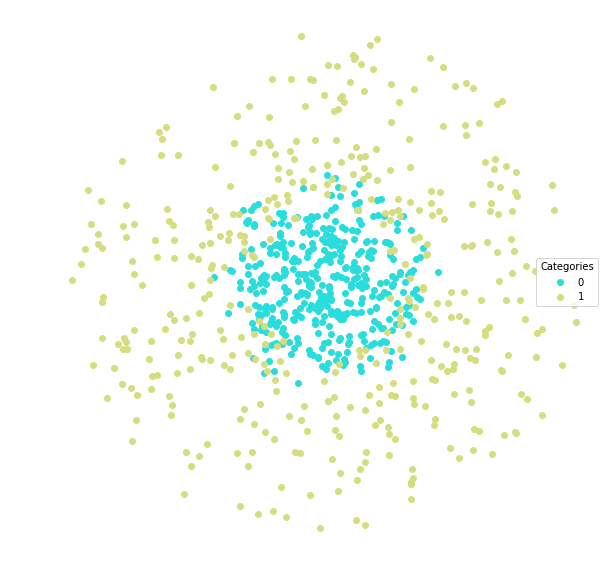

In [3]:
lucem_illud.plotter(dfTrain)

## Training a Machine Learning algorithm

We can now pick a model, there are many more options in `scikit-learn`. These are just a few examples, which array along the machine learning "tribes" described in Pedro Domingos _The Master Algorithm_.

Uncomment (remove the # in front of) each algorithm one at a time, then run the cell and subsequent cells to evaluate how it learns to understand the data.

In [4]:
#Bayes
#clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

Now we fit the model by giving it our training data

In [5]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='distance')

## Algorithm evaluation

We can look at few measurements of each classifier's performance by using the testing set

In [ ]:
lucem_illud.evaluateClassifier(clf, dfTest)

This lets us look at which classes do better:

In [ ]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

The greater the area under the curve the better.

In [ ]:
lucem_illud.plotMultiROC(clf, dfTest)

We can also look at the regions the classifer identifies as one class or the other:

In [ ]:
lucem_illud.plotregions(clf, dfTrain)

## Now we do the same for real data

Available data sets include:
+ Reddit threads "classified" by thread topic
+ 20 newsgroups "classified" by group topic
+ Senate press releases "classified" by Senator (2 senators)
+ Senate press releases "classified" by Senator (5 senators)
+ Emails classified as Spam or Ham

In [6]:
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadReddit())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadNewsGroups())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateLarge())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSpam())

Loading Reddit data
Converting to vectors


In [ ]:
#Bayes
clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up, but lose ROC
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
#clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

In [ ]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

In [ ]:
lucem_illud.evaluateClassifier(clf, dfTest)

In [ ]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

In [ ]:
lucem_illud.plotMultiROC(clf, dfTest)

In [ ]:
lucem_illud.plotregions(clf, dfTrain)

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Go back through all of the cells above and generate 10 distinct artificial datasets and classify them with all of the available methods. Add a cell immediately below and describe which classifier(s) worked best with which artificially constructed data source and why. Then go through all of the empirical datasets (i.e., Newsgroups, Senate Small, Senate Large, Email Spam) and classify them with all available methods. Add a second cell immediately below and describe which classifier(s) worked best with which data set and why.

<span style="color:red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

## 10 Distinct Artificial Datasets

### Generate 5 Distinct Artificial Datasets with noise=0.2

In [4]:
### Generate distinct artificial datasets: 2 artificial samples for each method ###
noise = .2
# Random
dfTrain0, dfTest0 = lucem_illud.trainTestSplit(lucem_illud.random())
# andSplit
dfTrain1, dfTest1 = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise))
# xorSplit
dfTrain2, dfTest2 = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise))
# targetSplit
dfTrain3, dfTest3 = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise))
# multiBlobs
dfTrain4, dfTest4 = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise))

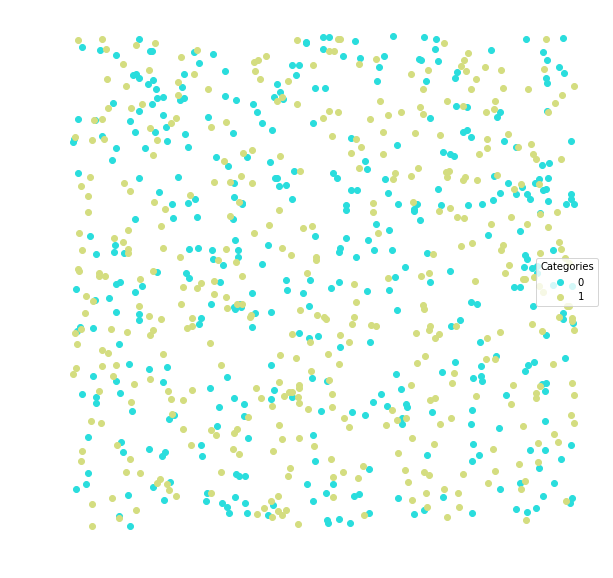

In [5]:
# Check random sample
lucem_illud.plotter(dfTrain0)

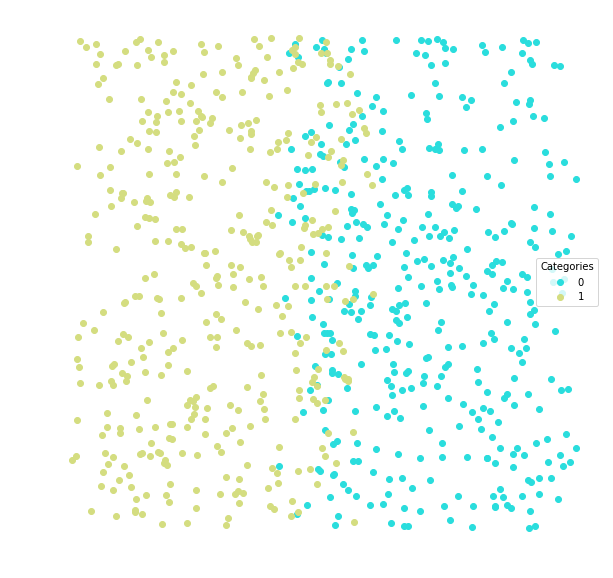

In [6]:
# Check andSplit
lucem_illud.plotter(dfTrain1)

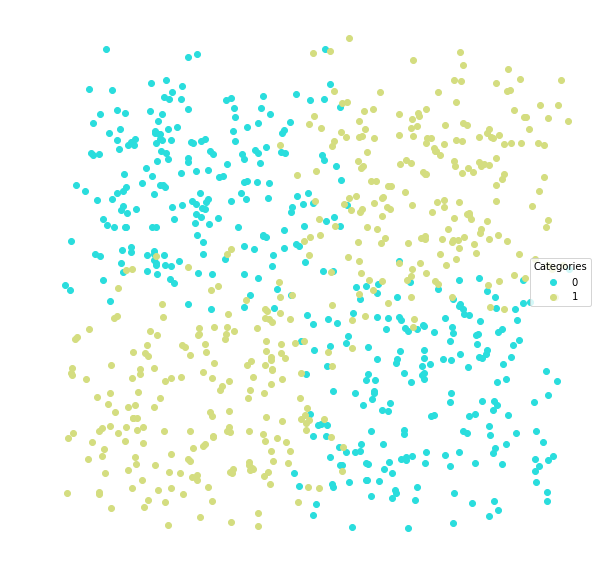

In [7]:
# Check xorSplit
lucem_illud.plotter(dfTrain2)

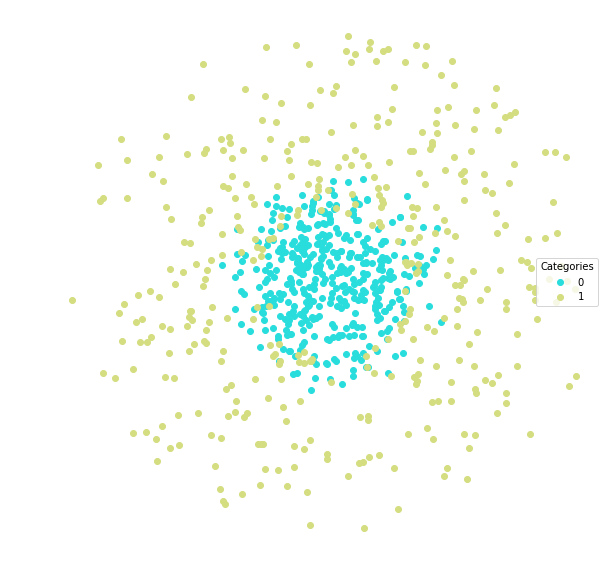

In [8]:
# Check targetSplit
lucem_illud.plotter(dfTrain3)

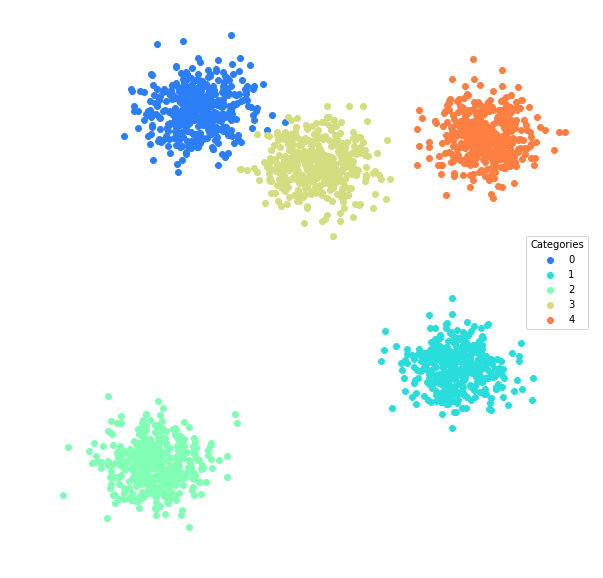

In [9]:
# Check MultiBlob
lucem_illud.plotter(dfTrain4)

### Generate 5 Distinct Artificial Datasets with noise=0.7

In [10]:
noise2 = .7
# Random
dfTrain5, dfTest5 = lucem_illud.trainTestSplit(lucem_illud.random())
# andSplit
dfTrain6, dfTest6 = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise2))
# xorSplit
dfTrain7, dfTest7 = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise2))
# targetSplit
dfTrain8, dfTest8 = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise2))
# multiBlobs
dfTrain9, dfTest9 = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise2))

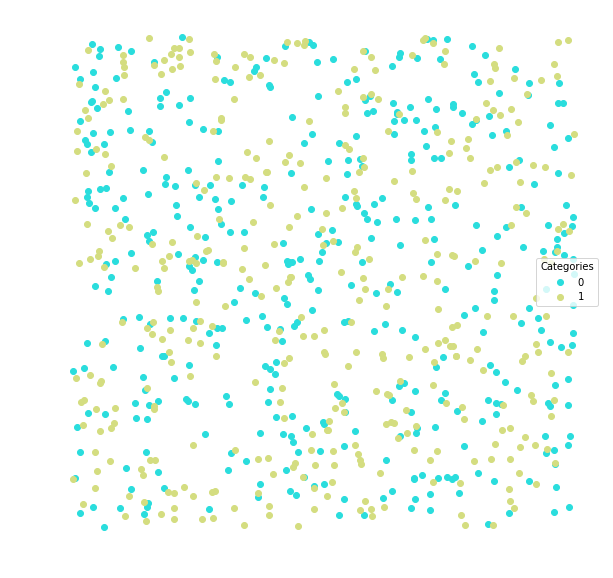

In [11]:
# Check random sample
lucem_illud.plotter(dfTrain5)

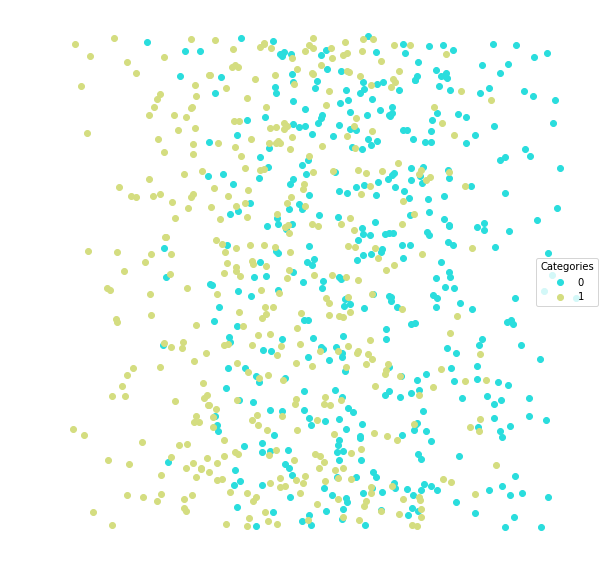

In [12]:
# Check andSplit
lucem_illud.plotter(dfTrain6)

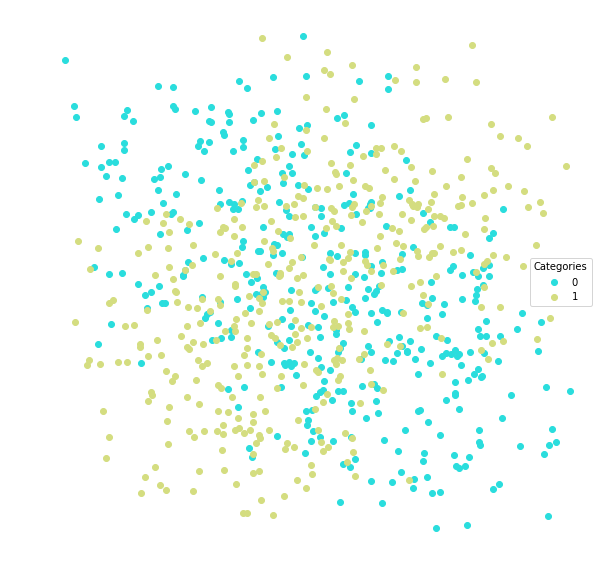

In [13]:
# Check xorSplit
lucem_illud.plotter(dfTrain7)

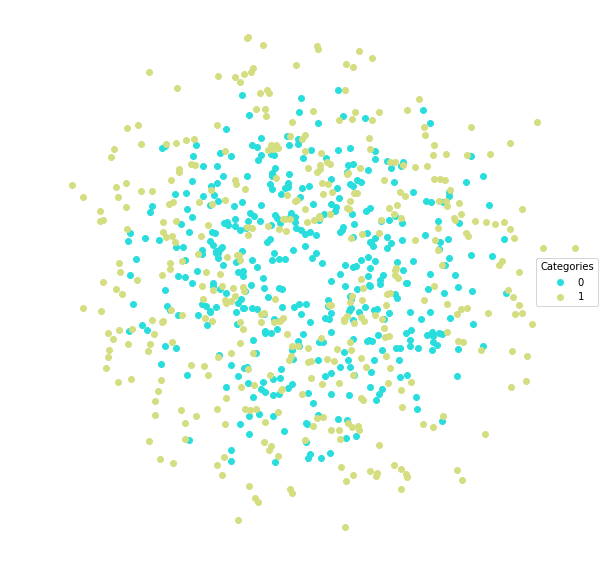

In [14]:
# Check targetSplit
lucem_illud.plotter(dfTrain8)

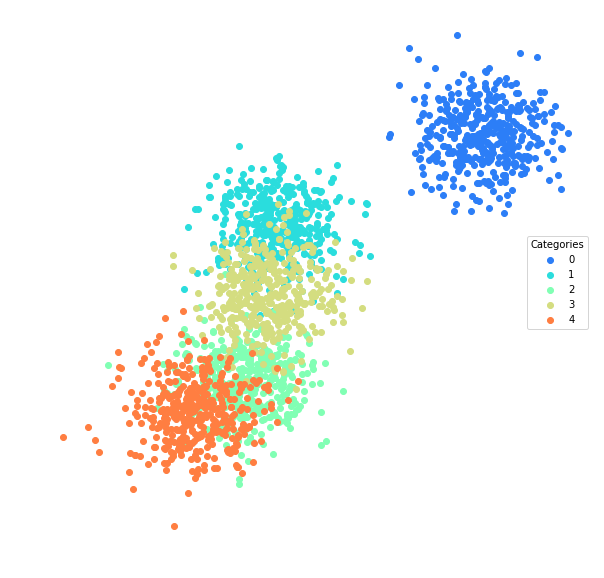

In [15]:
# Check MultiBlob
lucem_illud.plotter(dfTrain9)

## Apply Classifiers

In [16]:
# Define a function to fun one classifier

def run_single_model(method, dfTrain, dfTest):
    # Initialize model
    if method == 'bayes':
        clf = sklearn.naive_bayes.GaussianNB()
    elif method == 'svm_linear':
        clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
    elif method == 'svm_poly':
        clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
    elif method == 'knn':
        clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'
    elif method == 'classical_reg':
        clf = sklearn.linear_model.LogisticRegression()
    elif method == 'decision_tree':
        clf = sklearn.tree.DecisionTreeClassifier()
    elif method == 'random_forest':
        clf = sklearn.ensemble.RandomForestClassifier()
    elif method == 'neural_network':
        clf = sklearn.neural_network.MLPClassifier()
    elif method == 'boosting':
        clf = sklearn.ensemble.GradientBoostingClassifier()
    
    # Fit the model
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    
    # Evaluation
    evl_df = lucem_illud.evaluateClassifier(clf, dfTest)
    print(method, ' Evaluation:')
    print(evl_df)
    print(method, ' Confusion Matrix:')
    lucem_illud.plotConfusionMatrix(clf, dfTest)
    print(method, ' ROC:')
    lucem_illud.plotMultiROC(clf, dfTest)
    print(method, ' Regions:')
    lucem_illud.plotregions(clf, dfTrain)
    
    return evl_df

In [17]:
# Define a function to fun all classifiers
def run_all_model(dfTrain, dfTest):
    rv = []
    
    evl_bayes = run_single_model('bayes', dfTrain, dfTest)
    evl_svm_linear = run_single_model('svm_linear', dfTrain, dfTest)
    evl_svm_poly = run_single_model('svm_poly', dfTrain, dfTest)
    evl_knn = run_single_model('knn', dfTrain, dfTest)
    evl_classical_reg = run_single_model('classical_reg', dfTrain, dfTest)
    evl_dt = run_single_model('decision_tree', dfTrain, dfTest)
    evl_rf = run_single_model('random_forest', dfTrain, dfTest)
    evl_neural_network = run_single_model('neural_network', dfTrain, dfTest)
    evl_boosting = run_single_model('boosting', dfTrain, dfTest)
    
    rv.append(evl_bayes)
    rv.append(evl_svm_linear)
    rv.append(evl_svm_poly)
    rv.append(evl_knn)
    rv.append(evl_classical_reg)
    rv.append(evl_dt)
    rv.append(evl_rf)
    rv.append(evl_neural_network)
    rv.append(evl_boosting)
    
    return rv

### Random Datasets

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.556303           0.562763       0.455   0.619048  0.367925
1         0.556303           0.500494       0.455   0.510949  0.744681
bayes  Confusion Matrix:


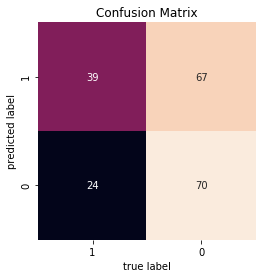

bayes  ROC:


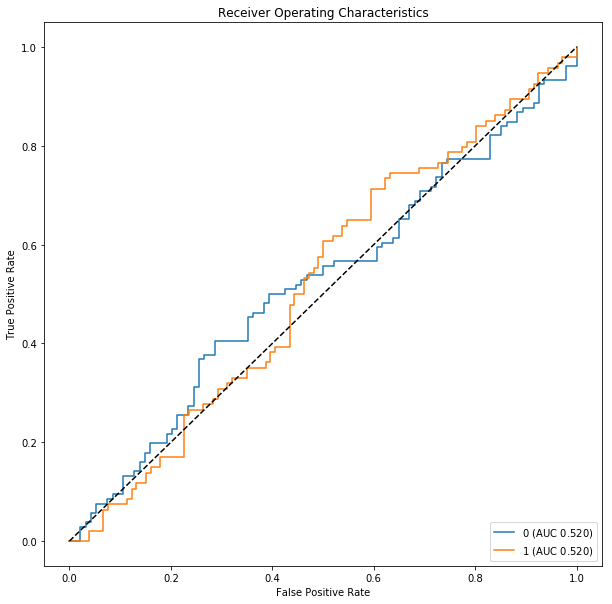

bayes  Regions:


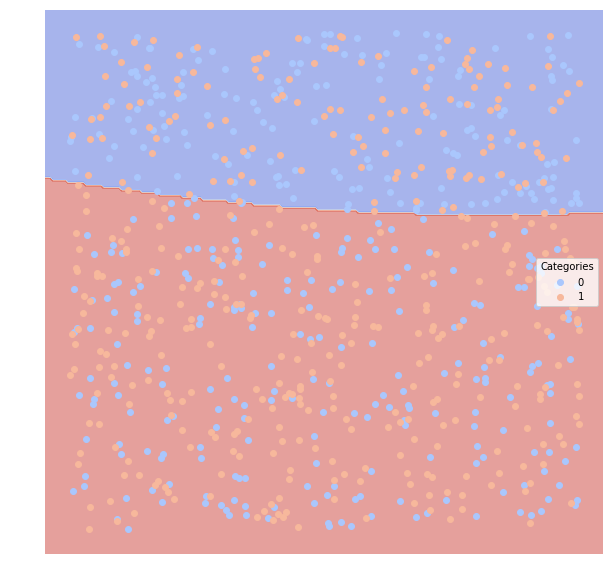

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.533119           0.547642        0.47   0.566667  0.481132
1         0.533119           0.487553        0.47   0.500000  0.585106
svm_linear  Confusion Matrix:


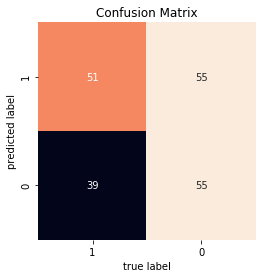

svm_linear  ROC:


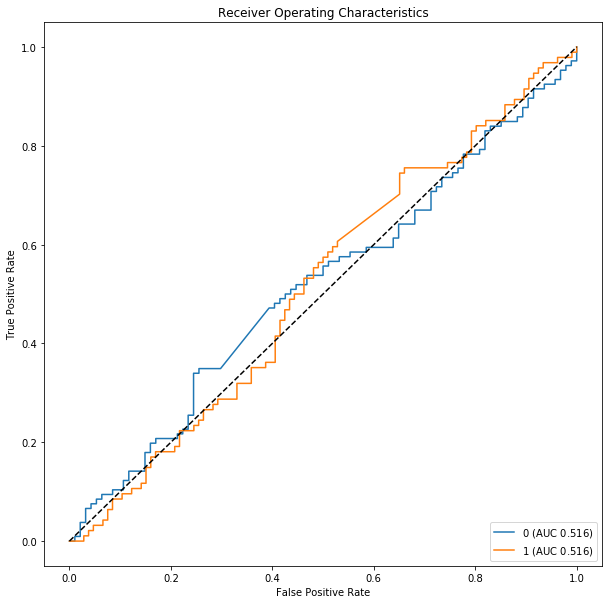

svm_linear  Regions:


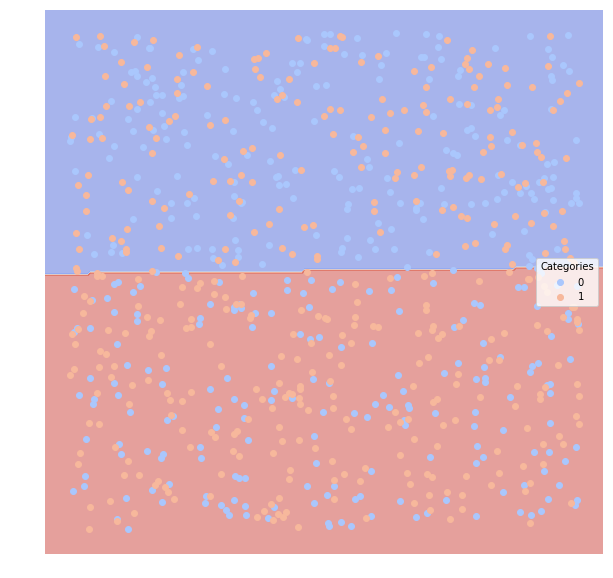

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.514151           0.543302       0.515   1.000000  0.028302
1         0.514151           0.477157       0.515   0.477157  1.000000
svm_poly  Confusion Matrix:


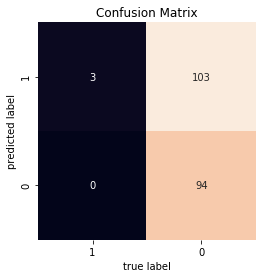

svm_poly  ROC:


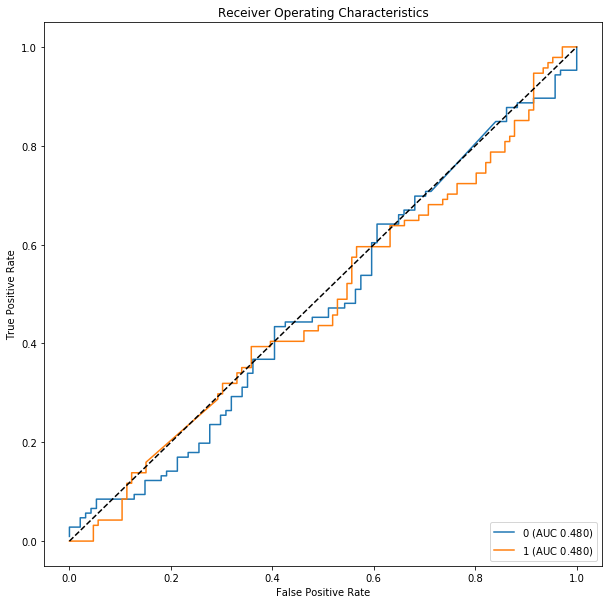

svm_poly  Regions:


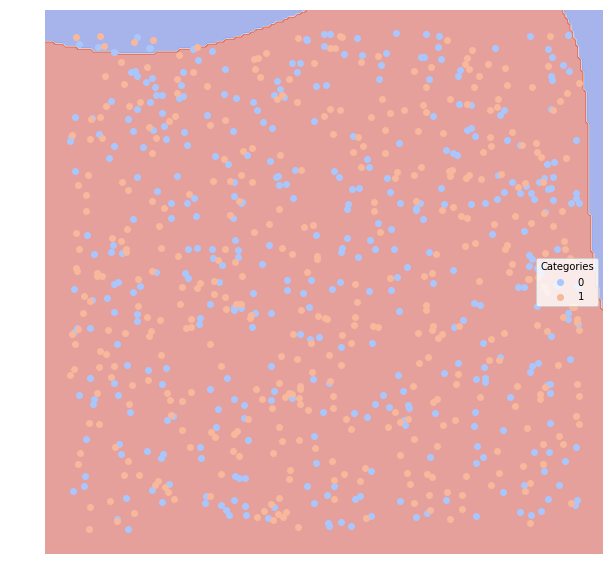

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.449819           0.507358        0.55       0.48  0.452830
1         0.449819           0.447660        0.55       0.42  0.446809
knn  Confusion Matrix:


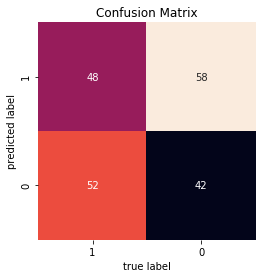

knn  ROC:


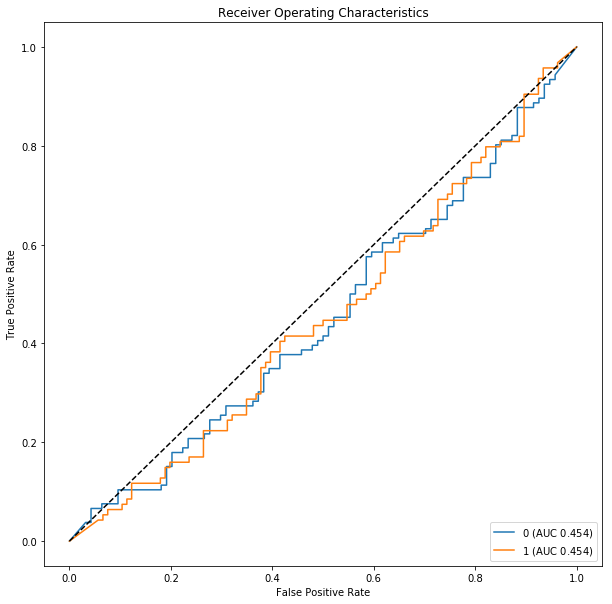

knn  Regions:


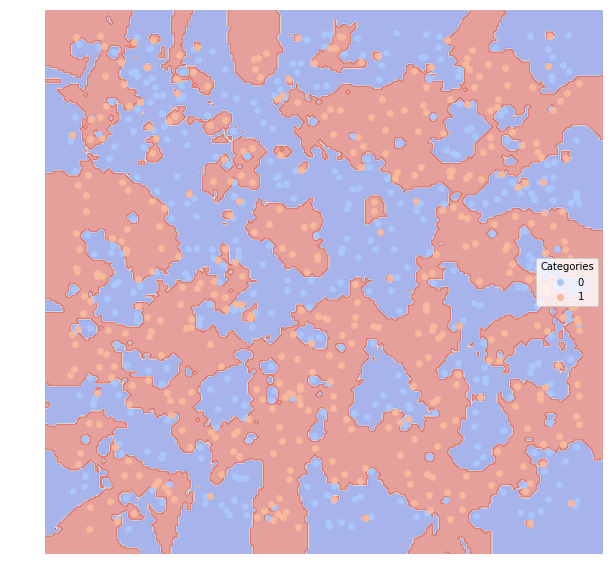

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.536732           0.549920        0.47   0.576923  0.424528
1         0.536732           0.489468        0.47   0.500000  0.648936
classical_reg  Confusion Matrix:


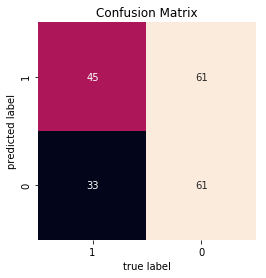

classical_reg  ROC:


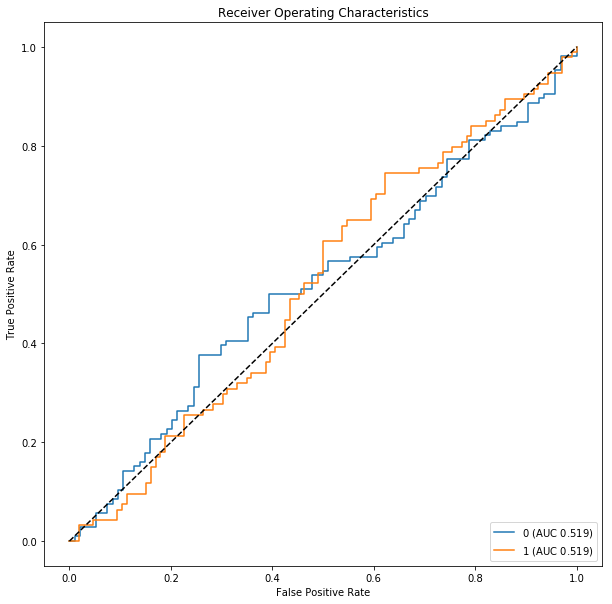

classical_reg  Regions:


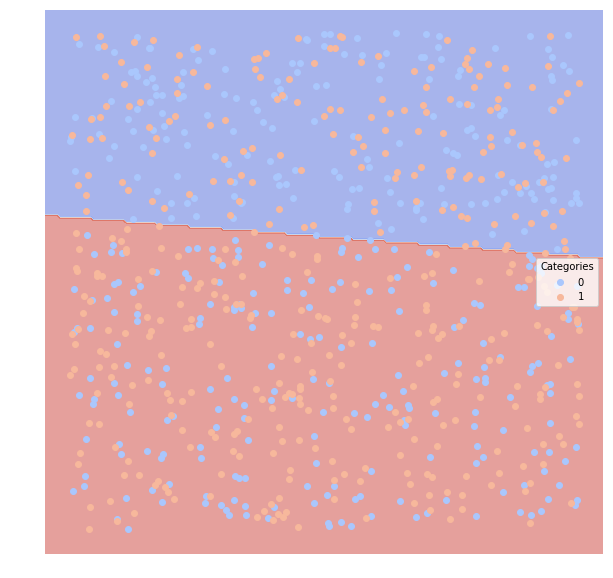

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.505921           0.532984       0.495   0.536082  0.490566
1         0.505921           0.472986       0.495   0.475728  0.521277
decision_tree  Confusion Matrix:


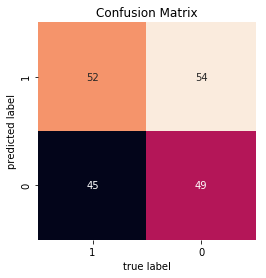

decision_tree  ROC:


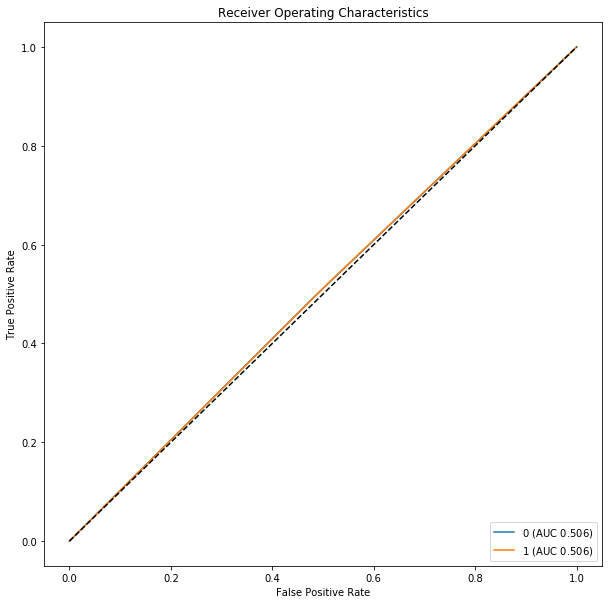

decision_tree  Regions:


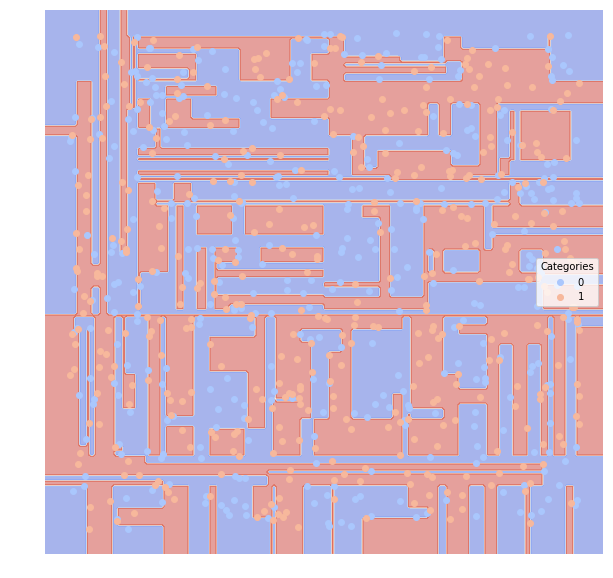

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.486351           0.523356        0.51   0.517857  0.547170
1         0.486351           0.463424        0.51   0.454545  0.425532
random_forest  Confusion Matrix:


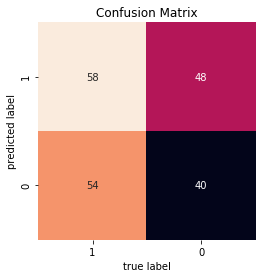

random_forest  ROC:


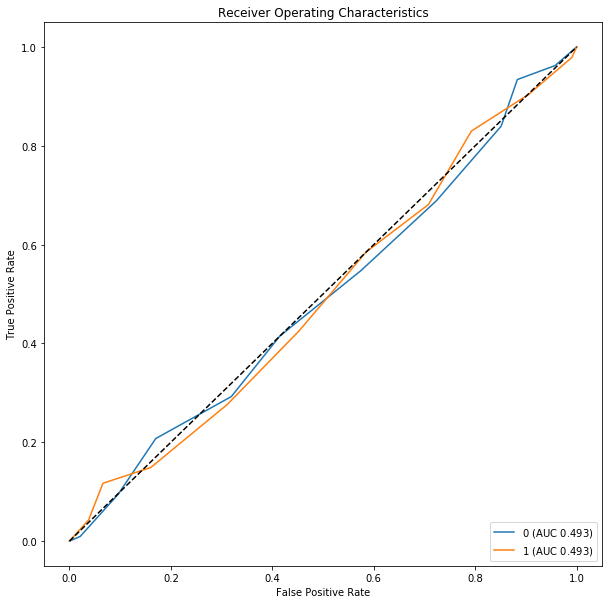

random_forest  Regions:


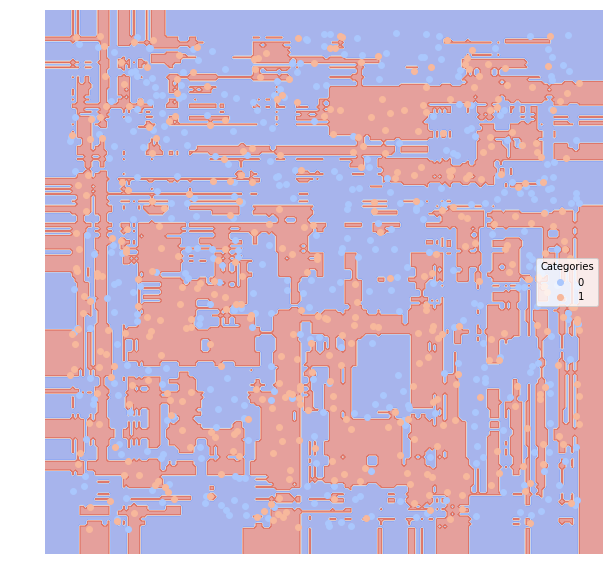

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.548575           0.557269        0.46   0.597222  0.405660
1         0.548575           0.496147        0.46   0.507812  0.691489
neural_network  Confusion Matrix:


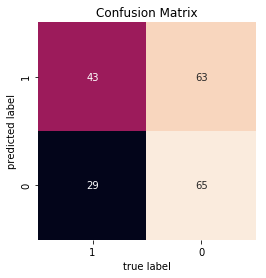

neural_network  ROC:


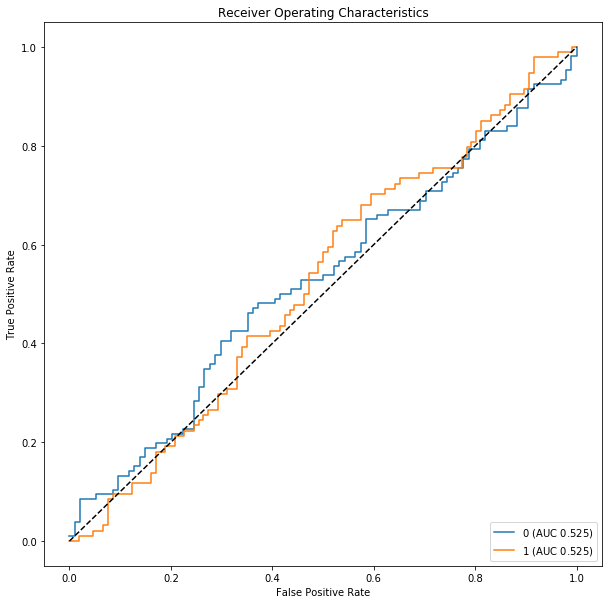

neural_network  Regions:


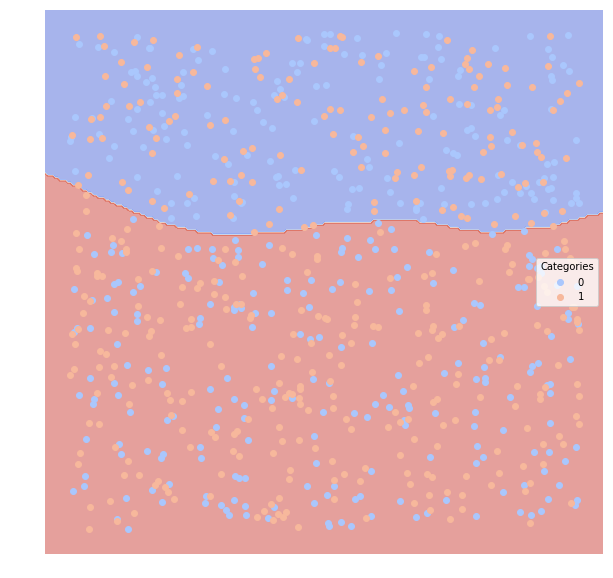

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.504215           0.532119         0.5   0.534884  0.433962
1         0.504215           0.472116         0.5   0.473684  0.574468
boosting  Confusion Matrix:


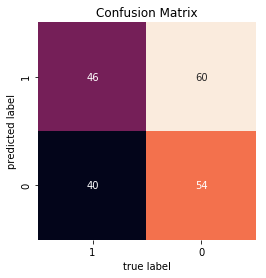

boosting  ROC:


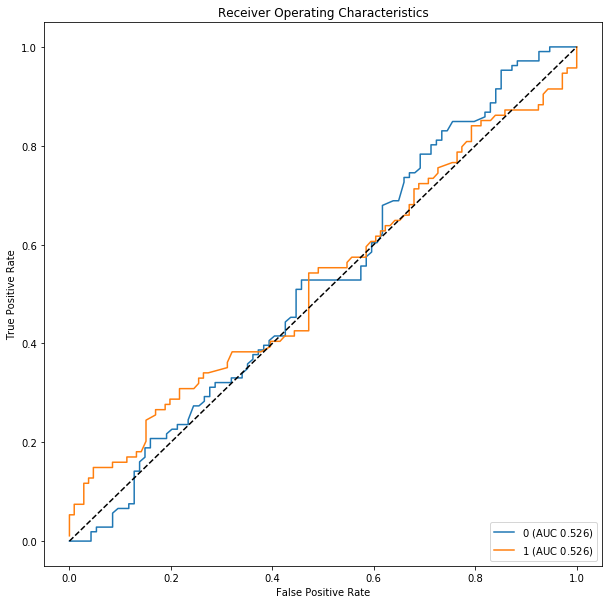

boosting  Regions:


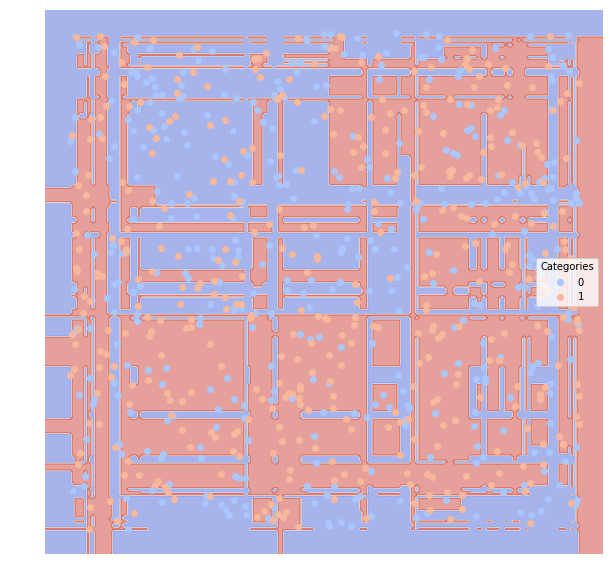

In [18]:
# With noise==0.2
evl0 = run_all_model(dfTrain0, dfTest0)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.488695           0.459484        0.52      0.456  0.612903
1         0.488695           0.529533        0.52      0.520  0.364486
bayes  Confusion Matrix:


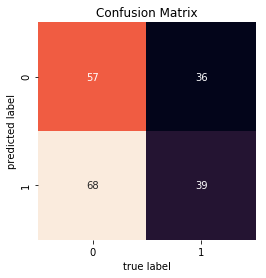

bayes  ROC:


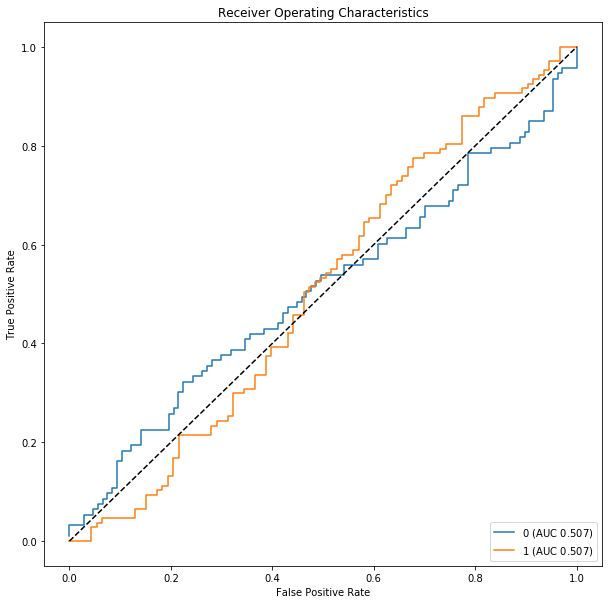

bayes  Regions:


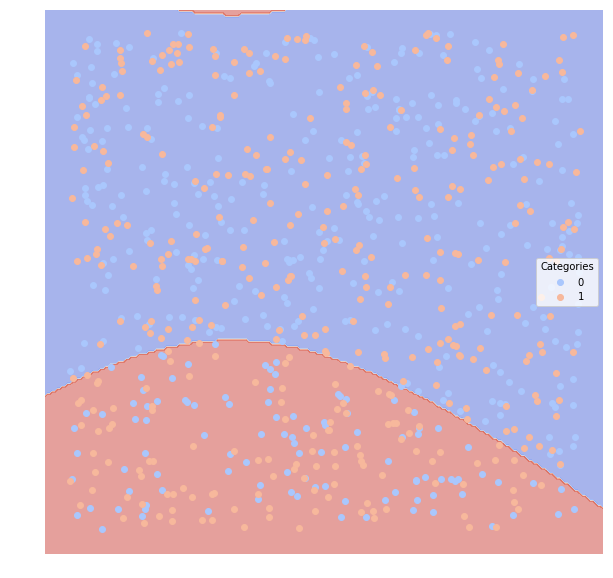

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.492865           0.461508       0.505   0.457447  0.462366
1         0.492865           0.531494       0.505   0.528302  0.523364
svm_linear  Confusion Matrix:


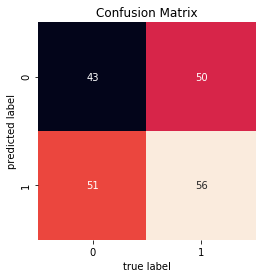

svm_linear  ROC:


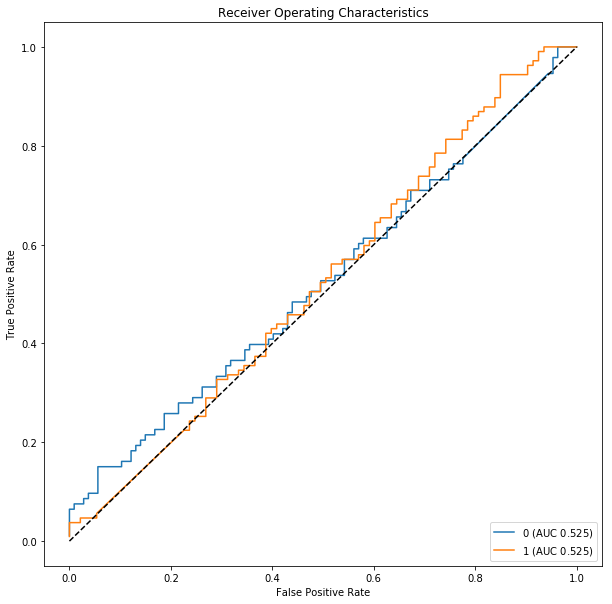

svm_linear  Regions:


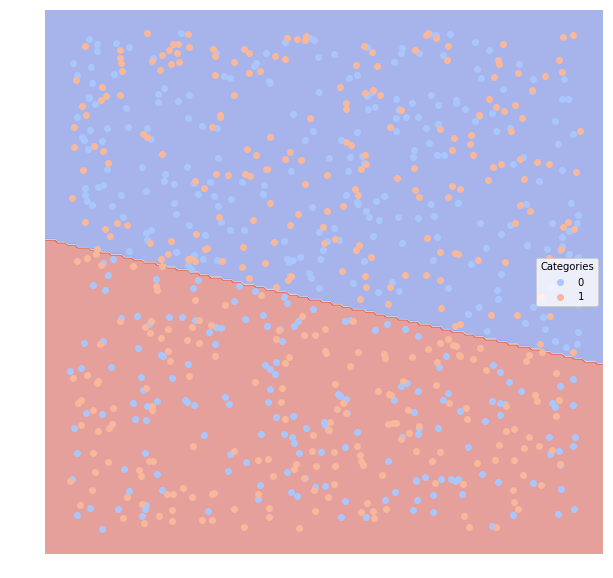

svm_poly  Evaluation:
          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
0         0.5              0.465       0.535      0.465     1.0
1         0.5              0.535       0.535      0.000     0.0
svm_poly  Confusion Matrix:


/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


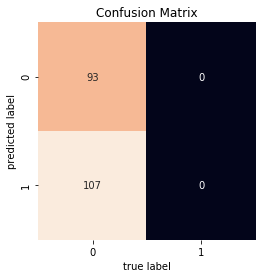

svm_poly  ROC:


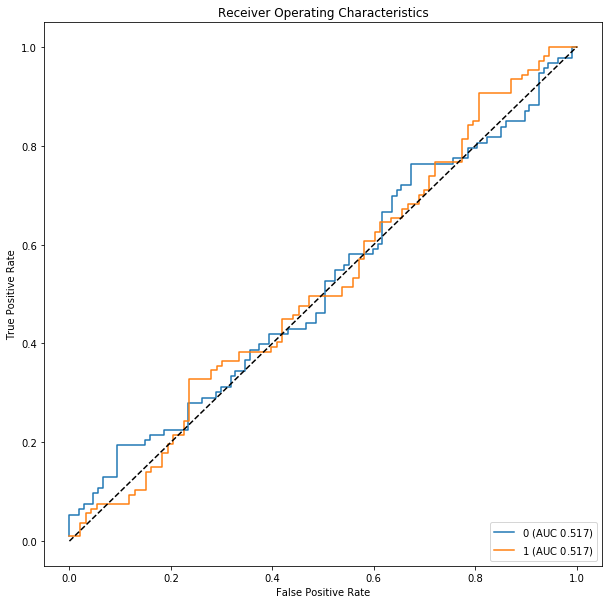

svm_poly  Regions:


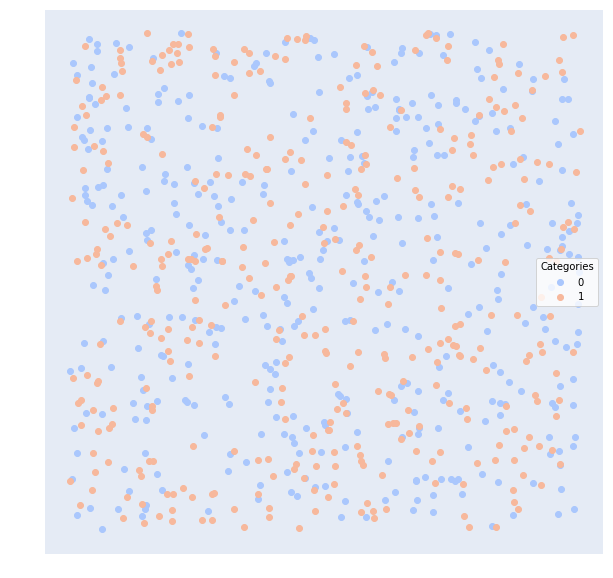

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.459451           0.446593        0.54   0.424242  0.451613
1         0.459451           0.516332        0.54   0.495050  0.467290
knn  Confusion Matrix:


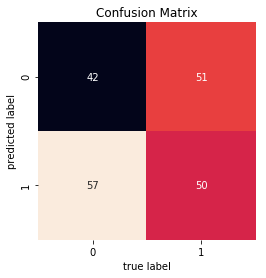

knn  ROC:


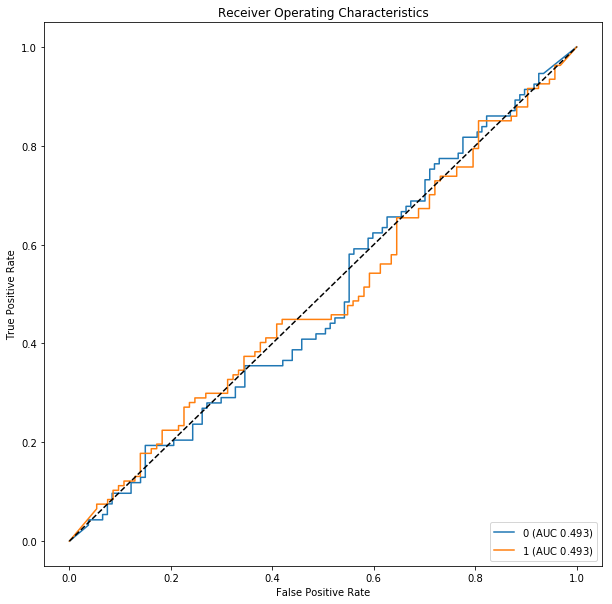

knn  Regions:


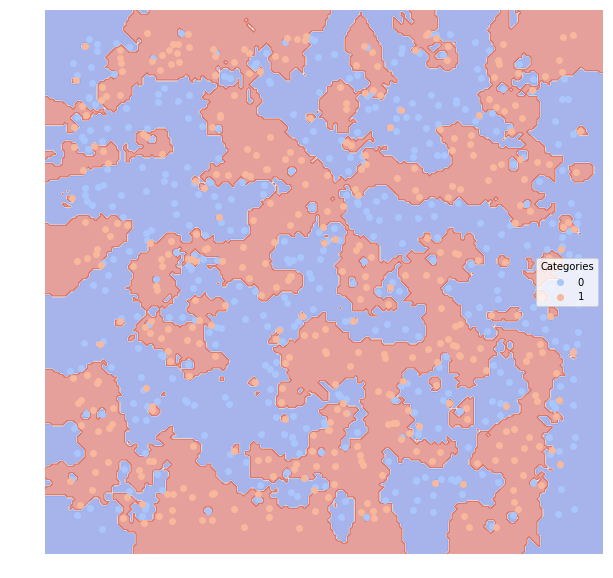

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.497789           0.463905       0.505   0.462963  0.537634
1         0.497789           0.533905       0.505   0.532609  0.457944
classical_reg  Confusion Matrix:


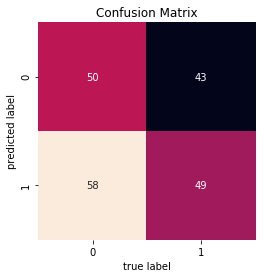

classical_reg  ROC:


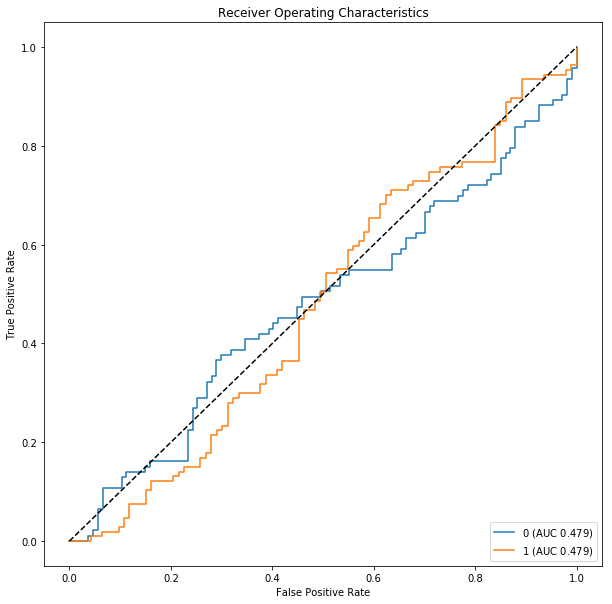

classical_reg  Regions:


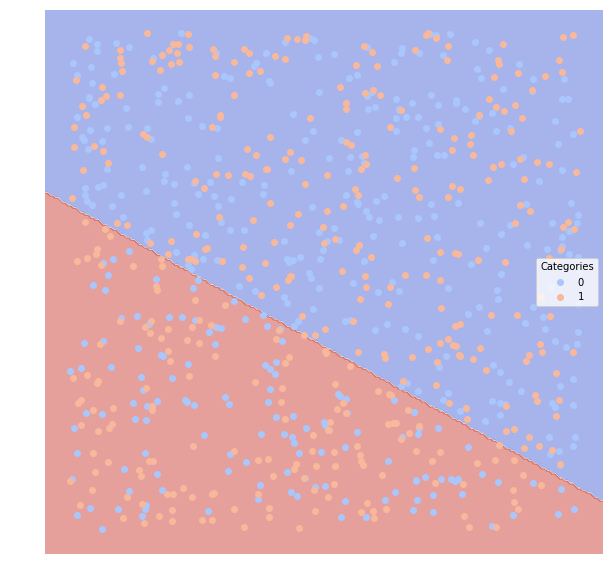

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.587529           0.516246       0.415    0.54717  0.623656
1         0.587529           0.586093       0.415    0.62766  0.551402
decision_tree  Confusion Matrix:


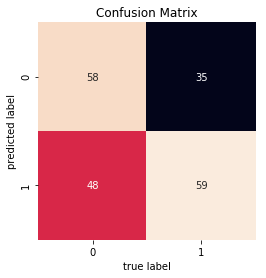

decision_tree  ROC:


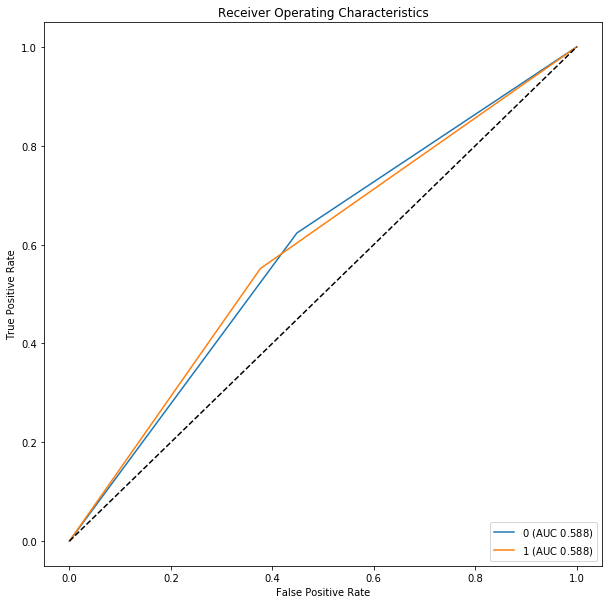

decision_tree  Regions:


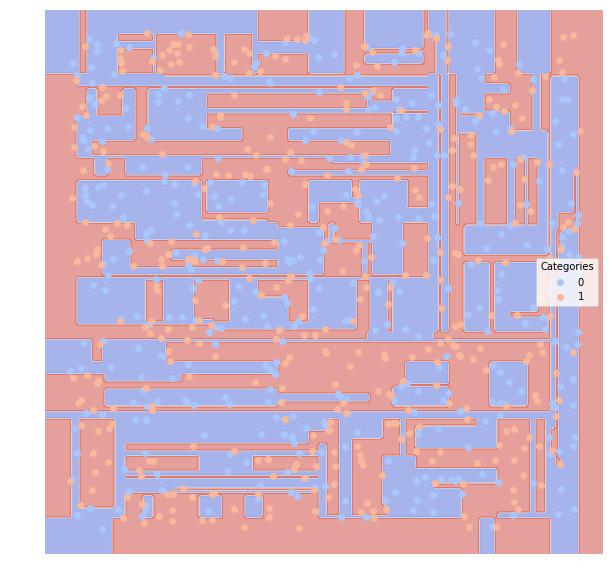

random_forest  Evaluation:
             AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                            
0         0.4999            0.46495       0.505   0.464912  0.569892
1         0.4999            0.53495       0.505   0.534884  0.429907
random_forest  Confusion Matrix:


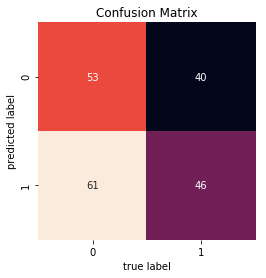

random_forest  ROC:


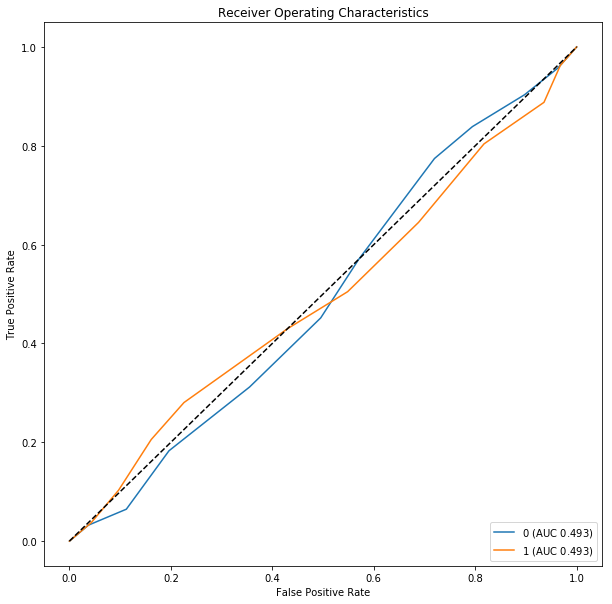

random_forest  Regions:


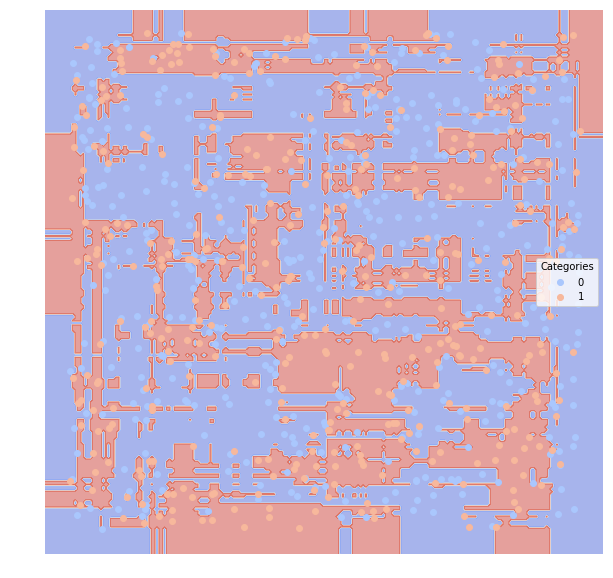

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.480052           0.455403        0.53   0.449612  0.623656
1         0.480052           0.525594        0.53   0.507042  0.336449
neural_network  Confusion Matrix:


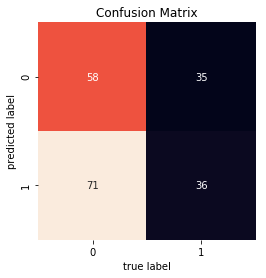

neural_network  ROC:


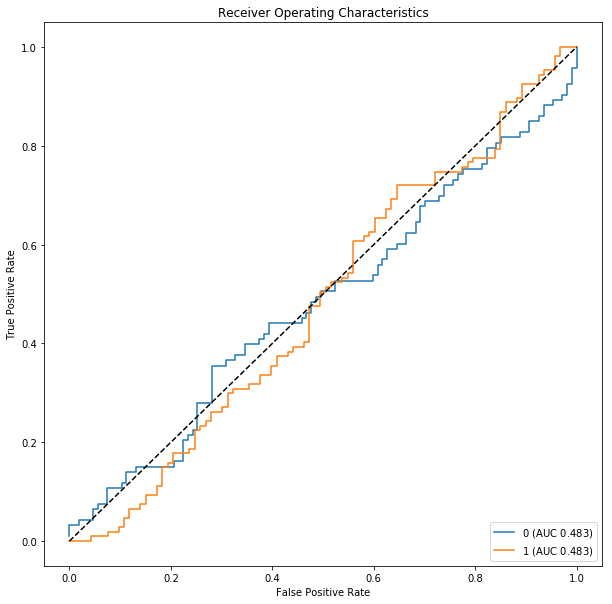

neural_network  Regions:


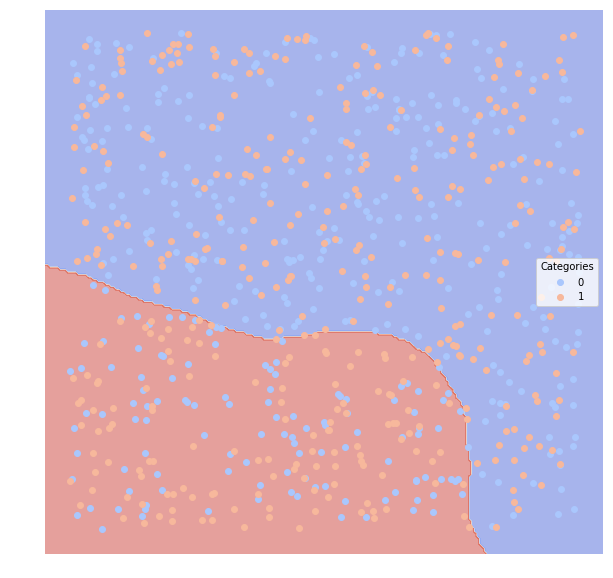

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.519998           0.475324       0.485   0.482456  0.591398
1         0.519998           0.545380       0.485   0.558140  0.448598
boosting  Confusion Matrix:


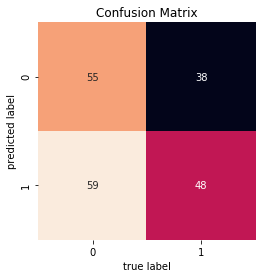

boosting  ROC:


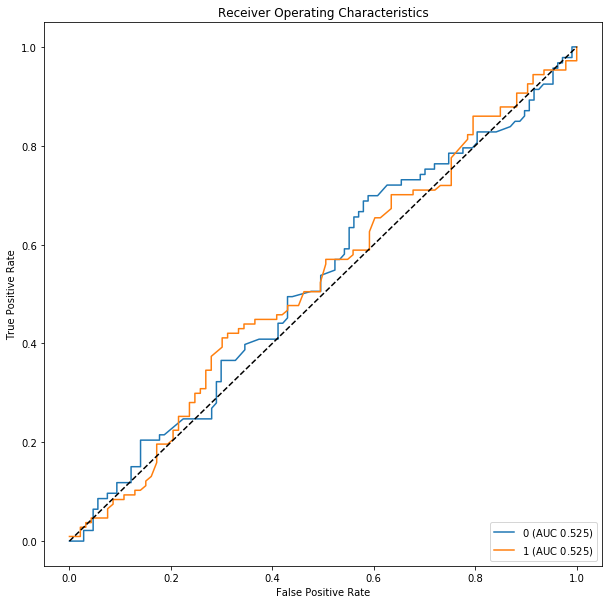

boosting  Regions:


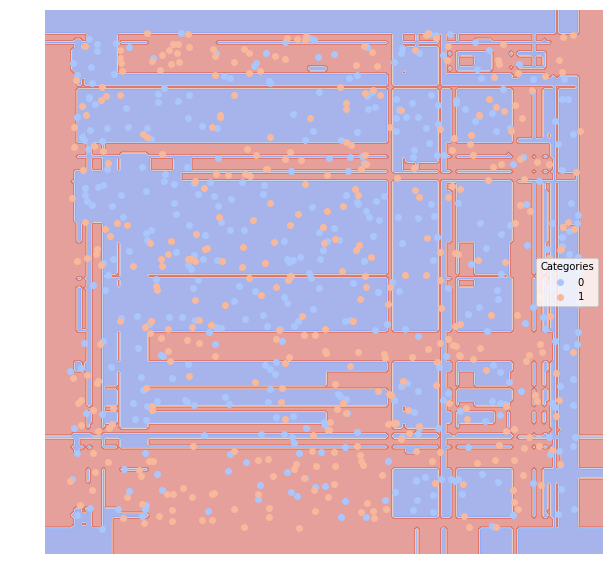

In [19]:
# With noise==0.7
evl5 = run_all_model(dfTrain5, dfTest5)

### andSplit Datasets

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.905062           0.871588       0.095   0.910891  0.901961
1         0.905062           0.861430       0.095   0.898990  0.908163
bayes  Confusion Matrix:


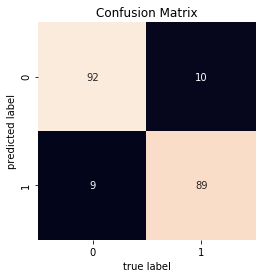

bayes  ROC:


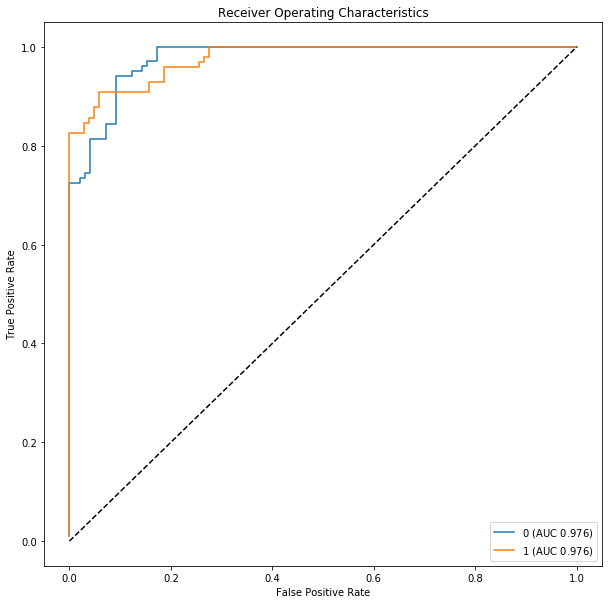

bayes  Regions:


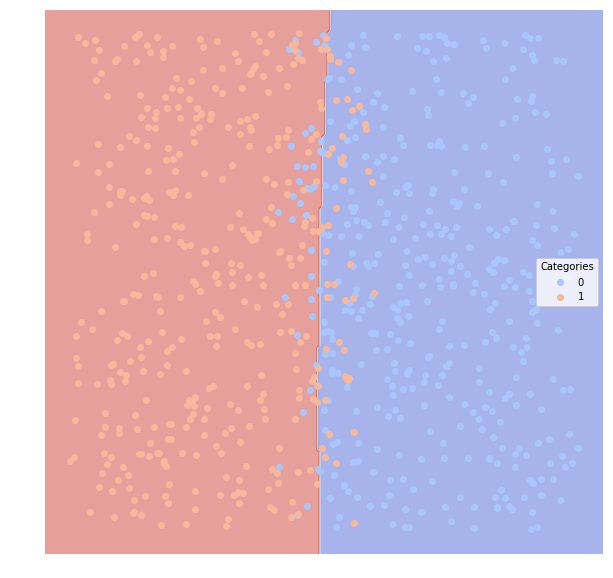

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.909964           0.876315        0.09   0.911765  0.911765
1         0.909964           0.869761        0.09   0.908163  0.908163
svm_linear  Confusion Matrix:


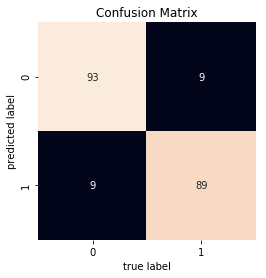

svm_linear  ROC:


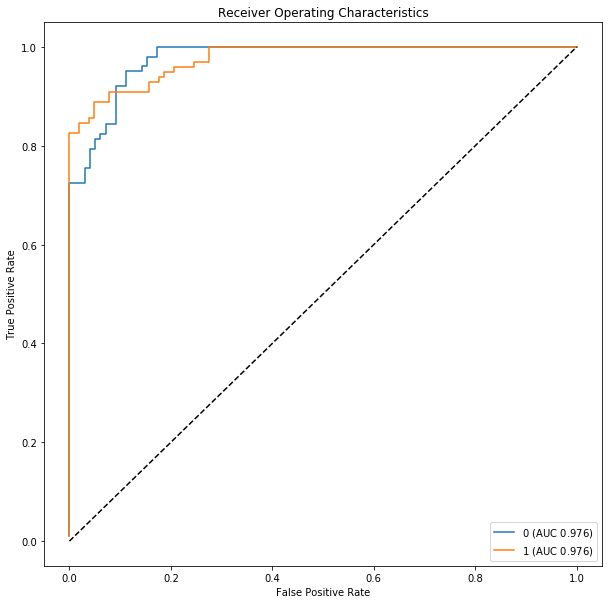

svm_linear  Regions:


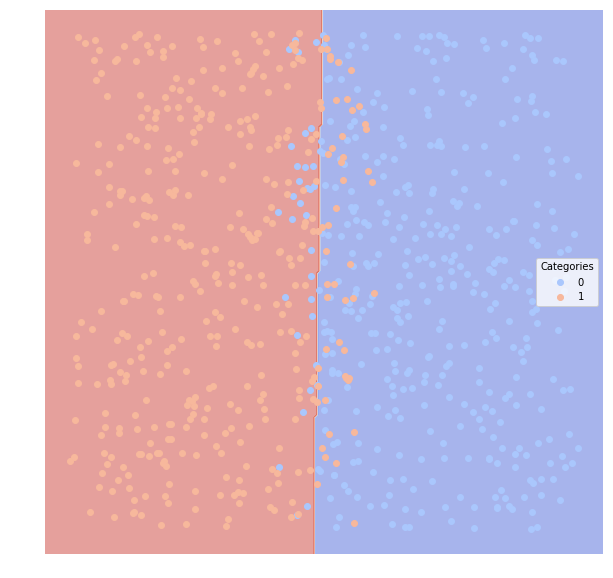

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.898559           0.843347         0.1   0.853448  0.970588
1         0.898559           0.882012         0.1   0.964286  0.826531
svm_poly  Confusion Matrix:


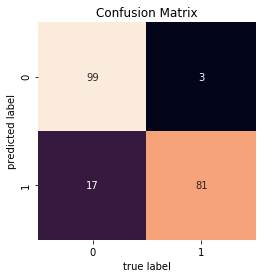

svm_poly  ROC:


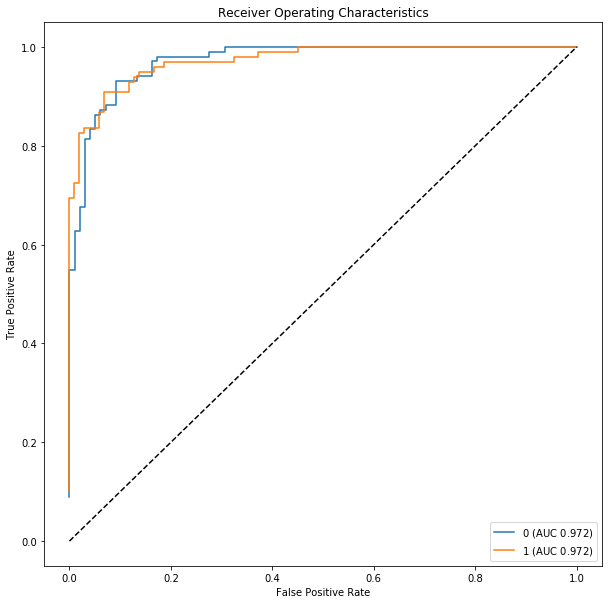

svm_poly  Regions:


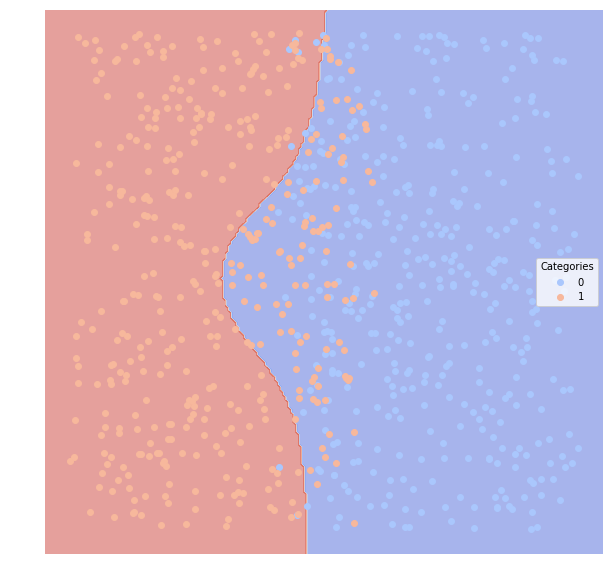

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.885254           0.849413       0.115   0.898990  0.872549
1         0.885254           0.832380       0.115   0.871287  0.897959
knn  Confusion Matrix:


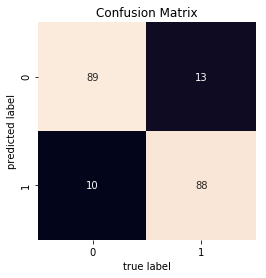

knn  ROC:


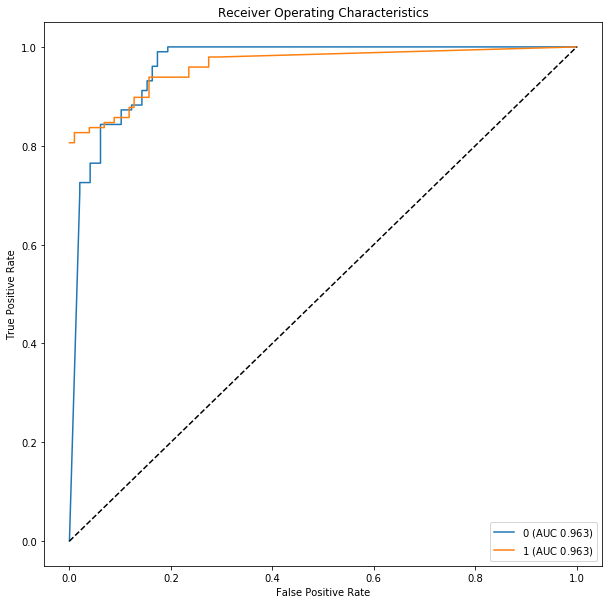

knn  Regions:


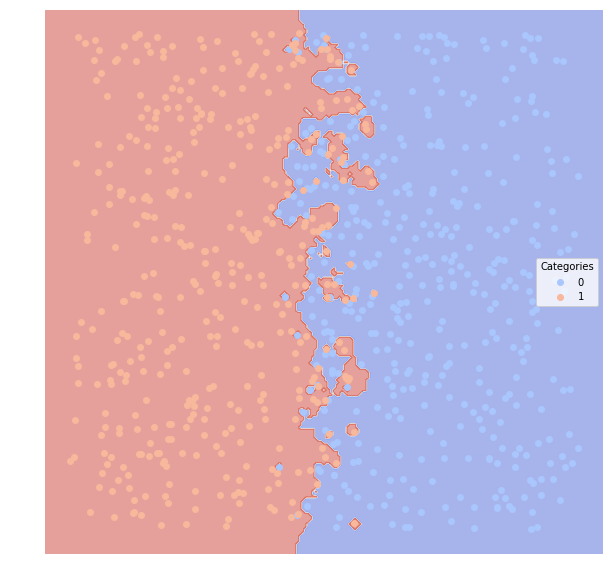

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.895258           0.862139       0.105   0.909091  0.882353
1         0.895258           0.845263       0.105   0.881188  0.908163
classical_reg  Confusion Matrix:


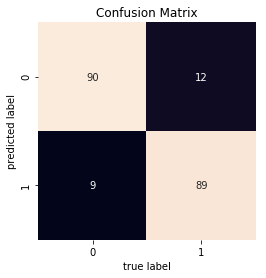

classical_reg  ROC:


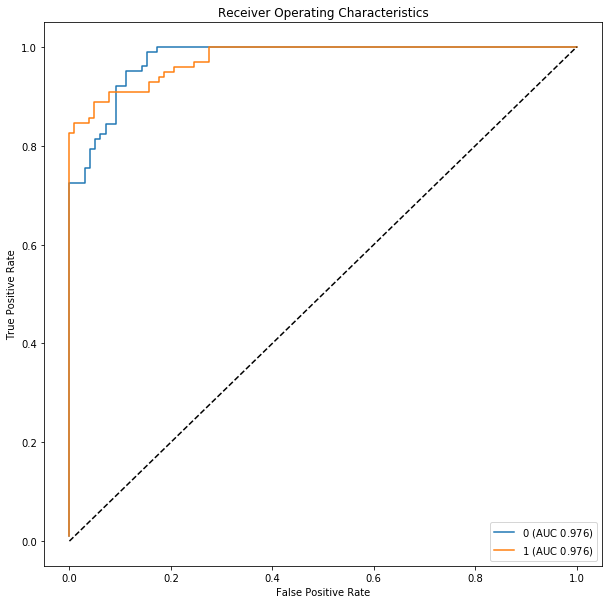

classical_reg  Regions:


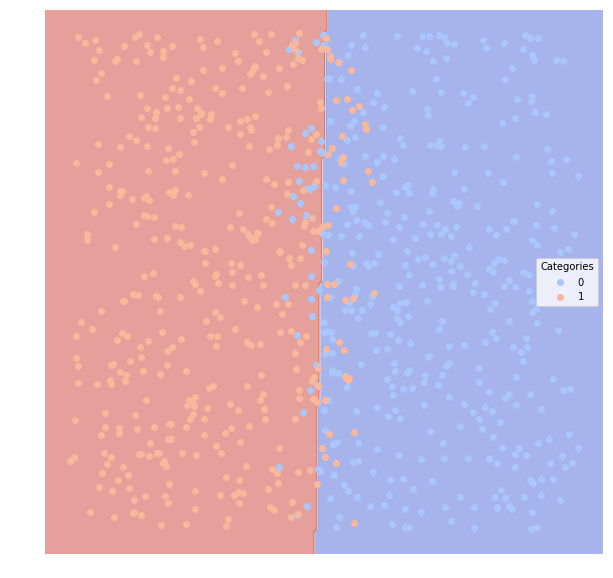

decision_tree  Evaluation:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.87565           0.843261       0.125   0.905263  0.843137
1         0.87565           0.814776       0.125   0.847619  0.908163
decision_tree  Confusion Matrix:


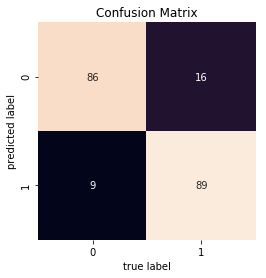

decision_tree  ROC:


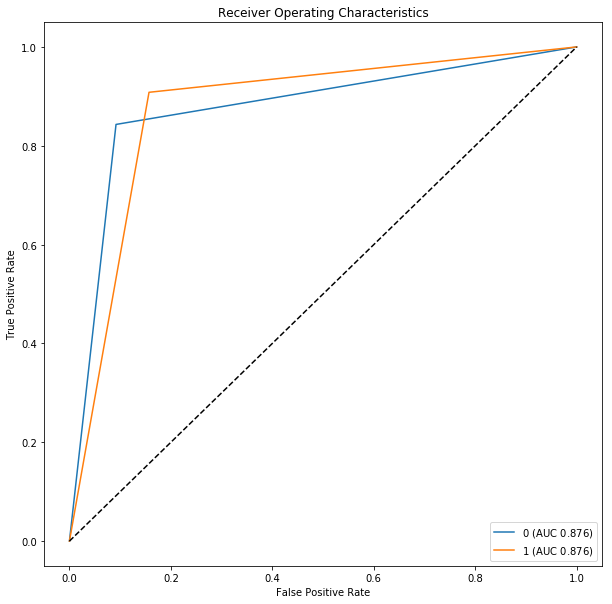

decision_tree  Regions:


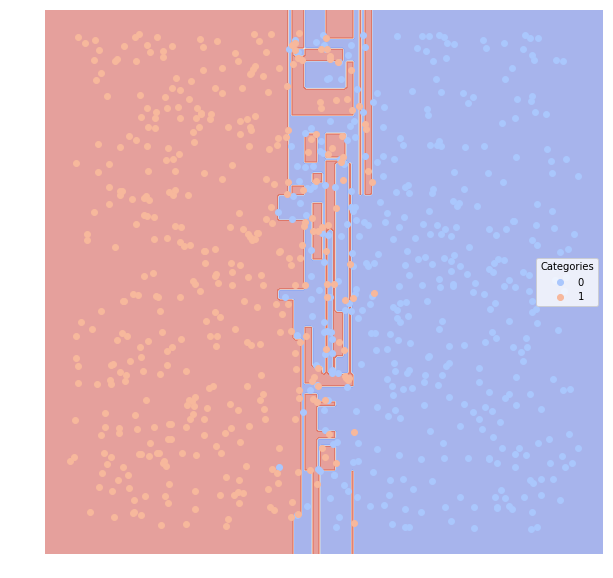

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.870148           0.829216        0.13       0.88  0.862745
1         0.870148           0.814694        0.13       0.86  0.877551
random_forest  Confusion Matrix:


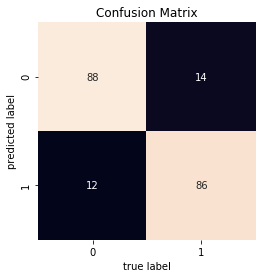

random_forest  ROC:


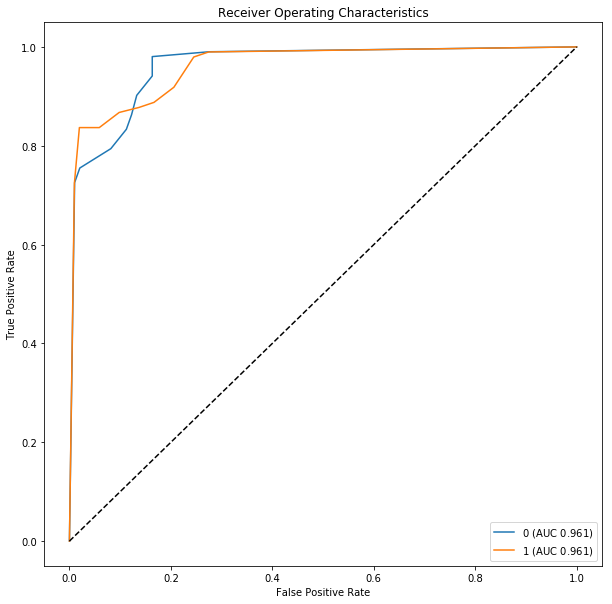

random_forest  Regions:


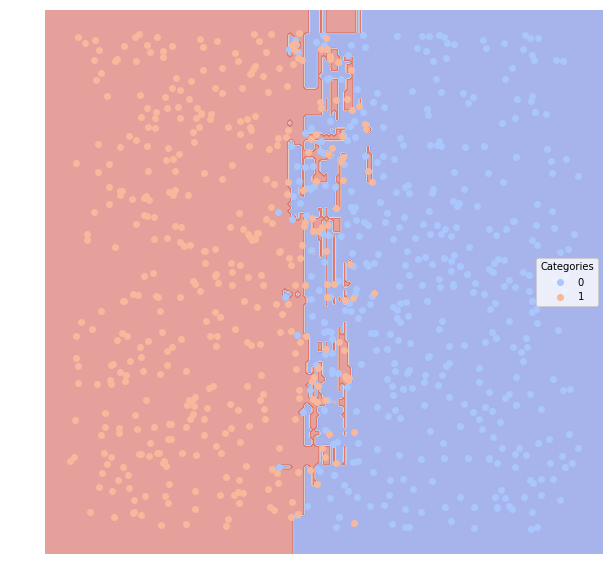

neural_network  Evaluation:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.90016           0.866863         0.1       0.91  0.892157
1         0.90016           0.853265         0.1       0.89  0.908163
neural_network  Confusion Matrix:


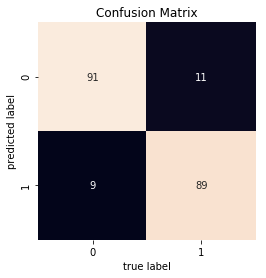

neural_network  ROC:


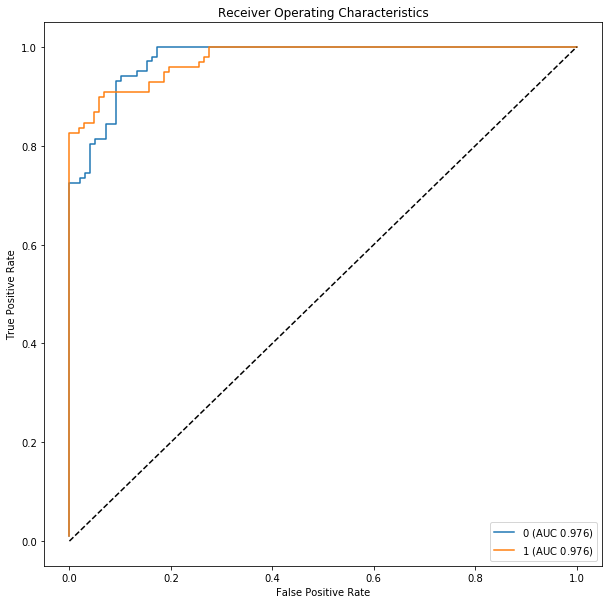

neural_network  Regions:


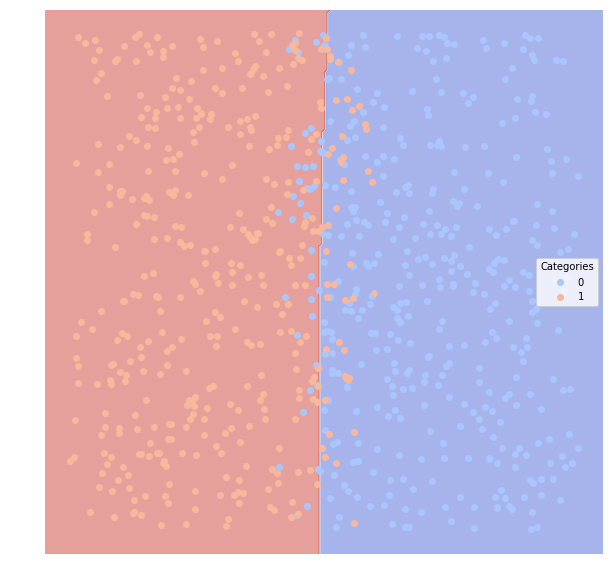

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.890156           0.854118        0.11       0.90  0.882353
1         0.890156           0.840204        0.11       0.88  0.897959
boosting  Confusion Matrix:


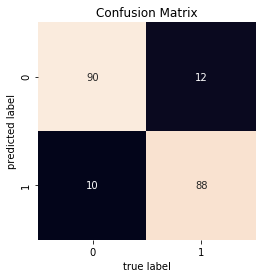

boosting  ROC:


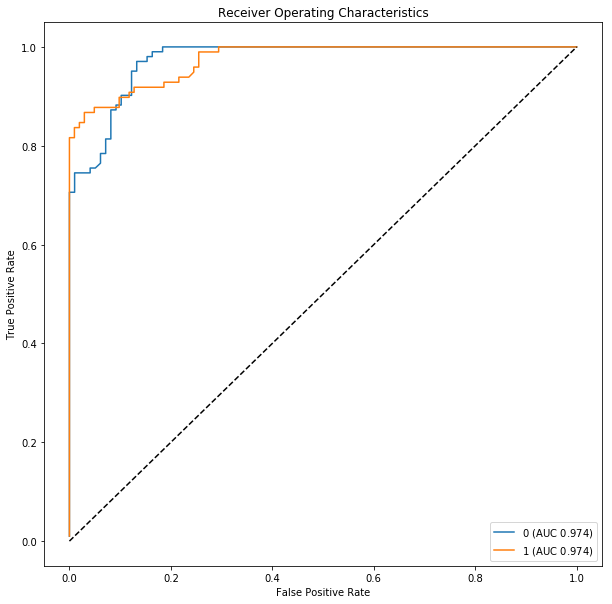

boosting  Regions:


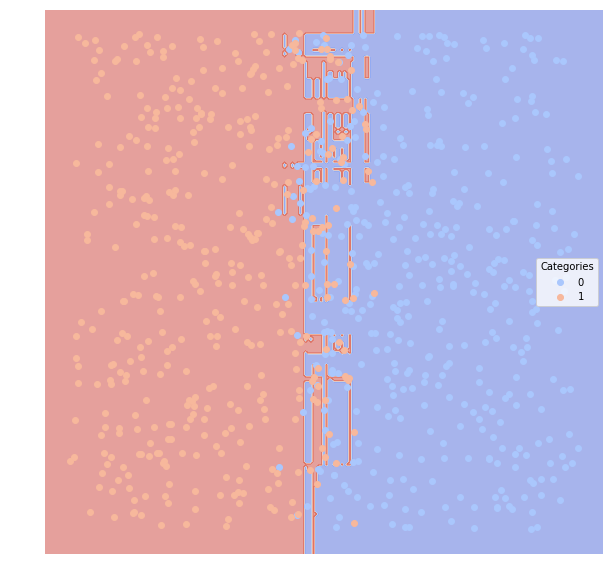

In [20]:
# With noise==0.2
evl1 = run_all_model(dfTrain1, dfTest1)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.613782           0.551254       0.385   0.602151  0.583333
1         0.613782           0.588397       0.385   0.626168  0.644231
bayes  Confusion Matrix:


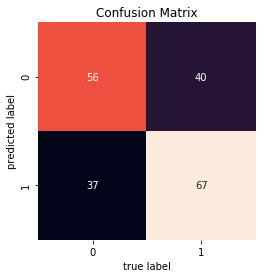

bayes  ROC:


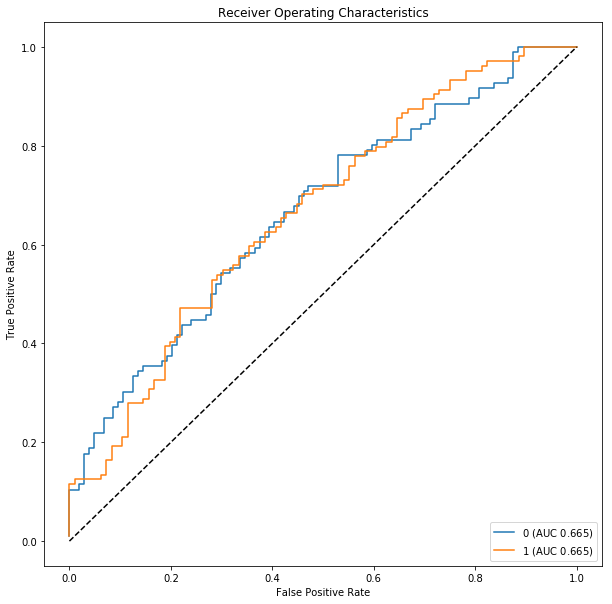

bayes  Regions:


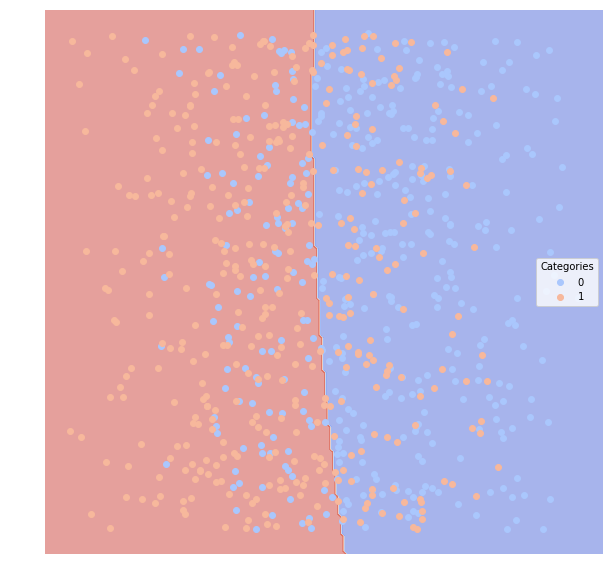

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.613782           0.551254       0.385   0.602151  0.583333
1         0.613782           0.588397       0.385   0.626168  0.644231
svm_linear  Confusion Matrix:


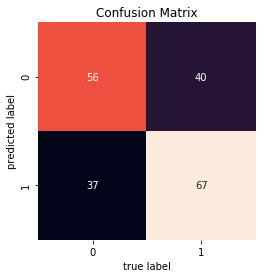

svm_linear  ROC:


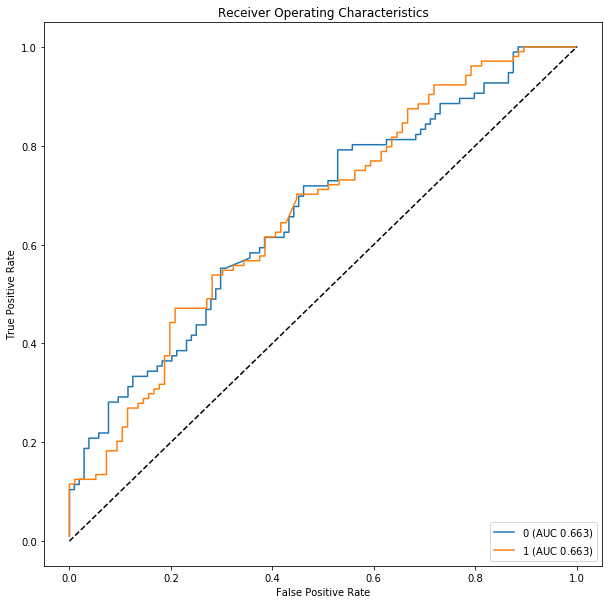

svm_linear  Regions:


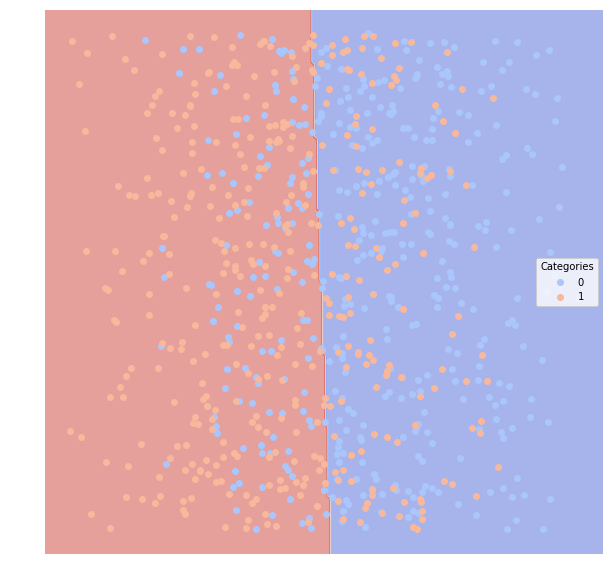

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.635817           0.566396       0.365   0.611650  0.656250
1         0.635817           0.606027       0.365   0.659794  0.615385
svm_poly  Confusion Matrix:


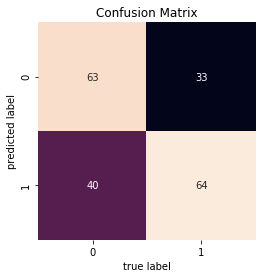

svm_poly  ROC:


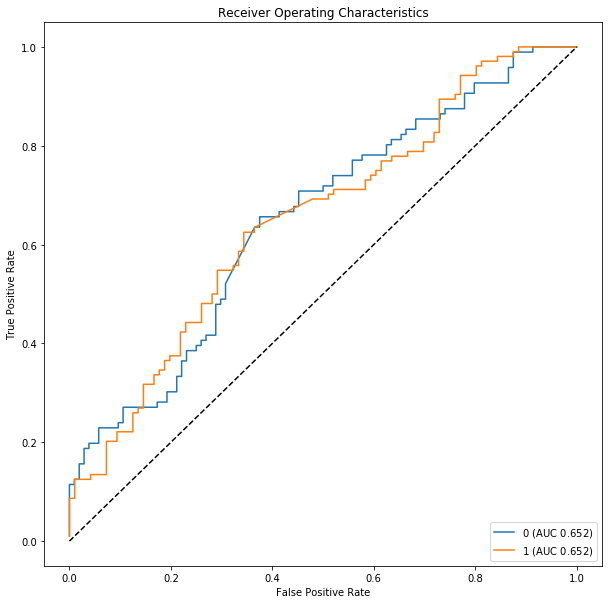

svm_poly  Regions:


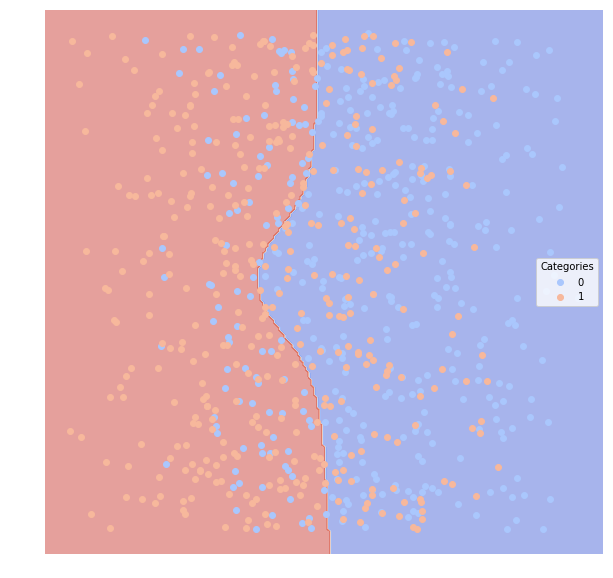

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.593349           0.536543       0.405   0.582418  0.552083
1         0.593349           0.574263       0.405   0.605505  0.634615
knn  Confusion Matrix:


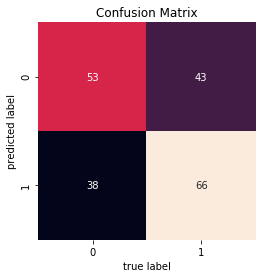

knn  ROC:


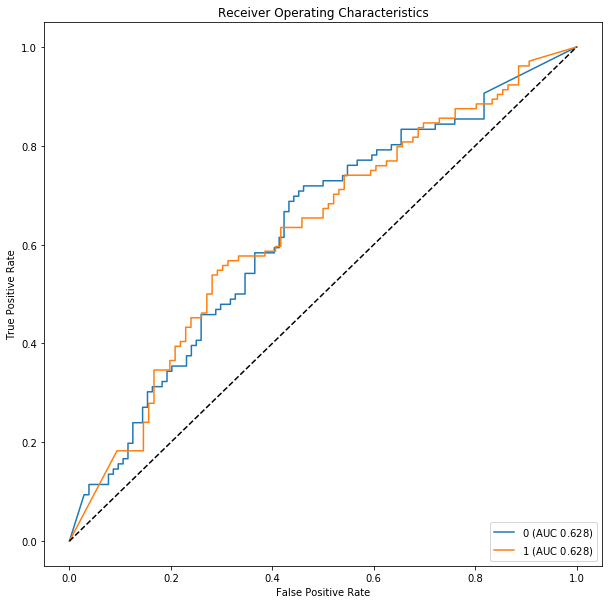

knn  Regions:


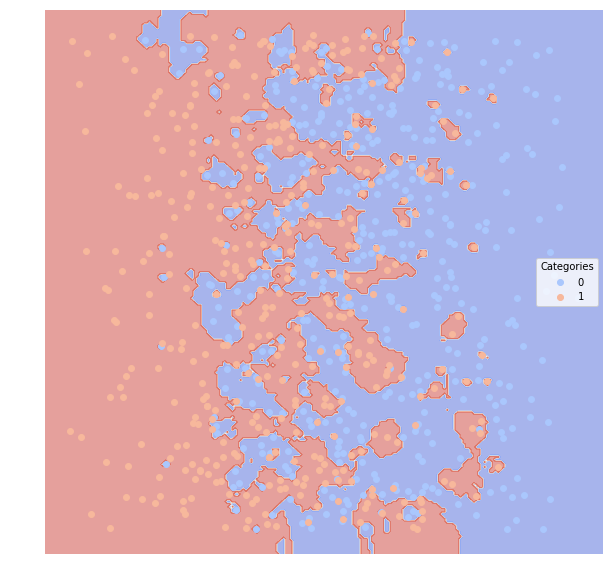

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.623397           0.558974       0.375   0.615385  0.583333
1         0.623397           0.594989       0.375   0.633028  0.663462
classical_reg  Confusion Matrix:


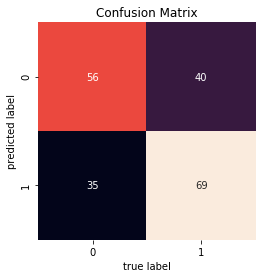

classical_reg  ROC:


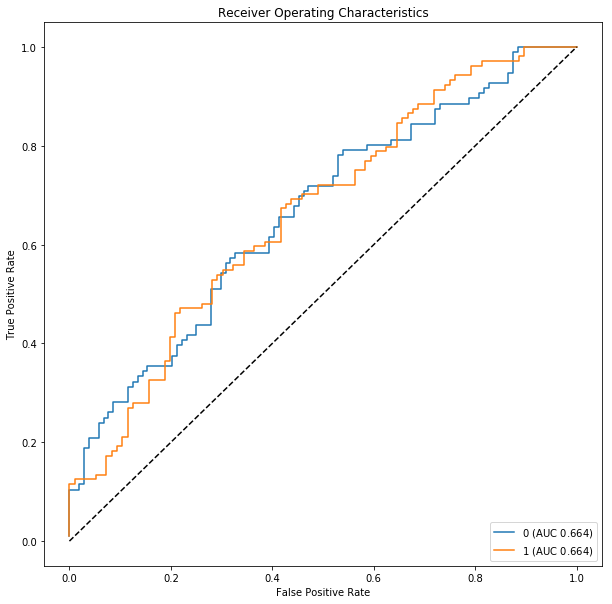

classical_reg  Regions:


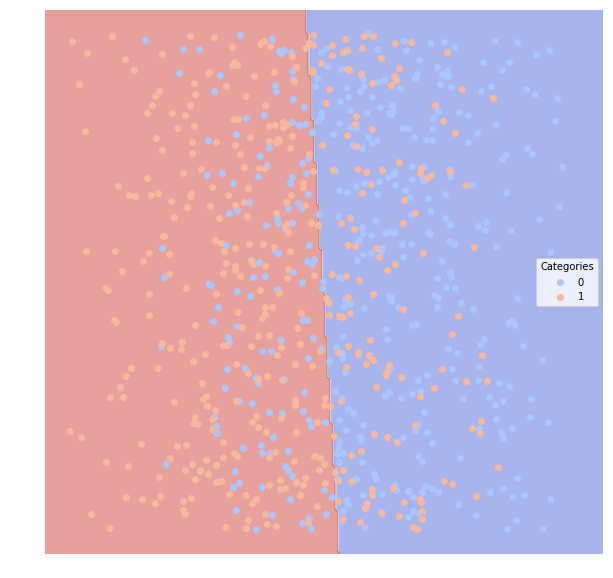

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.561699           0.515562       0.435   0.554217  0.479167
1         0.561699           0.553918       0.435   0.572650  0.644231
decision_tree  Confusion Matrix:


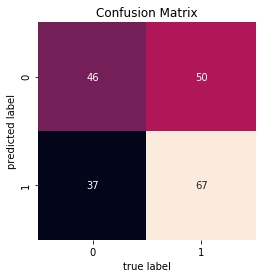

decision_tree  ROC:


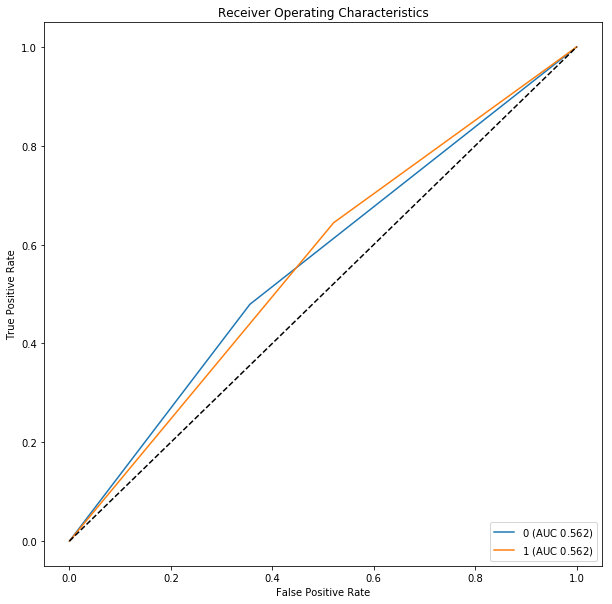

decision_tree  Regions:


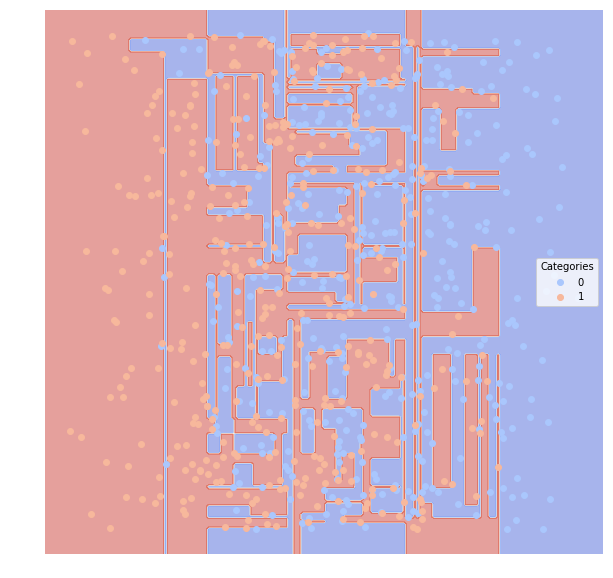

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.601362           0.540664         0.4   0.575472  0.635417
1         0.601362           0.581076         0.4   0.627660  0.567308
random_forest  Confusion Matrix:


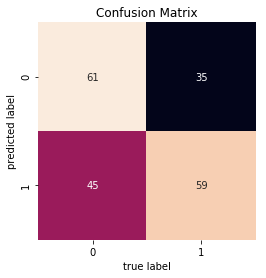

random_forest  ROC:


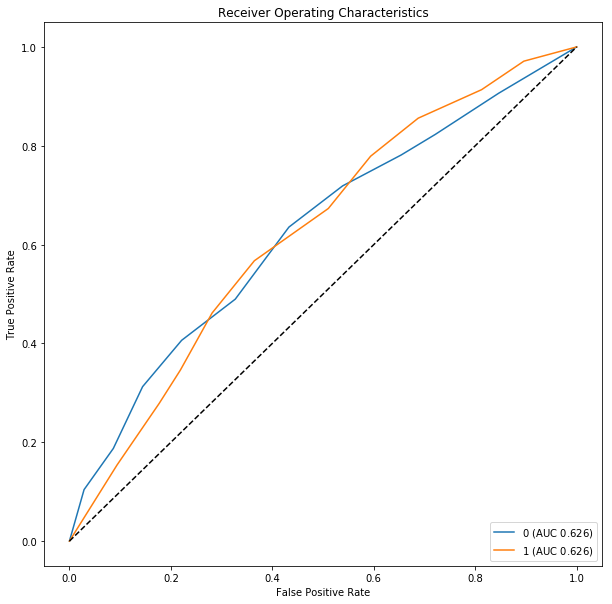

random_forest  Regions:


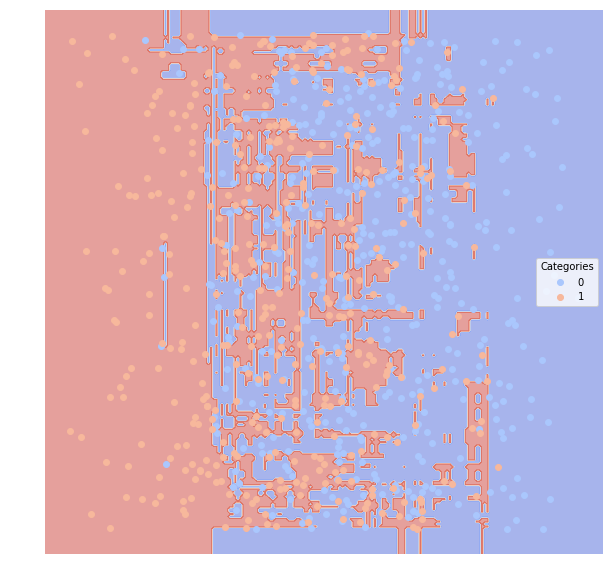

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.613381           0.551268       0.385   0.604396  0.572917
1         0.613381           0.587904       0.385   0.623853  0.653846
neural_network  Confusion Matrix:


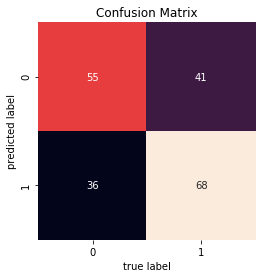

neural_network  ROC:


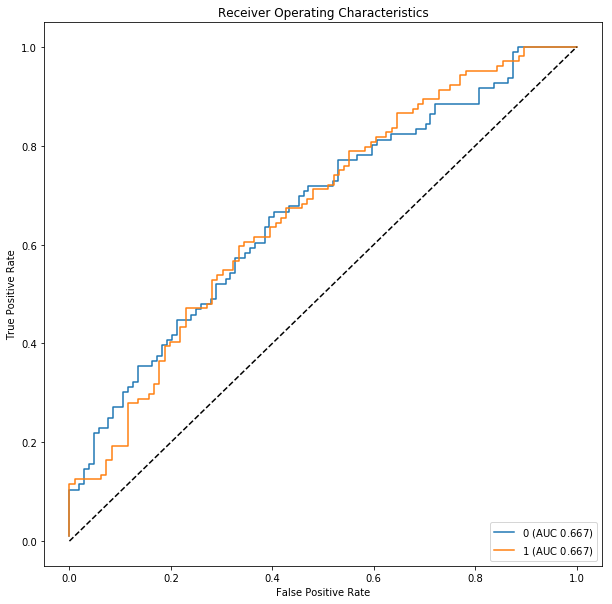

neural_network  Regions:


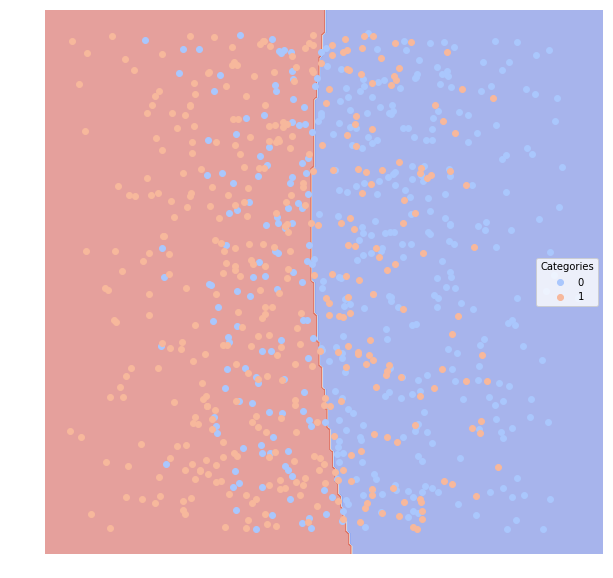

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.629407           0.562713        0.37   0.614583  0.614583
1         0.629407           0.600033        0.37   0.644231  0.644231
boosting  Confusion Matrix:


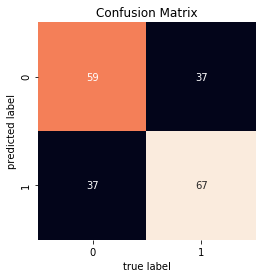

boosting  ROC:


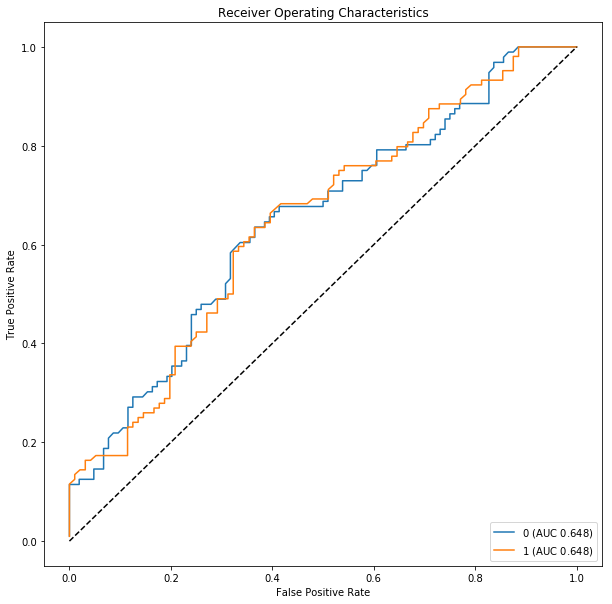

boosting  Regions:


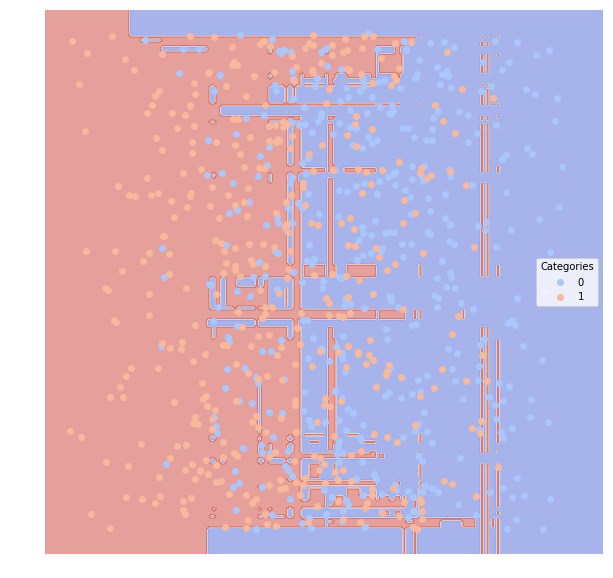

In [21]:
# With noise==0.7
evl6 = run_all_model(dfTrain6, dfTest6)

### xorSplit Datasets

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.553198           0.545047        0.45   0.582278  0.446602
1         0.553198           0.513982        0.45   0.528926  0.659794
bayes  Confusion Matrix:


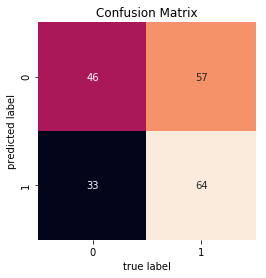

bayes  ROC:


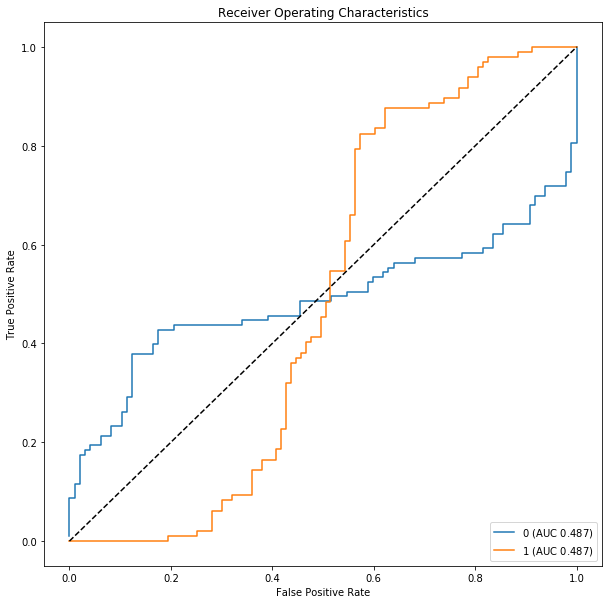

bayes  Regions:


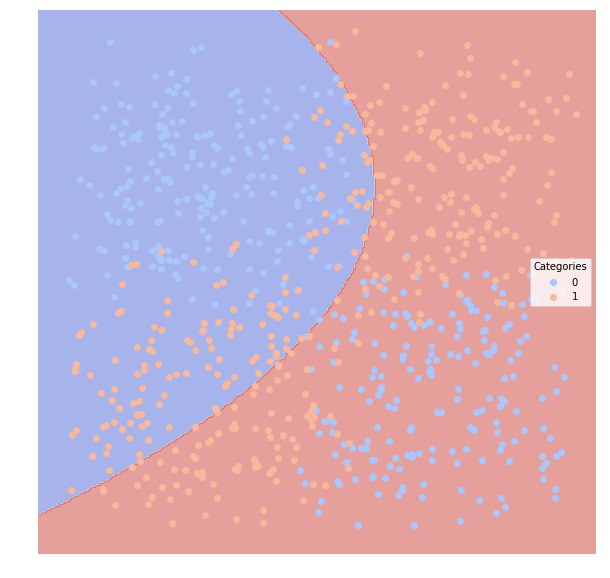

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.616555           0.596323        0.39   0.719298  0.398058
1         0.616555           0.553001        0.39   0.566434  0.835052
svm_linear  Confusion Matrix:


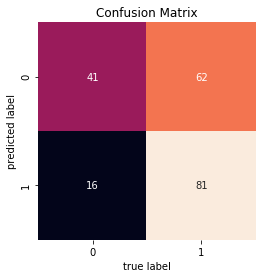

svm_linear  ROC:


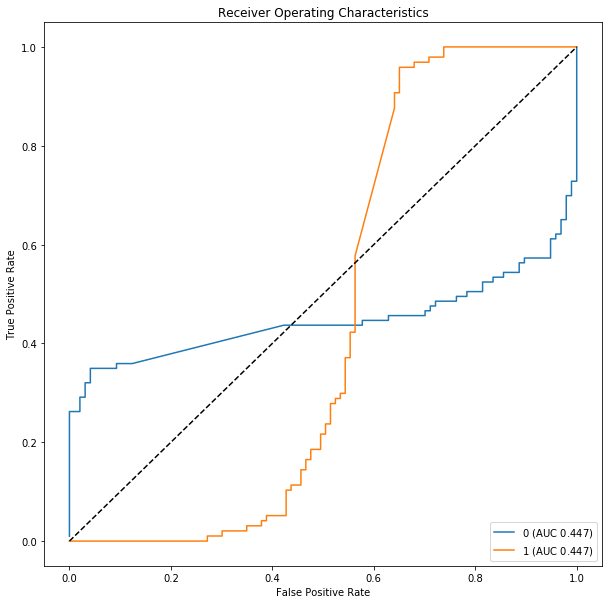

svm_linear  Regions:


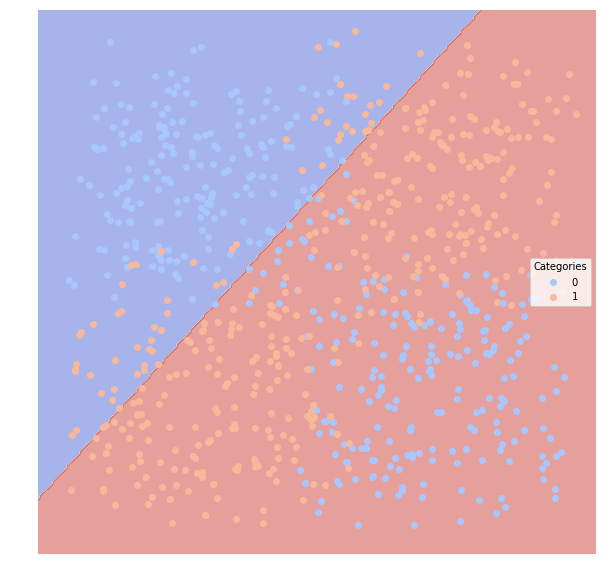

svm_poly  Evaluation:
             AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                            
0         0.6666           0.645416        0.34   0.807018  0.446602
1         0.6666           0.588199        0.34   0.601399  0.886598
svm_poly  Confusion Matrix:


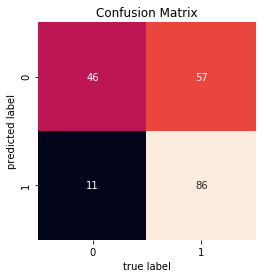

svm_poly  ROC:


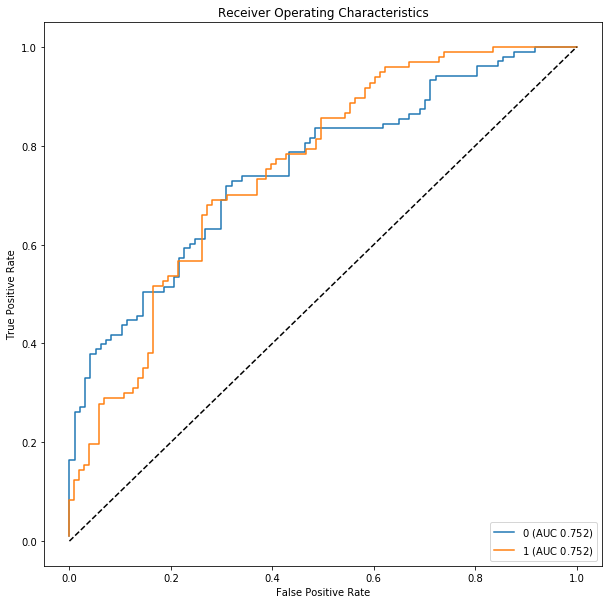

svm_poly  Regions:


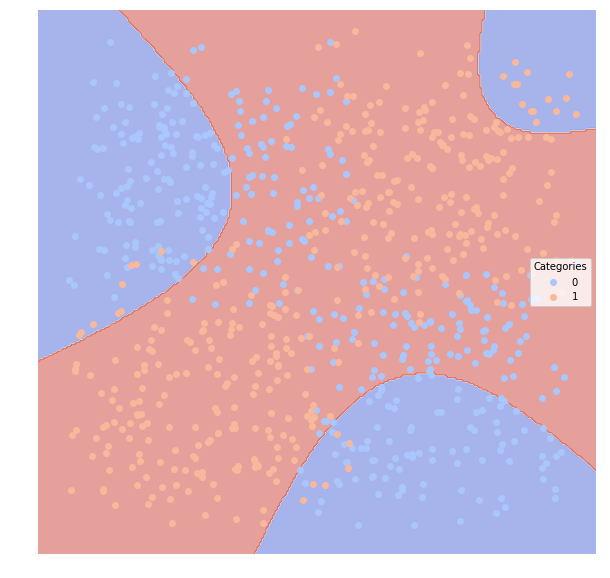

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.873836           0.824876       0.125   0.854545  0.912621
1         0.873836           0.831546       0.125   0.900000  0.835052
knn  Confusion Matrix:


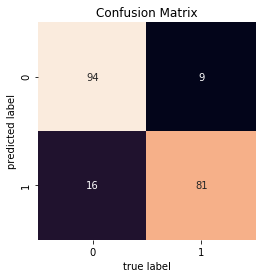

knn  ROC:


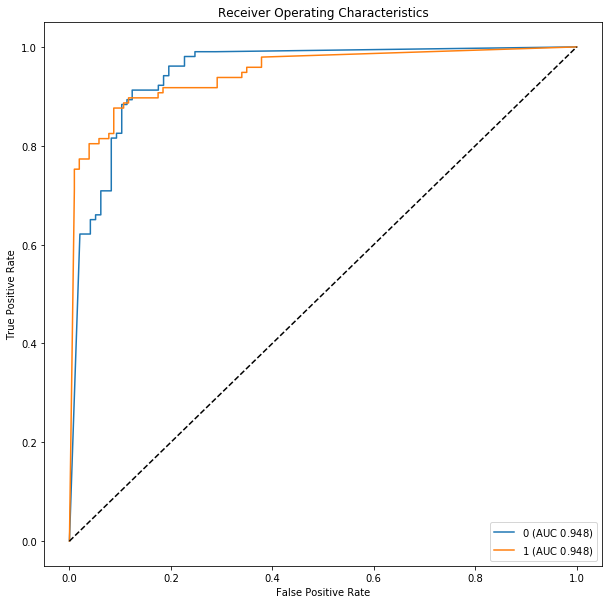

knn  Regions:


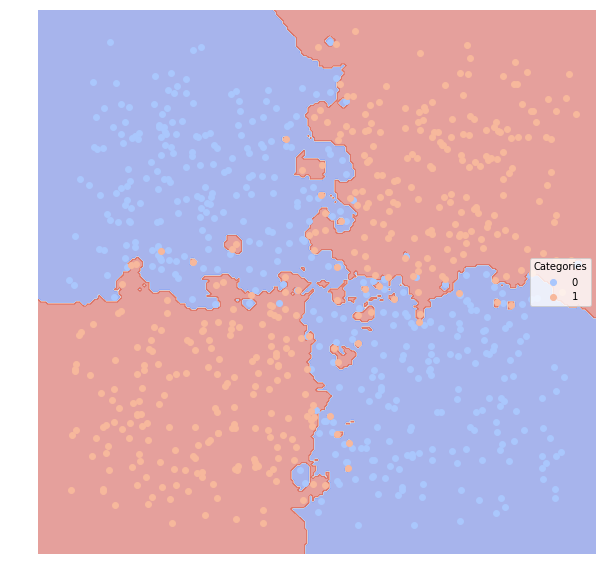

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.548944           0.542587       0.455   0.581081  0.417476
1         0.548944           0.511406       0.455   0.523810  0.680412
classical_reg  Confusion Matrix:


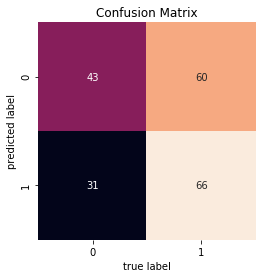

classical_reg  ROC:


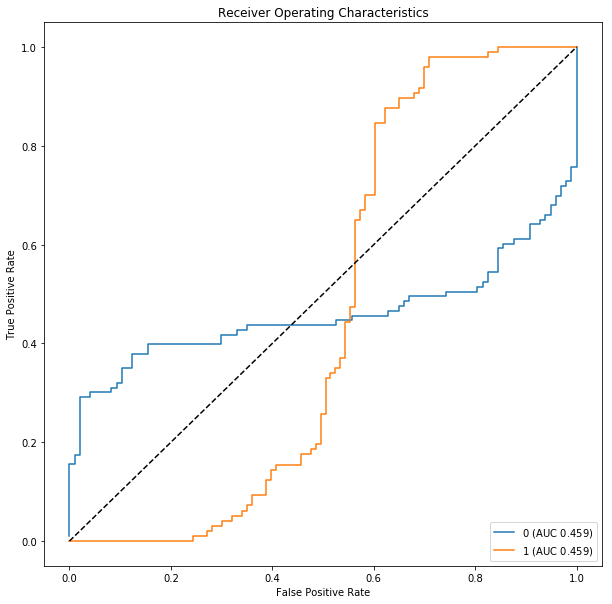

classical_reg  Regions:


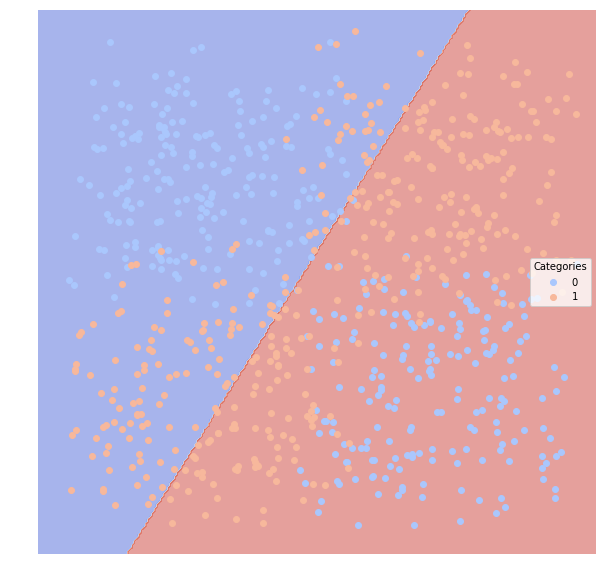

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.879592           0.837617        0.12   0.876190  0.893204
1         0.879592           0.830708        0.12   0.884211  0.865979
decision_tree  Confusion Matrix:


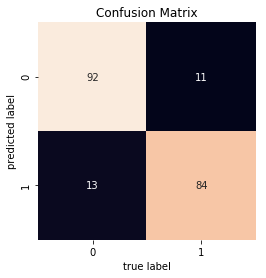

decision_tree  ROC:


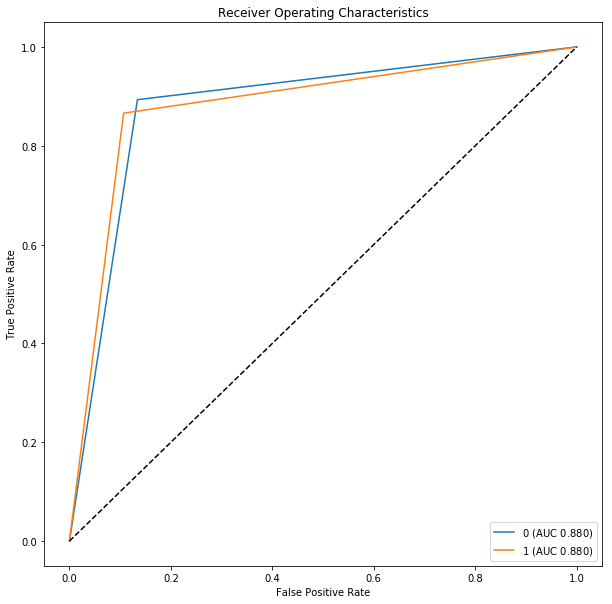

decision_tree  Regions:


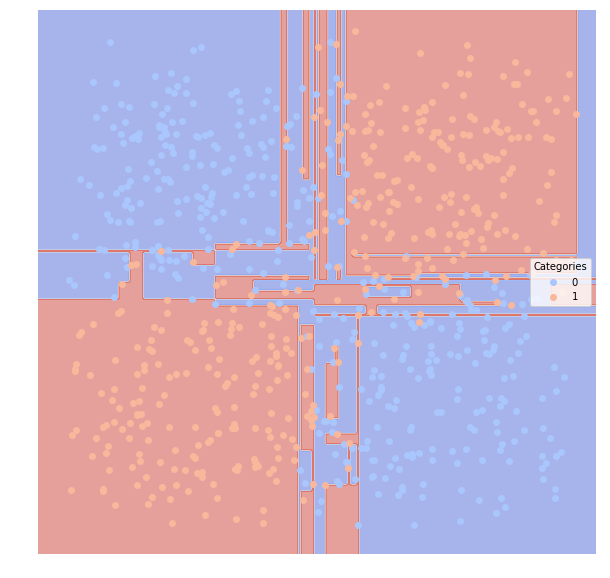

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.893554           0.845621       0.105   0.866071  0.941748
1         0.893554           0.862723       0.105   0.931818  0.845361
random_forest  Confusion Matrix:


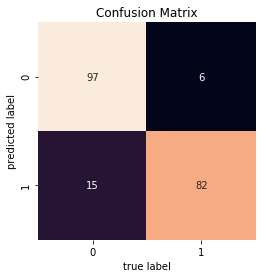

random_forest  ROC:


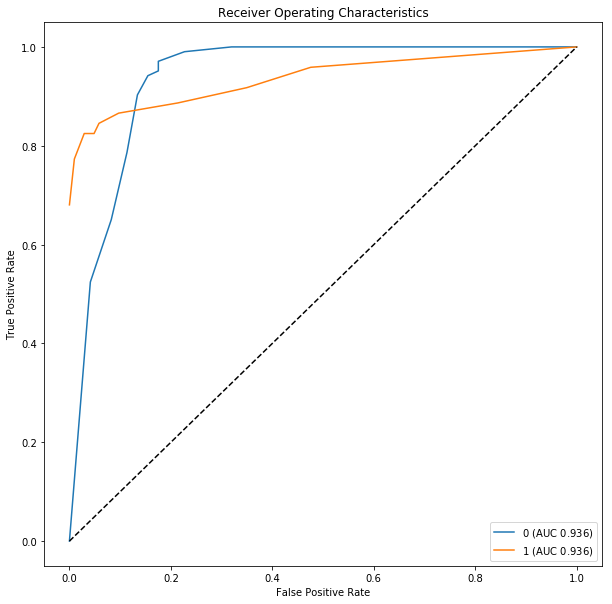

random_forest  Regions:


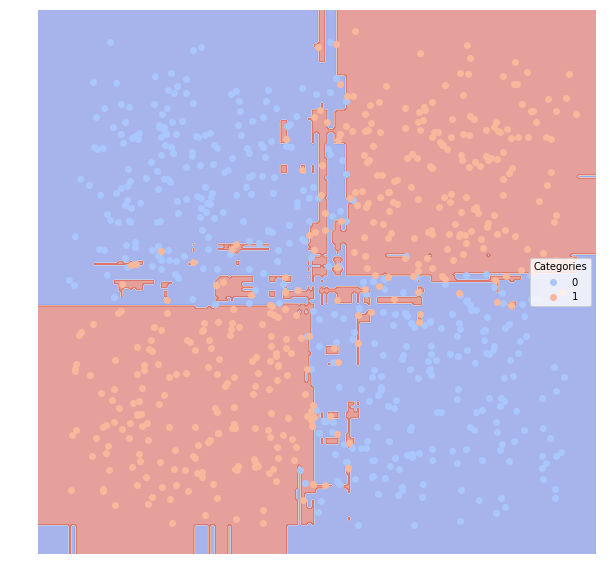

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.894455           0.854306       0.105   0.886792  0.912621
1         0.894455           0.852389       0.105   0.904255  0.876289
neural_network  Confusion Matrix:


/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


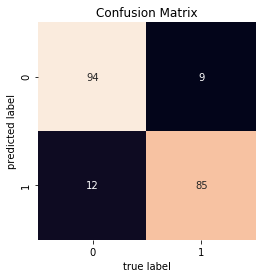

neural_network  ROC:


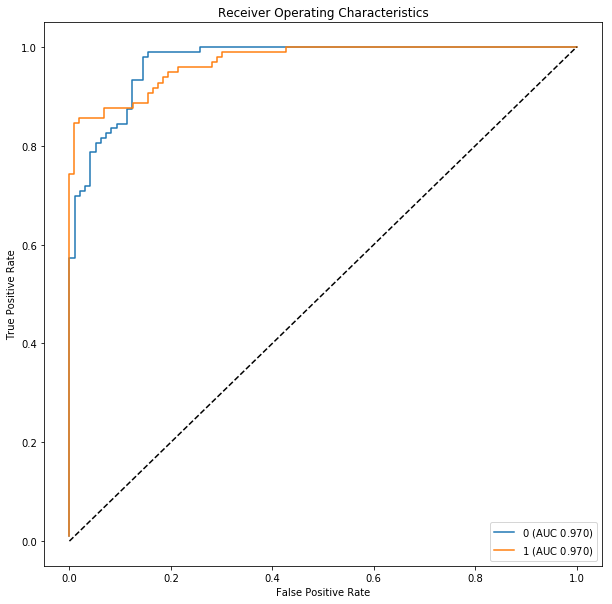

neural_network  Regions:


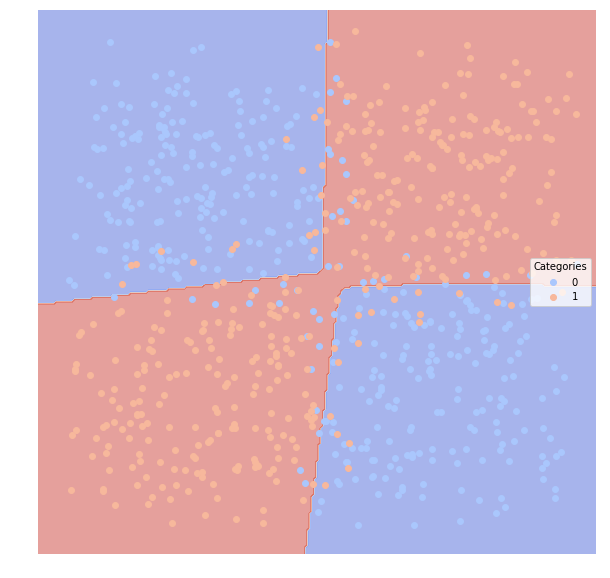

boosting  Evaluation:
             AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                            
0         0.8887           0.841088        0.11   0.864865  0.932039
1         0.8887           0.853872        0.11   0.921348  0.845361
boosting  Confusion Matrix:


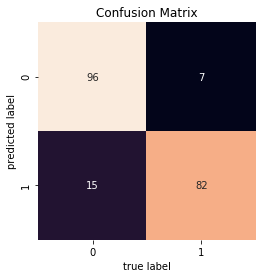

boosting  ROC:


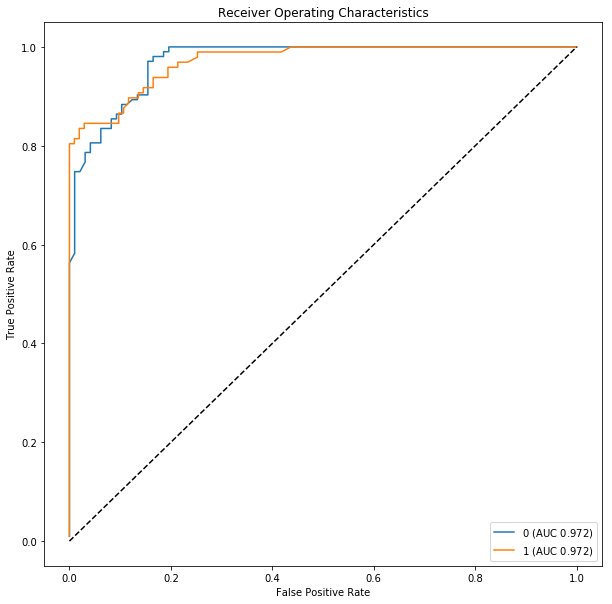

boosting  Regions:


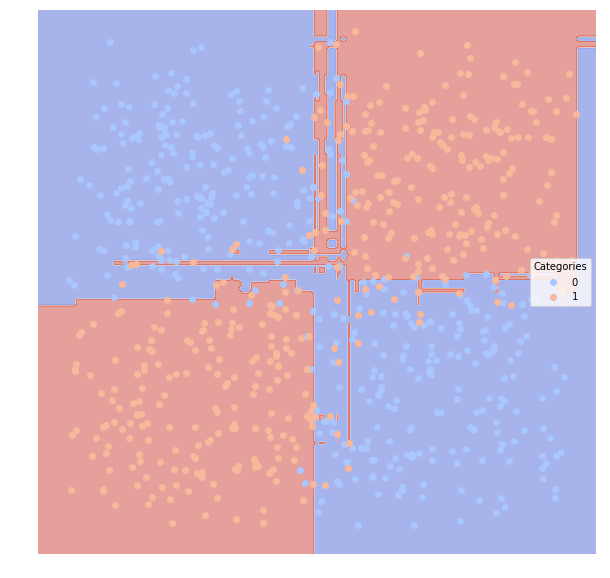

In [22]:
# With noise==0.2
evl2 = run_all_model(dfTrain2, dfTest2)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.548073           0.557747       0.465   0.614035  0.330189
1         0.548073           0.495657       0.465   0.503497  0.765957
bayes  Confusion Matrix:


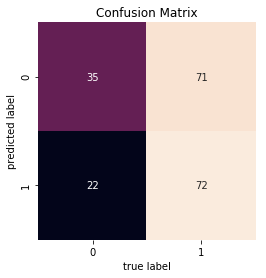

bayes  ROC:


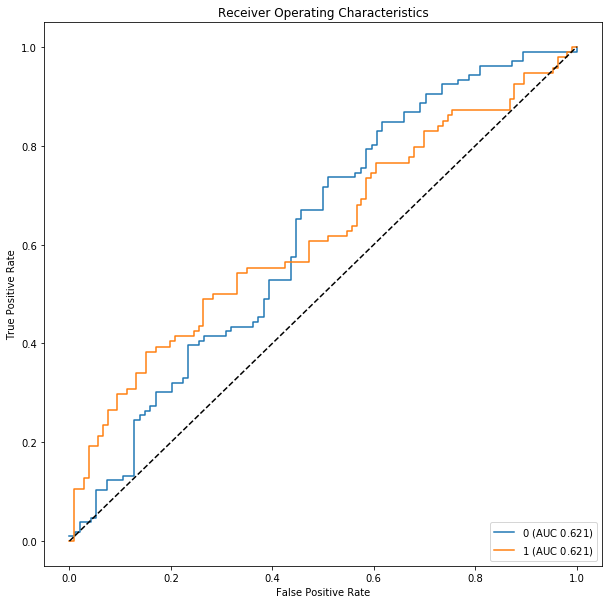

bayes  Regions:


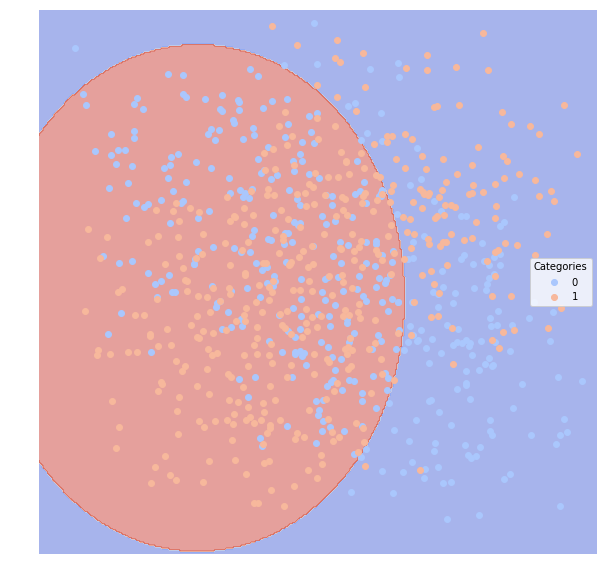

svm_linear  Evaluation:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.55269           0.559717       0.455      0.600  0.424528
1         0.55269           0.498596       0.455      0.512  0.680851
svm_linear  Confusion Matrix:


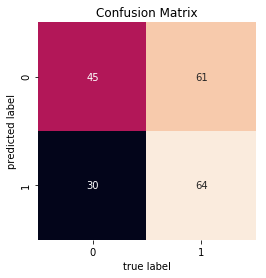

svm_linear  ROC:


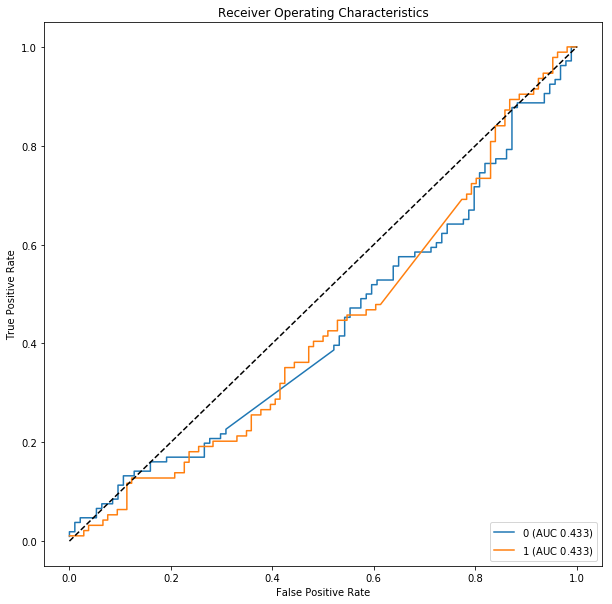

svm_linear  Regions:


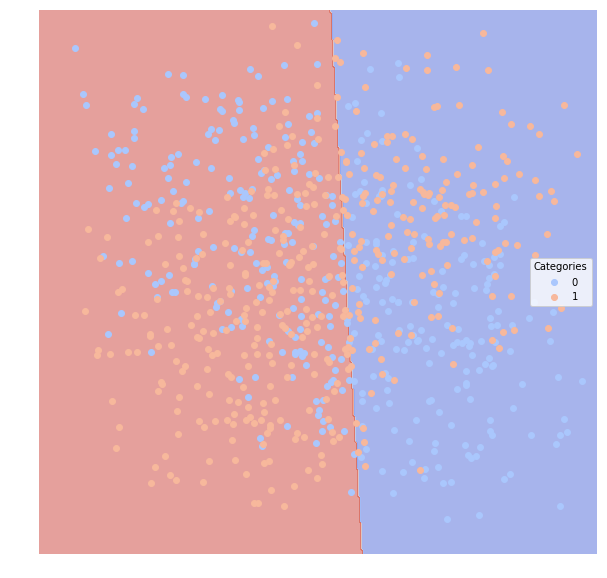

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.689181           0.685197       0.325   0.872727  0.452830
1         0.689181           0.590319       0.325   0.600000  0.925532
svm_poly  Confusion Matrix:


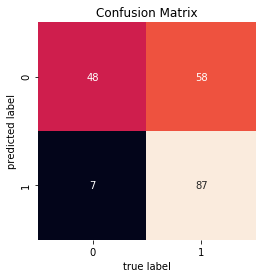

svm_poly  ROC:


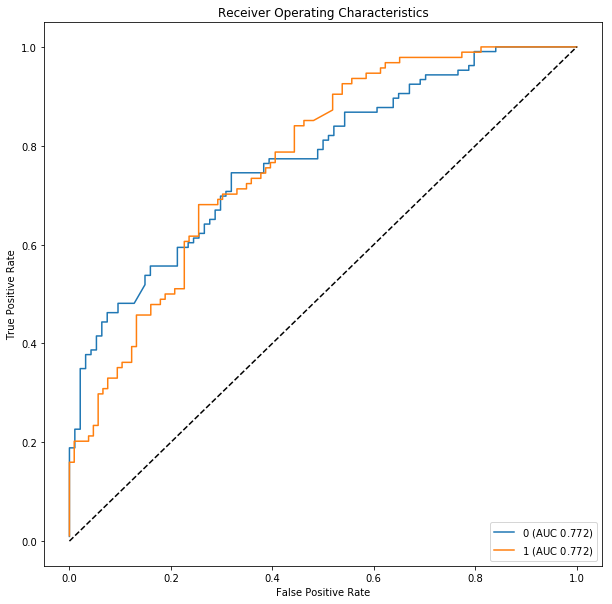

svm_poly  Regions:


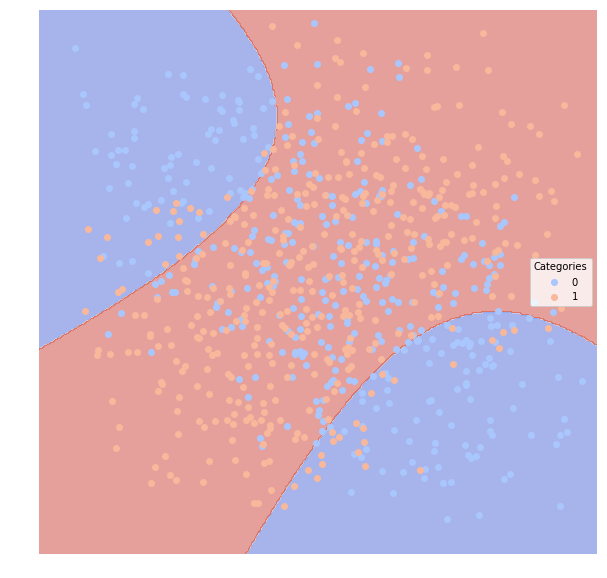

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.592132           0.584358        0.41   0.627660  0.556604
1         0.592132           0.524358        0.41   0.556604  0.627660
knn  Confusion Matrix:


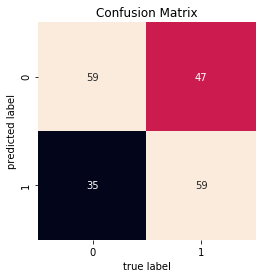

knn  ROC:


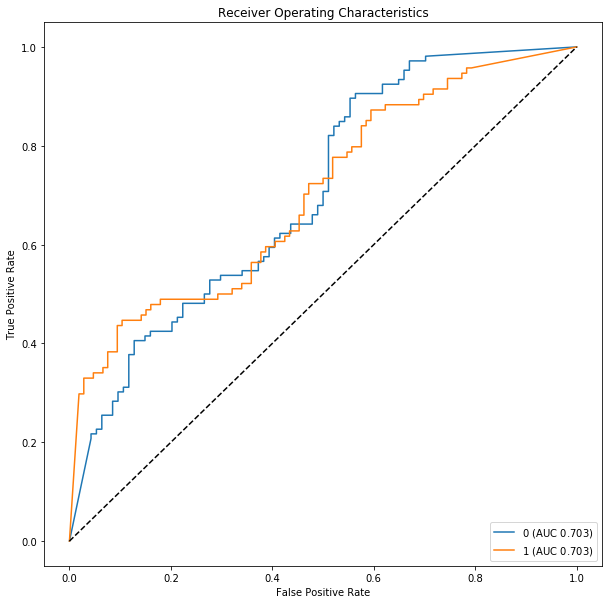

knn  Regions:


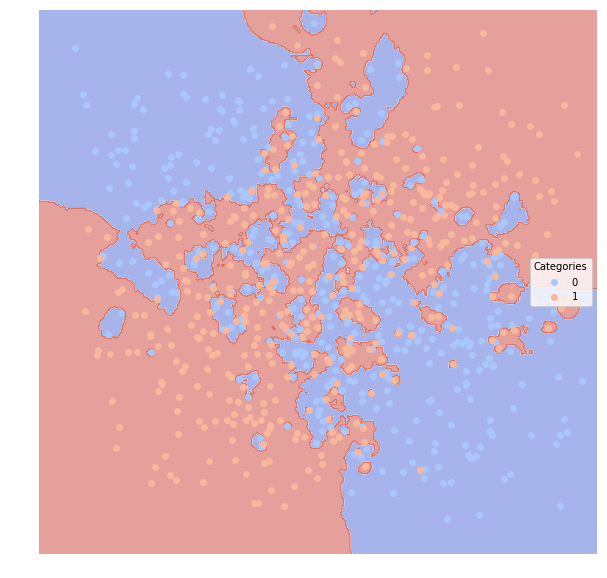

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.553894           0.560682       0.455   0.605634  0.405660
1         0.553894           0.499228       0.455   0.511628  0.702128
classical_reg  Confusion Matrix:


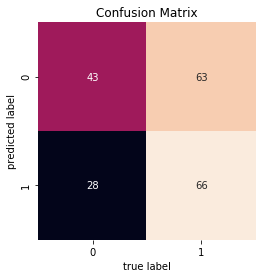

classical_reg  ROC:


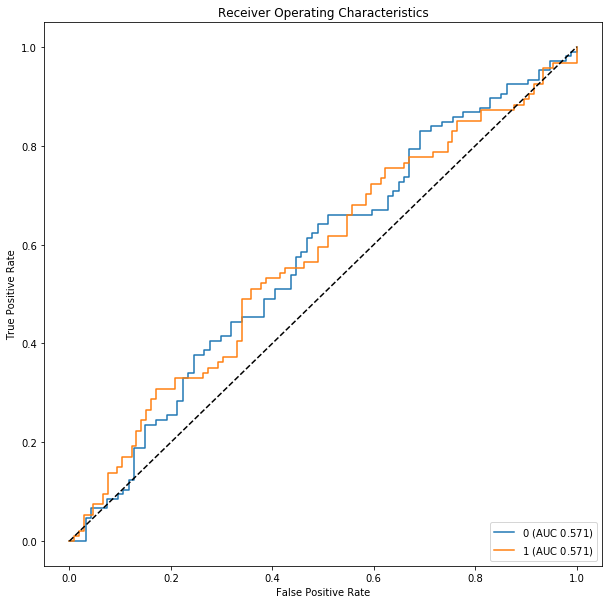

classical_reg  Regions:


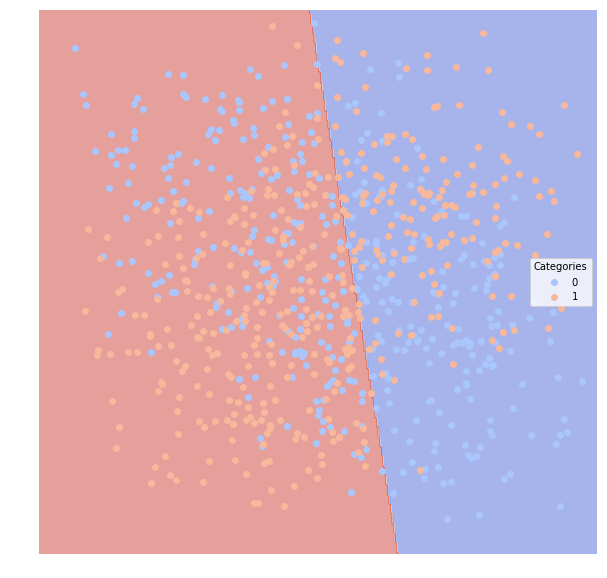

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.613408           0.599885        0.39   0.655556  0.556604
1         0.613408           0.538849        0.39   0.572727  0.670213
decision_tree  Confusion Matrix:


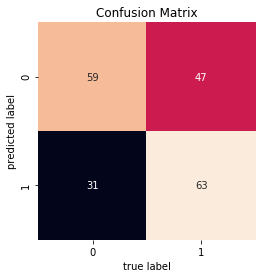

decision_tree  ROC:


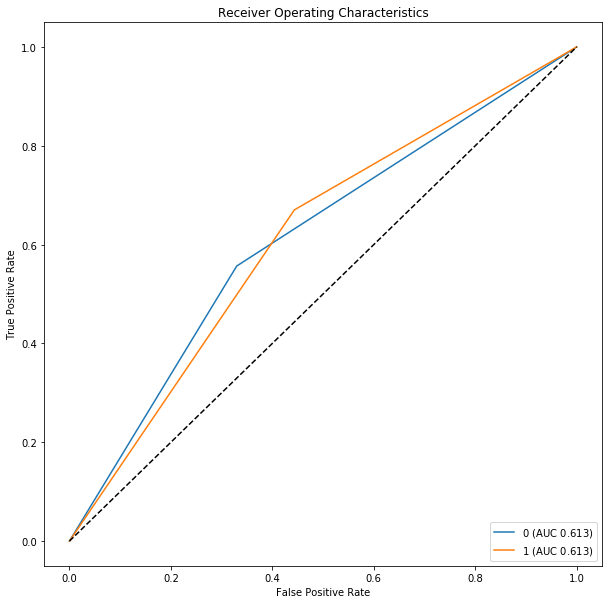

decision_tree  Regions:


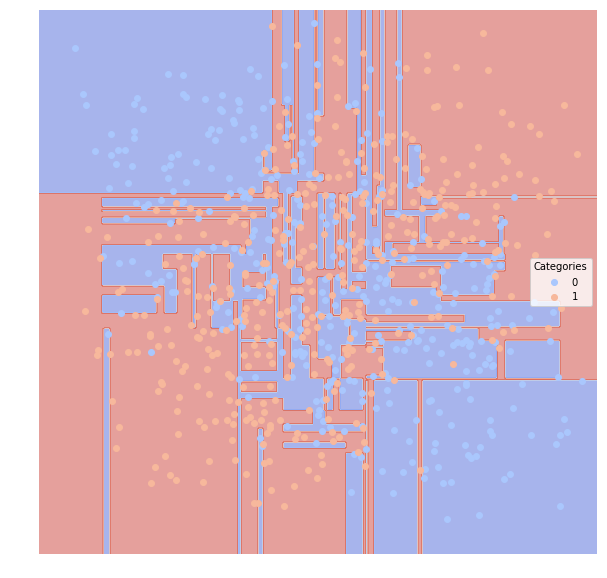

random_forest  Evaluation:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.67774           0.650366       0.325   0.720430  0.632075
1         0.67774           0.589734       0.325   0.635514  0.723404
random_forest  Confusion Matrix:


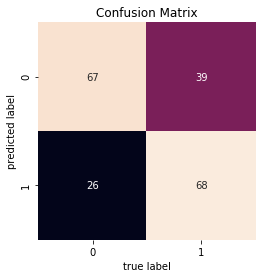

random_forest  ROC:


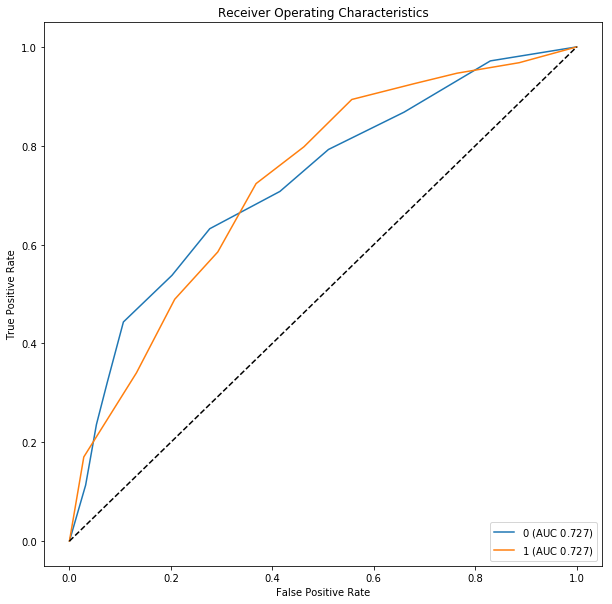

random_forest  Regions:


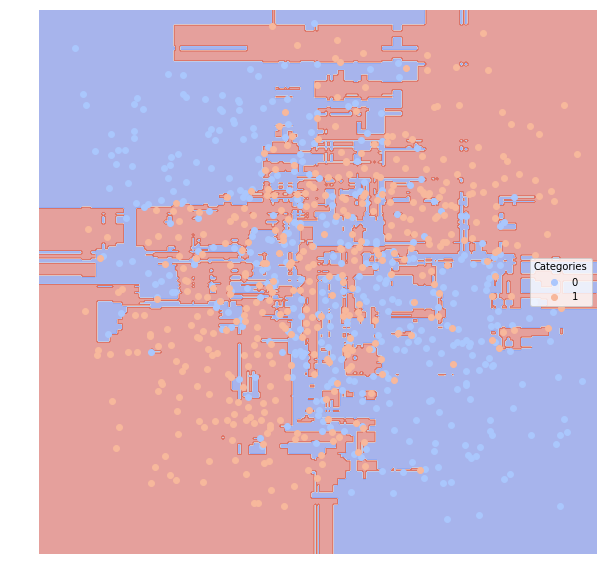

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.682457           0.654071        0.32   0.723404  0.641509
1         0.682457           0.594071        0.32   0.641509  0.723404
neural_network  Confusion Matrix:


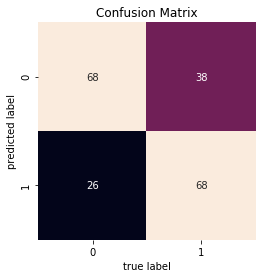

neural_network  ROC:


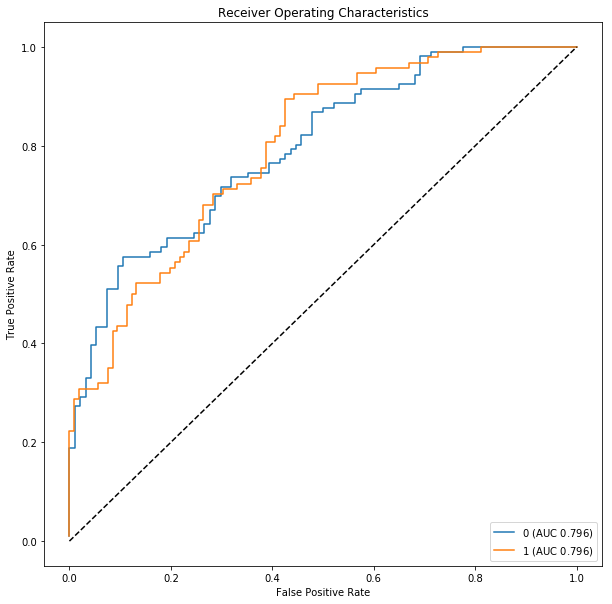

neural_network  Regions:


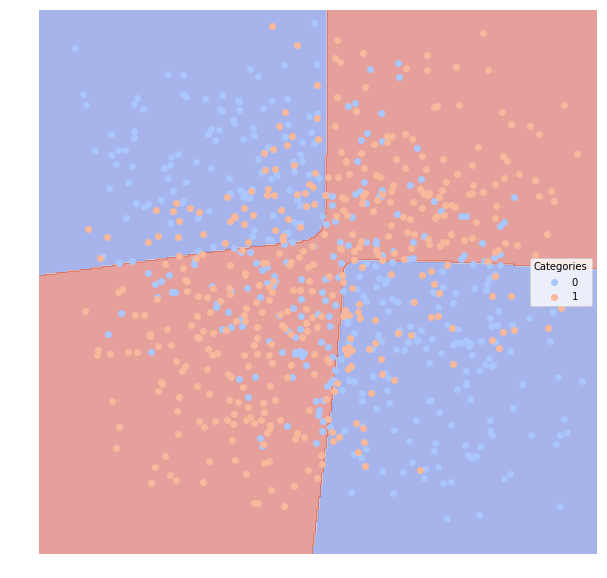

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.668306           0.643005       0.335   0.714286  0.613208
1         0.668306           0.581298       0.335   0.623853  0.723404
boosting  Confusion Matrix:


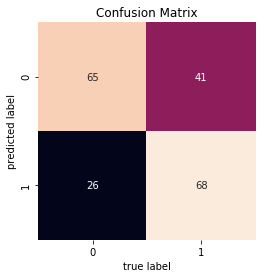

boosting  ROC:


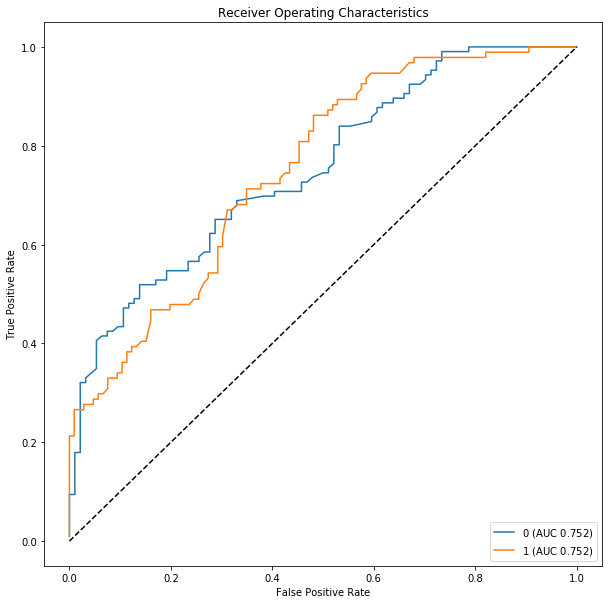

boosting  Regions:


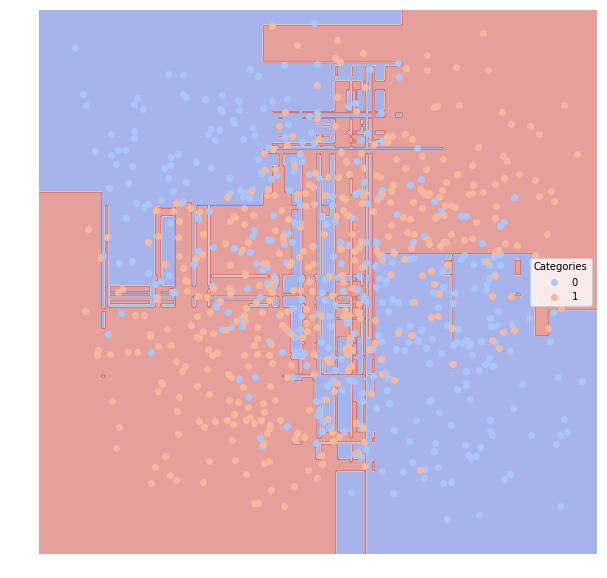

In [23]:
# With noise==0.7
evl7 = run_all_model(dfTrain7, dfTest7)

### targetSplit Datasets

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.918401           0.862607        0.08   0.906977  0.906977
1         0.918401           0.904574        0.08   0.929825  0.929825
bayes  Confusion Matrix:


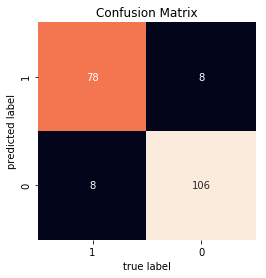

bayes  ROC:


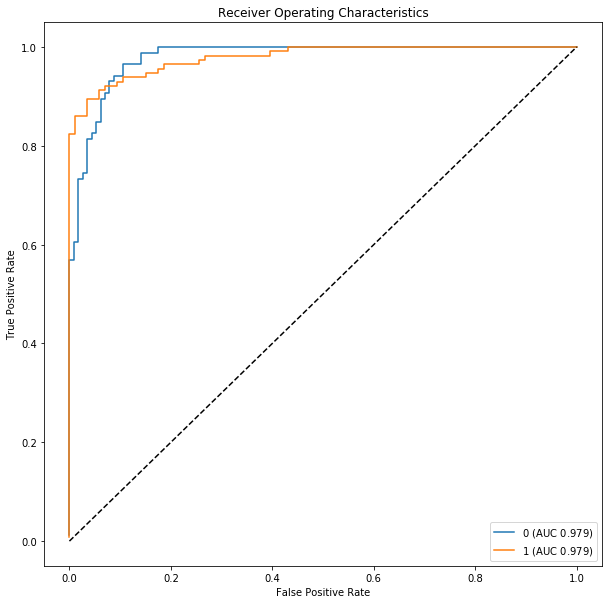

bayes  Regions:


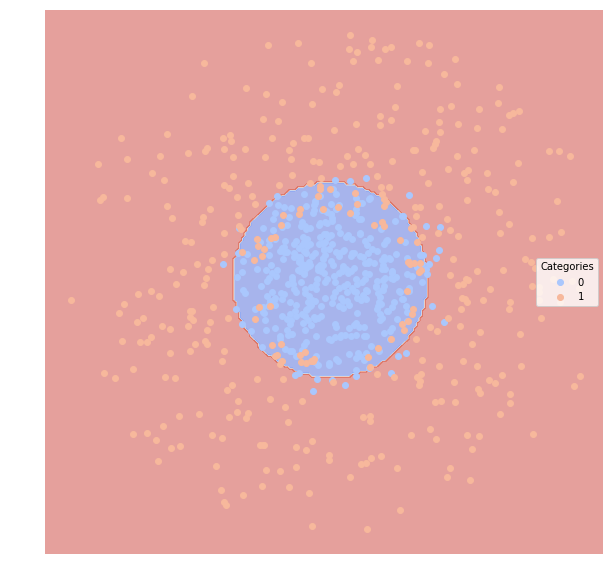

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.630151           0.505069        0.42   0.505952  0.988372
1         0.630151           0.678432        0.42   0.968750  0.271930
svm_linear  Confusion Matrix:


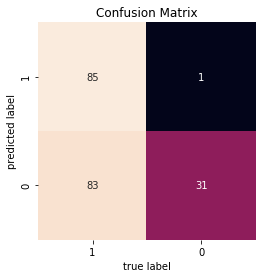

svm_linear  ROC:


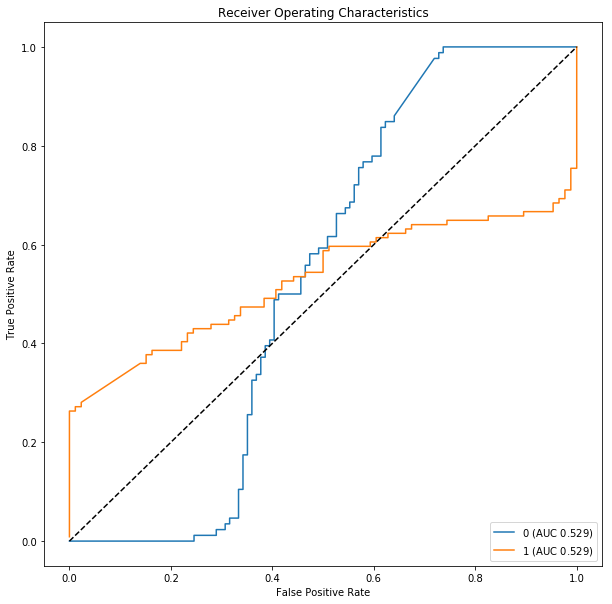

svm_linear  Regions:


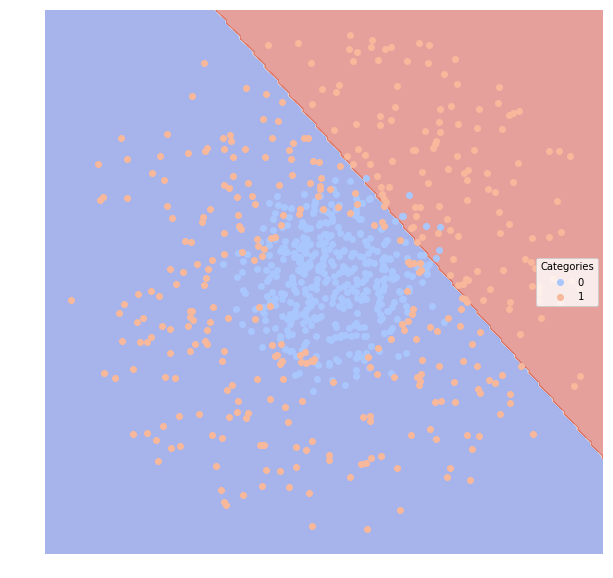

svm_poly  Evaluation:
          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
0         0.5               0.43        0.57       0.43     1.0
1         0.5               0.57        0.57       0.00     0.0
svm_poly  Confusion Matrix:


/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


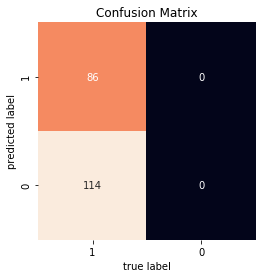

svm_poly  ROC:


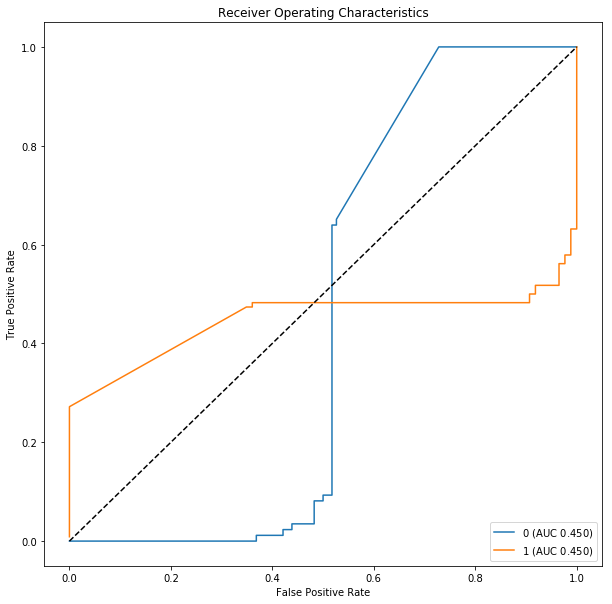

svm_poly  Regions:


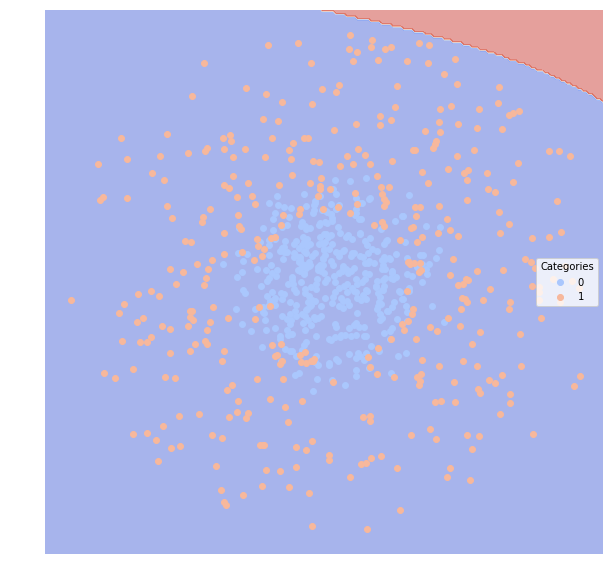

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.867401           0.785525        0.13   0.848837  0.848837
1         0.867401           0.849934        0.13   0.885965  0.885965
knn  Confusion Matrix:


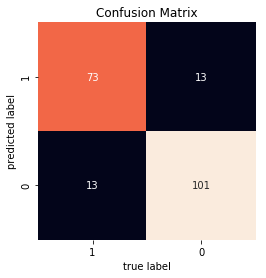

knn  ROC:


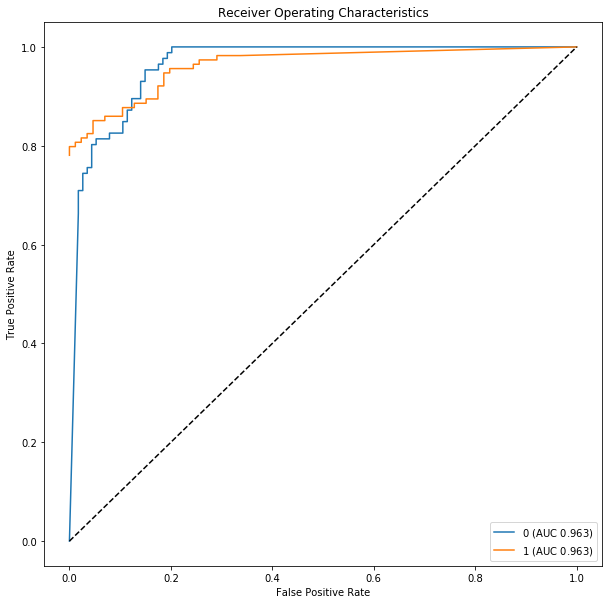

knn  Regions:


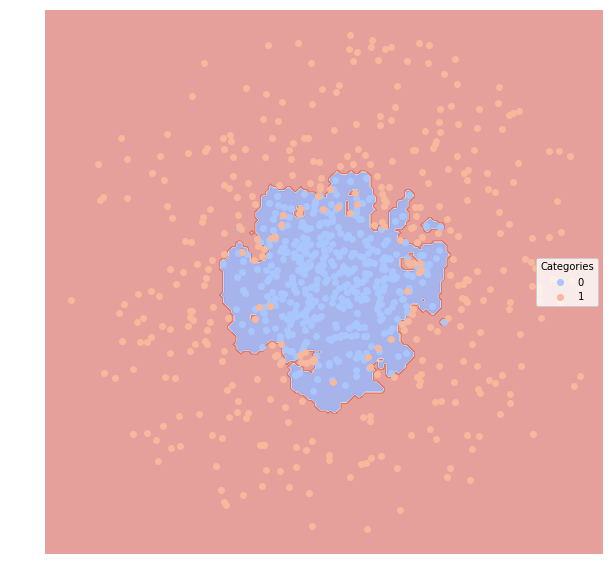

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.617299           0.497752        0.42   0.506667  0.883721
1         0.617299           0.650702        0.42   0.800000  0.350877
classical_reg  Confusion Matrix:


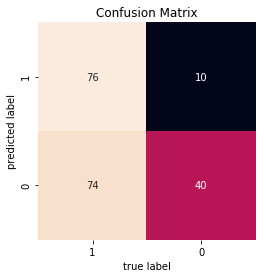

classical_reg  ROC:


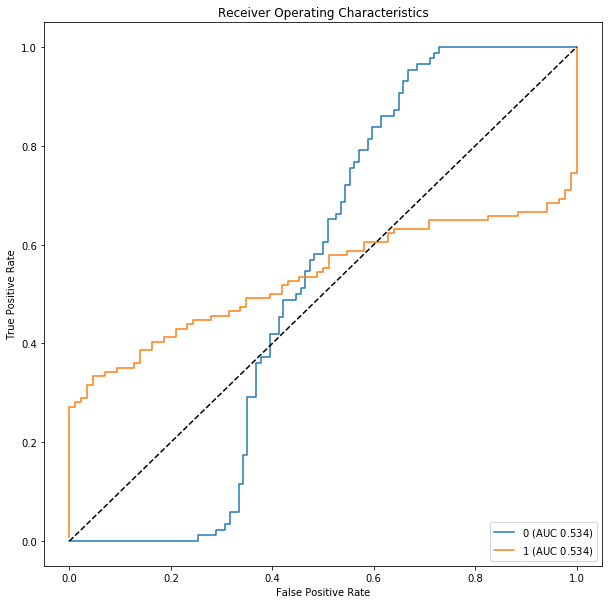

classical_reg  Regions:


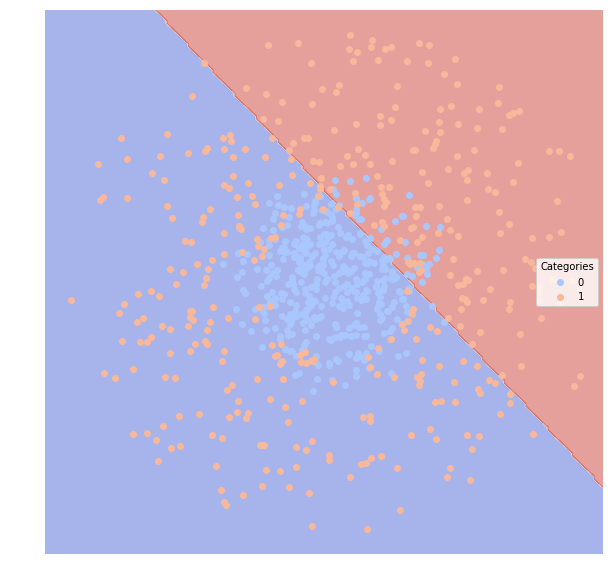

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.864443           0.775443       0.135   0.831461  0.860465
1         0.864443           0.849538       0.135   0.891892  0.868421
decision_tree  Confusion Matrix:


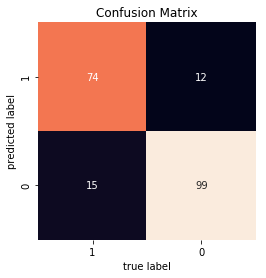

decision_tree  ROC:


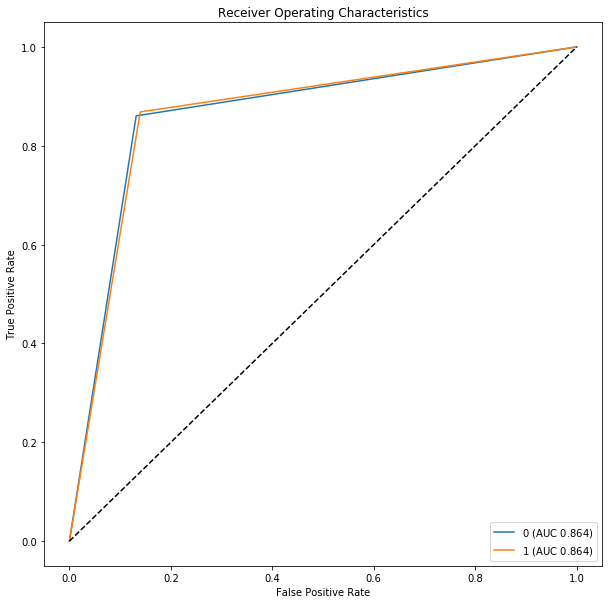

decision_tree  Regions:


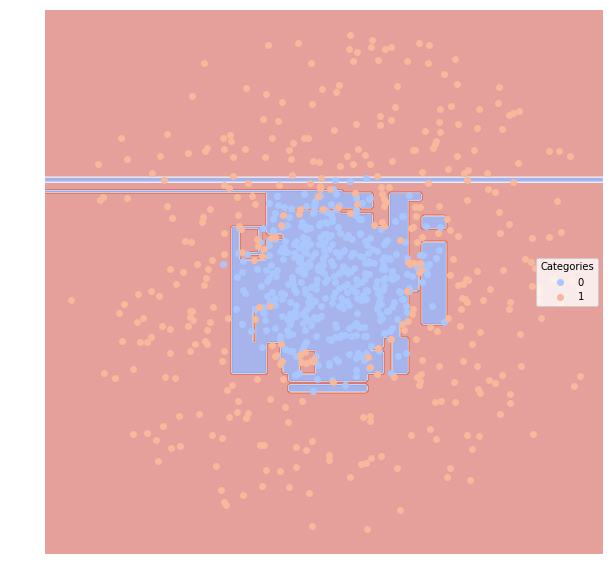

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.887801           0.815546        0.11   0.872093  0.872093
1         0.887801           0.871328        0.11   0.903509  0.903509
random_forest  Confusion Matrix:


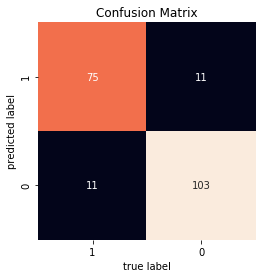

random_forest  ROC:


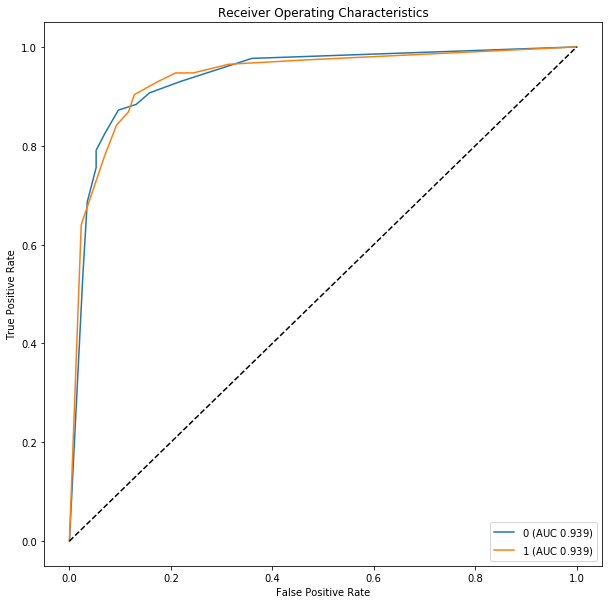

random_forest  Regions:


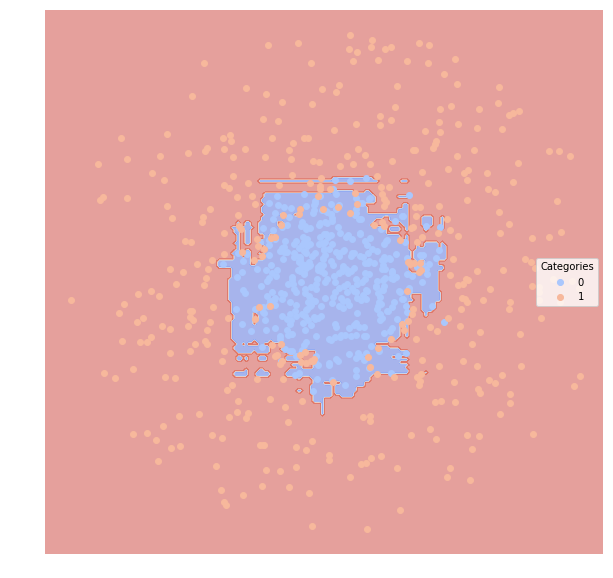

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.913913           0.836603        0.09   0.861702  0.941860
1         0.913913           0.909174        0.09   0.952830  0.885965
neural_network  Confusion Matrix:


/anaconda3/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


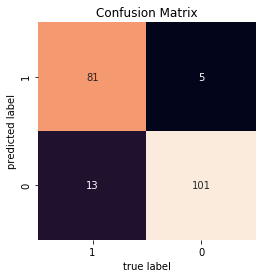

neural_network  ROC:


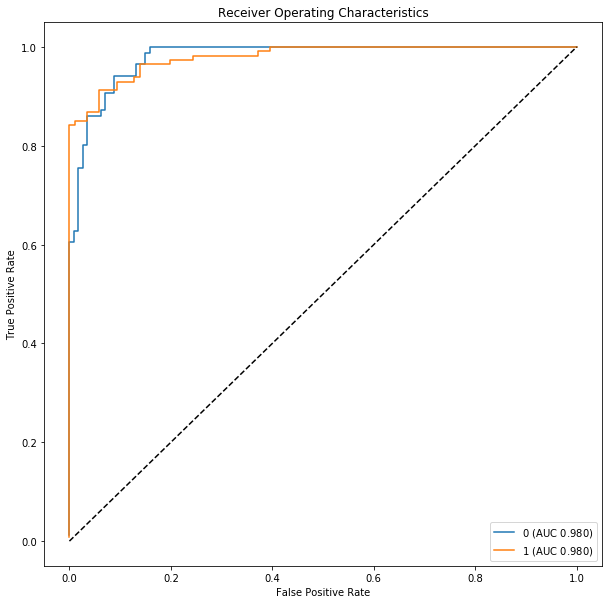

neural_network  Regions:


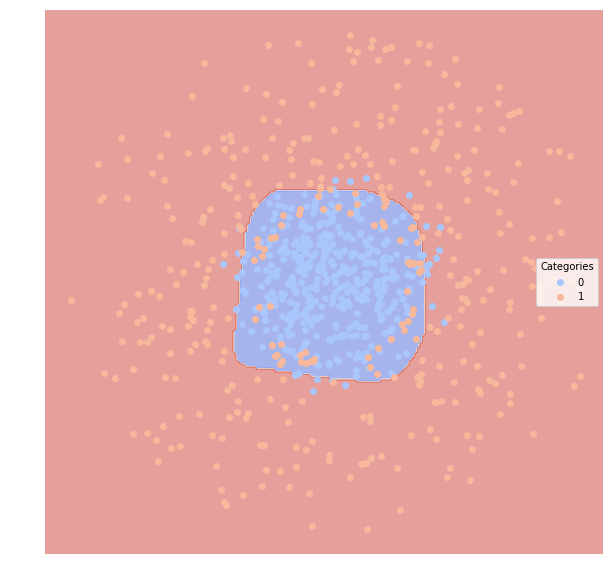

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.899429           0.828430         0.1   0.875000  0.895349
1         0.899429           0.885905         0.1   0.919643  0.903509
boosting  Confusion Matrix:


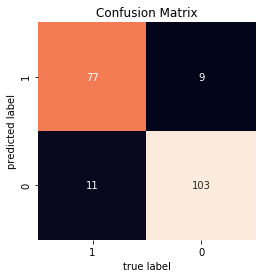

boosting  ROC:


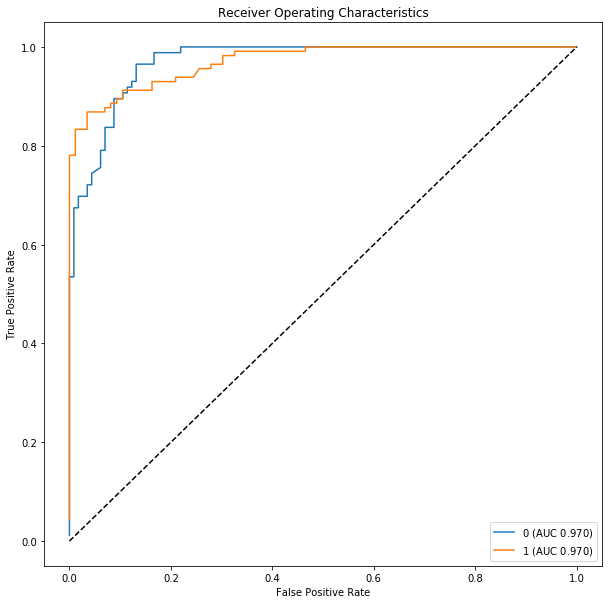

boosting  Regions:


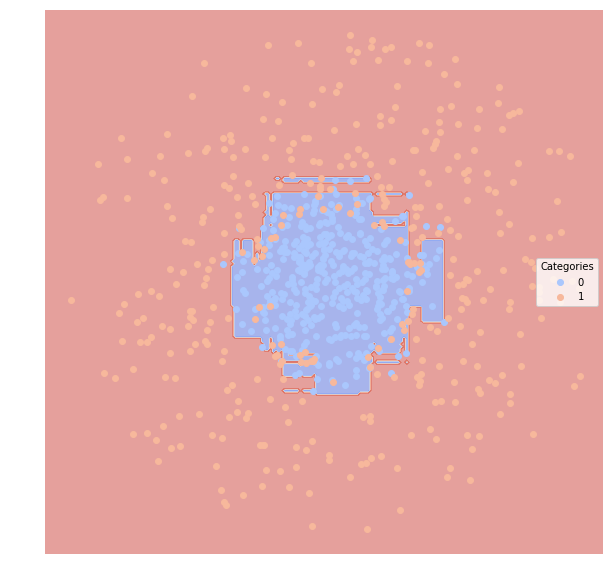

In [24]:
# With noise==0.2
evl3 = run_all_model(dfTrain3, dfTest3)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.594151            0.53467        0.41   0.558333  0.697917
1         0.594151            0.57762        0.41   0.637500  0.490385
bayes  Confusion Matrix:


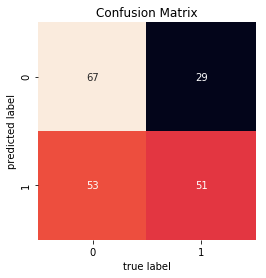

bayes  ROC:


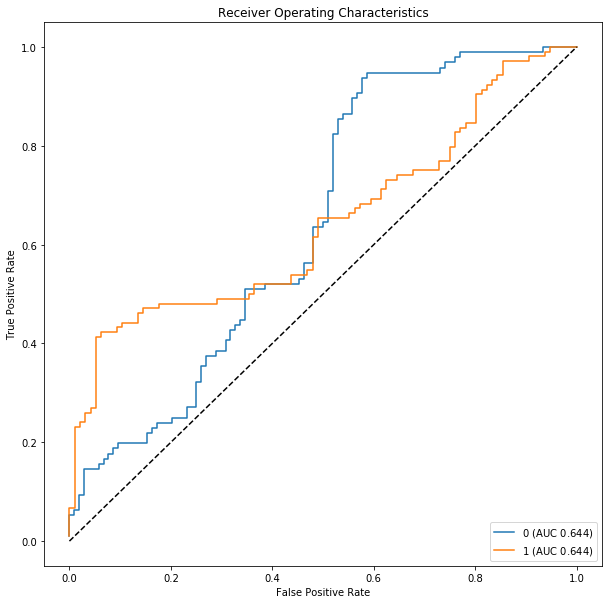

bayes  Regions:


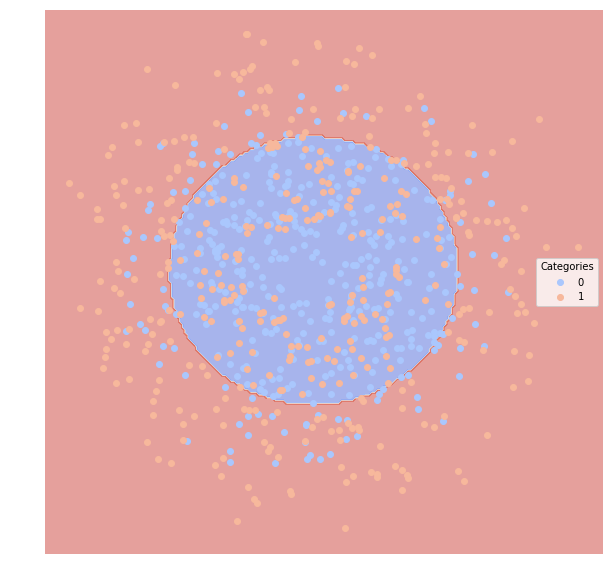

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.515224           0.487759       0.495   0.490066  0.770833
1         0.515224           0.528053       0.495   0.551020  0.259615
svm_linear  Confusion Matrix:


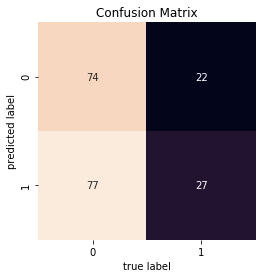

svm_linear  ROC:


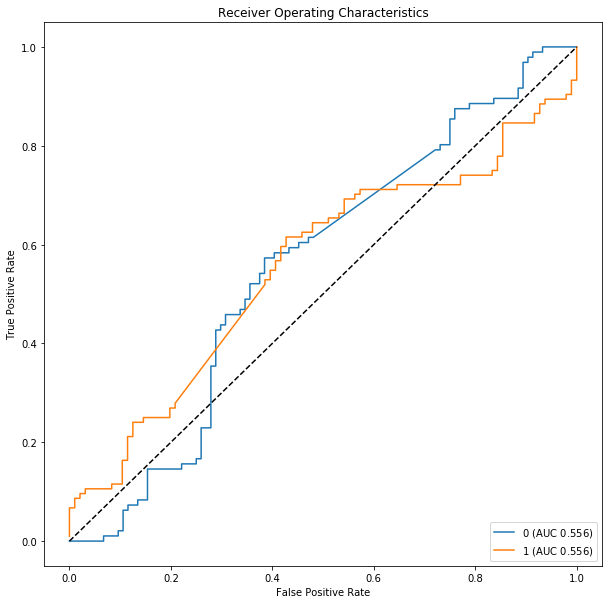

svm_linear  Regions:


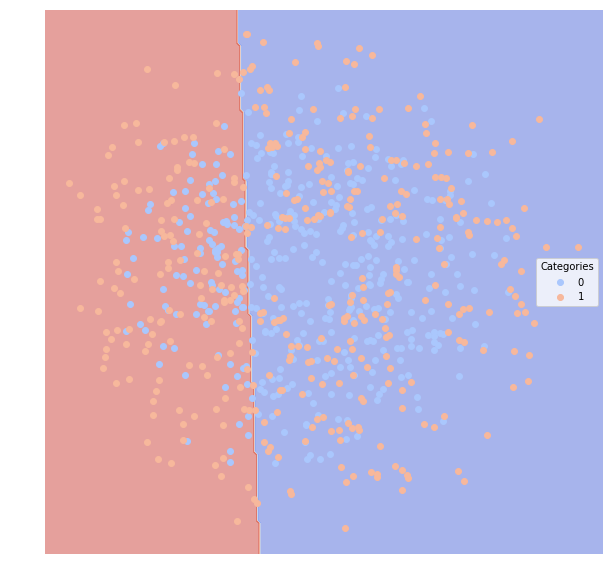

svm_poly  Evaluation:
          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
0         0.5               0.48        0.52       0.48     1.0
1         0.5               0.52        0.52       0.00     0.0
svm_poly  Confusion Matrix:


/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


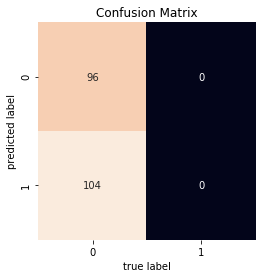

svm_poly  ROC:


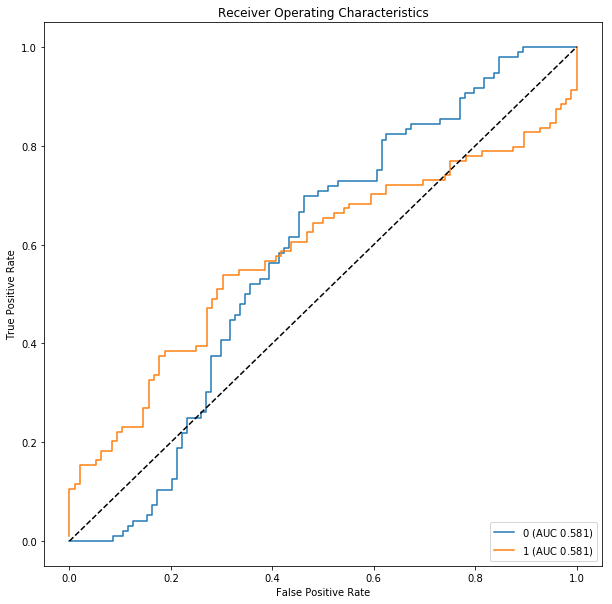

svm_poly  Regions:


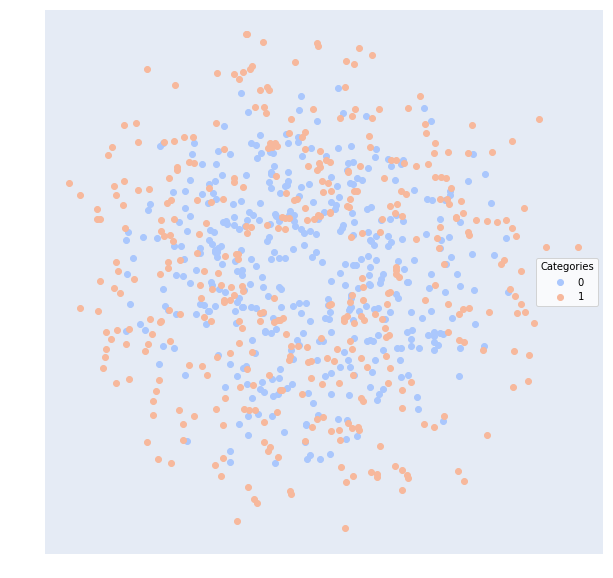

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.632212           0.562500        0.37   0.600000  0.687500
1         0.632212           0.604615        0.37   0.666667  0.576923
knn  Confusion Matrix:


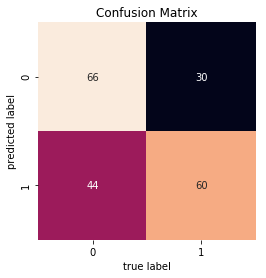

knn  ROC:


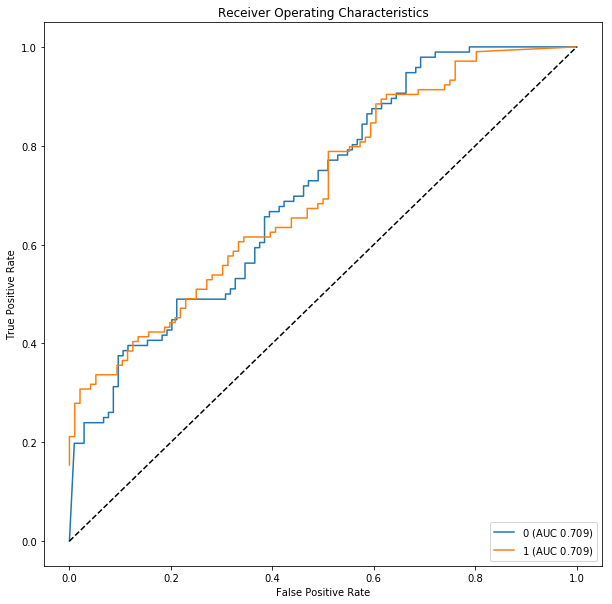

knn  Regions:


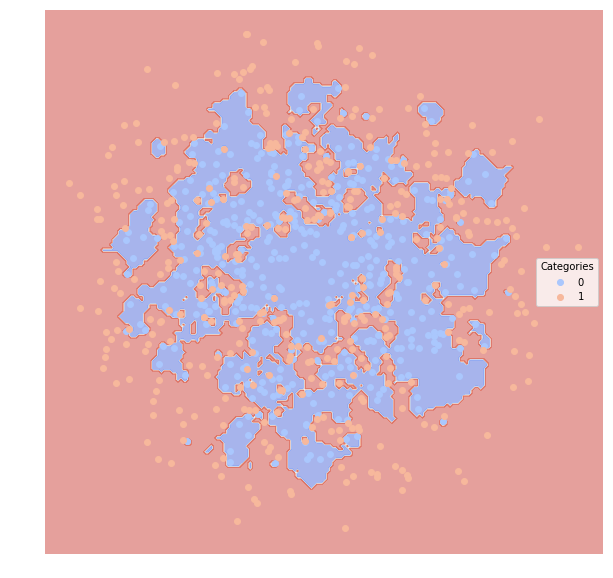

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.467548           0.464592        0.54   0.456522  0.656250
1         0.467548           0.505428        0.54   0.467742  0.278846
classical_reg  Confusion Matrix:


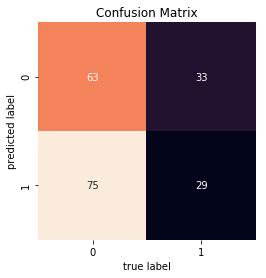

classical_reg  ROC:


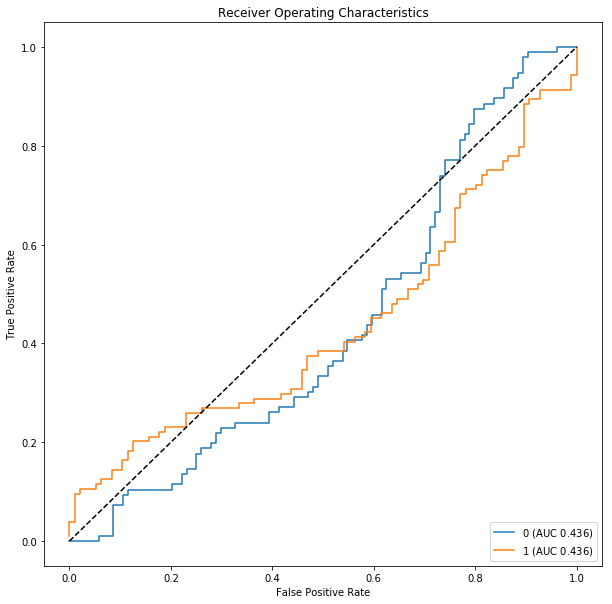

classical_reg  Regions:


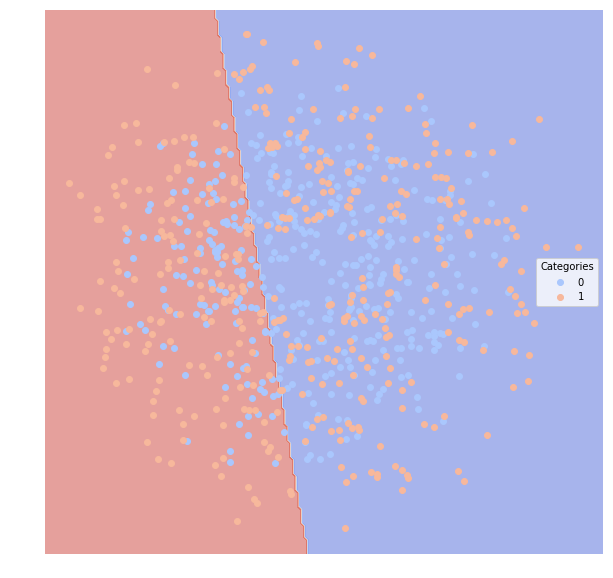

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.557292           0.511670       0.445   0.531532  0.614583
1         0.557292           0.552135       0.445   0.584270  0.500000
decision_tree  Confusion Matrix:


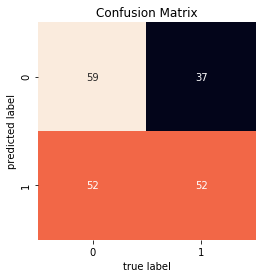

decision_tree  ROC:


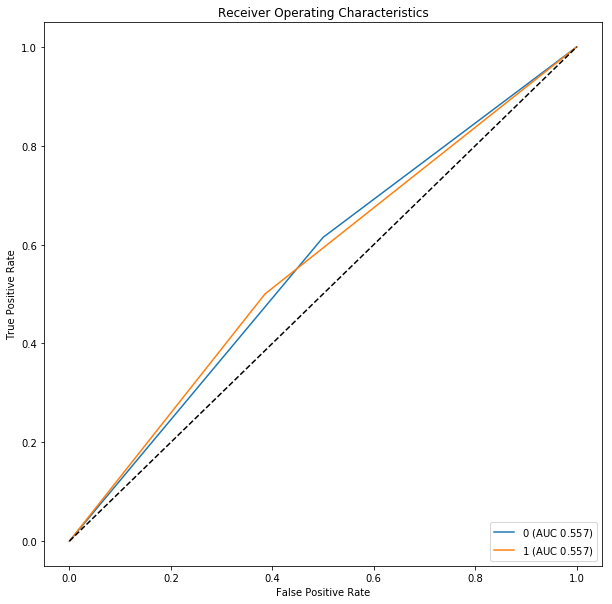

decision_tree  Regions:


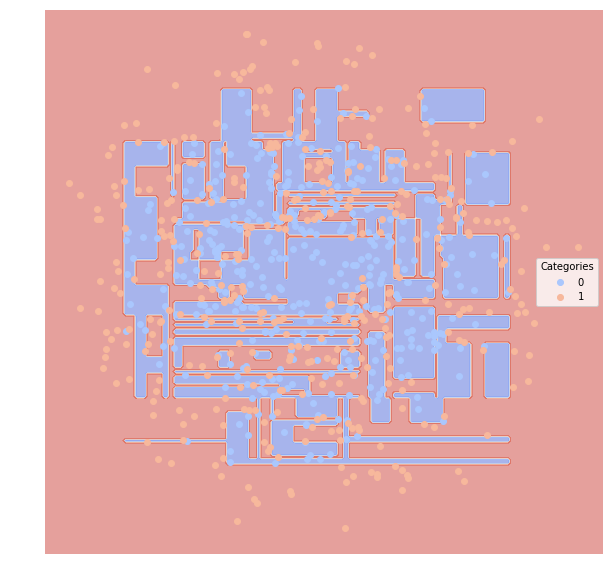

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.594952            0.53495        0.41   0.556452  0.718750
1         0.594952            0.57877        0.41   0.644737  0.471154
random_forest  Confusion Matrix:


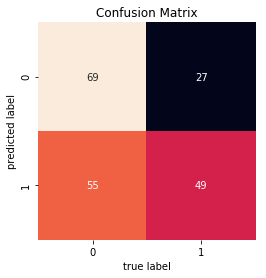

random_forest  ROC:


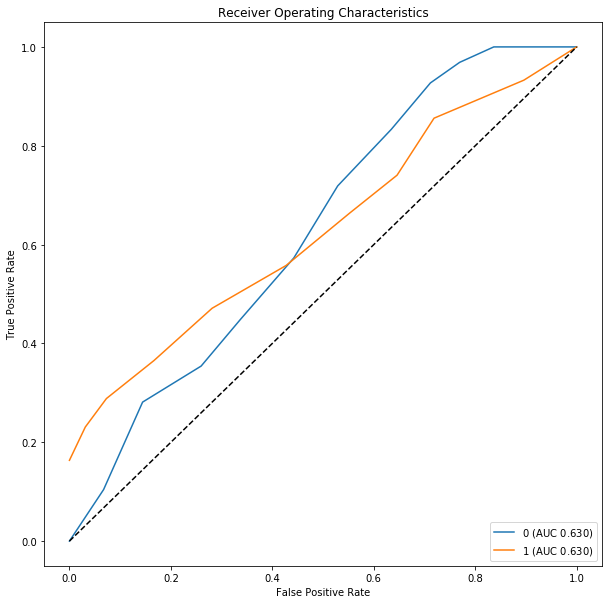

random_forest  Regions:


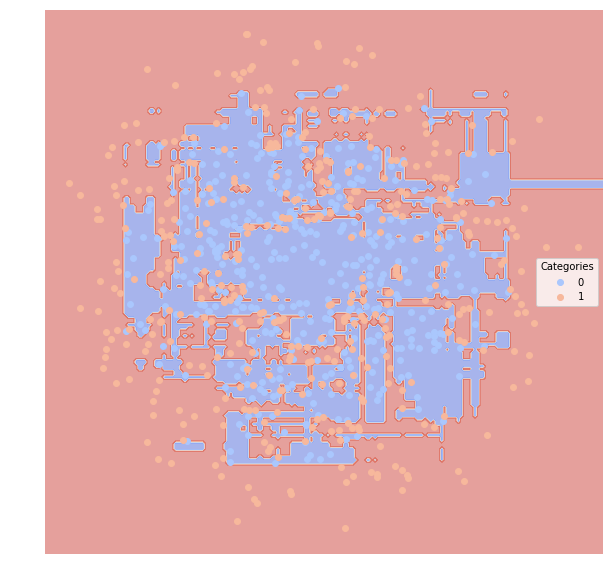

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.571314           0.520582        0.43   0.547170  0.604167
1         0.571314           0.560786        0.43   0.595745  0.538462
neural_network  Confusion Matrix:


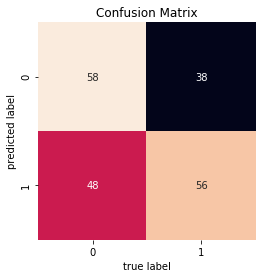

neural_network  ROC:


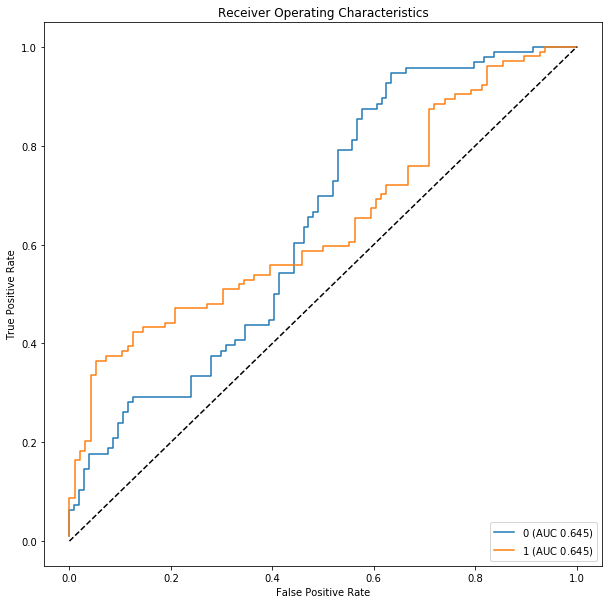

neural_network  Regions:


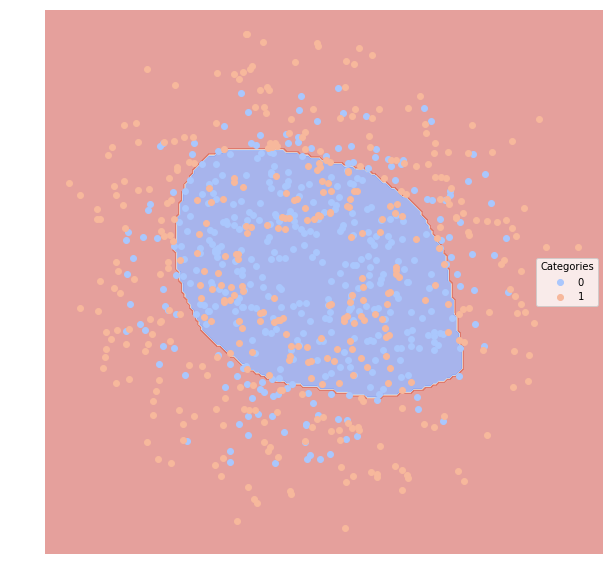

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.601362           0.538744       0.405   0.557252  0.760417
1         0.601362           0.584872       0.405   0.666667  0.442308
boosting  Confusion Matrix:


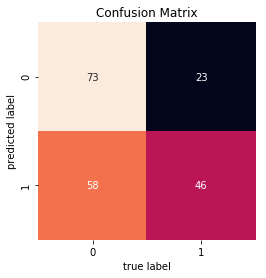

boosting  ROC:


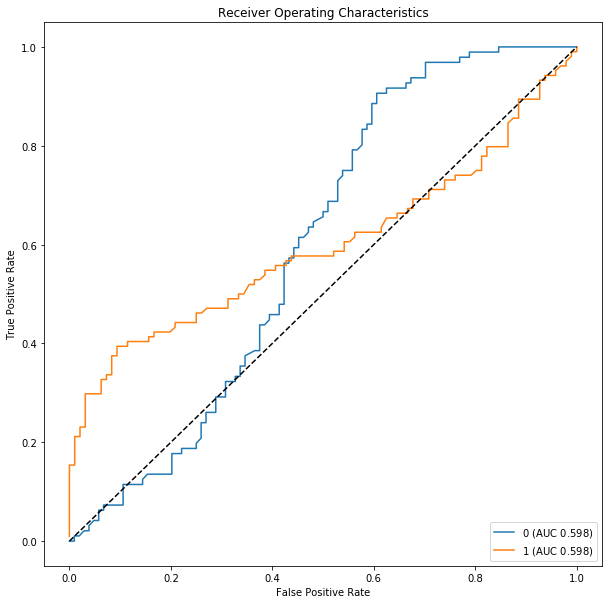

boosting  Regions:


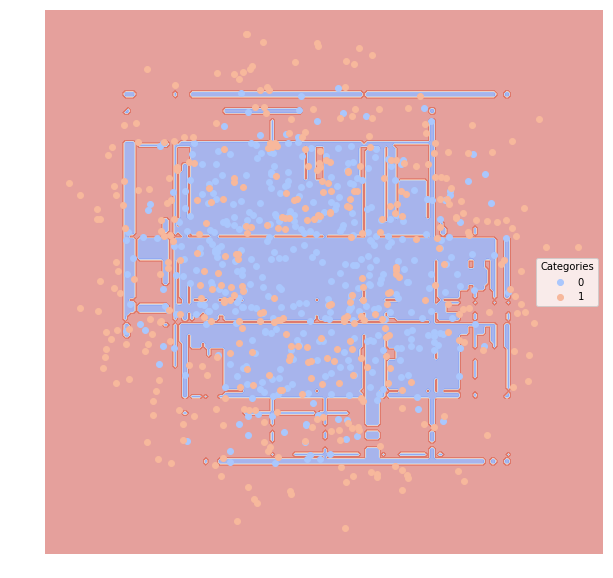

In [25]:
# With noise==0.7
evl8 = run_all_model(dfTrain8, dfTest8)

### MultiBlobs Datasets

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.998783           0.988889       0.002   0.988889  1.000000
1         1.000000           1.000000       0.000   1.000000  1.000000
2         1.000000           1.000000       0.000   1.000000  1.000000
3         0.994283           0.984379       0.004   0.991150  0.991150
4         0.994792           0.991583       0.002   1.000000  0.989583
bayes  Confusion Matrix:


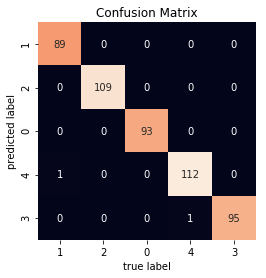

bayes  ROC:


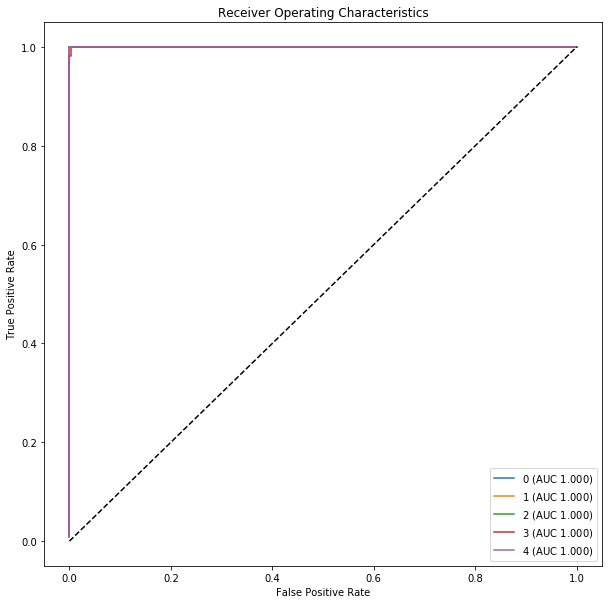

bayes  Regions:


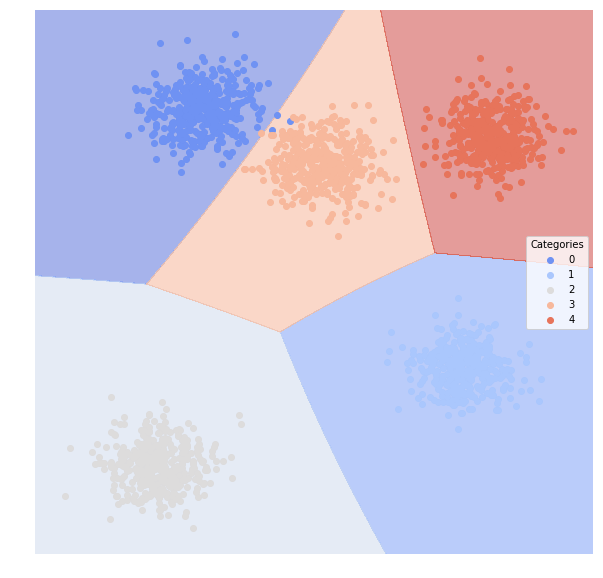

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.997567           0.978022       0.004   0.978022  1.000000
1         1.000000           1.000000       0.000   1.000000  1.000000
2         1.000000           1.000000       0.000   1.000000  1.000000
3         0.989858           0.977530       0.006   0.991071  0.982301
4         0.994792           0.991583       0.002   1.000000  0.989583
svm_linear  Confusion Matrix:


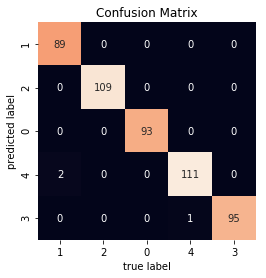

svm_linear  ROC:


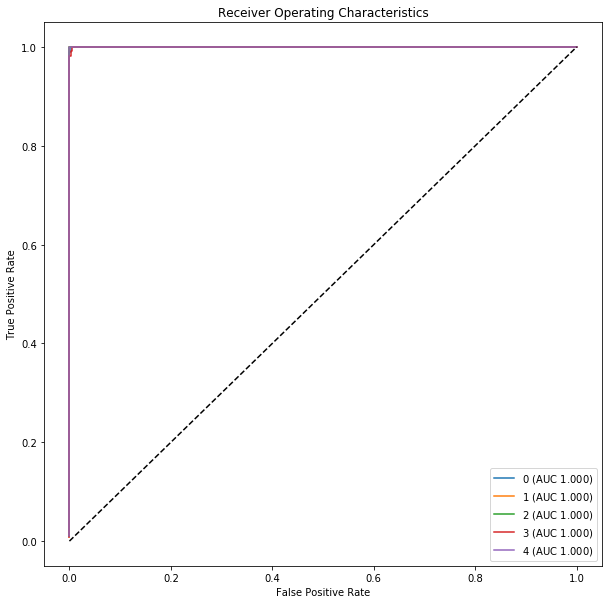

svm_linear  Regions:


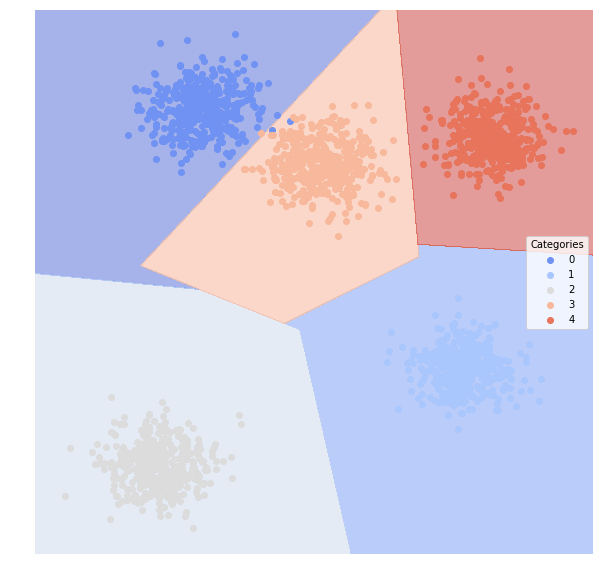

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.997567           0.978022       0.004   0.978022  1.000000
1         1.000000           1.000000       0.000   1.000000  1.000000
2         1.000000           1.000000       0.000   1.000000  1.000000
3         0.991150           0.986301       0.004   1.000000  0.982301
4         1.000000           1.000000       0.000   1.000000  1.000000
svm_poly  Confusion Matrix:


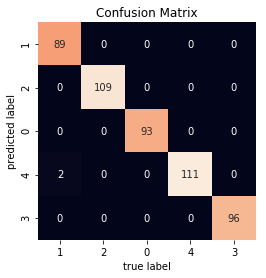

svm_poly  ROC:


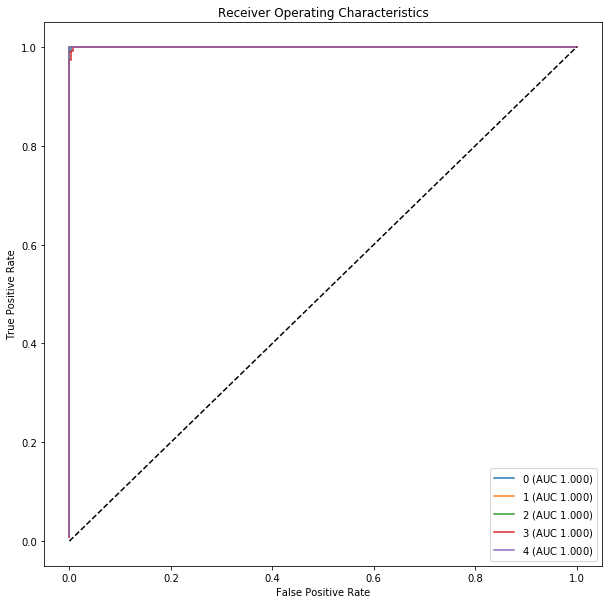

svm_poly  Regions:


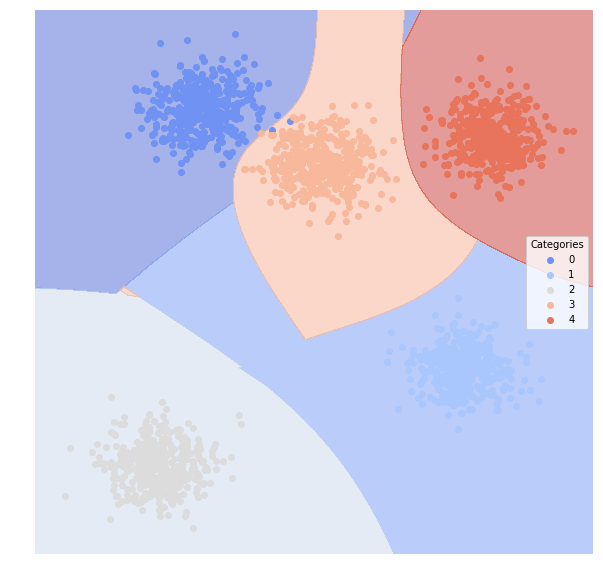

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.997567           0.978022       0.004   0.978022  1.000000
1         1.000000           1.000000       0.000   1.000000  1.000000
2         1.000000           1.000000       0.000   1.000000  1.000000
3         0.991150           0.986301       0.004   1.000000  0.982301
4         1.000000           1.000000       0.000   1.000000  1.000000
knn  Confusion Matrix:


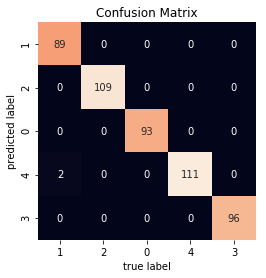

knn  ROC:


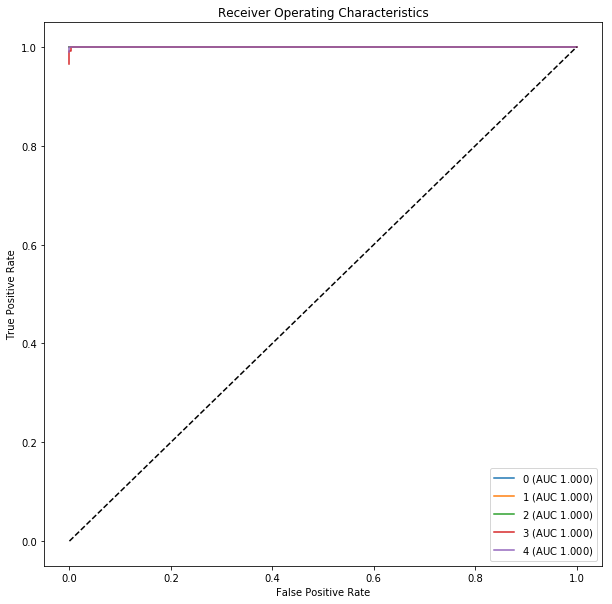

knn  Regions:


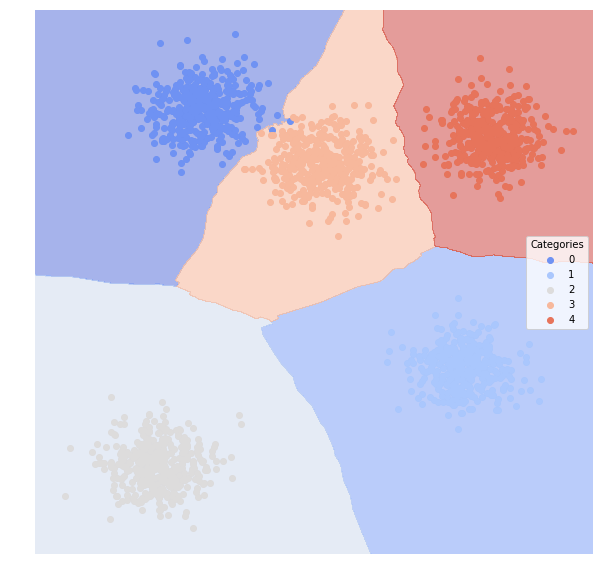

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.993917           0.946809       0.010   0.946809  1.000000
1         1.000000           1.000000       0.000   1.000000  1.000000
2         1.000000           1.000000       0.000   1.000000  1.000000
3         0.969027           0.952053       0.014   1.000000  0.938053
4         0.997525           0.979592       0.004   0.979592  1.000000
classical_reg  Confusion Matrix:


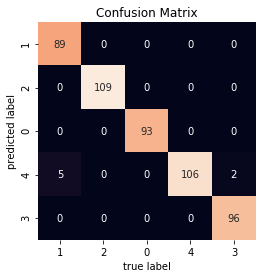

classical_reg  ROC:


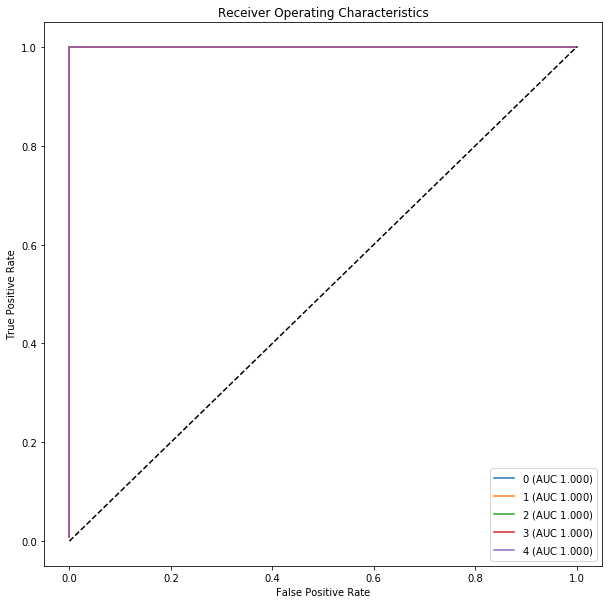

classical_reg  Regions:


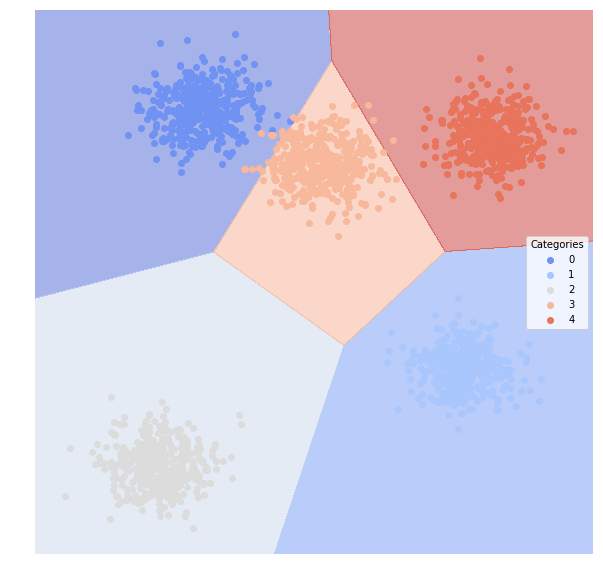

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.997567           0.978022       0.004   0.978022  1.000000
1         1.000000           1.000000       0.000   1.000000  1.000000
2         1.000000           1.000000       0.000   1.000000  1.000000
3         0.989858           0.977530       0.006   0.991071  0.982301
4         0.994792           0.991583       0.002   1.000000  0.989583
decision_tree  Confusion Matrix:


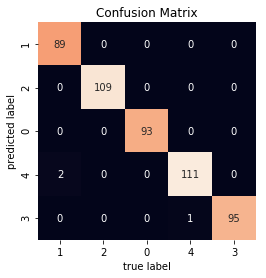

decision_tree  ROC:


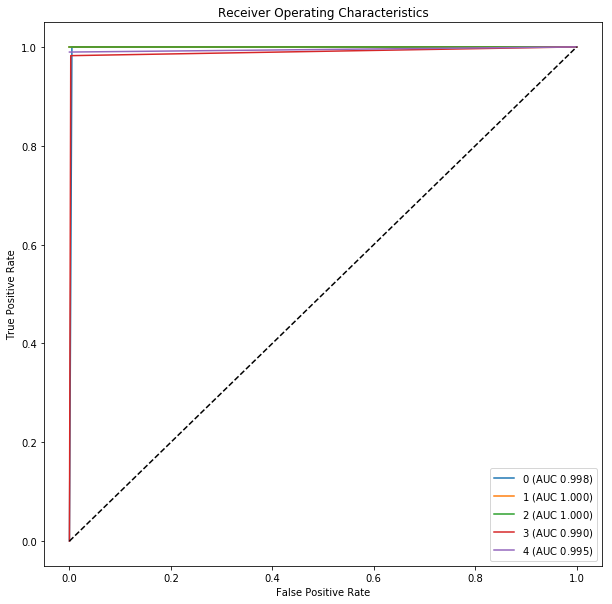

decision_tree  Regions:


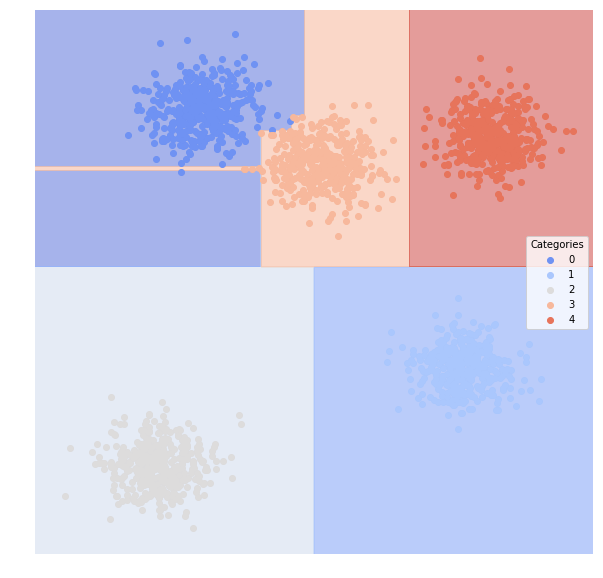

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision   Recall
Category                                                             
0         0.998783           0.988889       0.002   0.988889  1.00000
1         1.000000           1.000000       0.000   1.000000  1.00000
2         1.000000           1.000000       0.000   1.000000  1.00000
3         0.995575           0.993150       0.002   1.000000  0.99115
4         1.000000           1.000000       0.000   1.000000  1.00000
random_forest  Confusion Matrix:


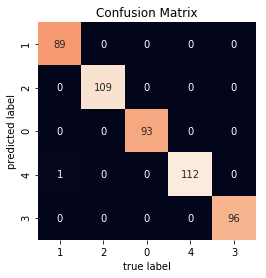

random_forest  ROC:


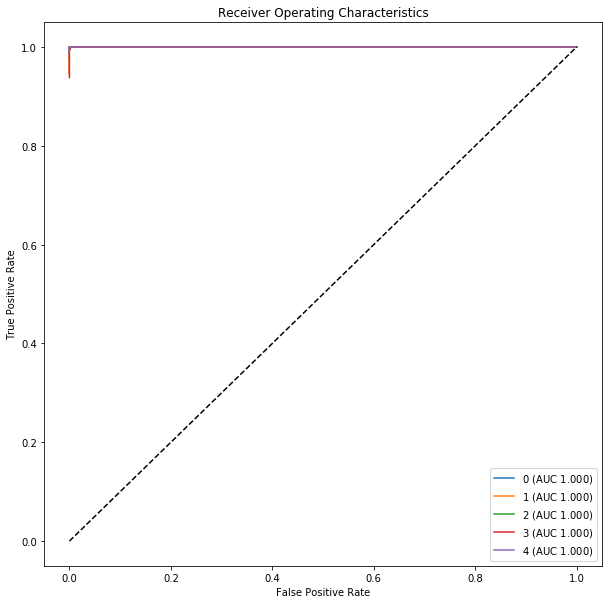

random_forest  Regions:


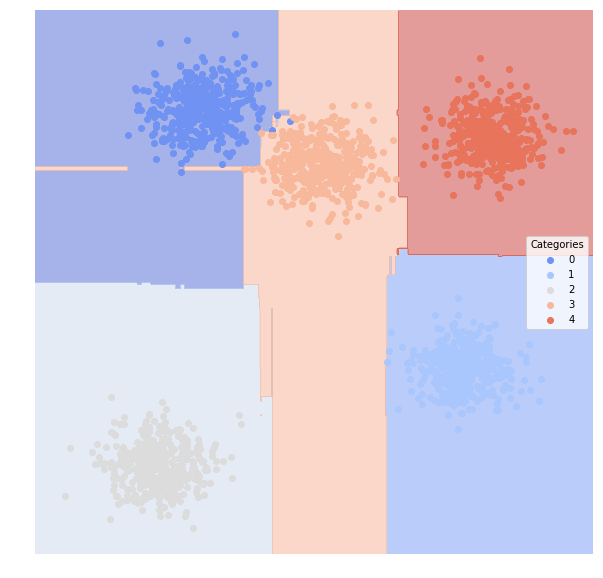

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         1.000000           1.000000       0.000   1.000000  1.000000
1         1.000000           1.000000       0.000   1.000000  1.000000
2         1.000000           1.000000       0.000   1.000000  1.000000
3         0.998708           0.991228       0.002   0.991228  1.000000
4         0.994792           0.991583       0.002   1.000000  0.989583
neural_network  Confusion Matrix:


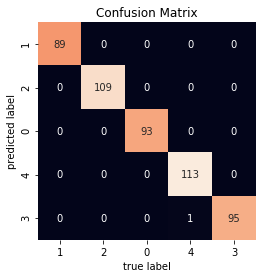

neural_network  ROC:


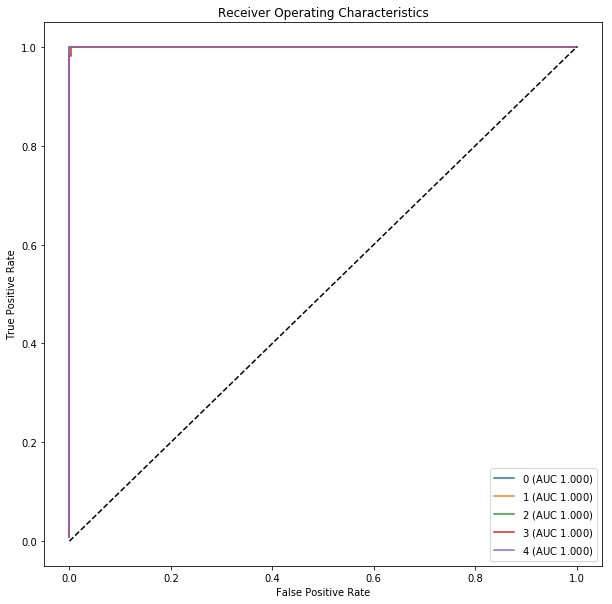

neural_network  Regions:


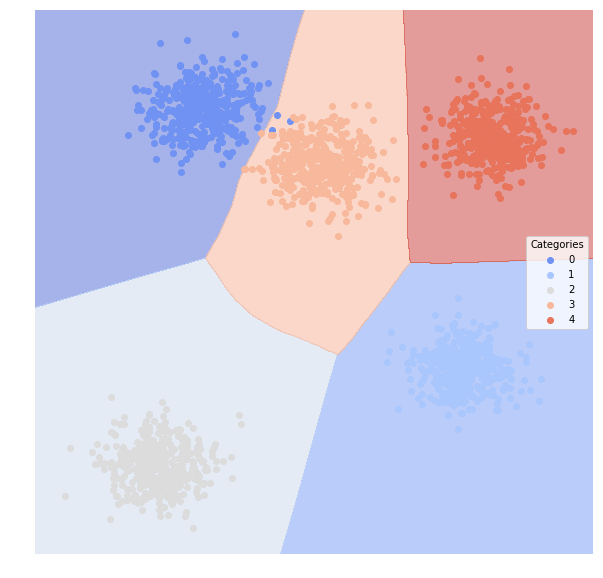

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.991949           0.968792       0.006   0.977778  0.988764
1         1.000000           1.000000       0.000   1.000000  1.000000
2         1.000000           1.000000       0.000   1.000000  1.000000
3         0.989858           0.977530       0.006   0.991071  0.982301
4         1.000000           1.000000       0.000   1.000000  1.000000
boosting  Confusion Matrix:


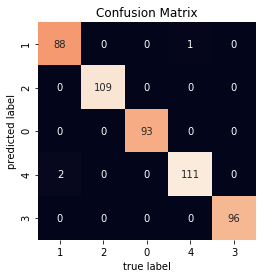

boosting  ROC:


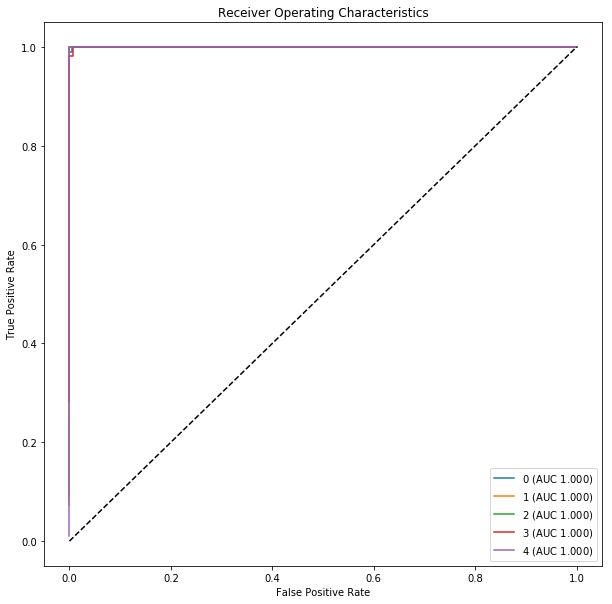

boosting  Regions:


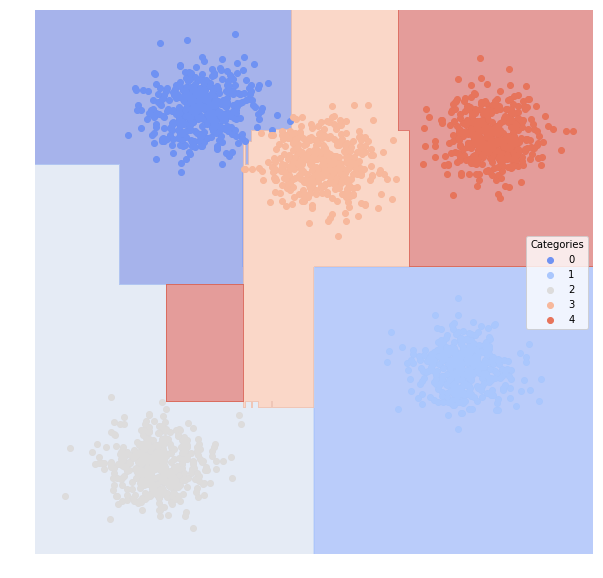

In [26]:
# With noise==0.2
evl4 = run_all_model(dfTrain4, dfTest4)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         1.000000           1.000000       0.000   1.000000  1.000000
1         0.912490           0.750853       0.058   0.838384  0.864583
2         0.841049           0.622067       0.102   0.764706  0.742857
3         0.874736           0.695261       0.076   0.824742  0.792079
4         0.879613           0.681251       0.084   0.787037  0.817308
bayes  Confusion Matrix:


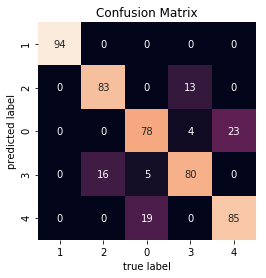

bayes  ROC:


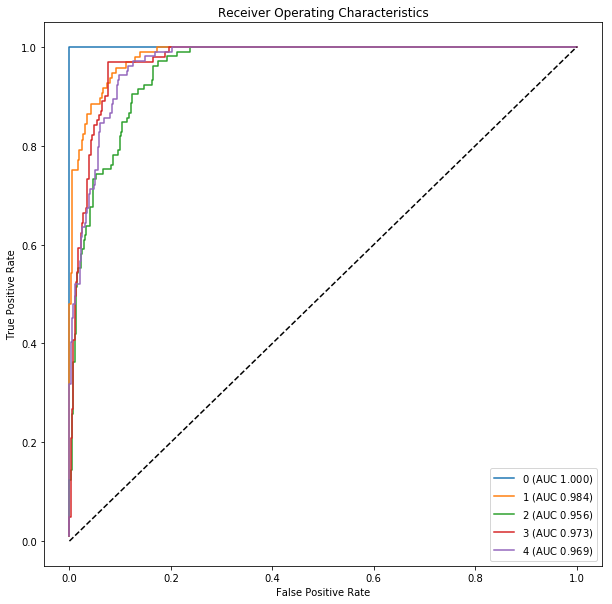

bayes  Regions:


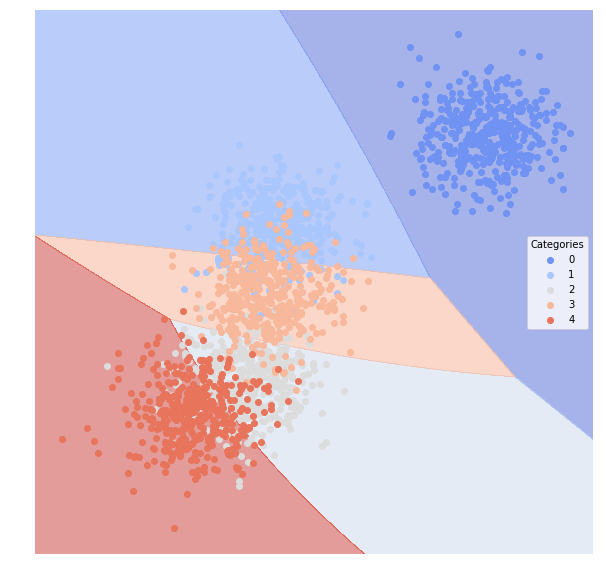

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         1.000000           1.000000       0.000   1.000000  1.000000
1         0.907024           0.764879       0.054   0.870968  0.843750
2         0.841049           0.622067       0.102   0.764706  0.742857
3         0.892032           0.712266       0.072   0.815534  0.831683
4         0.879613           0.681251       0.084   0.787037  0.817308
svm_linear  Confusion Matrix:


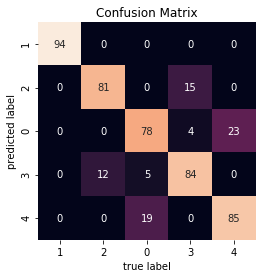

svm_linear  ROC:


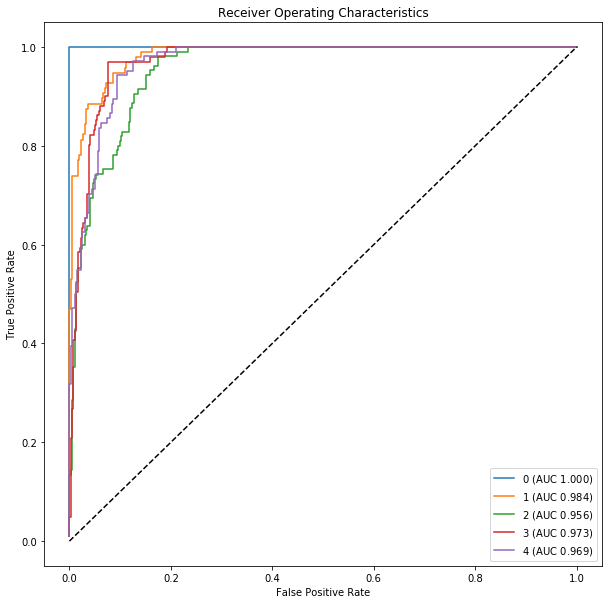

svm_linear  Regions:


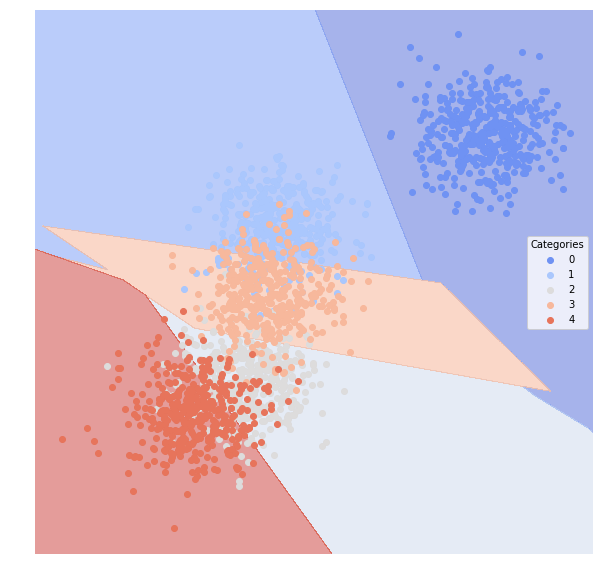

svm_poly  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         1.000000           1.000000       0.000   1.000000  1.000000
1         0.850454           0.734404       0.062   0.957746  0.708333
2         0.842315           0.627692       0.100   0.772277  0.742857
3         0.925246           0.708327       0.078   0.746032  0.930693
4         0.879613           0.681251       0.084   0.787037  0.817308
svm_poly  Confusion Matrix:


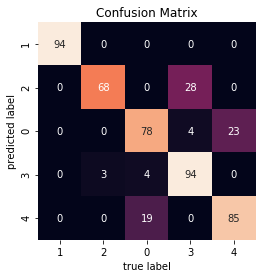

svm_poly  ROC:


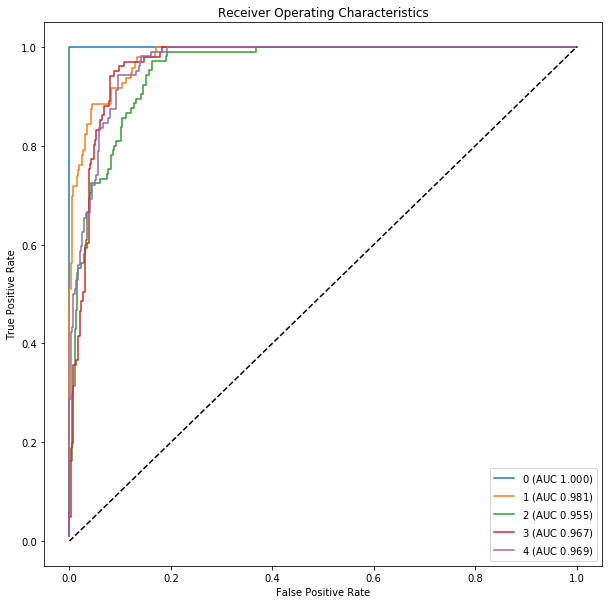

svm_poly  Regions:


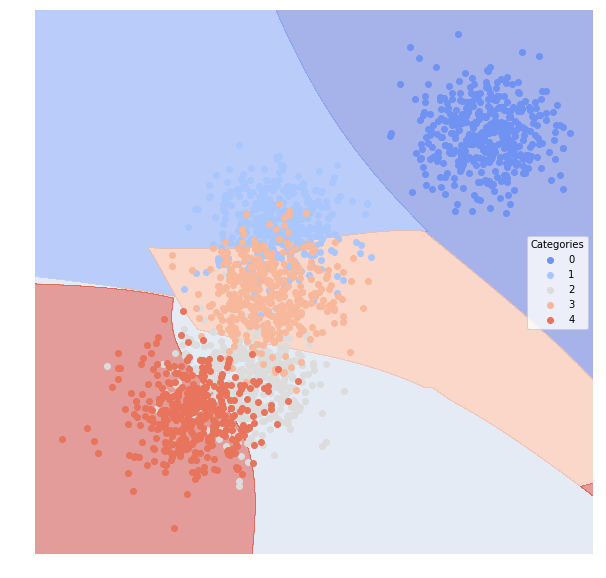

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         1.000000           1.000000       0.000   1.000000  1.000000
1         0.913469           0.781136       0.050   0.881720  0.854167
2         0.824533           0.605254       0.106   0.770833  0.704762
3         0.901933           0.727407       0.068   0.819048  0.851485
4         0.874563           0.658278       0.092   0.758929  0.817308
knn  Confusion Matrix:


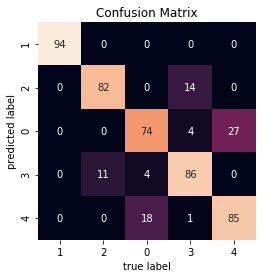

knn  ROC:


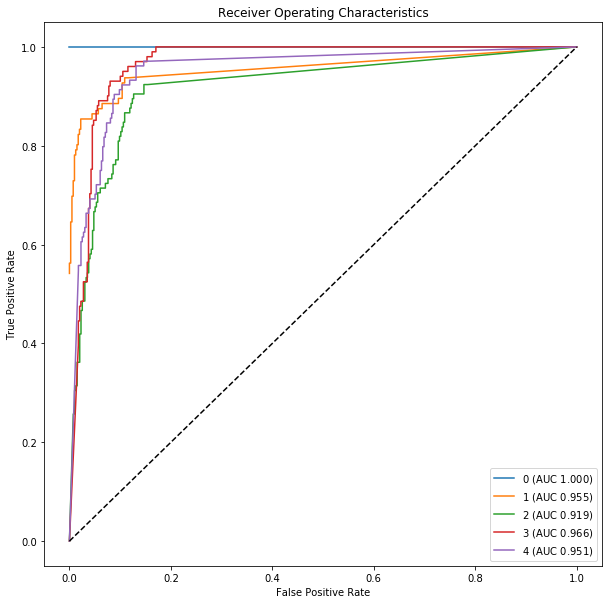

knn  Regions:


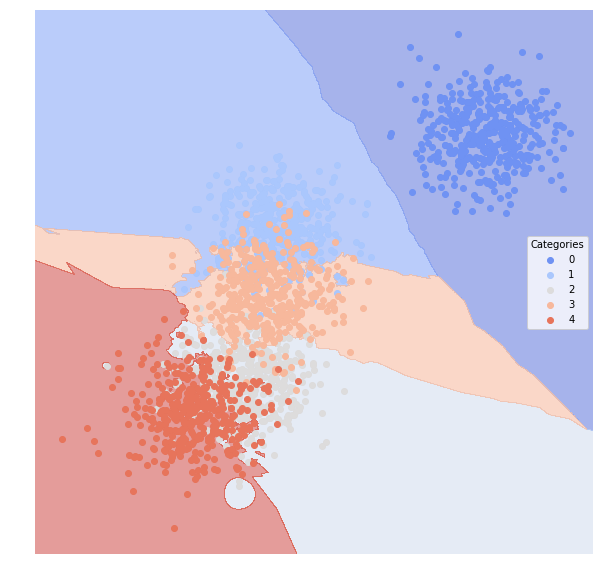

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.993449           0.980837       0.004   0.989362  0.989362
1         0.881033           0.629507       0.096   0.710526  0.843750
2         0.762025           0.490452       0.144   0.677419  0.600000
3         0.721209           0.450626       0.144   0.704225  0.495050
4         0.896853           0.659817       0.096   0.718750  0.884615
classical_reg  Confusion Matrix:


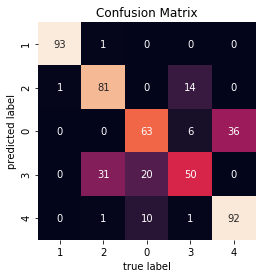

classical_reg  ROC:


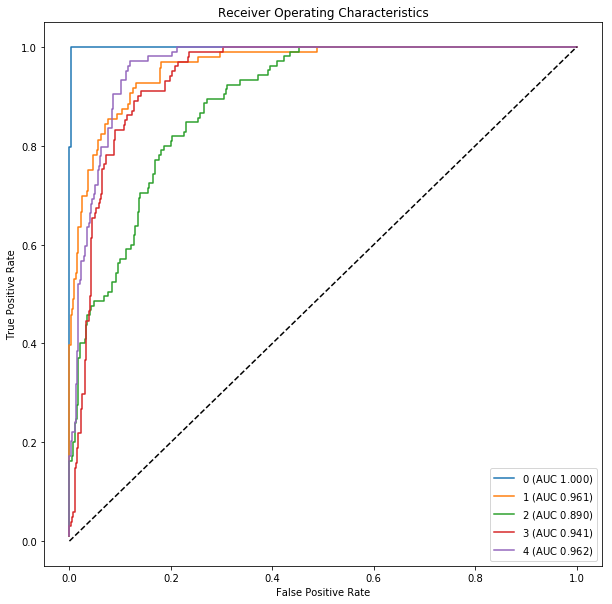

classical_reg  Regions:


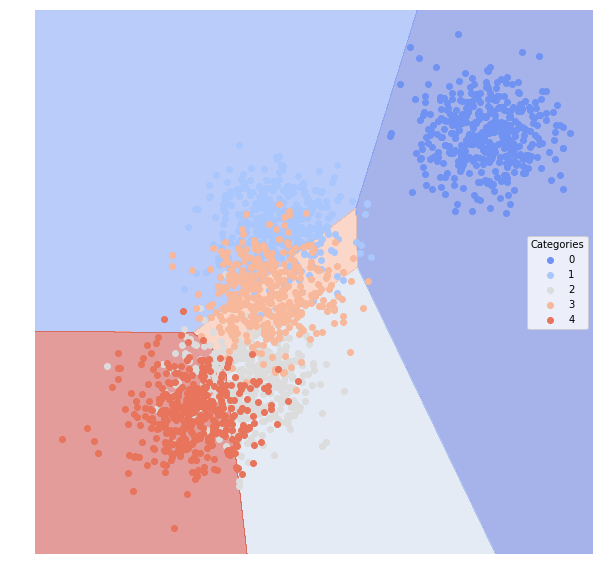

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.998768           0.989474       0.002   0.989474  1.000000
1         0.858911           0.683294       0.074   0.847059  0.750000
2         0.769017           0.494826       0.144   0.670103  0.619048
3         0.870853           0.643221       0.094   0.745455  0.811881
4         0.824738           0.558510       0.126   0.681416  0.740385
decision_tree  Confusion Matrix:


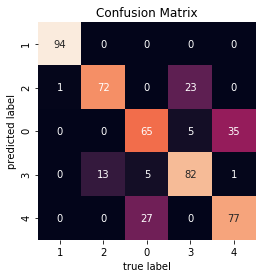

decision_tree  ROC:


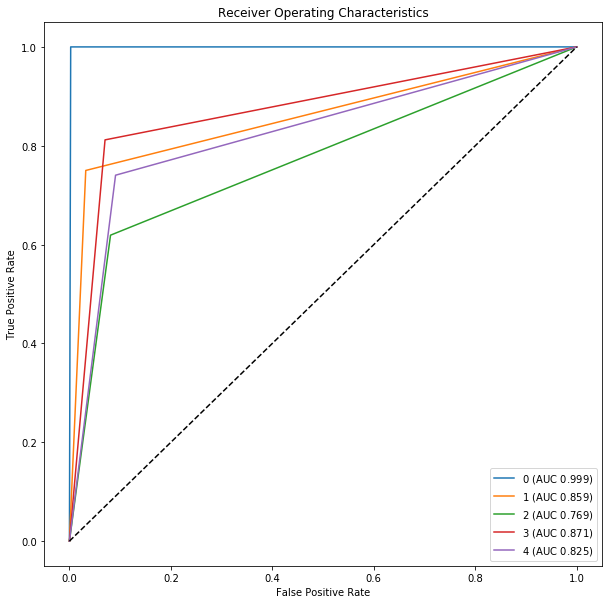

decision_tree  Regions:


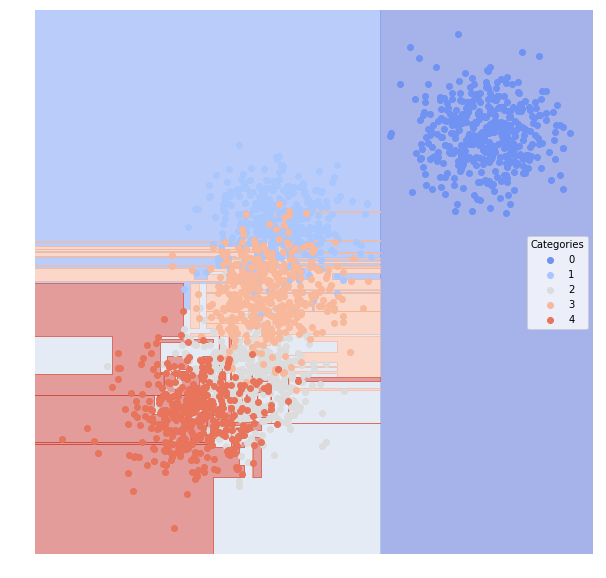

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.998768           0.989474       0.002   0.989474  1.000000
1         0.896865           0.726444       0.064   0.833333  0.833333
2         0.820735           0.588792       0.112   0.747475  0.704762
3         0.870977           0.675663       0.082   0.800000  0.792079
4         0.864948           0.644185       0.096   0.754545  0.798077
random_forest  Confusion Matrix:


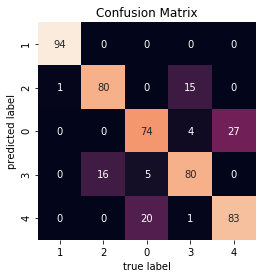

random_forest  ROC:


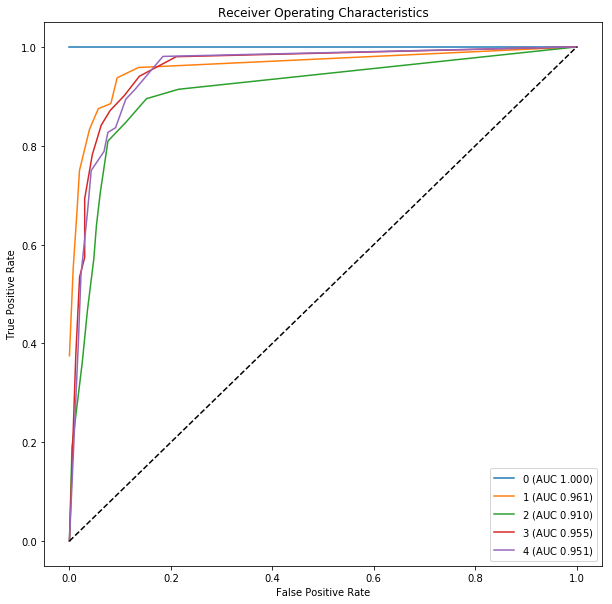

random_forest  Regions:


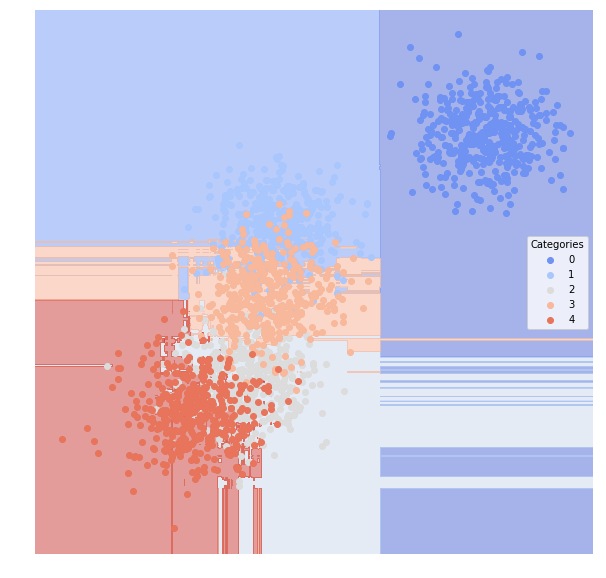

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.998768           0.989474       0.002   0.989474  1.000000
1         0.898102           0.733754       0.062   0.842105  0.833333
2         0.825799           0.610972       0.104   0.778947  0.704762
3         0.877181           0.689604       0.078   0.810000  0.801980
4         0.888986           0.679492       0.086   0.765217  0.846154
neural_network  Confusion Matrix:


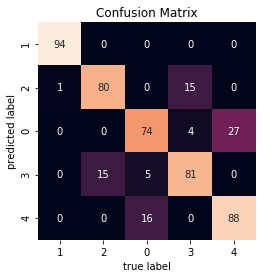

neural_network  ROC:


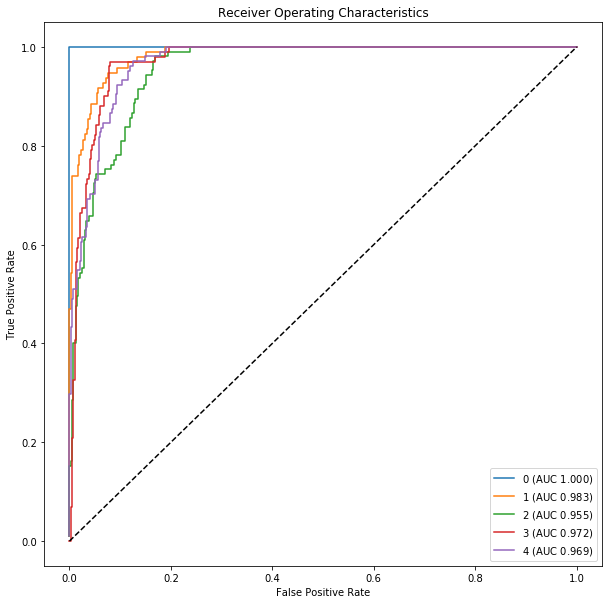

neural_network  Regions:


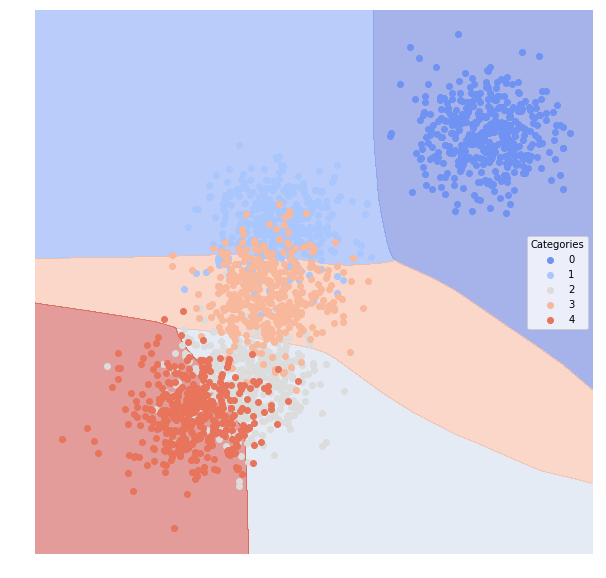

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.998768           0.989474       0.002   0.989474  1.000000
1         0.891399           0.740167       0.060   0.866667  0.812500
2         0.819470           0.583524       0.114   0.740000  0.704762
3         0.888273           0.693070       0.078   0.792453  0.831683
4         0.866210           0.649710       0.094   0.761468  0.798077
boosting  Confusion Matrix:


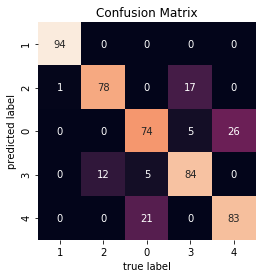

boosting  ROC:


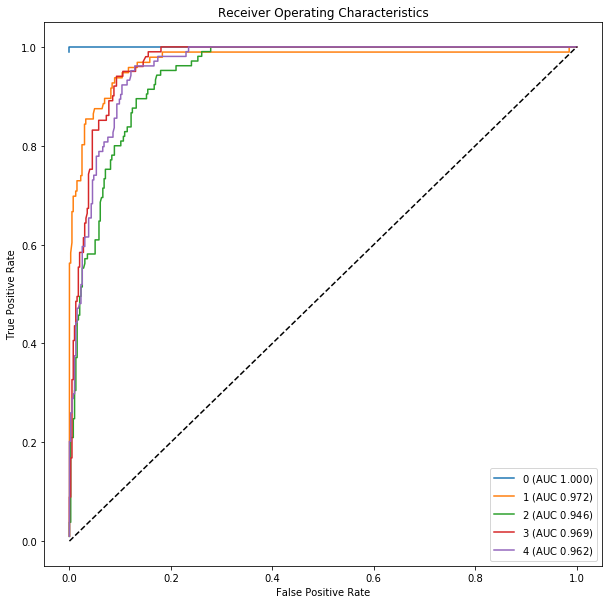

boosting  Regions:


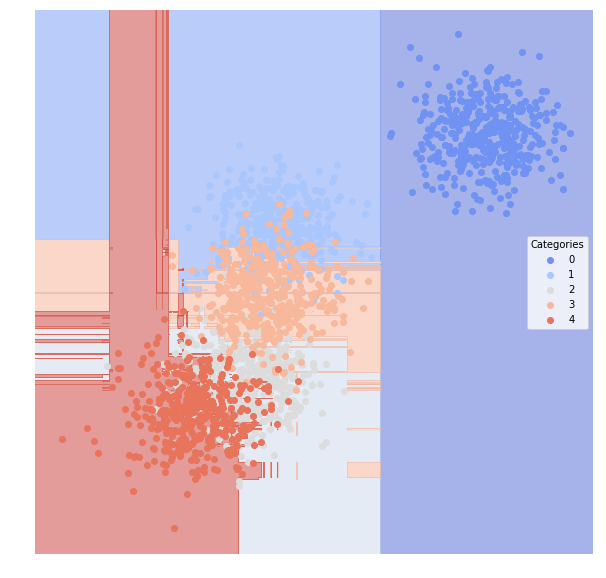

In [27]:
# With noise==0.7
evl9 = run_all_model(dfTrain9, dfTest9)

<span style="color:blue"> For randomly distributed samples, it is hard to decide which method fits best, since none of them perform perfectly. This might because of the algorithms do not assume the data distribution to be random. When noise = 0.2, I think there is no optimal classifier. According to ROC, classical regression gives the best performance. But according to plot of the regions, KNN algorithm with k=5 gives the best performance, since it goes beyond the constraint of some assumptions of general distribution. When noise = 0.7, according to the performance on ROC, decision tree is the best, since it gives both balanced classification between the two categories and relatively higher AUC.

<span style="color:blue"> For andSplit samples, every method works better. But they work better on the sample with noise=0.2 than the sample with noise=0.7. For the sample with noise=0.2, Naive Bayes, SVM with linear kernel, SVM with polynomial kernel, and classical regression, all gives similar and relatively better performance than the other classifiers. That might because the sample has very simple distribution, which makes corresponding algorithms perform better. For the sample with noise=0.7, according to ROC, Neural Network gives the highest AUC for both of the categories. Naive Bayrs, SVM with linear kernel, and classical regression, also gives similar performance. Maybe when noise=0.7, the distribution of data point is more complex, which needs more complicated algorithms.


<span style="color:blue"> For the xorSplit samples, Neural Network seems to have the best performance. Because it could produce very similar distribution of data, and it gives relative high and balanced AUCs.

<span style="color:blue"> For targetSplit samples, it depends. When noise=0.2, Neural Network, Naive Bayes, and Boosting are the best methods, since they have higher accuracy in classification, and give very similar regions to the original data distribution. When noise=0.7, the best method is KNN with k=5, since it gives the highest AUC. And it could identify the categories of data points very well, although the data points are confounding.


<span style="color:blue"> For MultiBlobs, all the methods give good classifications when noise=0.2. When noise=0.7, Random Forest, KNN, Neural Network, SVM with polynomial kernel, and Naive Bayes have similarly good performance, according to the AUCs in ROC. And they gives resonable classification in the regions.


<span style="color:blue"> According to the comparison above, which method performs the best depends on distribution of the data. Generally, when noise is small (data points are close within categories and far among categories), some simple methods, such as classical regression might perform better. When noise is large, complex methods like Neural Network performs better.


## Go through Empirical Datasets

### Reddit

Loading Reddit data
Converting to vectors


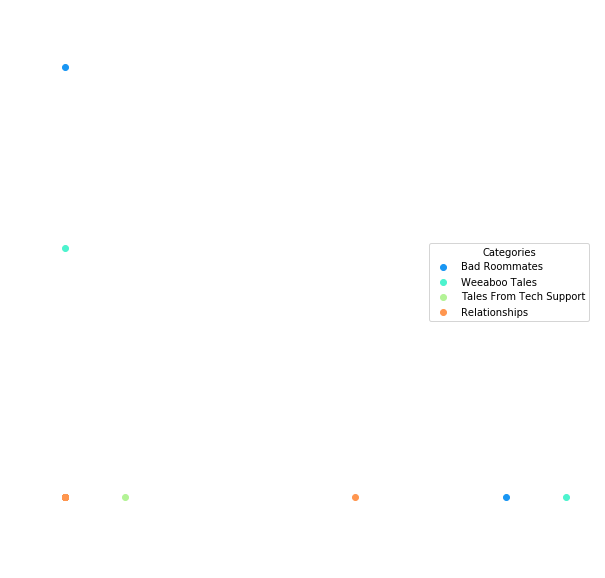

In [28]:
# Load the data
reddit_dfTrain, reddit_dfTest = lucem_illud.trainTestSplit(lucem_illud.loadReddit())

# Visualize
lucem_illud.plotter(reddit_dfTrain)

bayes  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.752032           0.561786    0.184953   0.740260   
Tales From Tech Support  0.872872           0.804112    0.068966   0.984375   
Weeaboo Tales            0.865232           0.522341    0.194357   0.531250   
Relationships            0.668145           0.369160    0.191223   0.580000   

                           Recall  
Category                           
Bad Roommates            0.593750  
Tales From Tech Support  0.750000  
Weeaboo Tales            0.971429  
Relationships            0.420290  
bayes  Confusion Matrix:


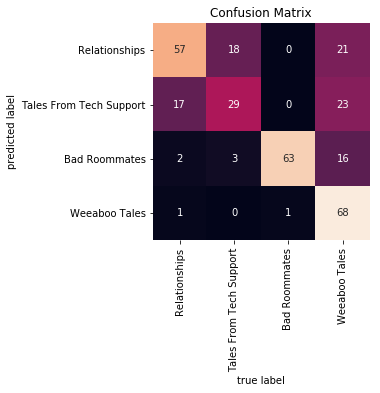

bayes  ROC:


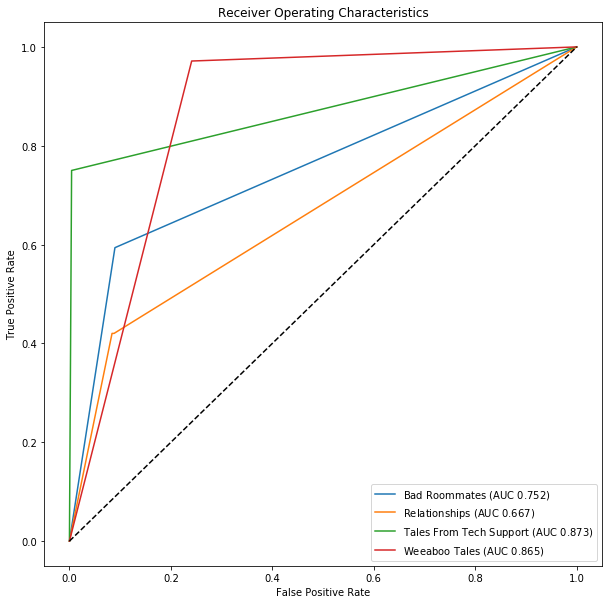

bayes  Regions:


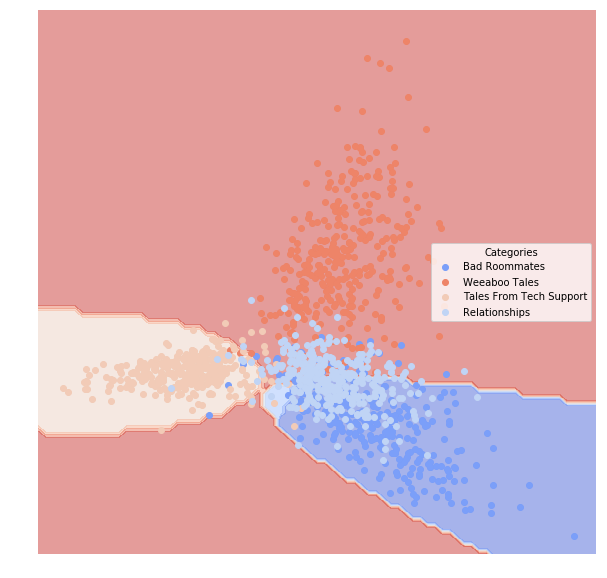

svm_linear  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.971716           0.953287    0.018809   0.989130   
Tales From Tech Support  0.988095           0.982460    0.006270   1.000000   
Weeaboo Tales            1.000000           1.000000    0.000000   1.000000   
Relationships            0.978754           0.896661    0.025078   0.906667   

                           Recall  
Category                           
Bad Roommates            0.947917  
Tales From Tech Support  0.976190  
Weeaboo Tales            1.000000  
Relationships            0.985507  
svm_linear  Confusion Matrix:


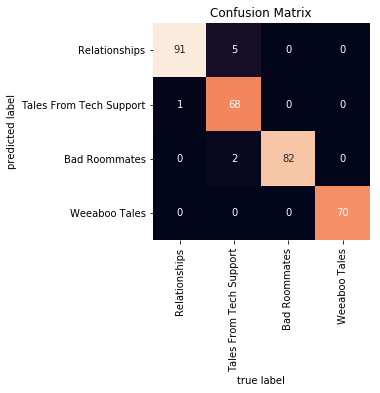

svm_linear  ROC:


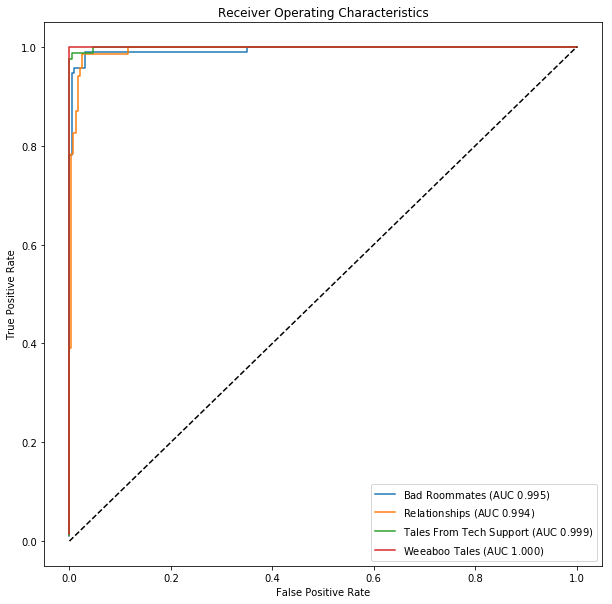

svm_linear  Regions:


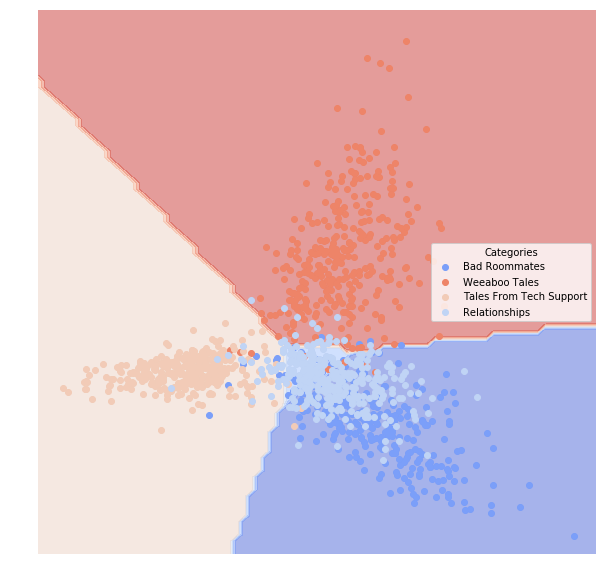

/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


svm_poly  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.500000           0.300940    0.300940   0.000000   
Tales From Tech Support  0.500000           0.263323    0.263323   0.000000   
Weeaboo Tales            0.614286           0.397850    0.169279   1.000000   
Relationships            0.532000           0.227723    0.733542   0.227723   

                           Recall  
Category                           
Bad Roommates            0.000000  
Tales From Tech Support  0.000000  
Weeaboo Tales            0.228571  
Relationships            1.000000  
svm_poly  Confusion Matrix:


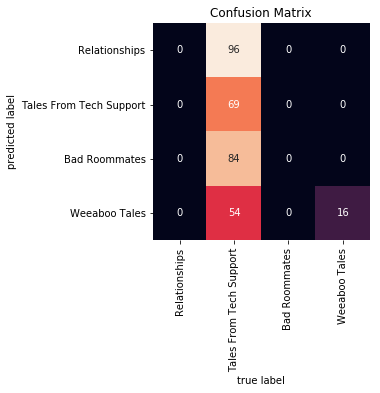

svm_poly  ROC:


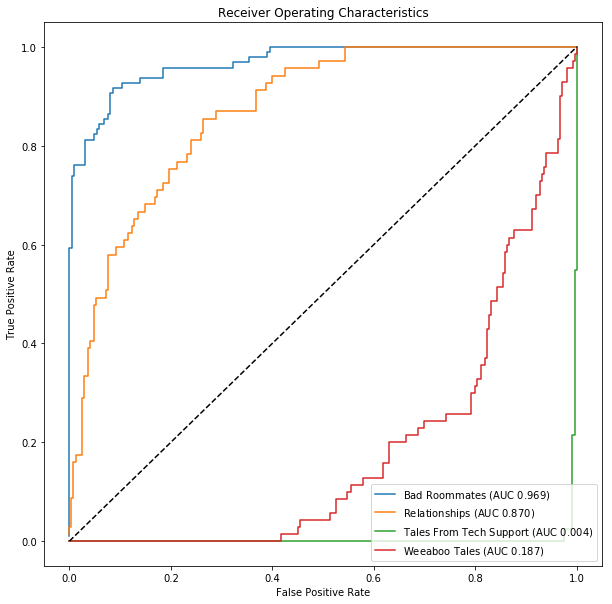

svm_poly  Regions:


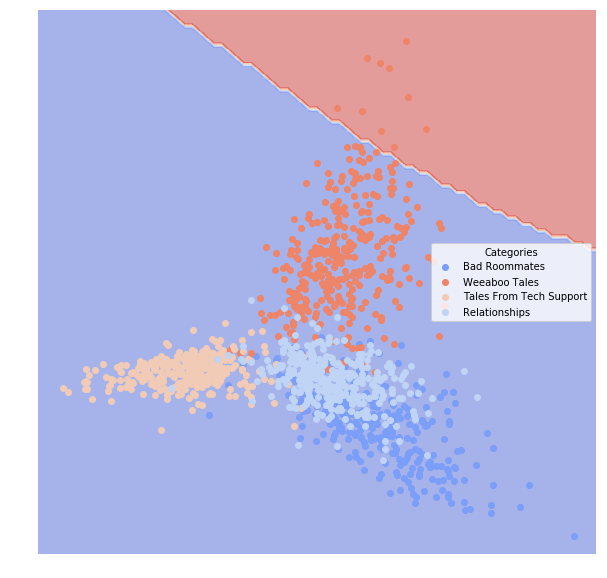

knn  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.918769           0.809547    0.072100   0.868687   
Tales From Tech Support  0.943870           0.884602    0.037618   0.950000   
Weeaboo Tales            0.921658           0.809936    0.050157   0.897059   
Relationships            0.864551           0.652784    0.097179   0.763889   

                           Recall  
Category                           
Bad Roommates            0.895833  
Tales From Tech Support  0.904762  
Weeaboo Tales            0.871429  
Relationships            0.797101  
knn  Confusion Matrix:


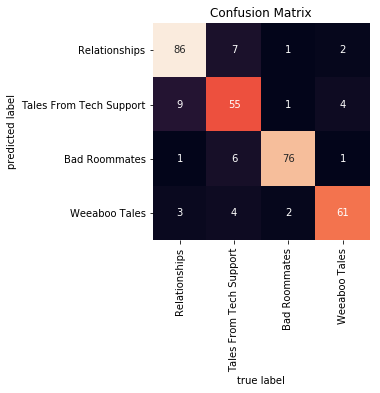

knn  ROC:


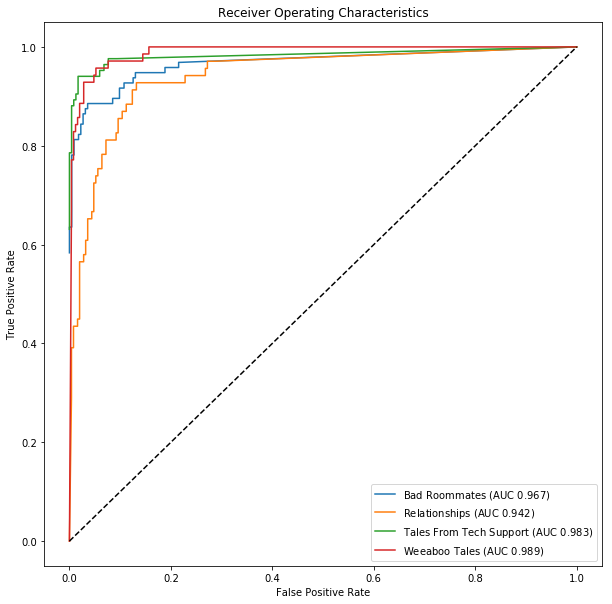

knn  Regions:


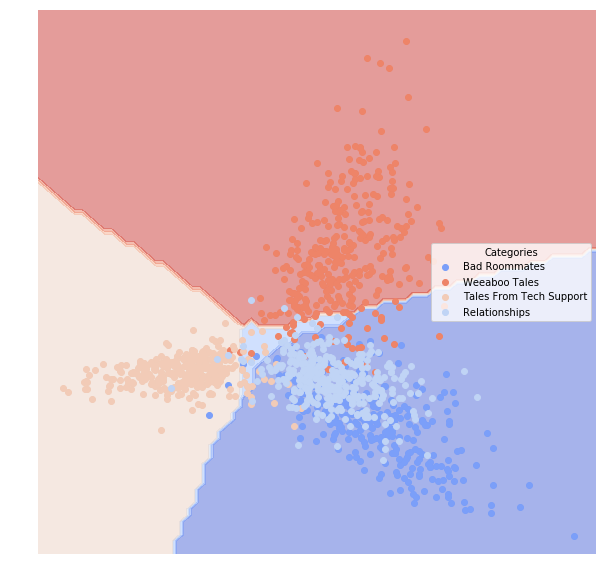

classical_reg  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.964266           0.935928    0.025078   0.978261   
Tales From Tech Support  0.988095           0.982460    0.006270   1.000000   
Weeaboo Tales            0.990849           0.974767    0.006270   0.985714   
Relationships            0.969507           0.873709    0.031348   0.893333   

                           Recall  
Category                           
Bad Roommates            0.937500  
Tales From Tech Support  0.976190  
Weeaboo Tales            0.985714  
Relationships            0.971014  
classical_reg  Confusion Matrix:


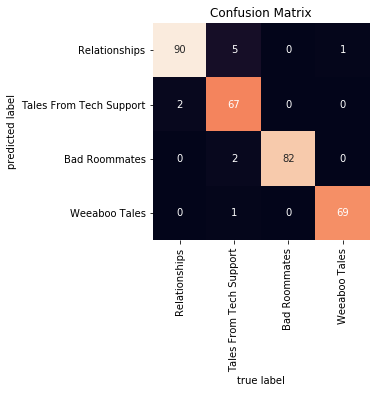

classical_reg  ROC:


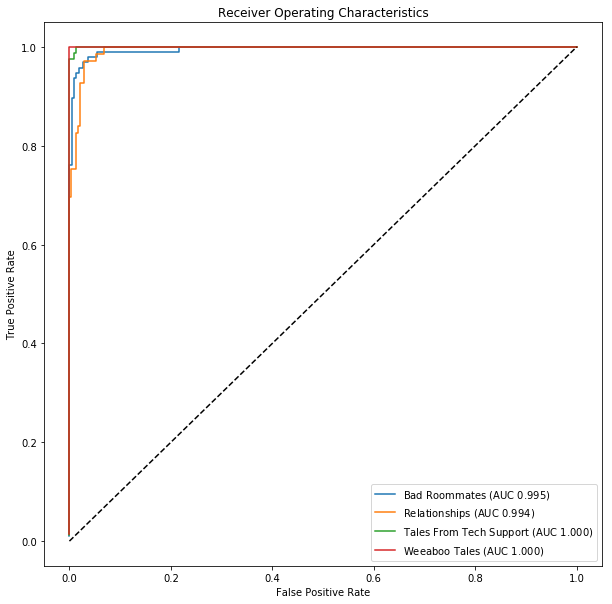

classical_reg  Regions:


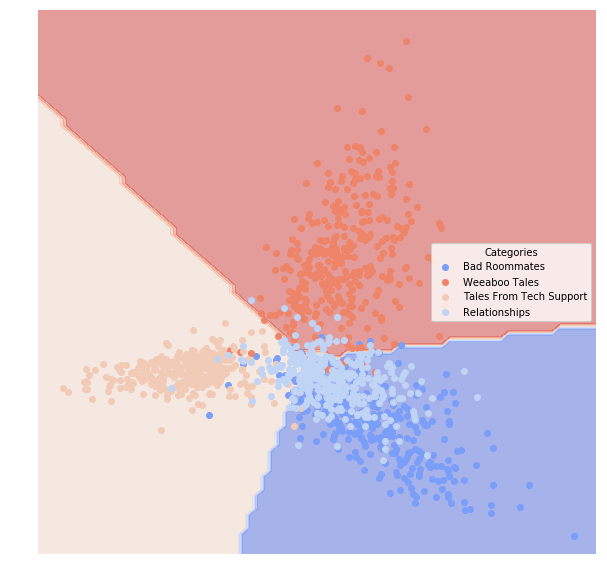

decision_tree  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.858511           0.732241    0.106583   0.860465   
Tales From Tech Support  0.897518           0.782284    0.072100   0.886076   
Weeaboo Tales            0.895324           0.725157    0.075235   0.819444   
Relationships            0.844551           0.578528    0.128527   0.670732   

                           Recall  
Category                           
Bad Roommates            0.770833  
Tales From Tech Support  0.833333  
Weeaboo Tales            0.842857  
Relationships            0.797101  
decision_tree  Confusion Matrix:


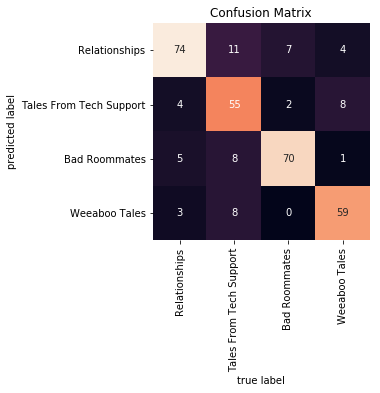

decision_tree  ROC:


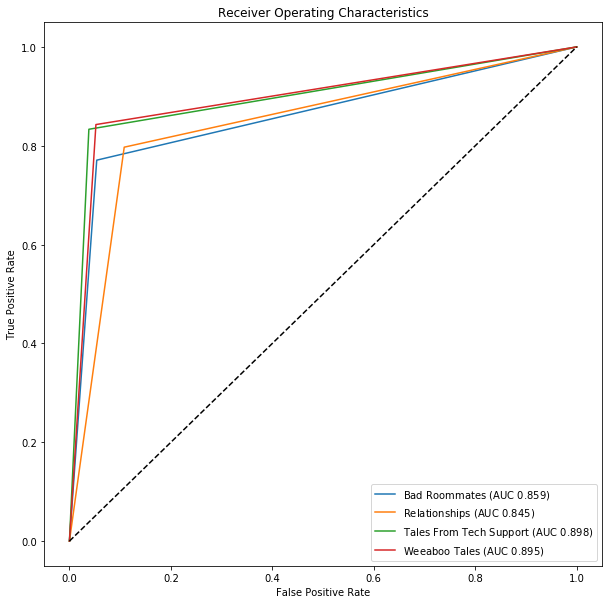

decision_tree  Regions:


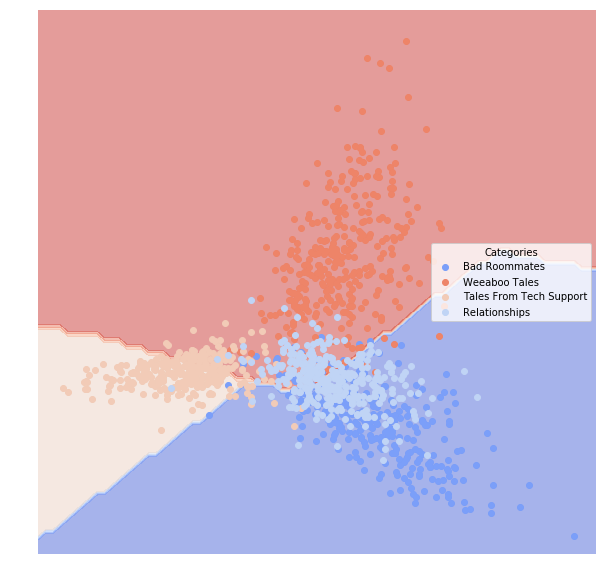

random_forest  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.889761           0.774794    0.087774   0.869565   
Tales From Tech Support  0.960030           0.924166    0.025078   0.975000   
Weeaboo Tales            0.929690           0.858794    0.037618   0.953125   
Relationships            0.888783           0.656815    0.100313   0.722892   

                           Recall  
Category                           
Bad Roommates            0.833333  
Tales From Tech Support  0.928571  
Weeaboo Tales            0.871429  
Relationships            0.869565  
random_forest  Confusion Matrix:


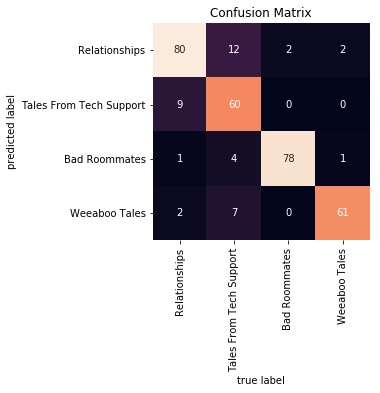

random_forest  ROC:


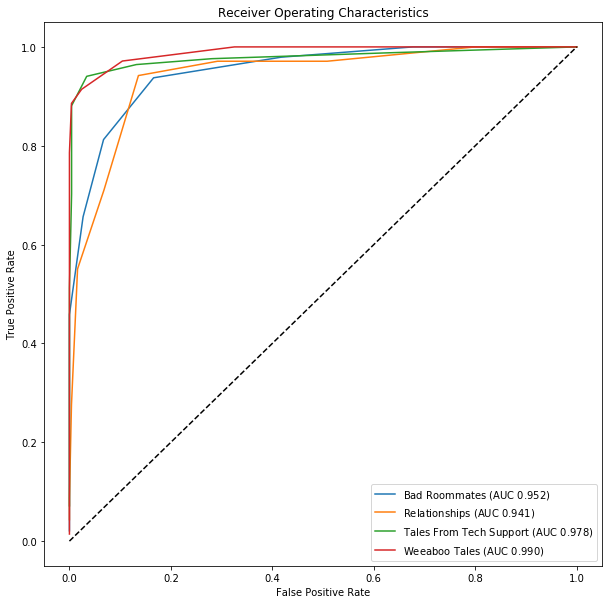

random_forest  Regions:


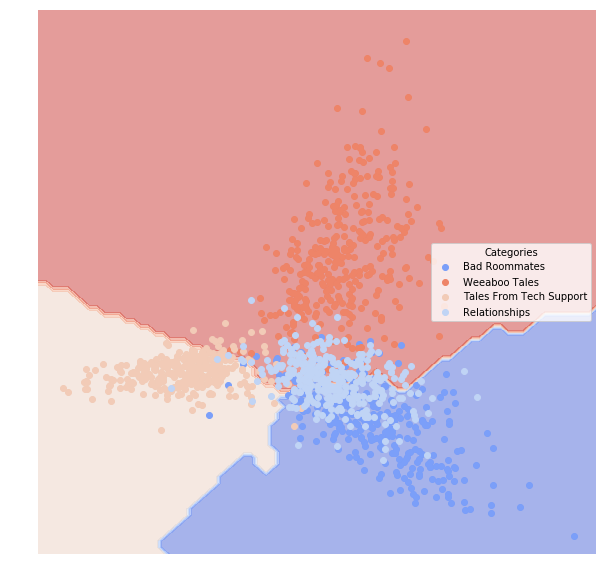

neural_network  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.964266           0.935928    0.025078   0.978261   
Tales From Tech Support  0.985968           0.970699    0.009404   0.987952   
Weeaboo Tales            1.000000           1.000000    0.000000   1.000000   
Relationships            0.962261           0.862518    0.034483   0.891892   

                           Recall  
Category                           
Bad Roommates            0.937500  
Tales From Tech Support  0.976190  
Weeaboo Tales            1.000000  
Relationships            0.956522  
neural_network  Confusion Matrix:


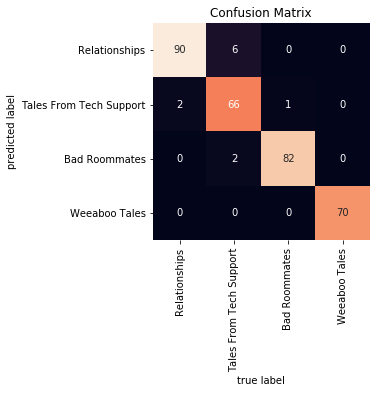

neural_network  ROC:


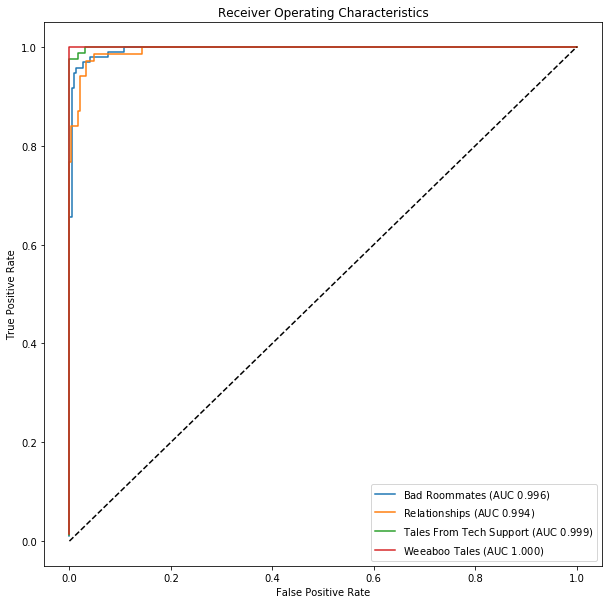

neural_network  Regions:


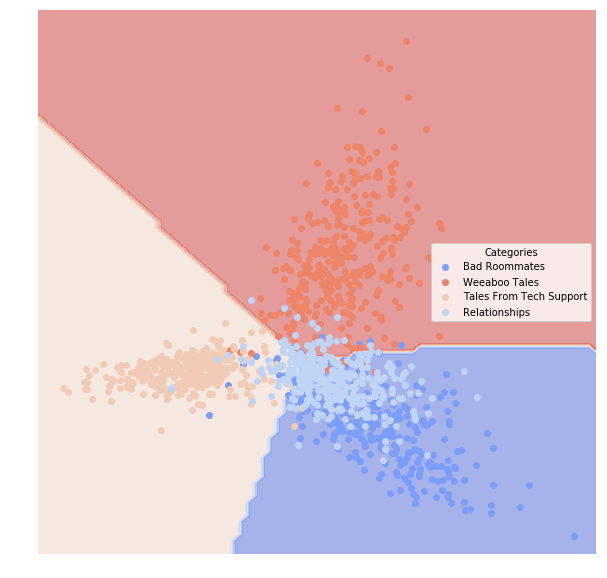

boosting  Evaluation:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Bad Roommates            0.944156           0.894628    0.040752   0.956044   
Tales From Tech Support  0.981712           0.948006    0.015674   0.964706   
Weeaboo Tales            0.977682           0.923730    0.018809   0.944444   
Relationships            0.931275           0.806594    0.050157   0.873239   

                           Recall  
Category                           
Bad Roommates            0.906250  
Tales From Tech Support  0.976190  
Weeaboo Tales            0.971429  
Relationships            0.898551  
boosting  Confusion Matrix:


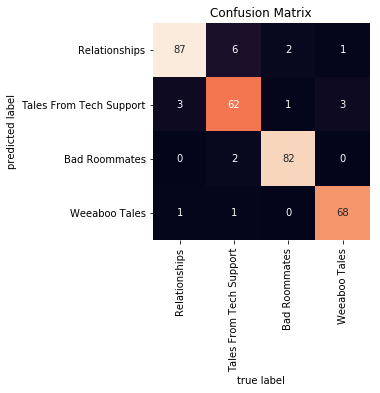

boosting  ROC:


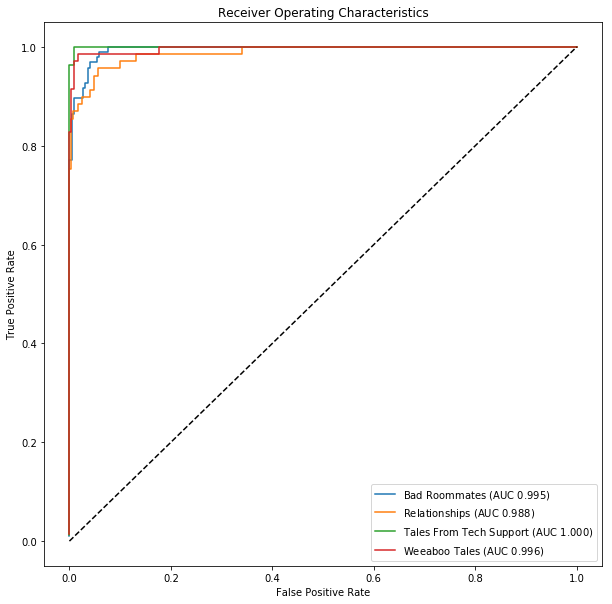

boosting  Regions:


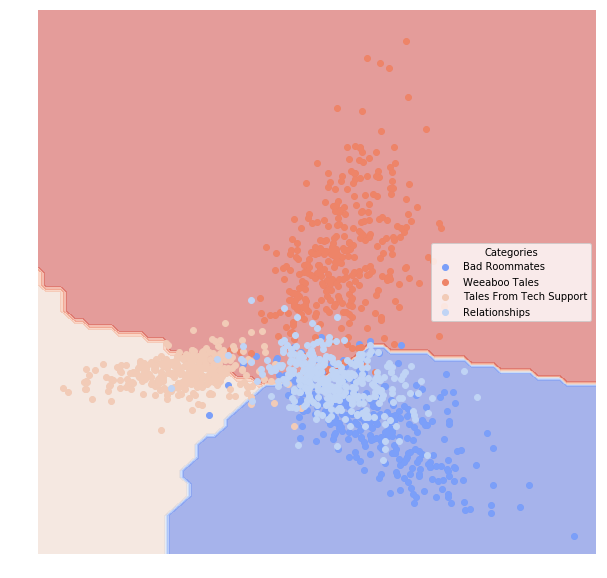

In [29]:
# Evaluation
reddit_evl = run_all_model(reddit_dfTrain, reddit_dfTest)

### Newsgroups

Loading data for: comp.sys.mac.hardware
Loading data for: comp.windows.x
Loading data for: misc.forsale
Loading data for: rec.autos
Converting to vectors


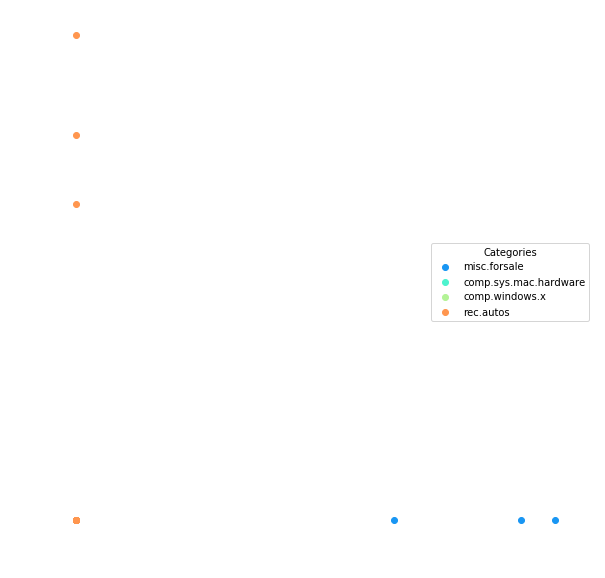

In [30]:
# Load the data
news_dfTrain, news_dfTest = lucem_illud.trainTestSplit(lucem_illud.loadNewsGroups())

# Visualize
lucem_illud.plotter(news_dfTrain)

bayes  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
misc.forsale           0.786543           0.566530    0.144681   0.737864   
comp.sys.mac.hardware  0.830168           0.575996    0.151064   0.661871   
comp.windows.x         0.918900           0.811942    0.057447   0.894737   
rec.autos              0.851905           0.678288    0.106383   0.807018   

                         Recall  
Category                         
misc.forsale           0.649573  
comp.sys.mac.hardware  0.793103  
comp.windows.x         0.871795  
rec.autos              0.766667  
bayes  Confusion Matrix:


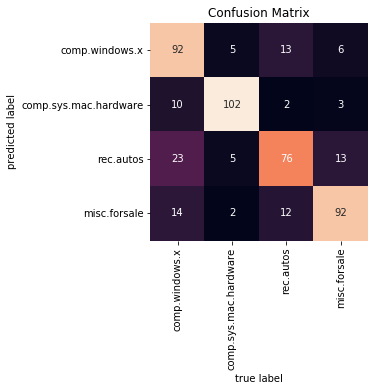

bayes  ROC:


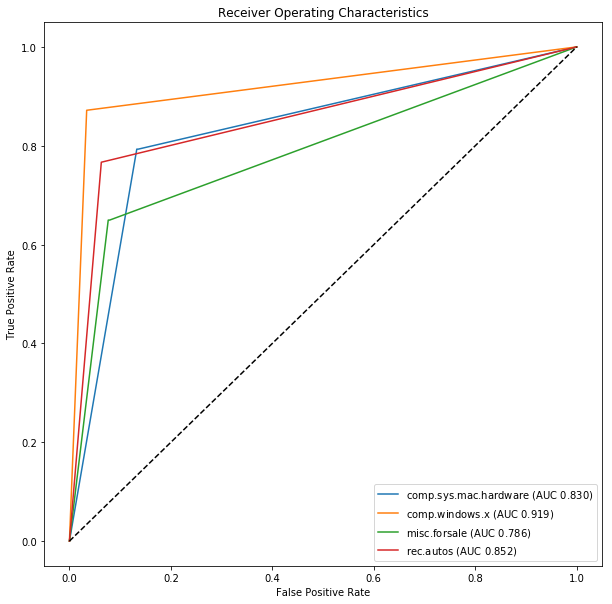

bayes  Regions:


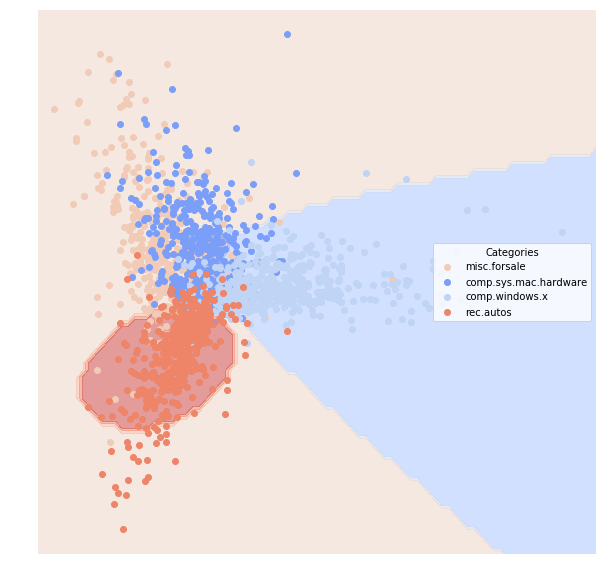

svm_linear  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
misc.forsale           0.873308           0.749219    0.078723   0.892157   
comp.sys.mac.hardware  0.879749           0.726919    0.085106   0.839286   
comp.windows.x         0.926007           0.832223    0.051064   0.911504   
rec.autos              0.905595           0.715770    0.095745   0.762238   

                         Recall  
Category                         
misc.forsale           0.777778  
comp.sys.mac.hardware  0.810345  
comp.windows.x         0.880342  
rec.autos              0.908333  
svm_linear  Confusion Matrix:


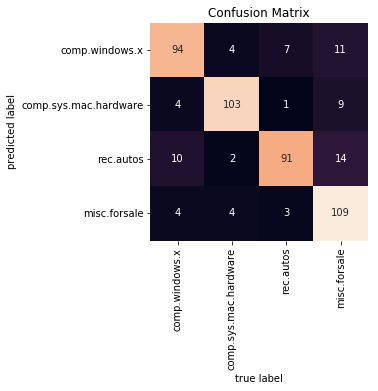

svm_linear  ROC:


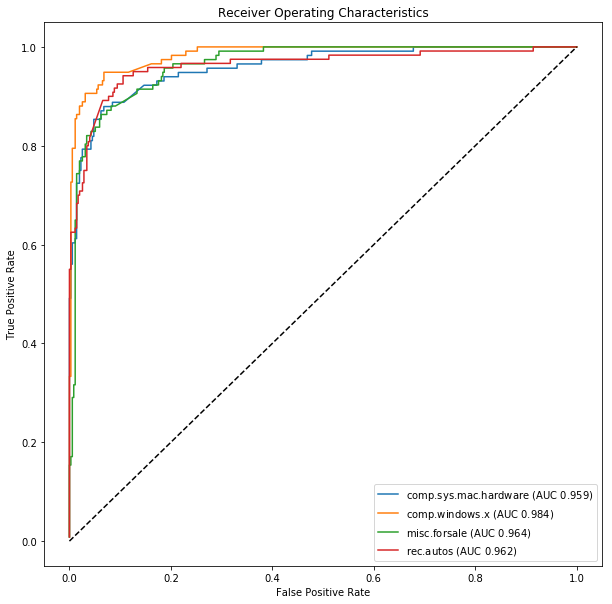

svm_linear  Regions:


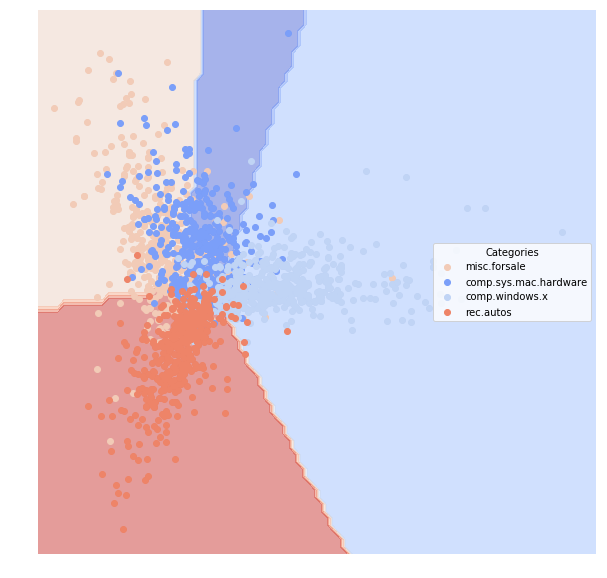

/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


svm_poly  Evaluation:
                       AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                                    
misc.forsale           0.5           0.248936    0.248936   0.000000     0.0
comp.sys.mac.hardware  0.5           0.246809    0.246809   0.000000     0.0
comp.windows.x         0.5           0.248936    0.751064   0.248936     1.0
rec.autos              0.5           0.255319    0.255319   0.000000     0.0
svm_poly  Confusion Matrix:


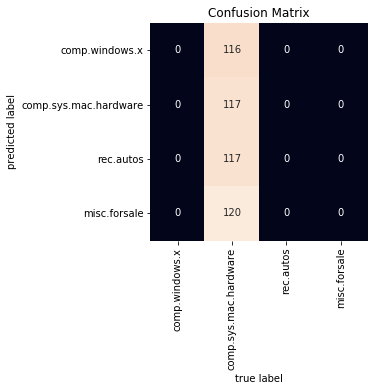

svm_poly  ROC:


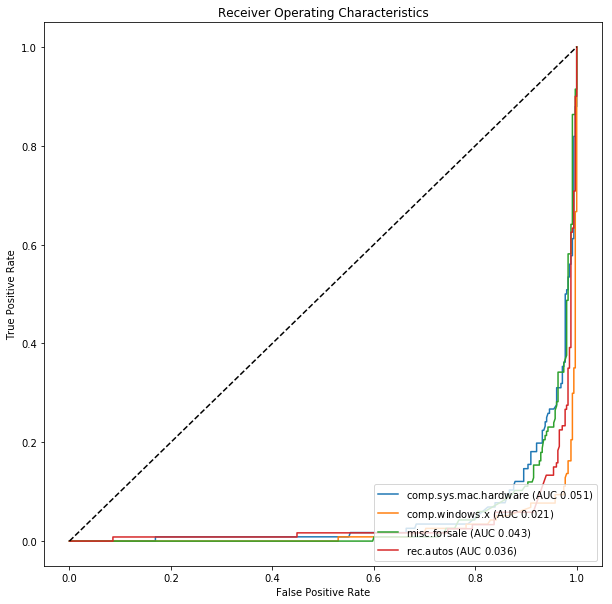

svm_poly  Regions:


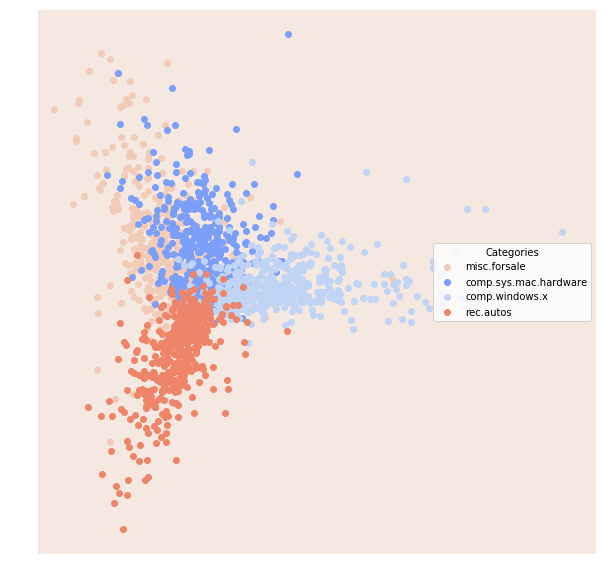

knn  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
misc.forsale           0.528498           0.286393    0.236170   0.875000   
comp.sys.mac.hardware  0.467806           0.235835    0.565957   0.226277   
comp.windows.x         0.551282           0.325968    0.223404   1.000000   
rec.autos              0.483571           0.249480    0.451064   0.238636   

                         Recall  
Category                         
misc.forsale           0.059829  
comp.sys.mac.hardware  0.534483  
comp.windows.x         0.102564  
rec.autos              0.350000  
knn  Confusion Matrix:


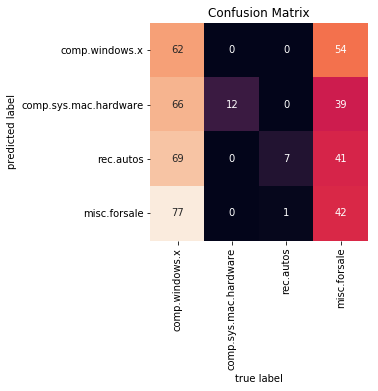

knn  ROC:


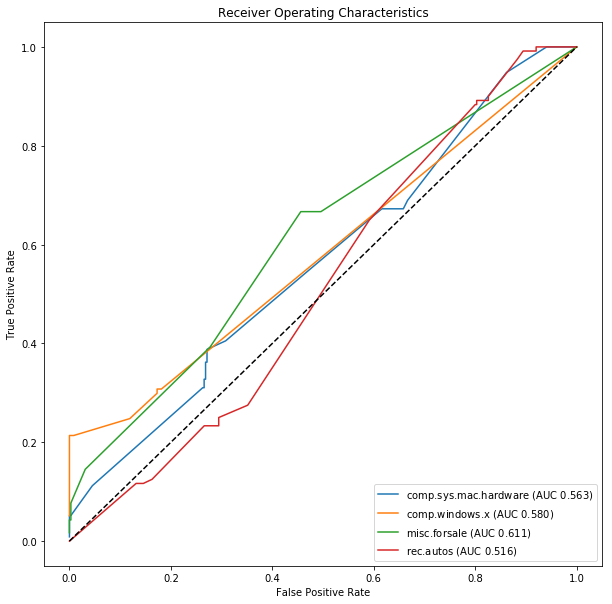

knn  Regions:


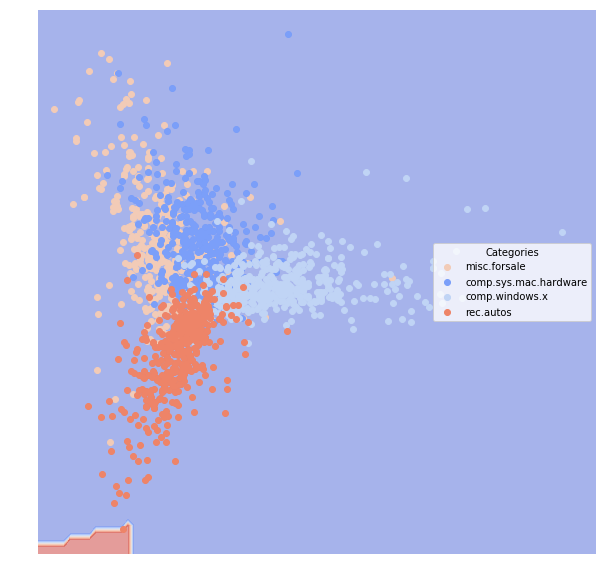

classical_reg  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
misc.forsale           0.879022           0.748451    0.078723   0.877358   
comp.sys.mac.hardware  0.889709           0.758458    0.074468   0.871560   
comp.windows.x         0.927423           0.839387    0.048936   0.919643   
rec.autos              0.911190           0.726405    0.091489   0.769231   

                         Recall  
Category                         
misc.forsale           0.794872  
comp.sys.mac.hardware  0.818966  
comp.windows.x         0.880342  
rec.autos              0.916667  
classical_reg  Confusion Matrix:


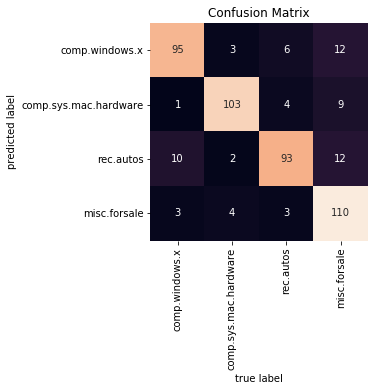

classical_reg  ROC:


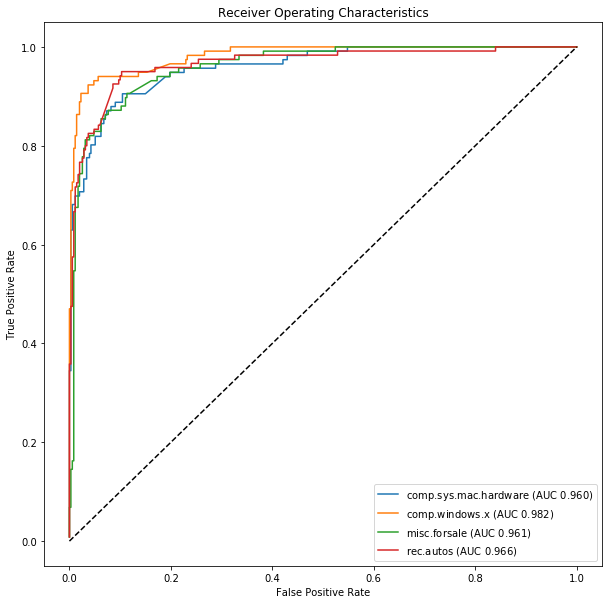

classical_reg  Regions:


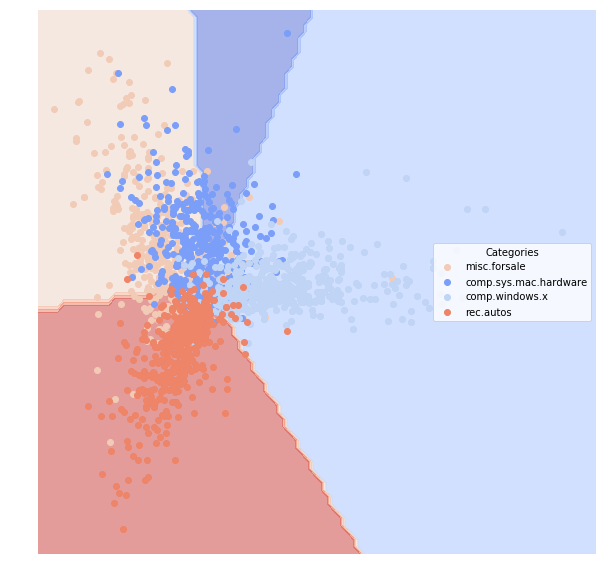

decision_tree  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
misc.forsale           0.773819           0.521962    0.168085   0.663793   
comp.sys.mac.hardware  0.769457           0.529010    0.159574   0.695238   
comp.windows.x         0.813600           0.606599    0.129787   0.759259   
rec.autos              0.818929           0.568617    0.159574   0.659574   

                         Recall  
Category                         
misc.forsale           0.658120  
comp.sys.mac.hardware  0.629310  
comp.windows.x         0.700855  
rec.autos              0.775000  
decision_tree  Confusion Matrix:


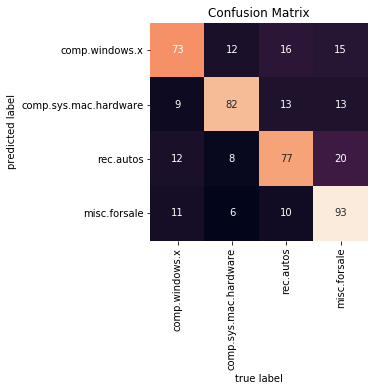

decision_tree  ROC:


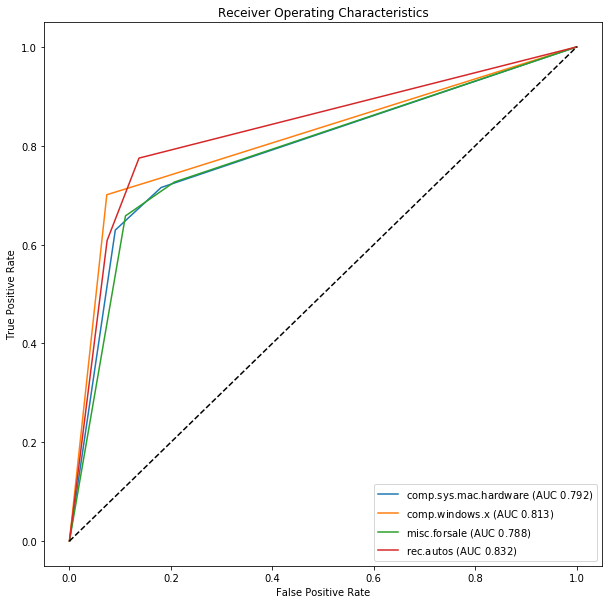

decision_tree  Regions:


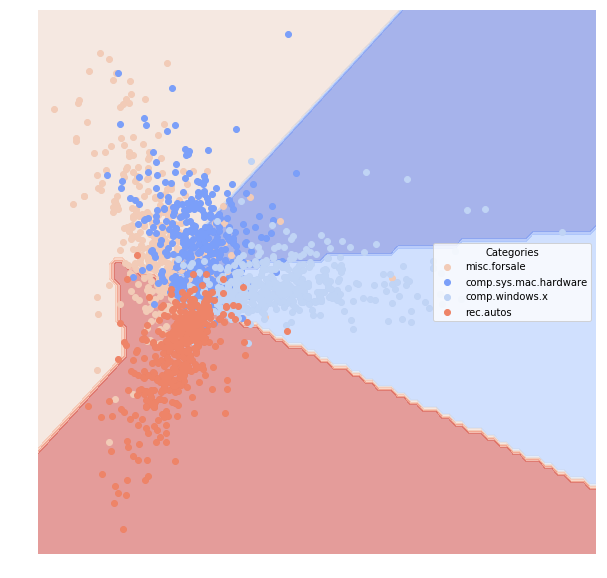

random_forest  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
misc.forsale           0.815017           0.611572    0.127660   0.766355   
comp.sys.mac.hardware  0.824006           0.607562    0.129787   0.739130   
comp.windows.x         0.877679           0.706607    0.093617   0.806723   
rec.autos              0.864048           0.667222    0.112766   0.759690   

                         Recall  
Category                         
misc.forsale           0.700855  
comp.sys.mac.hardware  0.732759  
comp.windows.x         0.820513  
rec.autos              0.816667  
random_forest  Confusion Matrix:


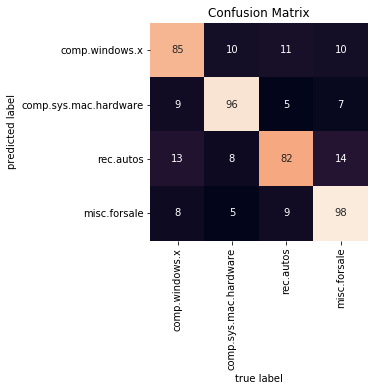

random_forest  ROC:


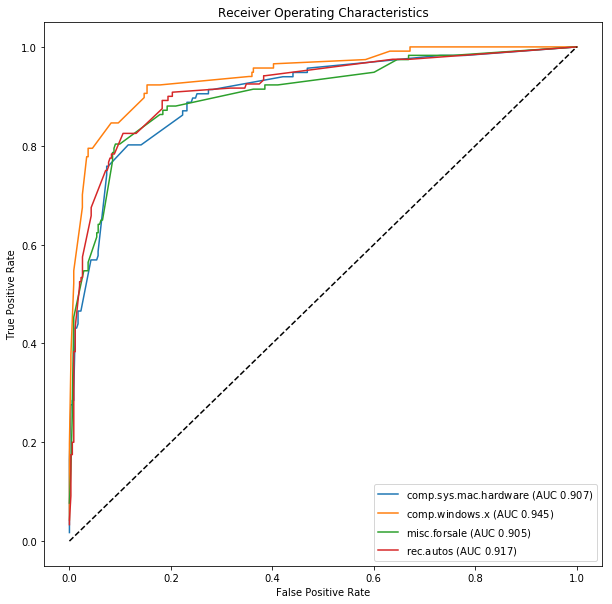

random_forest  Regions:


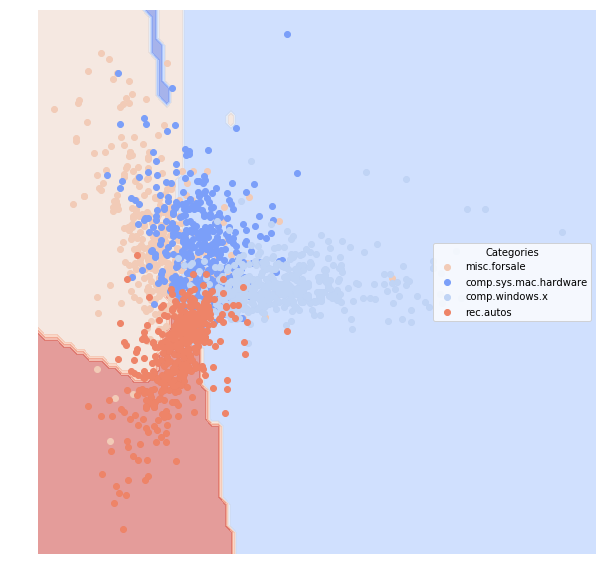

neural_network  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
misc.forsale           0.884712           0.761402    0.074468   0.886792   
comp.sys.mac.hardware  0.905611           0.764609    0.072340   0.847458   
comp.windows.x         0.934554           0.844930    0.046809   0.913043   
rec.autos              0.905952           0.744546    0.082979   0.809160   

                         Recall  
Category                         
misc.forsale           0.803419  
comp.sys.mac.hardware  0.862069  
comp.windows.x         0.897436  
rec.autos              0.883333  
neural_network  Confusion Matrix:


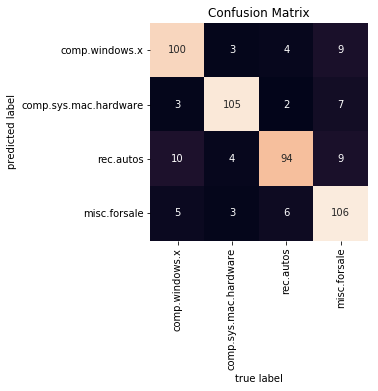

neural_network  ROC:


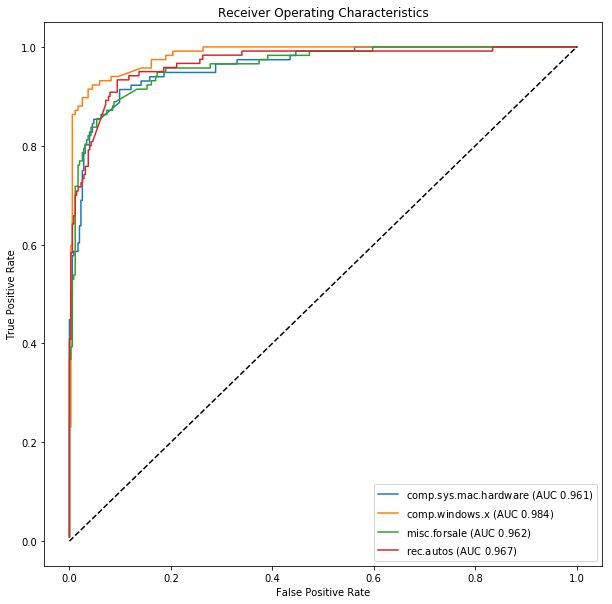

neural_network  Regions:


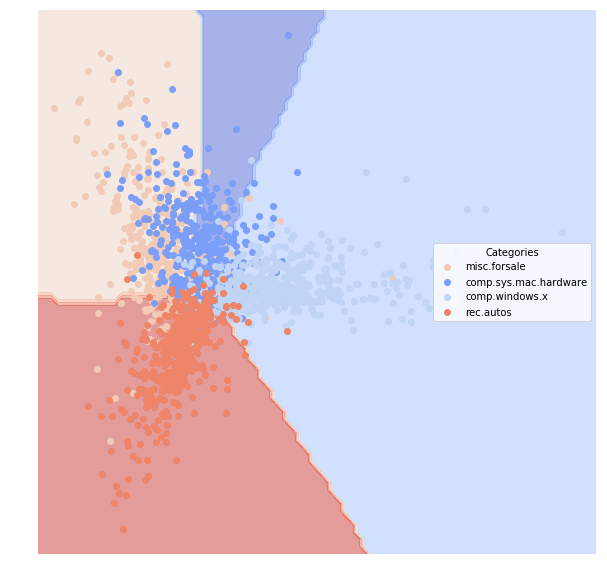

boosting  Evaluation:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
misc.forsale           0.839241           0.642299    0.117021   0.771930   
comp.sys.mac.hardware  0.835233           0.658644    0.108511   0.815534   
comp.windows.x         0.879047           0.735494    0.082979   0.854545   
rec.autos              0.855238           0.625304    0.134043   0.699301   

                         Recall  
Category                         
misc.forsale           0.752137  
comp.sys.mac.hardware  0.724138  
comp.windows.x         0.803419  
rec.autos              0.833333  
boosting  Confusion Matrix:


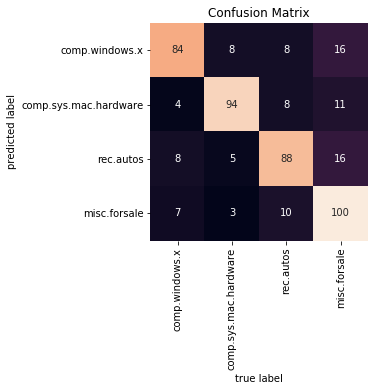

boosting  ROC:


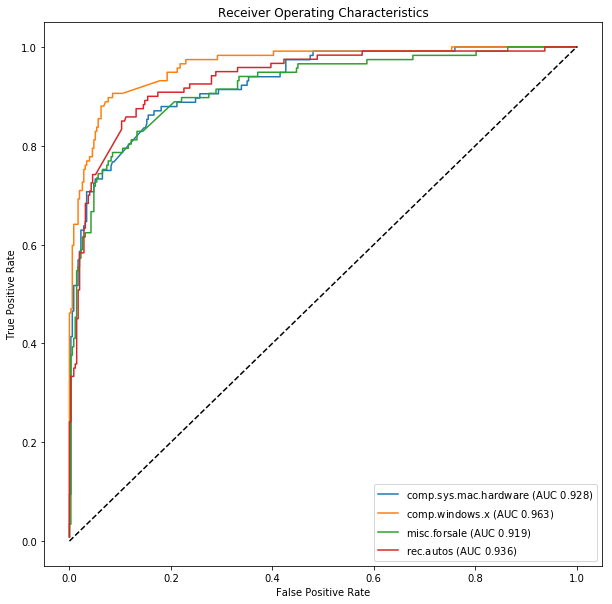

boosting  Regions:


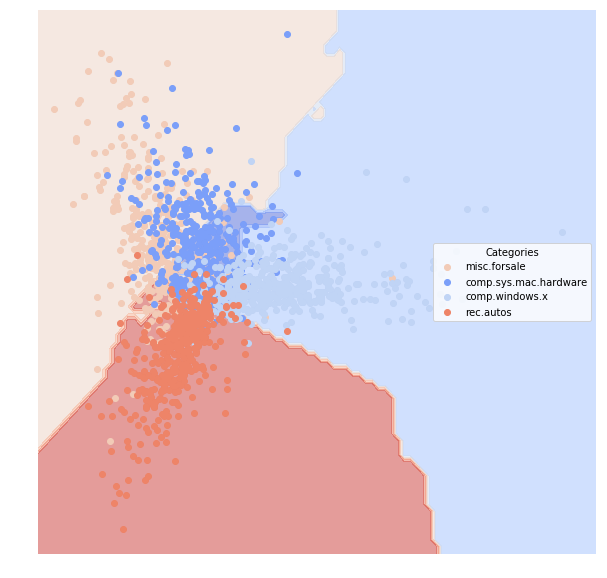

In [31]:
# Evaluation
news_evl = run_all_model(news_dfTrain, news_dfTest)

### Senate Small

Loading senate data
Converting to vectors


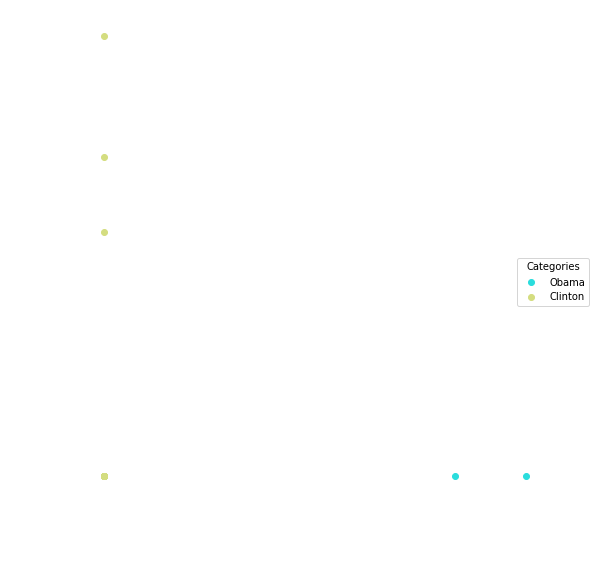

In [32]:
# Load the data
senate_s_dfTrain, senate_s_dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())

# Visualize
lucem_illud.plotter(senate_s_dfTrain)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.815591           0.732707    0.181818   0.807947  0.787097
Clinton   0.815591           0.782526    0.181818   0.826316  0.844086
bayes  Confusion Matrix:


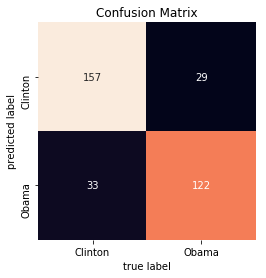

bayes  ROC:


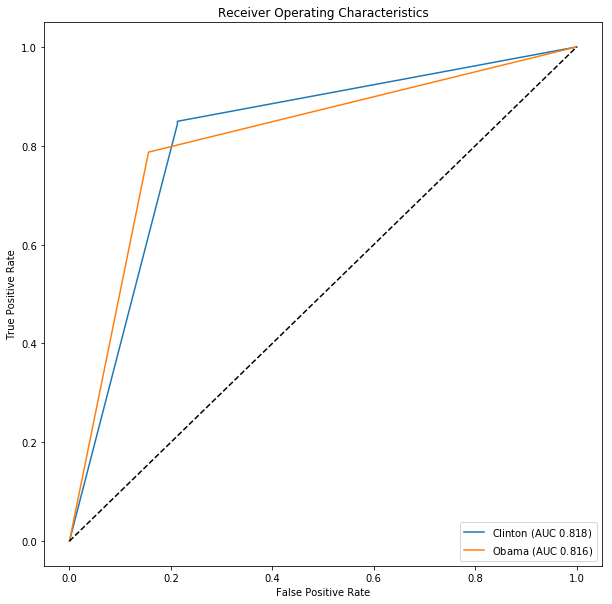

bayes  Regions:


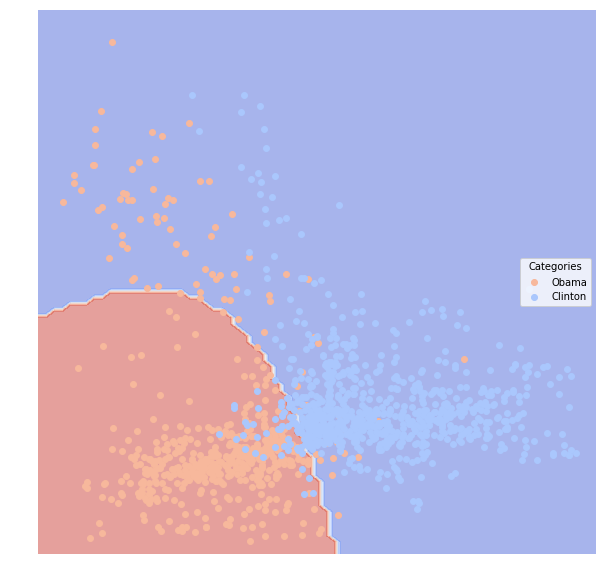

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.987097           0.985924     0.01173   1.000000  0.974194
Clinton   0.987097           0.978947     0.01173   0.978947  1.000000
svm_linear  Confusion Matrix:


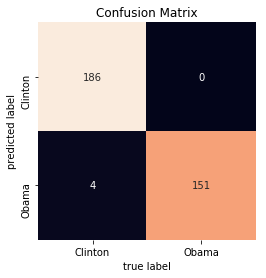

svm_linear  ROC:


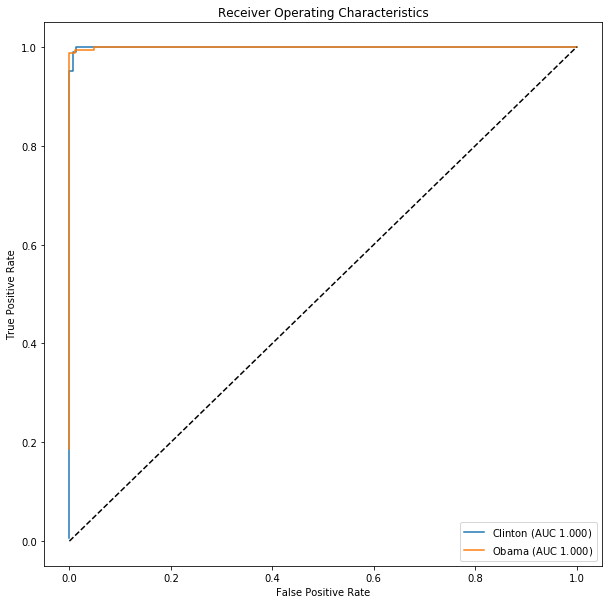

svm_linear  Regions:


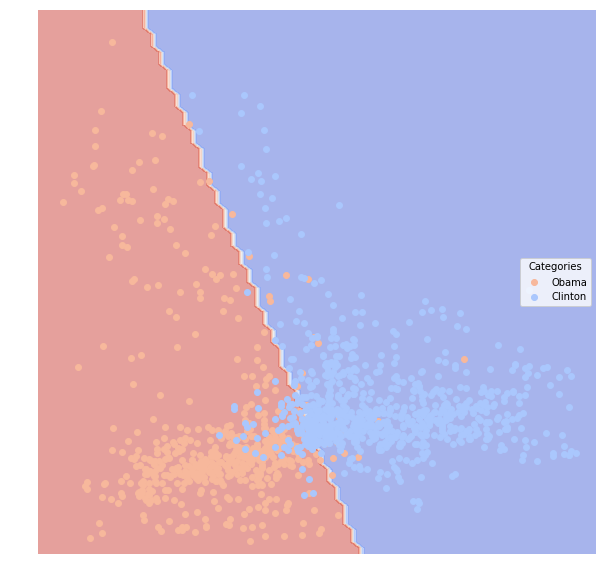

/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


svm_poly  Evaluation:
          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
Obama     0.5           0.454545    0.454545   0.000000     0.0
Clinton   0.5           0.545455    0.454545   0.545455     1.0
svm_poly  Confusion Matrix:


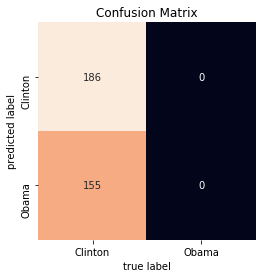

svm_poly  ROC:


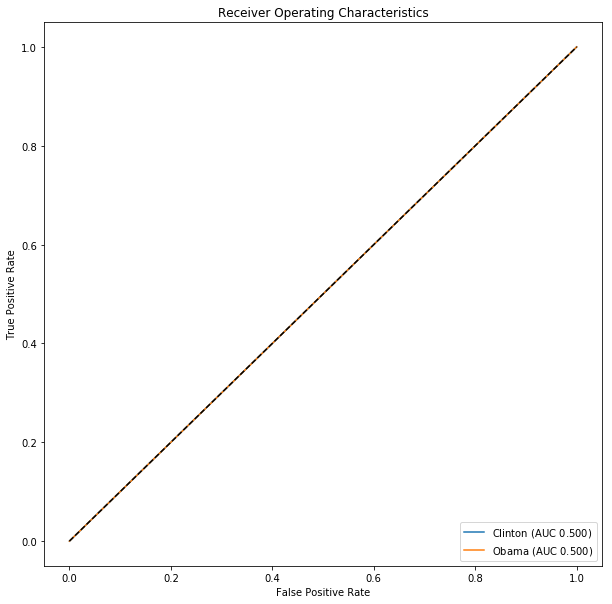

svm_poly  Regions:


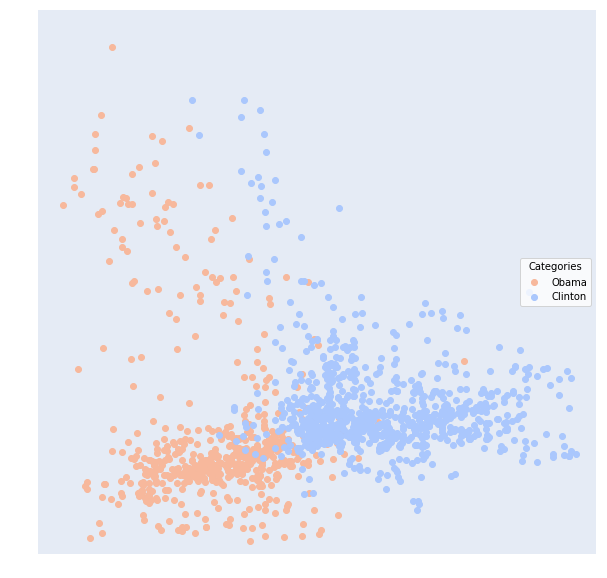

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.858065           0.784679    0.140762   0.845161  0.845161
Clinton   0.858065           0.828966    0.140762   0.870968  0.870968
knn  Confusion Matrix:


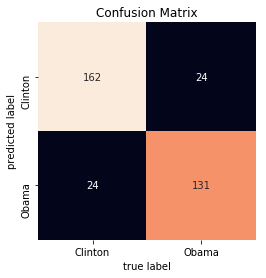

knn  ROC:


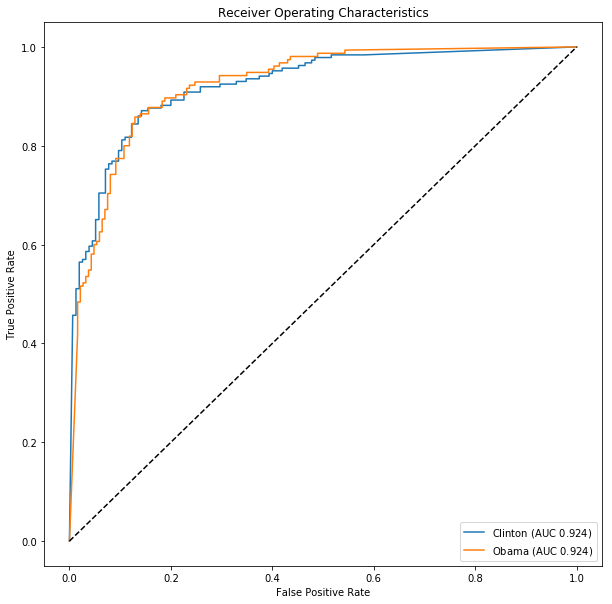

knn  Regions:


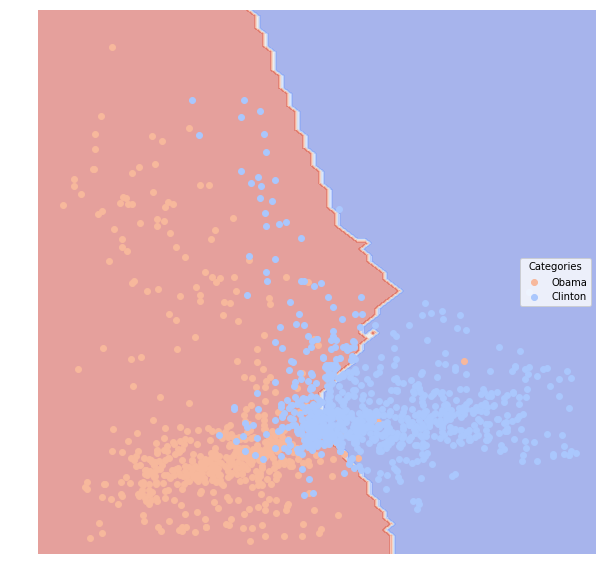

classical_reg  Evaluation:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
Obama     0.96129           0.957771    0.035191   1.000000  0.922581
Clinton   0.96129           0.939394    0.035191   0.939394  1.000000
classical_reg  Confusion Matrix:


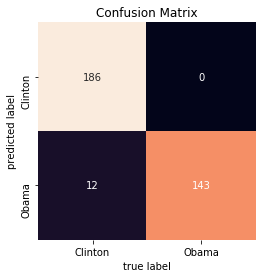

classical_reg  ROC:


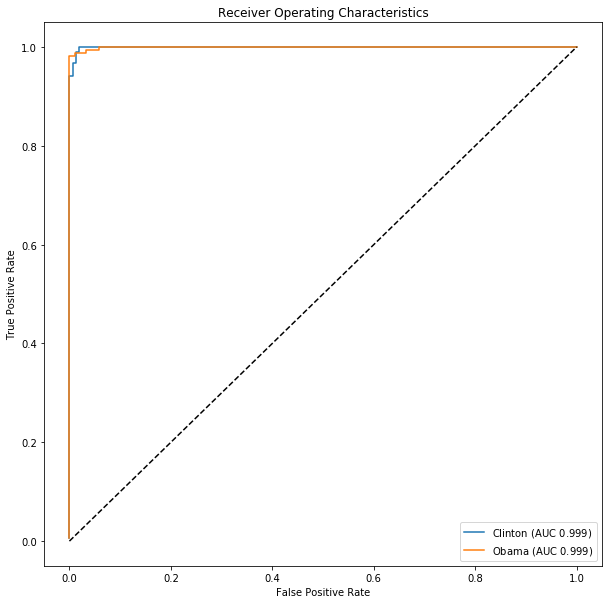

classical_reg  Regions:


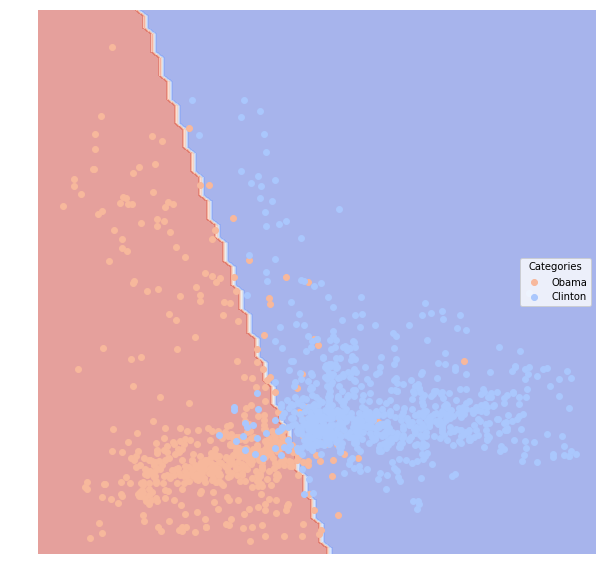

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.987097           0.985924     0.01173   1.000000  0.974194
Clinton   0.987097           0.978947     0.01173   0.978947  1.000000
decision_tree  Confusion Matrix:


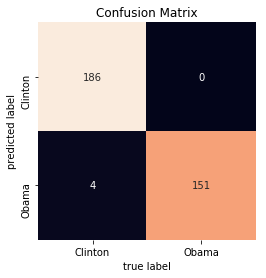

decision_tree  ROC:


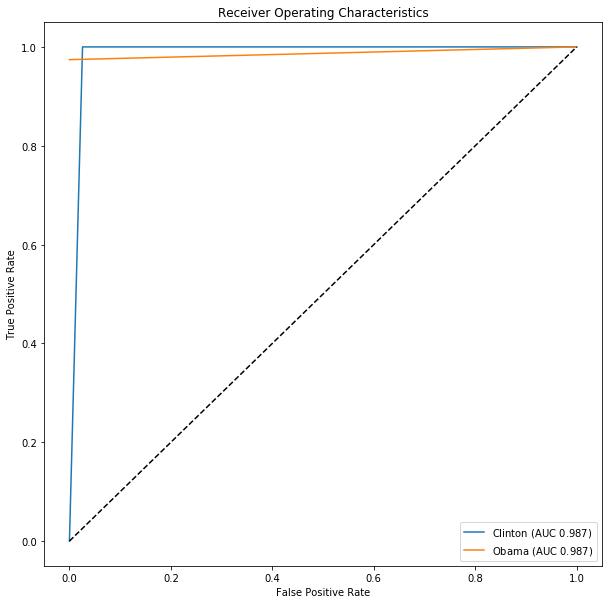

decision_tree  Regions:


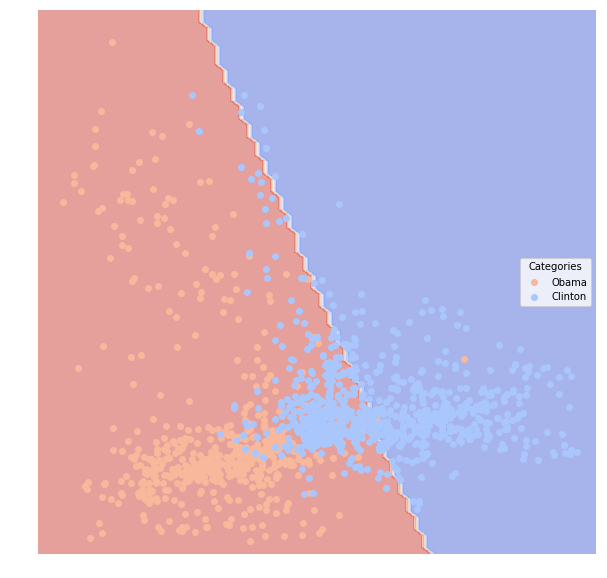

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.961828           0.954883    0.035191   0.993103  0.929032
Clinton   0.961828           0.941735    0.035191   0.943878  0.994624
random_forest  Confusion Matrix:


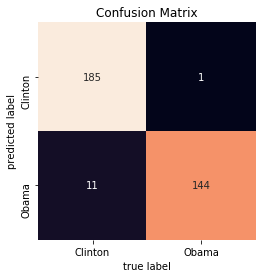

random_forest  ROC:


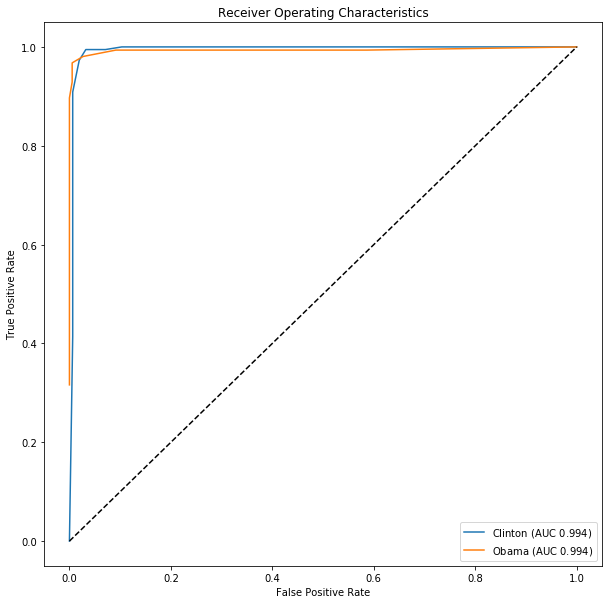

random_forest  Regions:


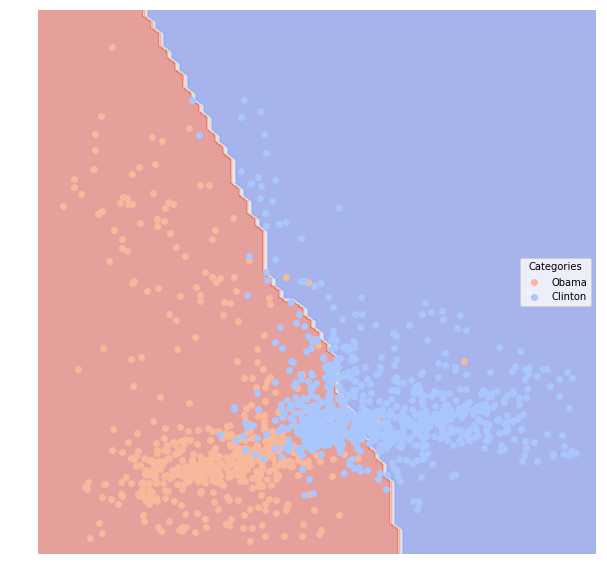

neural_network  Evaluation:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
Obama     0.92957           0.900699    0.067449   0.952055  0.896774
Clinton   0.92957           0.903930    0.067449   0.917949  0.962366
neural_network  Confusion Matrix:


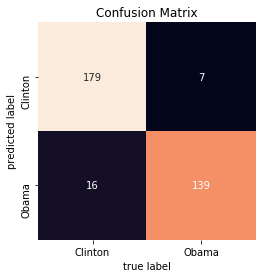

neural_network  ROC:


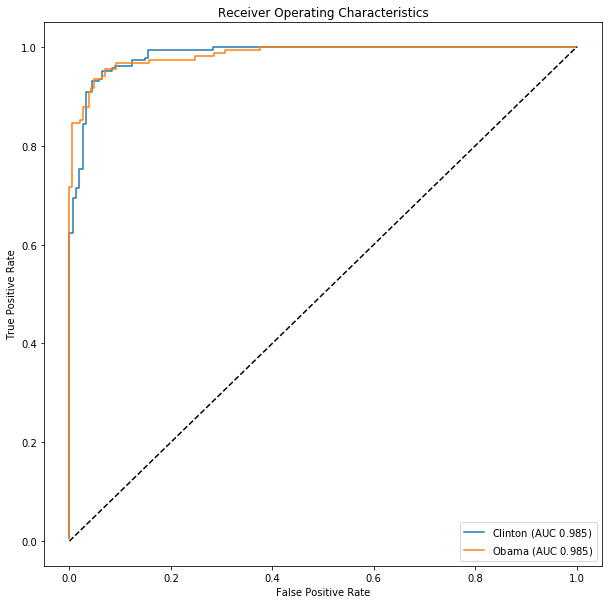

neural_network  Regions:


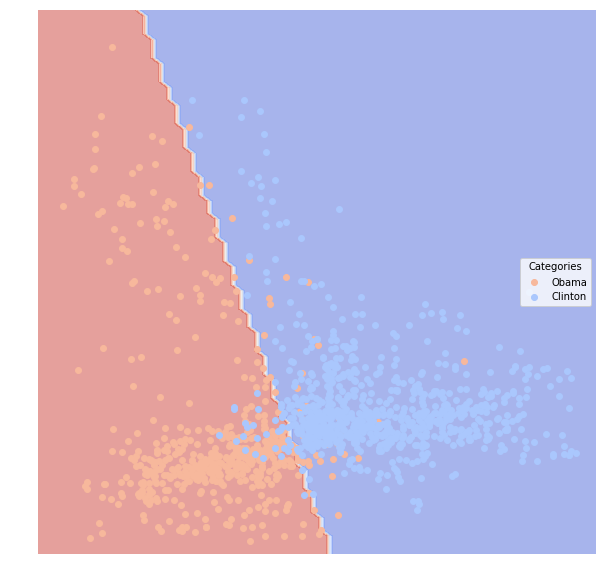

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.993548           0.992962    0.005865   1.000000  0.987097
Clinton   0.993548           0.989362    0.005865   0.989362  1.000000
boosting  Confusion Matrix:


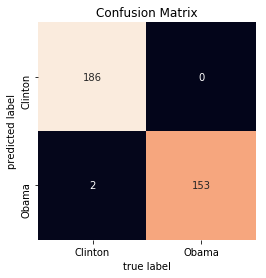

boosting  ROC:


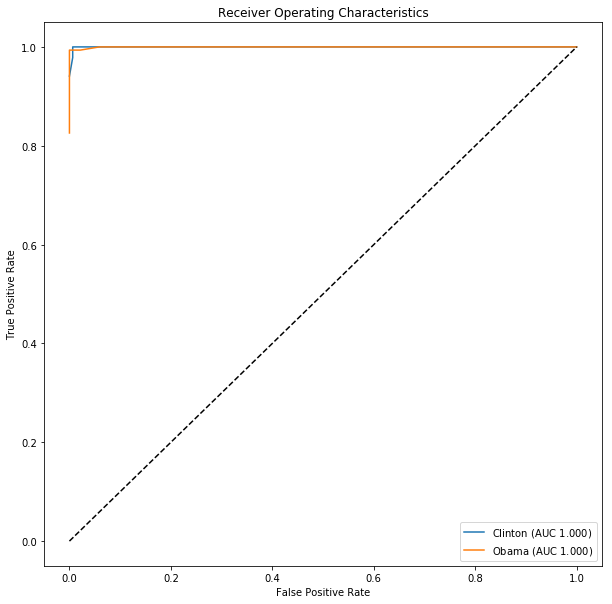

boosting  Regions:


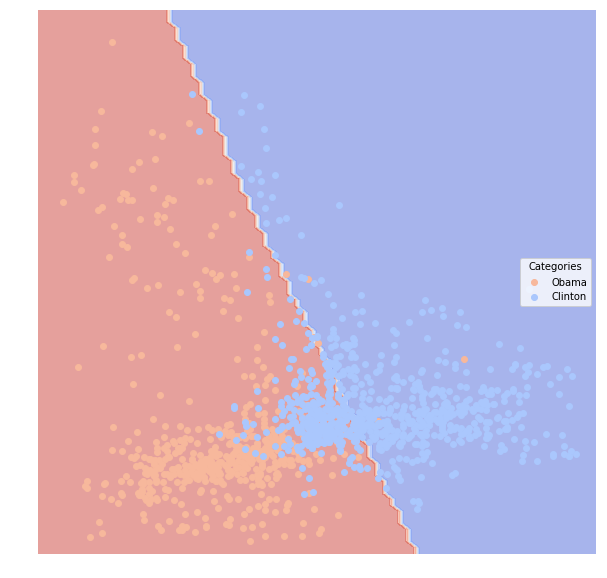

In [33]:
# Evaluation
senate_s_evl = run_all_model(senate_s_dfTrain, senate_s_dfTest)

### Senate Large

Loading senator: Kennedy
Loading senator: Kerry
Loading senator: Klobuchar
Loading senator: Kohl
Loading senator: Kyl
Converting to vectors


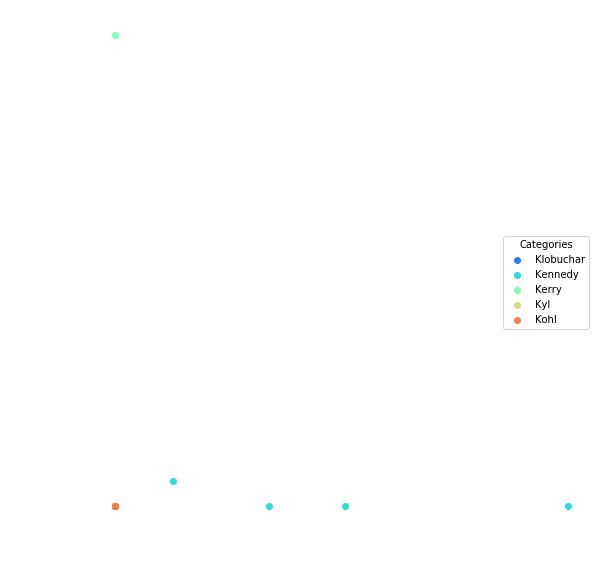

In [34]:
# Load the data
senate_l_dfTrain, senate_l_dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateLarge())

# Visuzlize
lucem_illud.plotter(senate_l_dfTrain)

bayes  Evaluation:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kohl       0.732066           0.488635    0.041026   0.964286  0.465517
Klobuchar  0.691915           0.420695    0.061538   0.935484  0.386667
Kerry      0.772290           0.561648    0.158974   0.738636  0.625000
Kyl        0.704437           0.428588    0.075641   0.863636  0.417582
Kennedy    0.773627           0.645192    0.244872   0.656687  0.945402
bayes  Confusion Matrix:


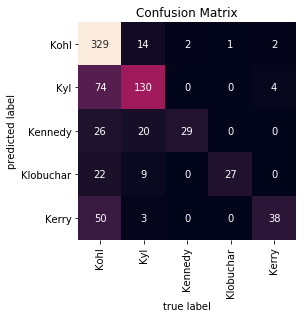

bayes  ROC:


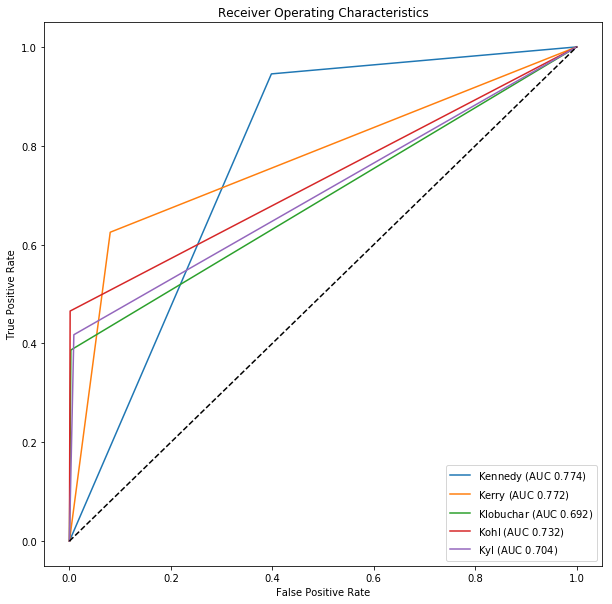

bayes  Regions:


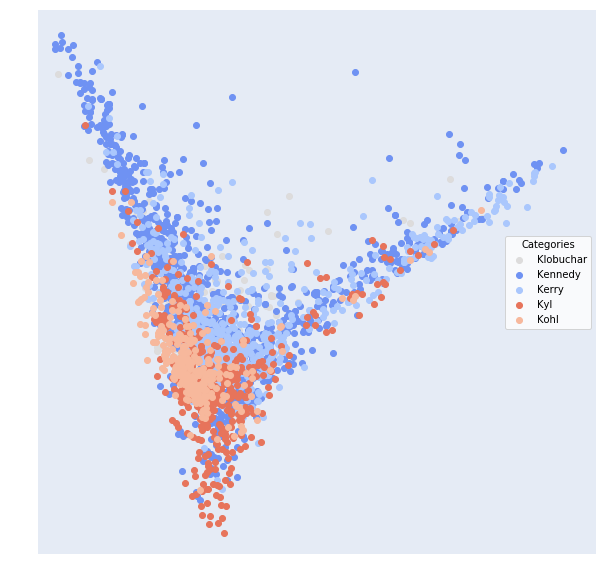

svm_linear  Evaluation:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kohl       1.000000           1.000000    0.000000   1.000000  1.000000
Klobuchar  0.973333           0.951795    0.005128   1.000000  0.946667
Kerry      0.970061           0.942370    0.019231   0.980100  0.947115
Kyl        0.977296           0.950308    0.006410   0.988636  0.956044
Kennedy    0.973420           0.944482    0.028205   0.950276  0.988506
svm_linear  Confusion Matrix:


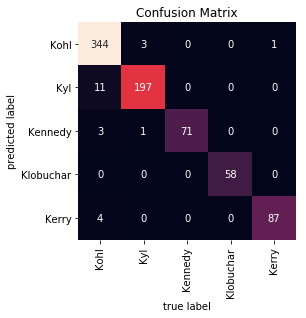

svm_linear  ROC:


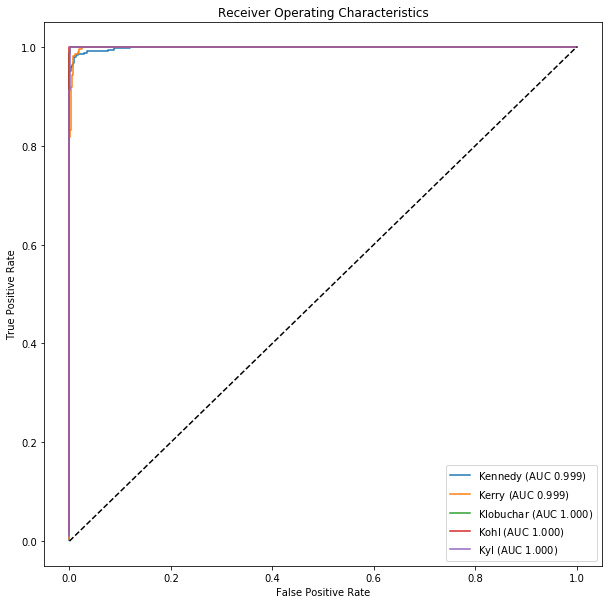

svm_linear  Regions:


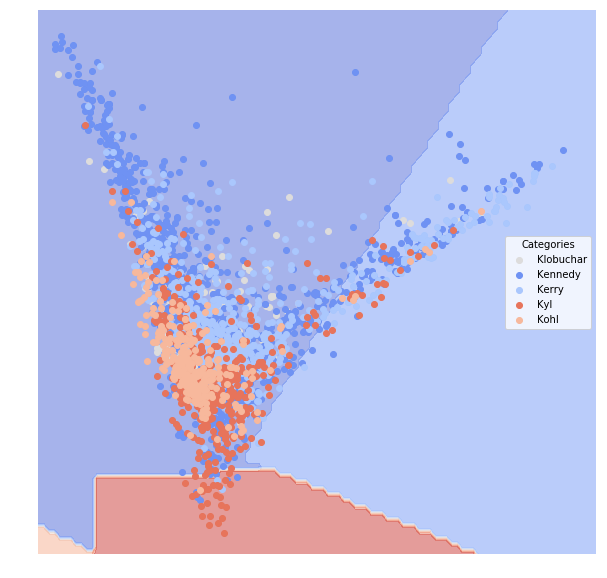

/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


svm_poly  Evaluation:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
Kohl       0.5           0.074359    0.074359   0.000000     0.0
Klobuchar  0.5           0.096154    0.096154   0.000000     0.0
Kerry      0.5           0.266667    0.266667   0.000000     0.0
Kyl        0.5           0.116667    0.116667   0.000000     0.0
Kennedy    0.5           0.446154    0.553846   0.446154     1.0
svm_poly  Confusion Matrix:


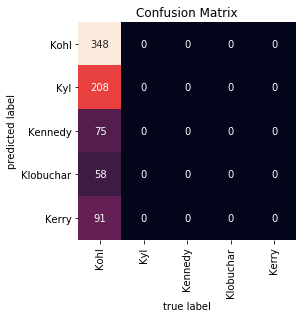

svm_poly  ROC:


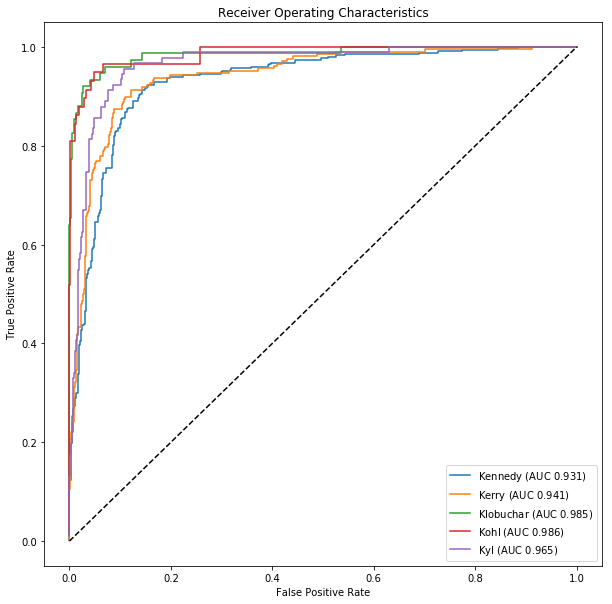

svm_poly  Regions:


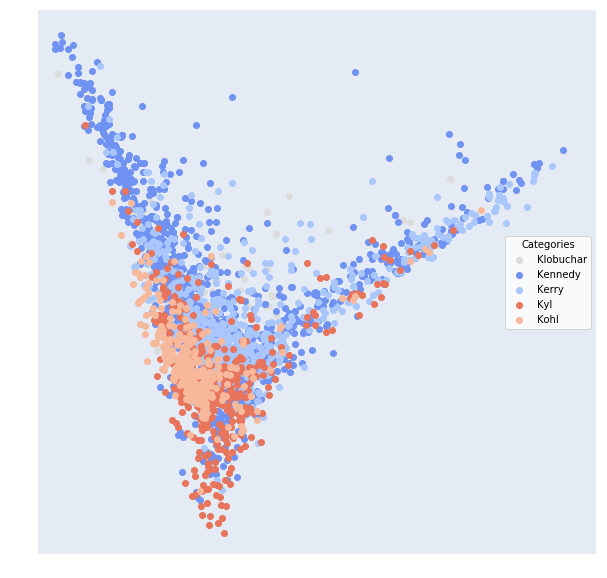

knn  Evaluation:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kohl       0.802727           0.503627    0.042308   0.765957  0.620690
Klobuchar  0.888369           0.723745    0.029487   0.893939  0.786667
Kerry      0.823864           0.637760    0.128205   0.781250  0.721154
Kyl        0.851752           0.623016    0.051282   0.814815  0.725275
Kennedy    0.858557           0.762681    0.146154   0.796954  0.902299
knn  Confusion Matrix:


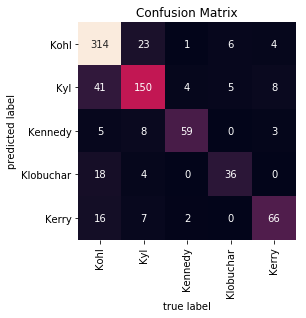

knn  ROC:


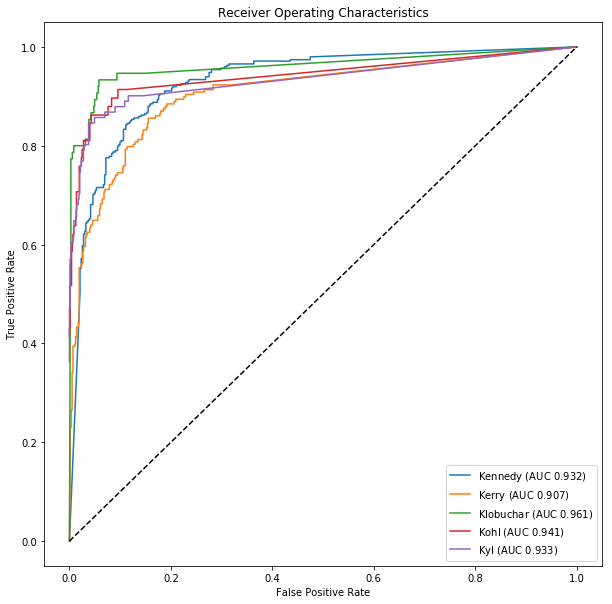

knn  Regions:


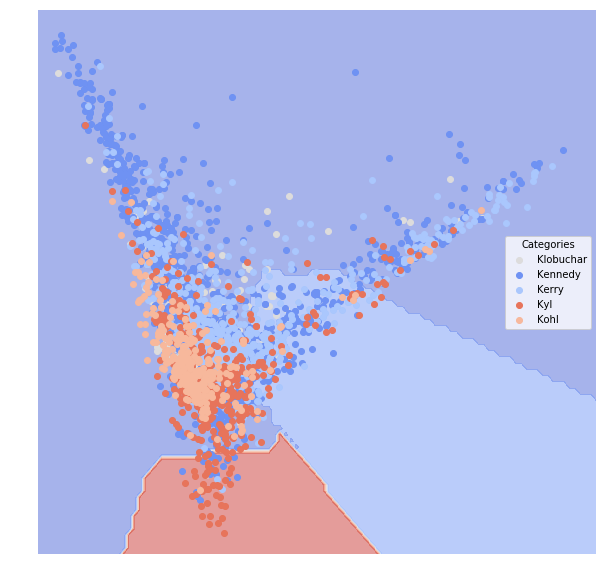

classical_reg  Evaluation:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kohl       0.982759           0.968081    0.002564   1.000000  0.965517
Klobuchar  0.966667           0.939744    0.006410   1.000000  0.933333
Kerry      0.943400           0.893522    0.035897   0.963918  0.899038
Kyl        0.912088           0.844689    0.020513   1.000000  0.824176
Kennedy    0.951988           0.896100    0.052564   0.898701  0.994253
classical_reg  Confusion Matrix:


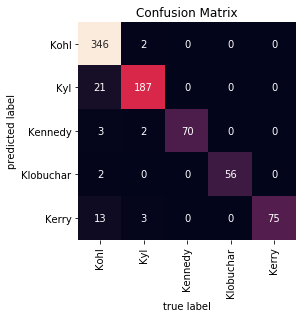

classical_reg  ROC:


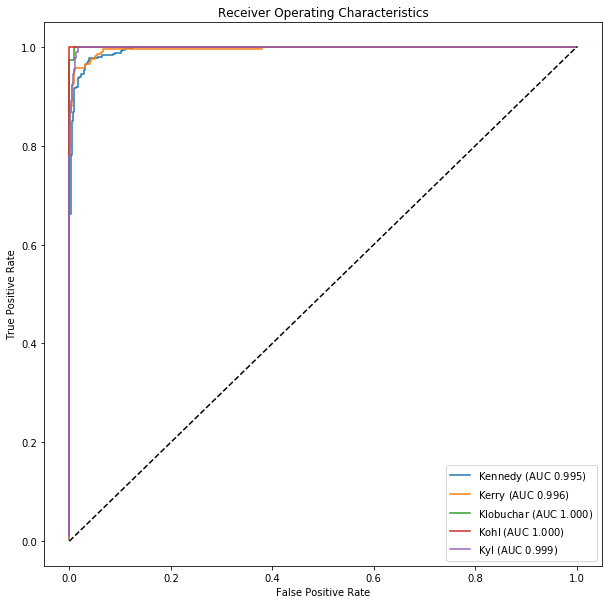

classical_reg  Regions:


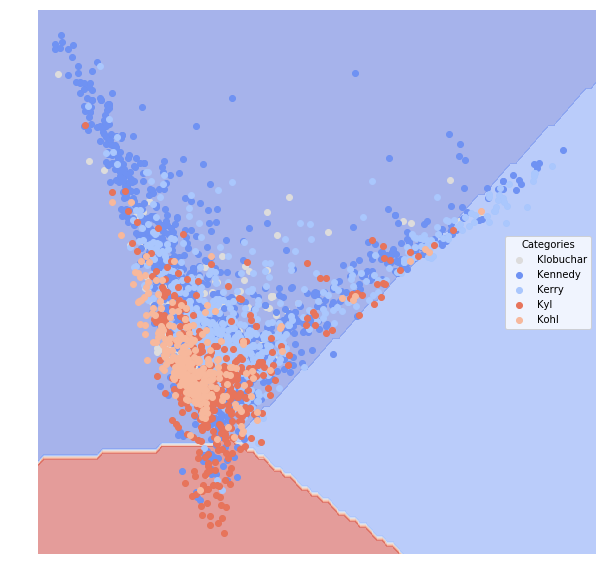

decision_tree  Evaluation:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
Kohl       1.0                1.0         0.0        1.0     1.0
Klobuchar  1.0                1.0         0.0        1.0     1.0
Kerry      1.0                1.0         0.0        1.0     1.0
Kyl        1.0                1.0         0.0        1.0     1.0
Kennedy    1.0                1.0         0.0        1.0     1.0
decision_tree  Confusion Matrix:


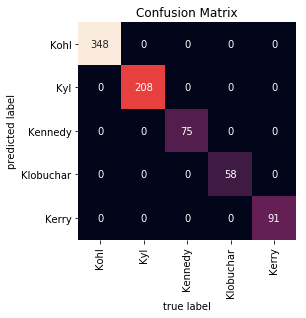

decision_tree  ROC:


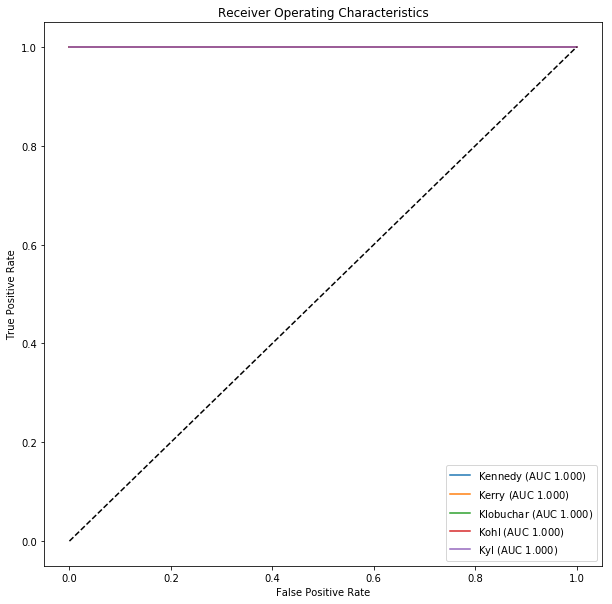

decision_tree  Regions:


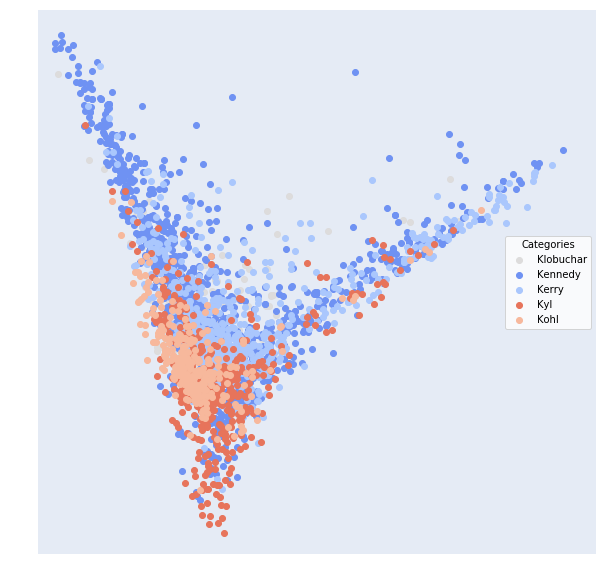

random_forest  Evaluation:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kohl       0.964825           0.919235    0.006410   0.981818  0.931034
Klobuchar  0.972624           0.938647    0.006410   0.986111  0.946667
Kerry      0.986888           0.967036    0.010256   0.980769  0.980769
Kyl        0.994505           0.990293    0.001282   1.000000  0.989011
Kennedy    0.984116           0.967299    0.016667   0.971831  0.991379
random_forest  Confusion Matrix:


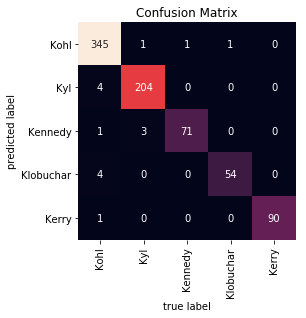

random_forest  ROC:


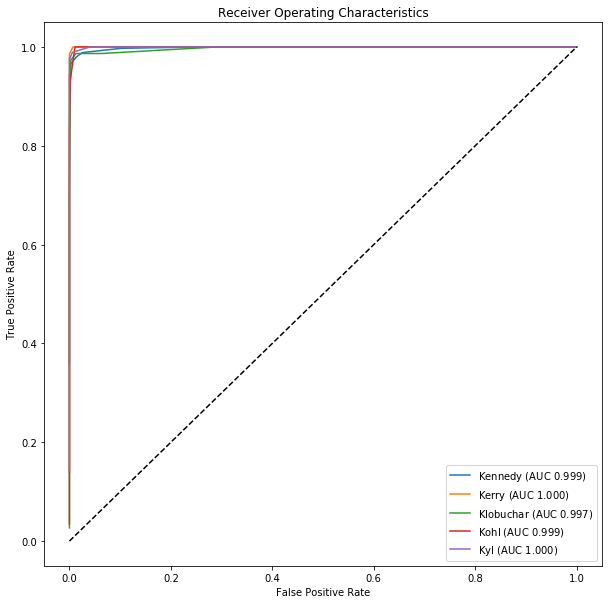

random_forest  Regions:


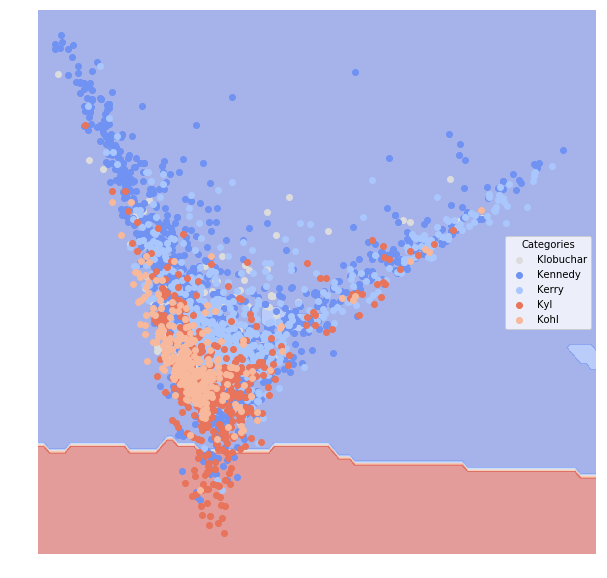

neural_network  Evaluation:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kohl       0.990687           0.967097    0.002564   0.982759  0.982759
Klobuchar  0.953333           0.915641    0.008974   1.000000  0.906667
Kerry      0.947552           0.872584    0.041026   0.923077  0.923077
Kyl        0.954593           0.900883    0.012821   0.976471  0.912088
Kennedy    0.959012           0.922204    0.042308   0.936288  0.971264
neural_network  Confusion Matrix:


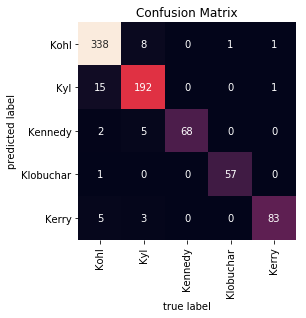

neural_network  ROC:


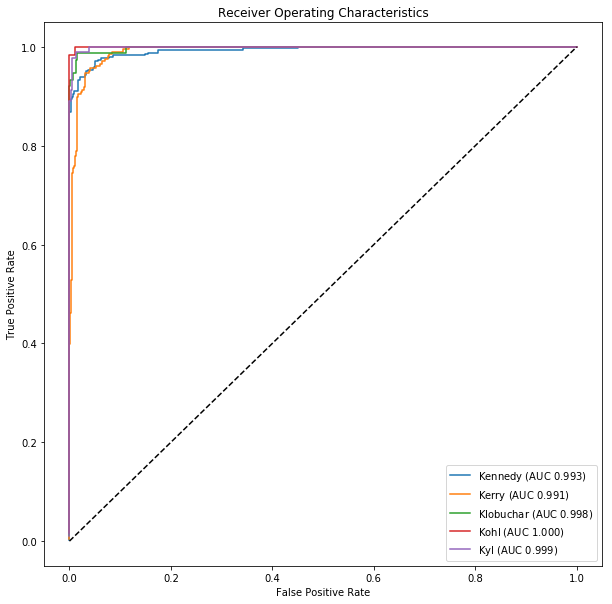

neural_network  Regions:


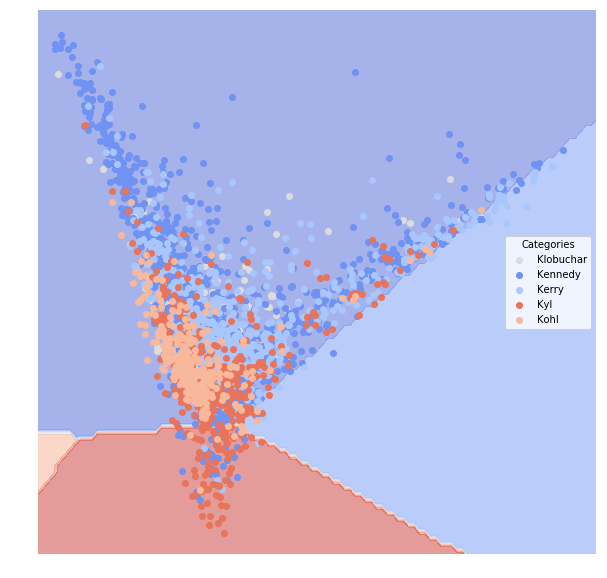

boosting  Evaluation:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
Kohl       1.0                1.0         0.0        1.0     1.0
Klobuchar  1.0                1.0         0.0        1.0     1.0
Kerry      1.0                1.0         0.0        1.0     1.0
Kyl        1.0                1.0         0.0        1.0     1.0
Kennedy    1.0                1.0         0.0        1.0     1.0
boosting  Confusion Matrix:


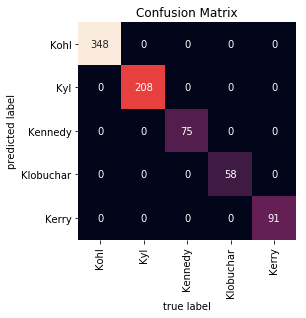

boosting  ROC:


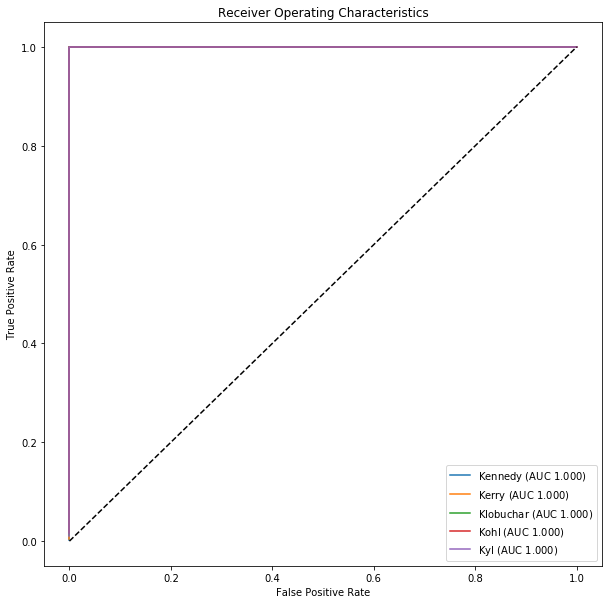

boosting  Regions:


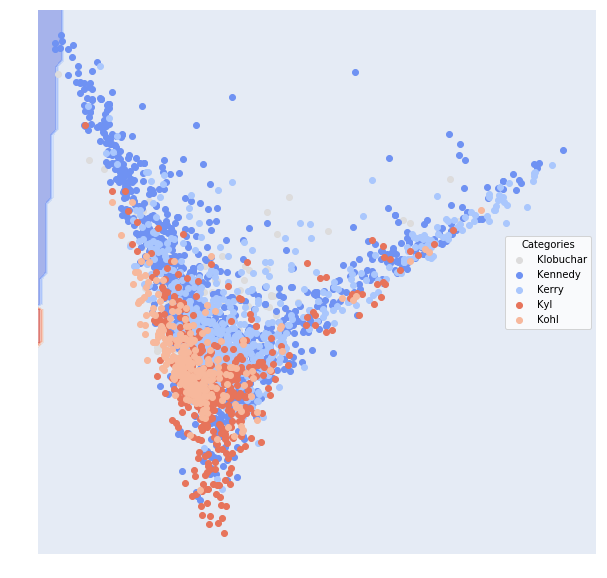

In [35]:
# Evaluation
senate_l_evl = run_all_model(senate_l_dfTrain, senate_l_dfTest)

### Email Spam

Loading Spam
Loading Ham
Converting to vectors


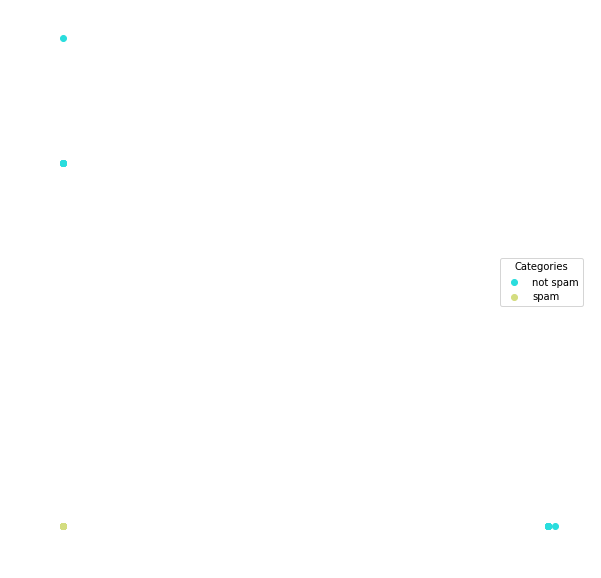

In [36]:
# Load the data
spam_dfTrain, spam_dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSpam())

# Visualize
lucem_illud.plotter(spam_dfTrain)

bayes  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.824511           0.946690    0.184211   0.967480  0.812287
spam      0.824511           0.380747    0.184211   0.427083  0.836735
bayes  Confusion Matrix:


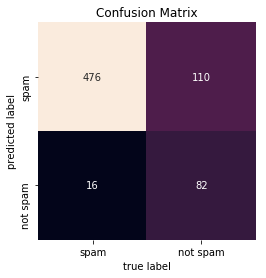

bayes  ROC:


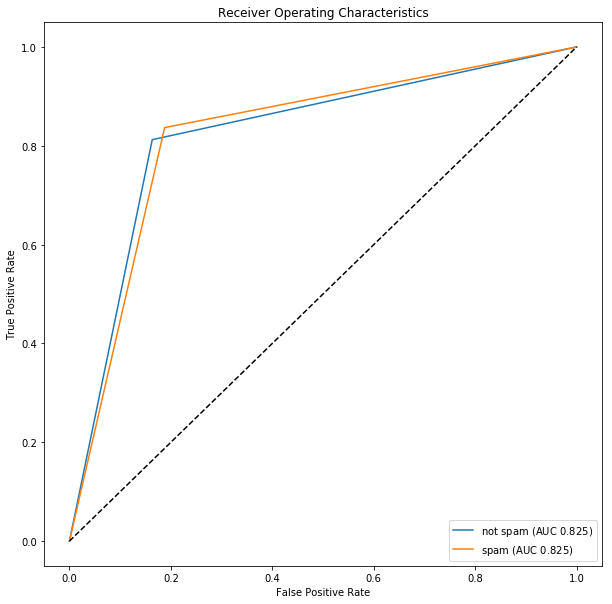

bayes  Regions:


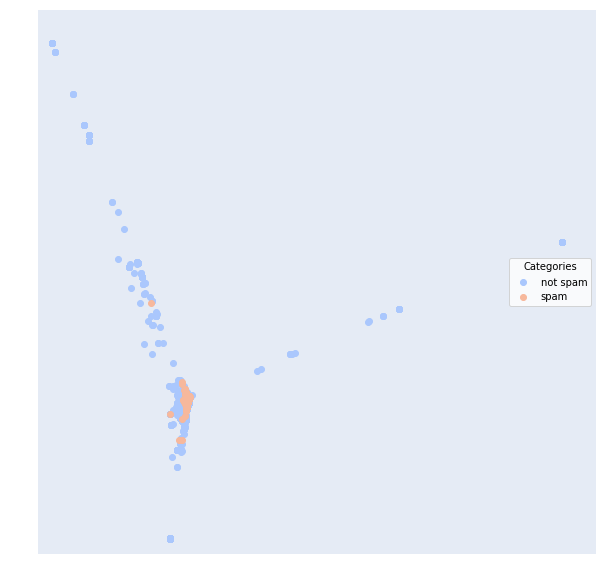

svm_linear  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.740614           0.920259    0.087719   0.921474  0.981229
spam      0.740614           0.479971    0.087719   0.816667  0.500000
svm_linear  Confusion Matrix:


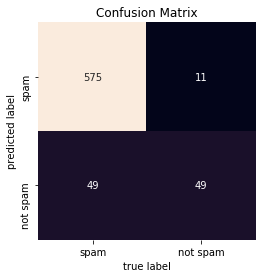

svm_linear  ROC:


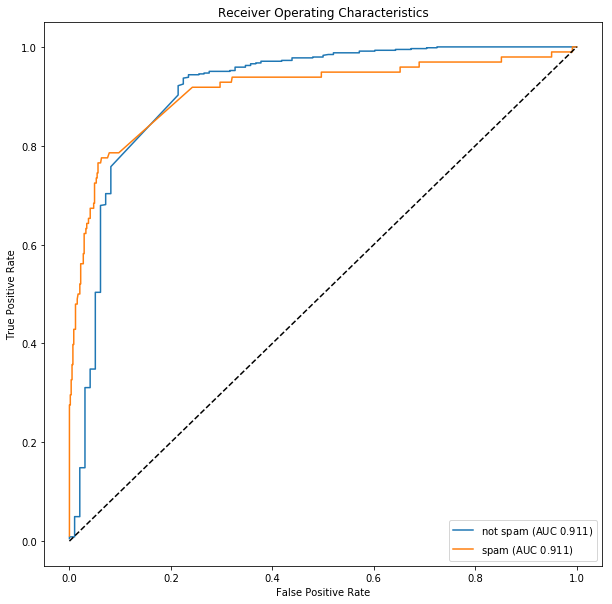

svm_linear  Regions:


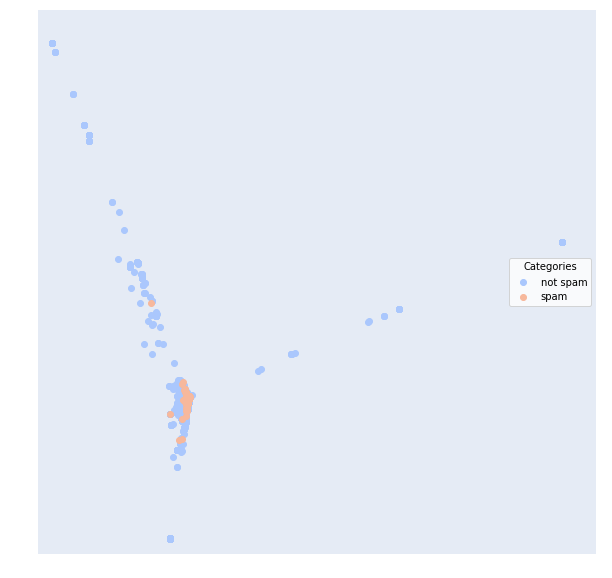

/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


svm_poly  Evaluation:
          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
not spam  0.5           0.856725    0.143275   0.856725     1.0
spam      0.5           0.143275    0.143275   0.000000     0.0
svm_poly  Confusion Matrix:


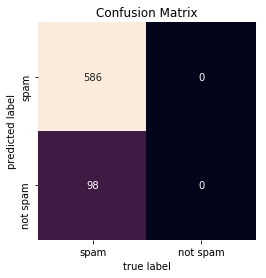

svm_poly  ROC:


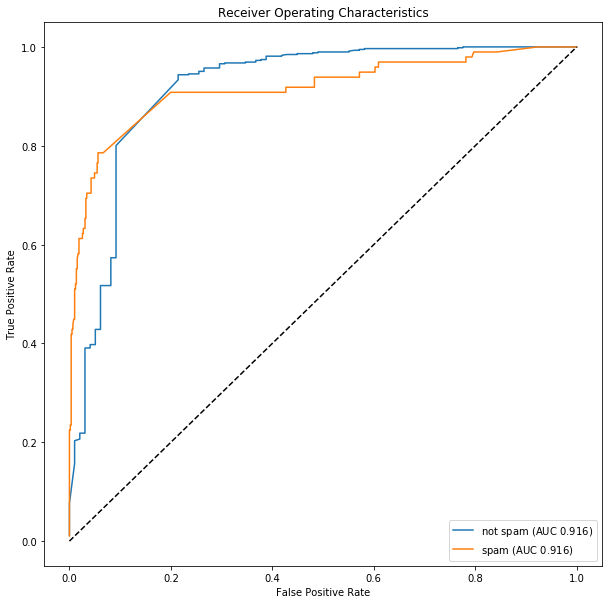

svm_poly  Regions:


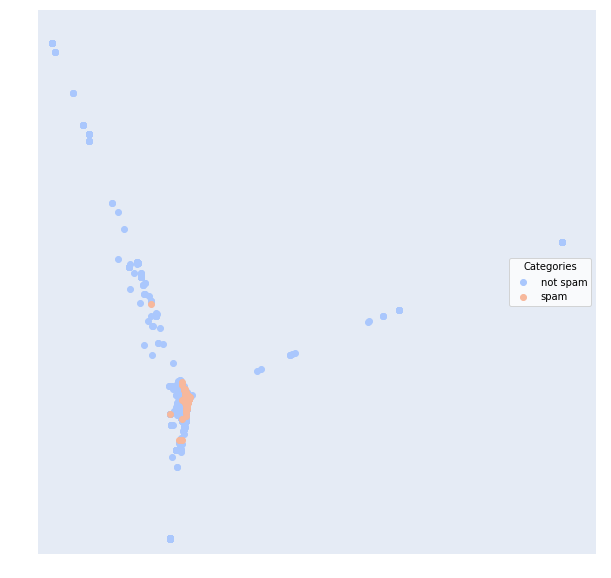

knn  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.751654           0.923452    0.090643   0.925325  0.972696
spam      0.751654           0.473014    0.090643   0.764706  0.530612
knn  Confusion Matrix:


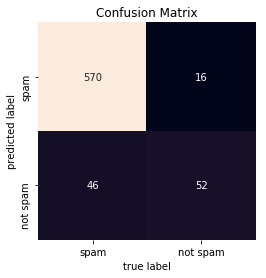

knn  ROC:


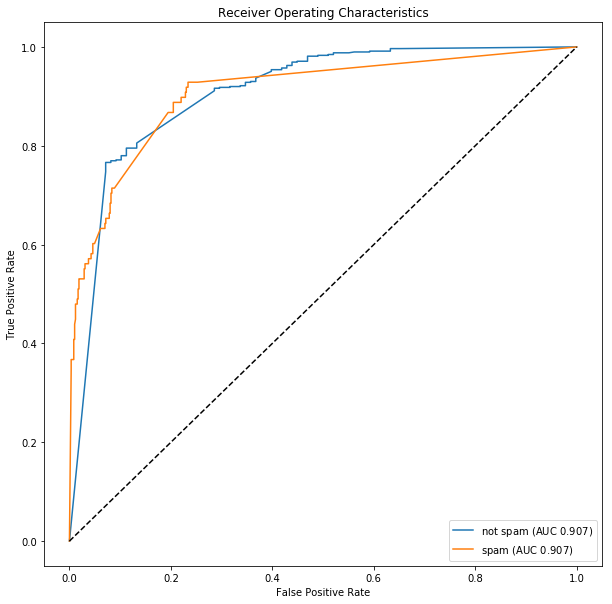

knn  Regions:


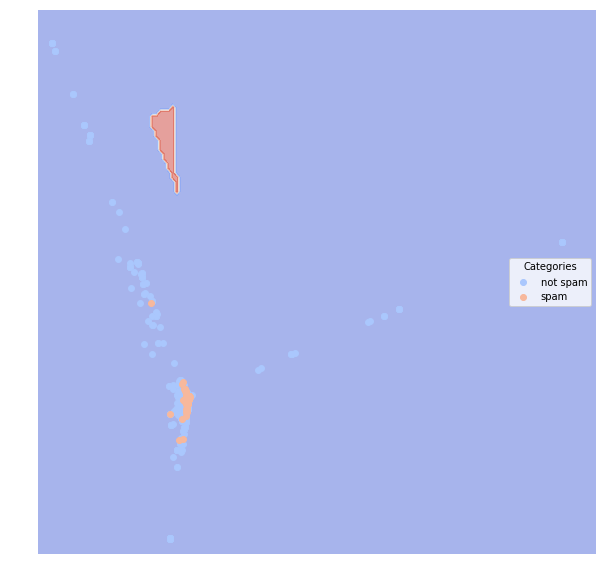

classical_reg  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.611392           0.884974    0.112573   0.885023  0.998294
spam      0.611392           0.325840    0.112573   0.956522  0.224490
classical_reg  Confusion Matrix:


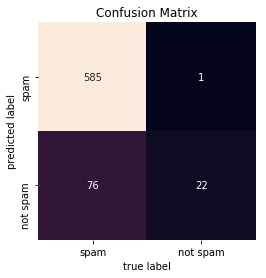

classical_reg  ROC:


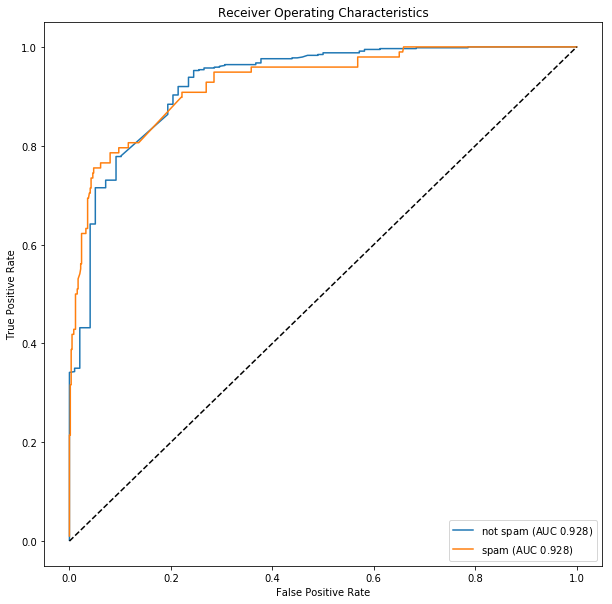

classical_reg  Regions:


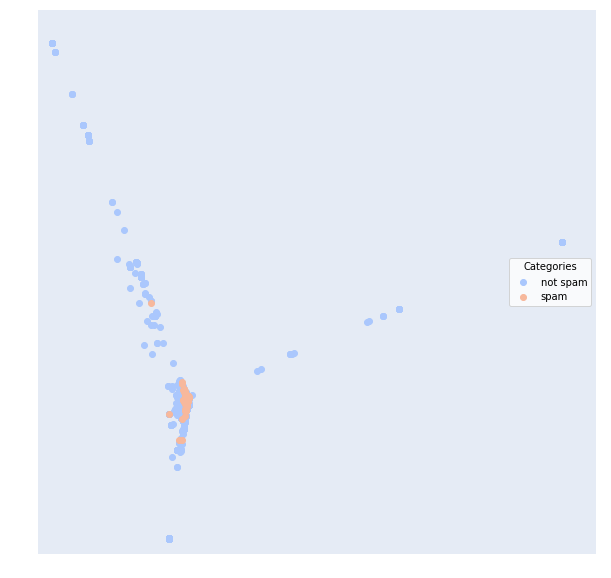

decision_tree  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.812008           0.941181    0.081871   0.944631  0.960751
spam      0.812008           0.538157    0.081871   0.738636  0.663265
decision_tree  Confusion Matrix:


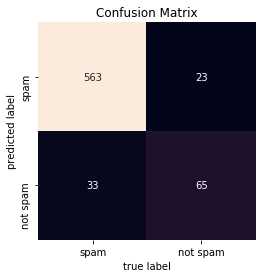

decision_tree  ROC:


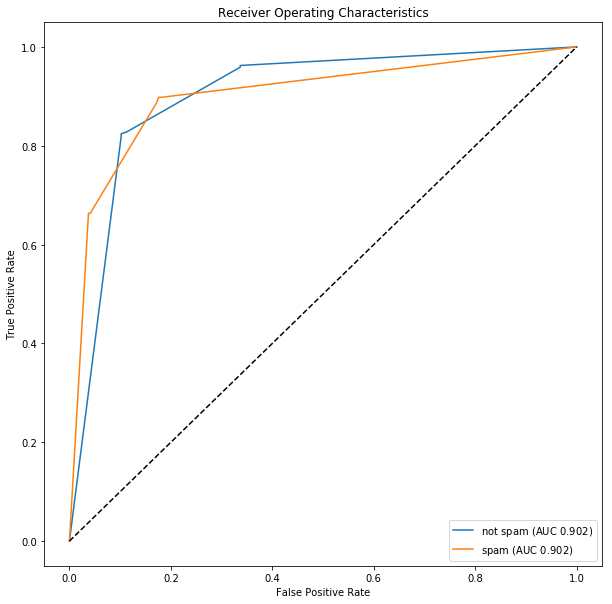

decision_tree  Regions:


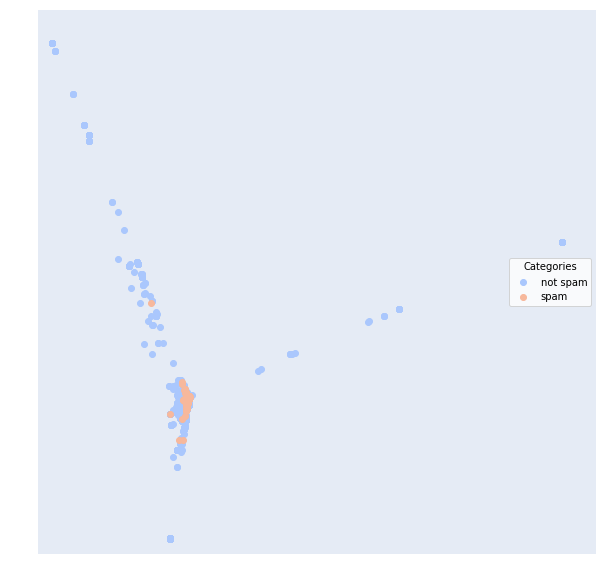

random_forest  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.796719           0.936559    0.078947   0.938944  0.970990
spam      0.796719           0.540881    0.078947   0.782051  0.622449
random_forest  Confusion Matrix:


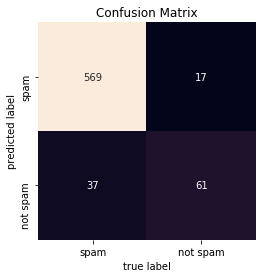

random_forest  ROC:


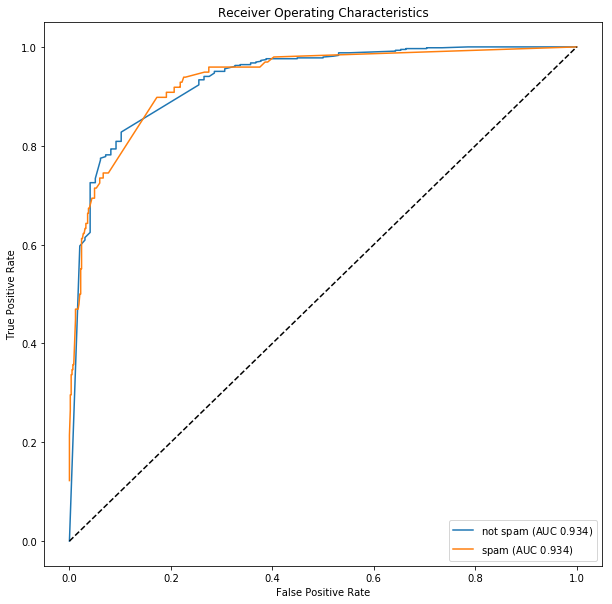

random_forest  Regions:


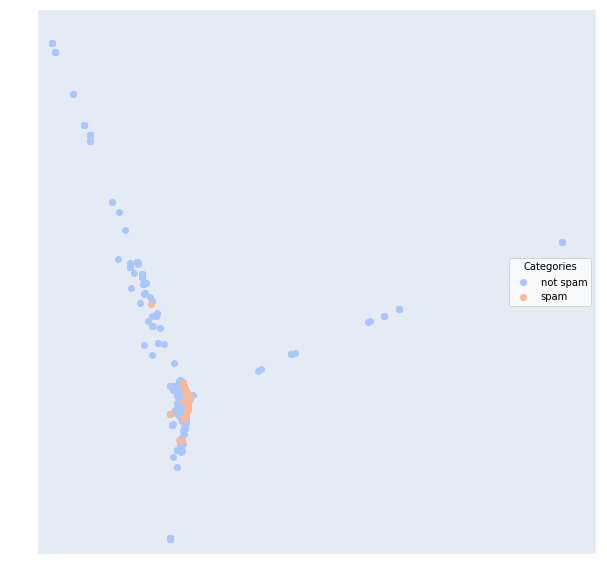

neural_network  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.827314           0.945772    0.077485   0.949410  0.960751
spam      0.827314           0.562362    0.077485   0.747253  0.693878
neural_network  Confusion Matrix:


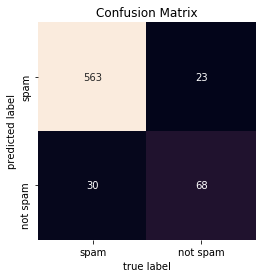

neural_network  ROC:


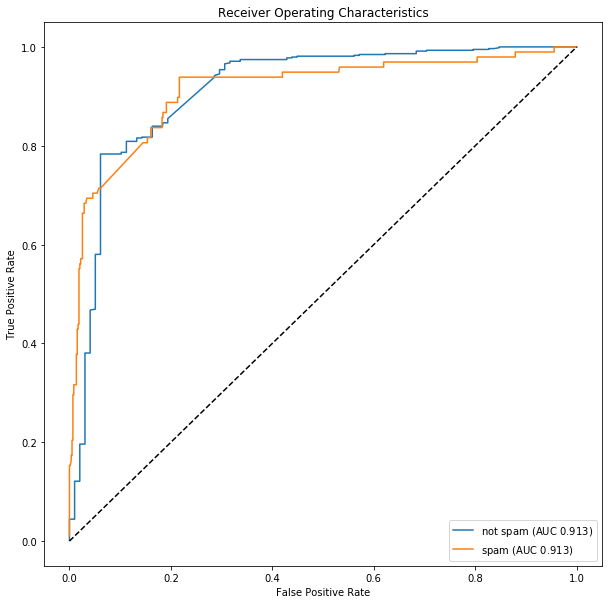

neural_network  Regions:


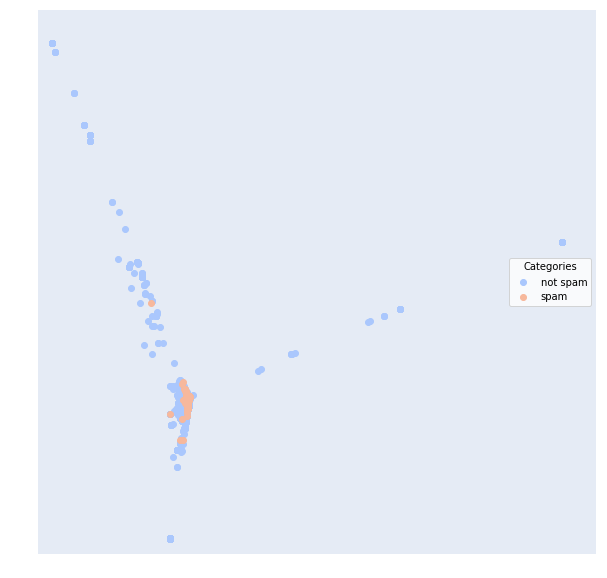

boosting  Evaluation:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.619036           0.886987    0.114035   0.887195  0.993174
spam      0.619036           0.318100    0.114035   0.857143  0.244898
boosting  Confusion Matrix:


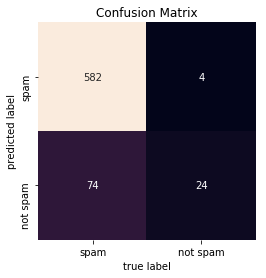

boosting  ROC:


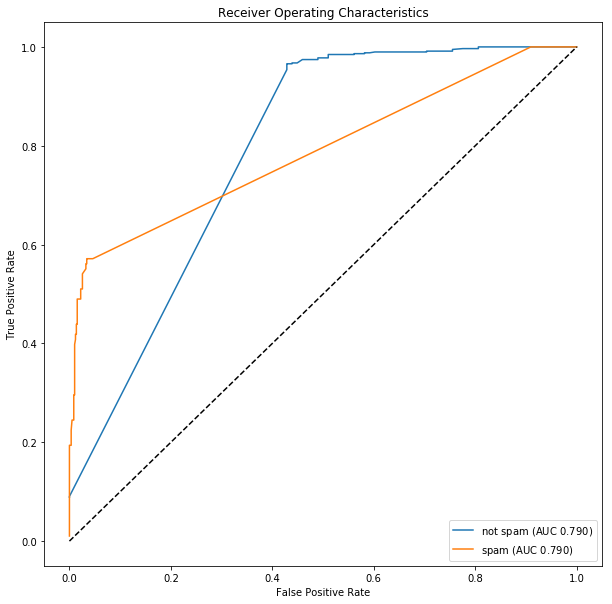

boosting  Regions:


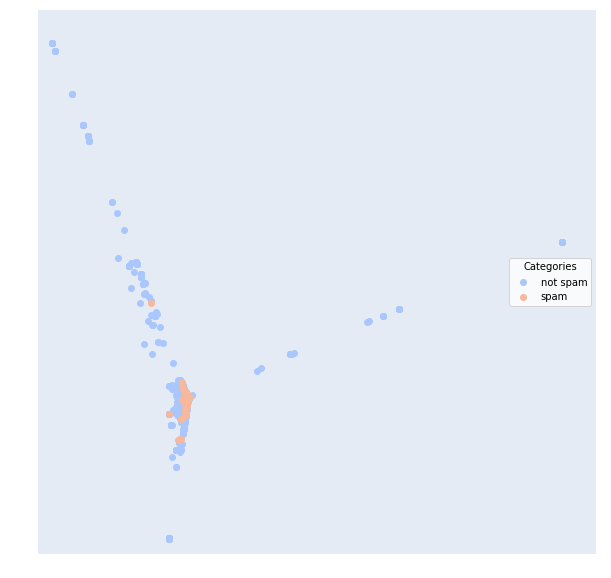

In [37]:
# Evaluation
spam_evl = run_all_model(spam_dfTrain, spam_dfTest)

<span style="color:blue"> For the Reddit sample, SVM with linear kernel, KNN, Neural Network, and Boosting all gives good results. Because they gives accurate categories, and the performance is consistent along all the groups.

<span style="color:blue"> For the NewsGroups sample, SVM with linear kernel, classical regression, and Neural Network perform the best, since they give high and balanced AUCs, and resonable results of classification.

<span style="color:blue"> For the SenateSmall sample with only 2 categories,  the best method is SVM with linear kernel, since it gives perfect AUC. According to the confusion matrix, it makes only a few mistakes.

<span style="color:blue"> For the SenateLarge sample, the best method is Decision Tree, since it gives perfect AUCs. And according to the confusion matrix, this method makes none mistake.

<span style="color:blue"> For the EmalSpam sample, Random Forest is the best method of classification. Because it has the highest and balanced AUCs.

<span style="color:blue"> Performance of methods on empirical datasets are more complex. So which method is the optimal one really depends on the dataset and research needs.

## Stretch: AdaBoost

### Random Dataset

In [39]:
# noise==0.2

# Train the model
clf_ada0 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada0.fit(np.stack(dfTrain0['vect'], axis=0), dfTrain0['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [40]:
# noise==0.7

# Train the model
clf_ada5 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada5.fit(np.stack(dfTrain5['vect'], axis=0), dfTrain5['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [44]:
print('Evalutaion of noise==0.2:')
print(lucem_illud.evaluateClassifier(clf_ada0, dfTest0))
print()
print('Evalutaion of noise==0.7:')
print(lucem_illud.evaluateClassifier(clf_ada5, dfTest5))

Evalutaion of noise==0.2:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.48063           0.520784       0.525   0.506173  0.386792
1         0.48063           0.460683       0.525   0.453782  0.574468

Evalutaion of noise==0.7:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.518591           0.474585       0.485   0.481818  0.569892
1         0.518591           0.544605       0.485   0.555556  0.467290


### andSplit Dataset

In [45]:
# noise==0.2

# Train the model
clf_ada1 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada1.fit(np.stack(dfTrain1['vect'], axis=0), dfTrain1['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [46]:
# noise==0.7

# Train the model
clf_ada6 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada6.fit(np.stack(dfTrain6['vect'], axis=0), dfTrain6['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [47]:
print('Evalutaion of noise==0.2:')
print(lucem_illud.evaluateClassifier(clf_ada1, dfTest1))
print()
print('Evalutaion of noise==0.7:')
print(lucem_illud.evaluateClassifier(clf_ada6, dfTest6))

Evalutaion of noise==0.2:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.880352            0.84471        0.12   0.897959  0.862745
1         0.880352            0.82471        0.12   0.862745  0.897959

Evalutaion of noise==0.7:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.622596           0.559138       0.375   0.620690  0.562500
1         0.622596           0.593948       0.375   0.628319  0.682692


### xorSplit Dataset

In [49]:
# noise==0.2

# Train the model
clf_ada2 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada2.fit(np.stack(dfTrain2['vect'], axis=0), dfTrain2['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [50]:
# noise==0.7

# Train the model
clf_ada7 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada7.fit(np.stack(dfTrain7['vect'], axis=0), dfTrain7['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [51]:
print('Evalutaion of noise==0.2:')
print(lucem_illud.evaluateClassifier(clf_ada2, dfTest2))
print()
print('Evalutaion of noise==0.7:')
print(lucem_illud.evaluateClassifier(clf_ada7, dfTest7))

Evalutaion of noise==0.2:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.535032           0.533689       0.465       0.55  0.533981
1         0.535032           0.503763       0.465       0.52  0.536082

Evalutaion of noise==0.7:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.557407           0.562661        0.45   0.605263  0.433962
1         0.557407           0.501407        0.45   0.516129  0.680851


### targetSplit Dataset

In [52]:
# noise==0.2

# Train the model
clf_ada3 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada3.fit(np.stack(dfTrain3['vect'], axis=0), dfTrain3['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [53]:
# noise==0.7

# Train the model
clf_ada8 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada8.fit(np.stack(dfTrain8['vect'], axis=0), dfTrain8['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [54]:
print('Evalutaion of noise==0.2:')
print(lucem_illud.evaluateClassifier(clf_ada3, dfTest3))
print()
print('Evalutaion of noise==0.7:')
print(lucem_illud.evaluateClassifier(clf_ada8, dfTest8))

Evalutaion of noise==0.2:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.860159           0.781220       0.135   0.855422  0.825581
1         0.860159           0.840027       0.135   0.871795  0.894737

Evalutaion of noise==0.7:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.622196           0.552485       0.385   0.570370  0.802083
1         0.622196           0.603018       0.385   0.707692  0.442308


### MultiBlob Dataset

In [56]:
# noise==0.2

# Train the model
clf_ada4 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada4.fit(np.stack(dfTrain4['vect'], axis=0), dfTrain4['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [57]:
# noise==0.7

# Train the model
clf_ada9 = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_ada9.fit(np.stack(dfTrain9['vect'], axis=0), dfTrain9['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [58]:
print('Evalutaion of noise==0.2:')
print(lucem_illud.evaluateClassifier(clf_ada4, dfTest4))
print()
print('Evalutaion of noise==0.7:')
print(lucem_illud.evaluateClassifier(clf_ada9, dfTest9))

Evalutaion of noise==0.2:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.860097           0.436275       0.230   0.436275  1.000000
1         0.963303           0.942606       0.016   1.000000  0.926606
2         0.990172           0.920792       0.016   0.920792  1.000000
3         0.500000           0.226000       0.226   0.000000  0.000000
4         0.989583           0.983167       0.004   1.000000  0.979167

Evalutaion of noise==0.7:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.998768           0.989474       0.002   0.989474  1.000000
1         0.873505           0.489101       0.198   0.492228  0.989583
2         0.866606           0.554610       0.150   0.594937  0.895238
3         0.500000           0.202000       0.202   0.000000  0.000000
4         0.711053      

/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


### Empirical Dataset: Reddit

In [59]:
# Train the model
clf_reddit = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_reddit.fit(np.stack(reddit_dfTrain['vect'], axis=0), reddit_dfTrain['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [60]:
lucem_illud.evaluateClassifier(clf_reddit, reddit_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Bad Roommates,0.793839,0.673840,0.134796,0.907692,0.614583
Tales From Tech Support,0.896251,0.814707,0.062696,0.944444,0.809524
Weeaboo Tales,0.962278,0.930176,0.018809,0.984848,0.928571
Relationships,0.841275,0.502203,0.191223,0.534483,0.898551


### Empirical Dataset: Newsgroups

In [61]:
# Train the model
clf_news = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_news.fit(np.stack(news_dfTrain['vect'], axis=0), news_dfTrain['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [62]:
lucem_illud.evaluateClassifier(clf_news, news_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
misc.forsale,0.792233,0.577099,0.140426,0.747573,0.658120
comp.sys.mac.hardware,0.769677,0.510688,0.172340,0.649573,0.655172
comp.windows.x,0.832014,0.679416,0.102128,0.863158,0.700855
rec.autos,0.832500,0.571616,0.163830,0.638710,0.825000


### Empirical Dataset: Senate Small

In [63]:
# Train the model
clf_s = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_s.fit(np.stack(senate_s_dfTrain['vect'], axis=0), senate_s_dfTrain['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [64]:
lucem_illud.evaluateClassifier(clf_s, senate_s_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Obama,0.996774,0.996481,0.002933,1.000000,0.993548
Clinton,0.996774,0.994652,0.002933,0.994652,1.000000


### Empirical Dataset: Senate Large

In [65]:
# Train the model
clf_l = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_l.fit(np.stack(senate_l_dfTrain['vect'], axis=0), senate_l_dfTrain['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [66]:
lucem_illud.evaluateClassifier(clf_l, senate_l_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Kohl,0.982759,0.968081,0.002564,1.000000,0.965517
Klobuchar,0.997163,0.949367,0.005128,0.949367,1.000000
Kerry,1.000000,1.000000,0.000000,1.000000,1.000000
Kyl,0.983516,0.970879,0.003846,1.000000,0.967033
Kennedy,0.993654,0.988270,0.006410,0.991404,0.994253


### Empirical Dataset: Email Spam

In [67]:
# Train the model
clf_spam = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
clf_spam.fit(np.stack(spam_dfTrain['vect'], axis=0), spam_dfTrain['category'])

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=100, random_state=None)

In [68]:
lucem_illud.evaluateClassifier(clf_spam, spam_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not spam,0.736348,0.919089,0.095029,0.920840,0.972696
spam,0.736348,0.448561,0.095029,0.753846,0.500000


<span style="color:blue"> The AdaBoost is sensitive to noisy data and outliers. In my experiment above, it seems to work better with datasets whose noise is small, in other words, datasets already having a clear and simple distribution. For artificial datasets, it works well with andSplit sample with noise=0.2, targetSplit sample with noise=0.2, and both MultiBlob samples. For confounded samples, it does not work better than other algorithms.

# Clinton / Obama Press Releases

We often will not have nicely prepared data, so we will work though the proccess of cleaning and structuring in more detail here:

While the Clinton and Obama Senatorial Press Releases are not hand-coded, we can imagine that we have been given a stack of such press releases, but lost the metadata associated with which senatorial office issued which. If we label a few of them, how well can our classifier do at recovering the rest? 

In [7]:
ObamaClintonReleases = pandas.read_csv('../data/ObamaClintonReleases.csv', index_col=0)

Let's turn the 'targetSenator' column into a binary category variable.

In [8]:
ObamaClintonReleases['category'] = [s == 'Obama' for s in ObamaClintonReleases['targetSenator']]

Tokenize and normalize

In [9]:
ObamaClintonReleases['tokenized_text'] = ObamaClintonReleases['text'].apply(lambda x: nltk.word_tokenize(x))
ObamaClintonReleases['normalized_text'] = ObamaClintonReleases['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

Let's split the data into training data and testing data.

In [10]:
holdBackFraction = .2
train_data_df, test_data_df = lucem_illud.trainTestSplit(ObamaClintonReleases, holdBackFraction=holdBackFraction)

In [11]:
print(len(train_data_df))
print(len(test_data_df))

1368
341


## Logistic Regression

First, let's try with a logistic regression, which may be familiar to you from statistical methods classes. First, we must turn the training dataset into a tf-idf matrix (`lucem_illud.generateVecs()` will help with this but for now we are doing it the long way):

In [12]:
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['text'])

Note that we can use the CountVectorizer instead, which simply produces a matrix of word counts.

In [13]:
TFVects.shape

(1368, 11342)

We can save this in the dataframe to make things easier

In [14]:
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In a regression, we cannot have more variables than cases. So, we need to first do a dimension reduction. First, we will approah this with PCA. You have previously seen this in week 3. Here we are not concerned about visualization, but rather classification and so all principal components are calculated. Watch out: we have to use `stack` not `sum` for combining the vectors. We note that you could also use topic loading and embedding dimensions as featured variables.

In [15]:
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))

We can store the PCA space vectors in the dataframe too:

In [16]:
train_data_df['pca'] = [r for r in reduced_data]

Visualization in 2D:

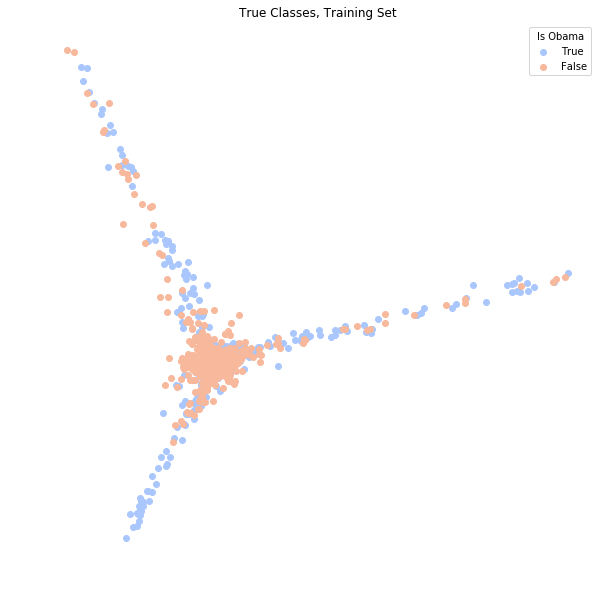

In [17]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot Obama
a = np.stack(train_data_df[train_data_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not Obama
a = np.stack(train_data_df[train_data_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'Is Obama')
plt.title('True Classes, Training Set')
plt.show()

PCA cannot distinguish Obama very well. Let's perform a screeplot to see how many Principal Components we need.

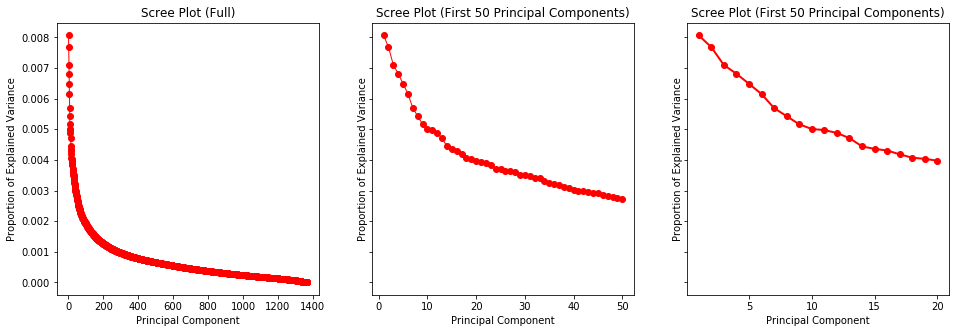

In [18]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 50 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 10 pricipal components as our covariates.

In [19]:
train_data_df['pca_reduced_10'] = train_data_df['pca'].apply(lambda x: x[:10])


Now we fit a logistic regression to our data.

In [20]:
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

Let's see how the logistic regression performs on the training dataset from which we develop the model. Unfortunately, the mean accuracy is only about 64%.

In [21]:
logistic.score(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])


0.6732456140350878

How does it perform on the testing dataset, which we "held out" and did not use for model training? We need to repeat all the steps on the testing data, but without retraining:

In [22]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_10'] = test_data_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_data_df['pca_reduced_10'], axis=0), test_data_df['category'])

0.6392961876832844

Slightly poorer. How about using more dimensions (40)?

In [ ]:
train_data_df['pca_reduced_40'] = train_data_df['pca'].apply(lambda x: x[:40])
test_data_df['pca_reduced_40'] = test_data_df['pca'].apply(lambda x: x[:40])

logistic.fit(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_40'], axis=0), test_data_df['category']))

Or still more (100)?

In [ ]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
test_data_df['pca_reduced_100'] = test_data_df['pca'].apply(lambda x: x[:100])

logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_100'], axis=0), test_data_df['category']))

Or even more (200)!

In [ ]:
train_data_df['pca_reduced_200'] = train_data_df['pca'].apply(lambda x: x[:200])
test_data_df['pca_reduced_200'] = test_data_df['pca'].apply(lambda x: x[:200])

logistic.fit(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_200'], axis=0), test_data_df['category']))

This is becoming ridiculous (400)!

In [ ]:
train_data_df['pca_reduced_400'] = train_data_df['pca'].apply(lambda x: x[:400])
test_data_df['pca_reduced_400'] = test_data_df['pca'].apply(lambda x: x[:400])

logistic.fit(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_400'], axis=0), test_data_df['category']))

Increasing the number of covariates would overfit our data, and it seems that using a logistic regression, our prediction accuracy is at best about 65%. We can, however, try a logistic regression that uses the TF-IDF scores for each word, but with an L1 regularization or L1-norm loss function, which is also known as least absolute deviations (LAD), least absolute errors (LAE) or L1 penalty. It minimizes the sum of the absolute differences (S) between the target value ($Y_i$) and the estimated values ($f(x_i)$) and prunes all insignificant variables (i.e., word TF-IDF scores):

$S=\sum^n_{i=1}|y_i=f(x_i)|$

The result is a model retaining only the most individually significant features.

In [ ]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l1')
logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))


Train the model using training data, and then test it on the testing data.

In [ ]:
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))


81% accuracy seems like the best we can get by using a logistic regression.

Now let's try with Naive Bayes. Classically, it is trained with word counts, but TF-IDF vectors are also quite good:

In [ ]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
naiveBayes.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])


In [ ]:
print("Training:")
print(naiveBayes.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))


A bit better than the logit, but that's just looking at the accuracy. What about other measures? Let's first save the predictions in the dataframe to save use rerunning the model every time:

In [ ]:
test_data_df['nb_predict'] = naiveBayes.predict(np.stack(test_data_df['vect'], axis=0))
test_data_df['nb_predict_prob_true'] = naiveBayes.predict_proba(np.stack(test_data_df['vect'], axis=0))[:,0] #other is prop false

Precision:

In [ ]:
sklearn.metrics.precision_score(test_data_df['nb_predict'], test_data_df['category'])


Recall:

In [ ]:
sklearn.metrics.recall_score(test_data_df['nb_predict'], test_data_df['category'])


F1-measure:

In [ ]:
sklearn.metrics.f1_score(test_data_df['nb_predict'], test_data_df['category'])


Let's take a look at how well our posterior distribution looks relative to the truth.

In [ ]:
fig, ax = plt.subplots()
ax.grid(False)
ax.set_frame_on(False)
test_data_df[test_data_df['category'].eq(True)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'True', color = 'red')
test_data_df[test_data_df['category'].eq(False)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'False', color = 'blue')
ax.set_xlim((0,1.1))
ax.legend(title = "Is Obama")
ax.set_xlabel('posterior')
ax.set_ylabel('counts')
plt.show()

The classification is suprisingly accurate. We can even look at what words are most influential with a bit of simple math:

In [ ]:
#Top indices
trueVals, falseVals = naiveBayes.feature_log_prob_

words_dict = {
    'Obama' : [],
    'Obama_log_prob' : [],
    'Clinton' : [],
    'Clinton_log_prob' : [],
}

for i, prob in sorted(enumerate(trueVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Obama'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Obama_log_prob'].append(prob)

for i, prob in sorted(enumerate(falseVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Clinton'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Clinton_log_prob'].append(prob)
    
pandas.DataFrame(words_dict)

## Multinomial Naive Bayes

What if we want to classify our text into one of *many* classes? The multinomial Naive Bayes generating model assumes that document features (e.g., words) are generated by draws from a multinomial distribution (recall this gives the probability to observe a particular pattern of counts across features). 

Let's use again the dataset we used in week 3, the 20 newsgroup dataset.

In [ ]:
newsgroups = sklearn.datasets.fetch_20newsgroups(data_home = '../data') #Free data to play with: documents from a newsgroup corpus.
newsgroups.target_names #Possible categories, i.e., the newsgroups

We can pick specific categories, and pull the relevant training and testing sets. 

In [ ]:
target_categories = ['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics'] #Can change these of course

newsgroupsDF = pandas.DataFrame(columns = ['text', 'category', 'source_file'])
for category in target_categories:
    print("Loading data for: {}".format(category))
    ng = sklearn.datasets.fetch_20newsgroups(categories = [category], remove=['headers', 'footers', 'quotes'], data_home = '../data')
    newsgroupsDF = newsgroupsDF.append(pandas.DataFrame({'text' : ng.data, 'category' : [category] * len(ng.data), 'source_file' : ng.filenames}), ignore_index=True)

Now we need to tokenize, and make a training and testing set:

In [ ]:
newsgroupsDF['tokenized_text'] = newsgroupsDF['text'].apply(lambda x: nltk.word_tokenize(x))
newsgroupsDF['normalized_text'] = newsgroupsDF['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

In [ ]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

In [ ]:
print(len(train_ng_df))
print(len(test_ng_df))

We need to extract features from the text. We can use built-in feature extraction to do so. We will use a tf-idf vectorizer, which converts the document into a vector of words with tf-idf weights (term-frequency inverse-document frequency). This gives high weight to words that show up a lot in a given document, but rarely across documents in the corpus (more distinctive). 

In [ ]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

Now we can train the model:

In [ ]:
MultinomialNB_ng = sklearn.naive_bayes.MultinomialNB()
MultinomialNB_ng.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

...and save predictions to the dataframe:

In [ ]:
train_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(train_ng_df['vect'], axis=0))
print("Training score:")
print(MultinomialNB_ng.score(np.stack(train_ng_df['vect'], axis=0), train_ng_df['category']))

In [ ]:
train_ng_df[['category', 'nb_predict']][:10]

Looks pretty good, lets examine the testing dataset:

In [ ]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(MultinomialNB_ng.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

We can even use a confusion matrix, like we used last week for evaluating human coders relative to one another. Now we are evaluating our classifier relative to human coding. We'll just use the one in `lucem_illud`, which requres a classifier and a dataframe with `'vect'` and `'category'` columns, like we have in the examples:

In [ ]:
lucem_illud.plotConfusionMatrix(MultinomialNB_ng, test_ng_df)

Let's calculate the precision, recall, and F-measures.

In [ ]:
print(sklearn.metrics.precision_score(test_ng_df['nb_predict'], test_ng_df['category'], average = 'weighted')) #precision
print(sklearn.metrics.recall_score(test_ng_df['nb_predict'], test_ng_df['category'], average = 'weighted')) #recall
print(sklearn.metrics.f1_score(test_ng_df['nb_predict'], test_ng_df['category'], average = 'weighted')) #F-1 measure

We can evaluate these per catagory. This has the same requiments as `plotConfusionMatrix`:

In [ ]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB_ng, test_ng_df)

We can also plot the ROC curves. This has the same requiments as `plotConfusionMatrix`:

In [ ]:
lucem_illud.plotMultiROC(MultinomialNB_ng, test_ng_df)

And we can plot the PCA space visualization:

In [ ]:
lucem_illud.plotregions(MultinomialNB_ng, test_ng_df)

We can also give the model a new string, not present in our data, and use the *predict* method to see if it can assign it to a category. Using our model to extend its classifications to new, uncoded data might be the primary purpose of a social science application. The words do have to be in the vocabulary, so don't be too creative :-)

In [ ]:
def predict_category(s, model, tfidf): #We just define a simple function here
    a = np.zeros((1, len(tfidf.vocabulary_)))
    for w in nltk.word_tokenize(s):
        try:
            a[:,tfidf.vocabulary_[lucem_illud.stemmer_basic.stem(w.lower())]] = 1
        except KeyError:
            print("Warning: '{}' not in vocabulary".format(w))
    return model.predict(a)[0]


In [ ]:
predict_category('rockets are cool', MultinomialNB_ng, TFVectorizer_ng)


## <span style="color:red">*Exercise 2*</span>

<span style="color:red">In the cells immediately following, perform Logistic and Naïve Bayes classification (binary or multinomial) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project (e.g., these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week). Visualize the confusion matrix for training and testing sets. Calculate precision, recall, the F-measure, and AUC, then perform an ROC visualization. How do these classifiers perform? Exrapolate codes from these models to all uncoded data.


### Data

In [69]:
# Read in my empirical data
file_path = os.path.abspath('..') + '/data/music'
file_lst = os.listdir(file_path)[1:] # ignore the hidden file generated by the system

d = {'file_name':[], 'text':[], 'music_type':[]}
for filename in file_lst:
    text = ''
    music_type = ''
    # Get music_type
    filename_split = filename.split() # get rid of redundant information in file names to get the music type
    for i in range(len(filename_split)):
        filename_split[i] = re.sub('.txt', '', filename_split[i])
        if filename_split[i] != '–':
            if filename_split[i] != '-':
                if i != 0:
                    music_type = music_type + ' ' + filename_split[i]
                else:
                    music_type += filename_split[i]
            else:
                break
        else:
            break
    with open(file_path+'/'+filename) as f:
        for line in f:
            temp_text = line.strip('\n')
            #text += line.strip('\n')

            d['text'].append(temp_text)
    #d['text'].append(text)
            d['file_name'].append(filename)
            d['music_type'].append(music_type)

df = pandas.DataFrame(d)

In [72]:
# Select documents with accurate categories
index_lst = []
concept_lst = ['Classical', 'Classical period', 'Electronic music', 'Pop music', 'Folk', 'Progressive bluegrass', 'Progressive electronic music', 'Progressive folk music', 'Progressive house', 'Progressive metal', 'Progressive rock', 'Progressive trance', 'Psychedelic music']
for i in range(df.shape[0]):
    if df.iloc[i]['music_type'] in concept_lst:
        index_lst.append(i)
        
labeled_df = df.iloc[index_lst]
labeled_df['category'] = labeled_df['music_type']
for i in range(labeled_df.shape[0]):
    if labeled_df['music_type'].iloc[i] in ['Classical', 'Classical period']:
        labeled_df['category'].iloc[i] = 'Classical'
    elif labeled_df['music_type'].iloc[i] in ['Progressive bluegrass', 'Progressive electronic music', 'Progressive folk music', 'Progressive house', 'Progressive metal', 'Progressive rock', 'Progressive trance']:
        labeled_df['category'].iloc[i] = 'Progressive'
    elif labeled_df['music_type'].iloc[i] == 'Electronic music':
        labeled_df['category'].iloc[i] = 'Electronic'
    elif labeled_df['music_type'].iloc[i] == 'Pop music':
        labeled_df['category'].iloc[i] = 'Pop'
    elif labeled_df['music_type'].iloc[i] == 'Psychedelic music':
        labeled_df['category'].iloc[i] = 'Psychedelic'

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()
/anaconda3/lib/python3.6/s

In [74]:
# Tokenize and Normalize
labeled_df['tokenized_text'] = labeled_df['text'].apply(lambda x: nltk.word_tokenize(x))
labeled_df['normalized_text'] = labeled_df['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

holdBackFraction = .2
train_data_df, test_data_df = lucem_illud.trainTestSplit(labeled_df, holdBackFraction=holdBackFraction)

print(len(train_data_df))
print(len(test_data_df))

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


405
101


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


### Logistic Regression

In [75]:
# Initialize
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['text'])

# Store vectors in Pandas DataFrame
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [76]:
# PCA to reduce dimensions

# Initiate
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))

train_data_df['pca'] = [r for r in reduced_data]

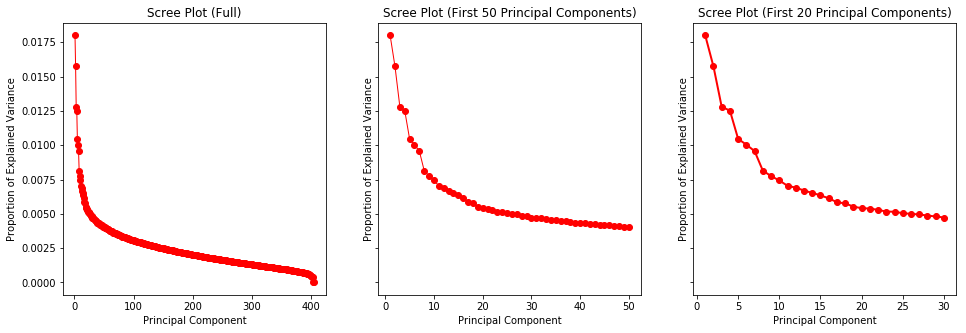

In [79]:
# Look for suitable number of principle components
n = len(train_data_df)
# Initialize
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)
# 1
eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')
# 2
eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')
# 3
eigen_vals = np.arange(30) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:30], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')
# Plot
plt.show()

In [80]:
train_data_df['pca_reduced_20'] = train_data_df['pca'].apply(lambda x: x[:20])

In [81]:
# Fit a logistic regression
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_20'], axis=0), train_data_df['category'])

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [82]:
# Get accuracy
logistic.score(np.stack(train_data_df['pca_reduced_20'], axis=0), train_data_df['category'])

0.8691358024691358

In [83]:
# Apply model on testing data

#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]
#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_20'] = test_data_df['pca'].apply(lambda x: x[:20])
#Test
logistic.score(np.stack(test_data_df['pca_reduced_20'], axis=0), test_data_df['category'])

0.8712871287128713

In [87]:
## With panelty
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l1')
logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
# Training data
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))
# Testing data
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

0.8641975308641975
0.8811881188118812


In [89]:
# Evaluate
# Logistic Regression with L1 Panelty
lucem_illud.evaluateClassifier(logistic_l1, test_data_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Classical,0.939024,0.655172,0.099010,0.655172,1.000000
Pop,1.000000,1.000000,0.000000,1.000000,1.000000
Electronic,0.955039,0.826568,0.029703,0.875000,0.933333
Folk,0.920000,0.879604,0.039604,1.000000,0.840000
Psychedelic,0.833333,0.676568,0.009901,1.000000,0.666667
Progressive,0.918919,0.897244,0.059406,1.000000,0.837838


In [90]:
#Add to df
test_data_df['logistic_penalty_predict'] = logistic_l1.predict(np.stack(test_data_df['vect'], axis=0))

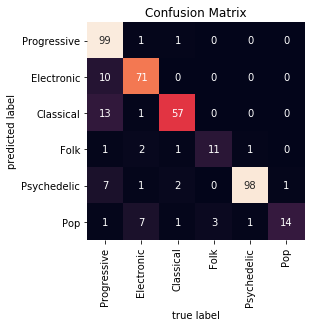

In [136]:
# Confusion Matrix for Training Data
lucem_illud.plotConfusionMatrix(logistic_l1, train_data_df)

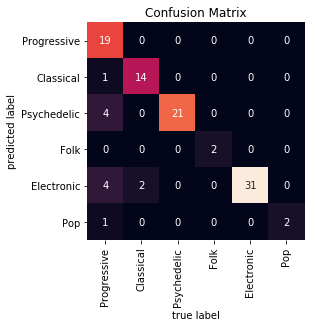

In [124]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(logistic_l1, test_data_df)

In [127]:
# Other Evaluation
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_data_df['logistic_penalty_predict'], test_data_df['category']))
print('Precision Score: ', sklearn.metrics.precision_score(test_data_df['logistic_penalty_predict'], test_data_df['category'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_data_df['logistic_penalty_predict'], test_data_df['category'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_data_df['logistic_penalty_predict'], test_data_df['category'], average = 'weighted'))

Accuracy Score:  0.8811881188118812
Precision Score:  0.8997984122736598
Recall:  0.8811881188118812
F1 Score:  0.8757283679444587


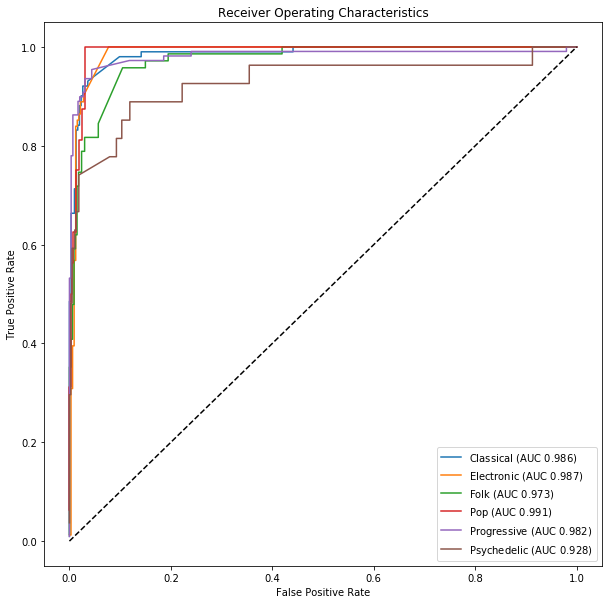

In [137]:
# ROC for Training Data
lucem_illud.plotMultiROC(logistic_l1, train_data_df)

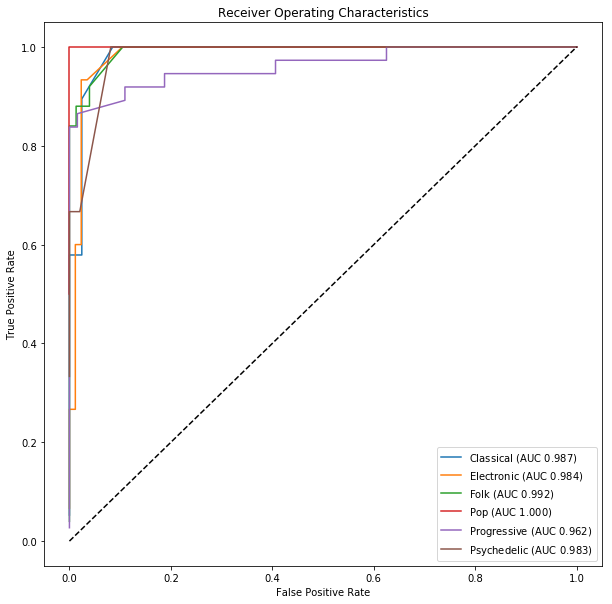

In [135]:
# ROC for Testing Data
lucem_illud.plotMultiROC(logistic_l1, test_data_df)

### Naive Bayes

In [91]:
# Train the model
MultinomialNB_ng = sklearn.naive_bayes.MultinomialNB()
MultinomialNB_ng.fit(np.stack(train_data_df['vect'], axis = 0), train_data_df['category'])
# Save predictions
train_data_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(train_data_df['vect'], axis=0))
print("Training score:")
print(MultinomialNB_ng.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))

Training score:
0.9037037037037037


In [92]:
# Testing data
#Add to df
test_data_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(test_data_df['vect'], axis=0))
#Test
print("Testing score:")
print(MultinomialNB_ng.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

Testing score:
0.8712871287128713


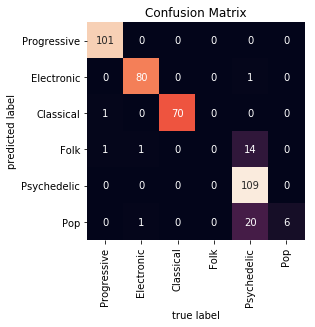

In [138]:
# Confusion Matrix for Training Data
lucem_illud.plotConfusionMatrix(MultinomialNB_ng, train_data_df)

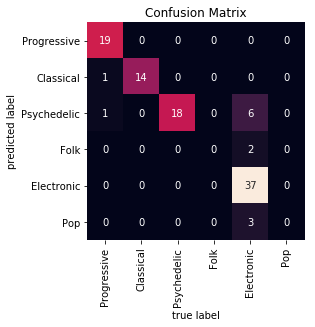

In [93]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(MultinomialNB_ng, test_data_df)

In [129]:
# Other Evaluation
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_data_df['nb_predict'], test_data_df['category']))
print('Precision Score: ', sklearn.metrics.precision_score(test_data_df['nb_predict'], test_data_df['category'], average = 'weighted')) #precision
print('Recall: ', sklearn.metrics.recall_score(test_data_df['nb_predict'], test_data_df['category'], average = 'weighted')) #recall
print('F1 Score: ', sklearn.metrics.f1_score(test_data_df['nb_predict'], test_data_df['category'], average = 'weighted')) #F-1 measure

Accuracy Score:  0.8712871287128713
Precision Score:  0.9408580858085809
Recall:  0.8712871287128713
F1 Score:  0.8943093476761234


/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


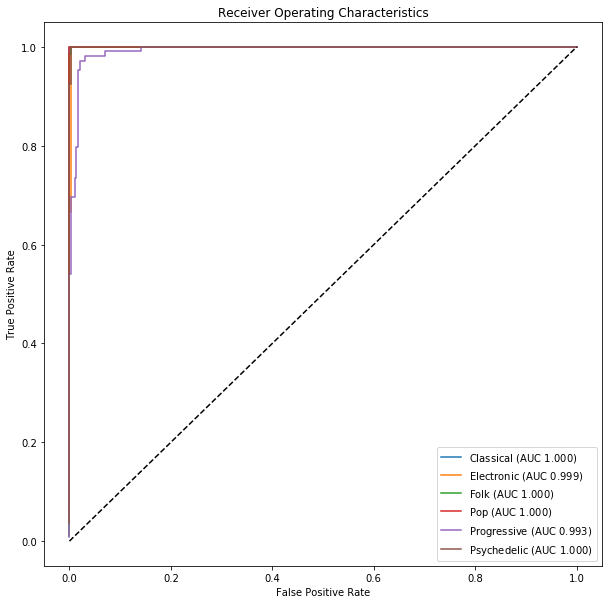

In [139]:
# ROC for Training Data
lucem_illud.plotMultiROC(MultinomialNB_ng, train_data_df)

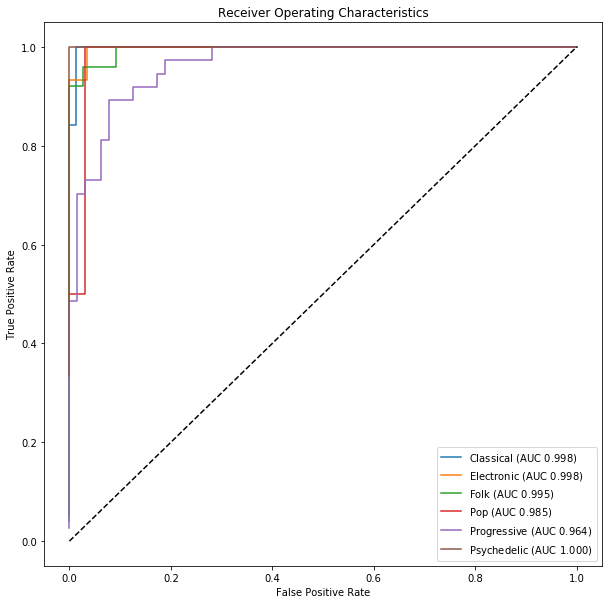

In [140]:
# ROC for Testing Data
lucem_illud.plotMultiROC(MultinomialNB_ng, test_data_df)

<span style="color:blue"> For my dataset, both of logistic regression with L1 penalty and Naive Bayes work well. They gives similar test scores and AUC curves. But all the errors occur in off-diagonal part of the confusion matrix, while errors occur in both upper and off diagonal matrix. And the models generally fit the training data better than they fit the testing data (of course).

# Decision Trees

Decision trees can be used to predict both categorical/class labels (i.e., classification) and continuous labels (i.e., regression).

In [ ]:
blobs_df = lucem_illud.multiBlobs(noise=.2, centers=[(0,0), (0,5), (5,0), (-5,0), (0,-5)])
df_exampleTree_train, df_exampleTree_test = lucem_illud.trainTestSplit(blobs_df)
lucem_illud.plotter(df_exampleTree_train)


Now we import our Decision Tree classifier from sklearn.tree (familiar syntax) and fit it using the fit method.

In [ ]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])


To see what's going on visually with the classification: 

In [ ]:
lucem_illud.plotregions(clf_tree, df_exampleTree_train)


In [ ]:
lucem_illud.evaluateClassifier(clf_tree, df_exampleTree_test)


Lets look at accuracy:

In [ ]:
sklearn.metrics.accuracy_score(df_exampleTree_test['category'],clf_tree.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))

What happens if we trim the tree?

In [ ]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])
    score = sklearn.metrics.accuracy_score(df_exampleTree_test['category'], tree2.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

We can select different layers of the decision tree or "prune" it. At approximately four layers down in the decision tree, the shape is somewhat odd, suggesting that our model is overfitting beyond those four layers.

Combining multiple overfitting estimators turns out to be a key idea in machine learning. This is called **bagging** and is a type of **ensemble** method. The idea is to make many randomized estimators--each can overfit, as decision trees are wont to do--but then to combine them, ultimately producing a better classification. A **random forest** is produced by bagging decision trees.

In [ ]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [ ]:
bag.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category']) #Fit the bagged classifier

In [ ]:
lucem_illud.plotregions(bag, df_exampleTree_test)


In [ ]:
lucem_illud.evaluateClassifier(bag, df_exampleTree_test)


In [ ]:
lucem_illud.plotConfusionMatrix(bag, df_exampleTree_test)


## <span style="color:red">*Exercise 3*</span>

<span style="color:red">In the cells immediately following, perform decision tree and random forest classification (binary, multinomial or continuous) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. As with ***Exercise 2***, these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week. Visualize the classification of data points. Calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Now build an ensemble classifier by bagging trees into a random forest. Visualize the result. How do these classifiers perform? What does ensemble learning do?

### Decision Tree

In [104]:
# Train the model
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(train_data_df['vect'], axis =0), train_data_df['category'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')

In [105]:
#Add to df
test_data_df['decision_tree_predict'] = clf_tree.predict(np.stack(test_data_df['vect'], axis=0))

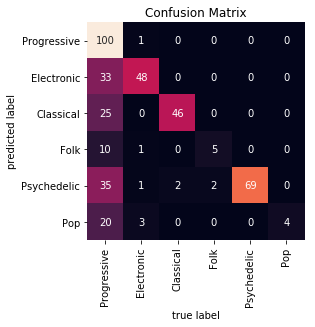

In [144]:
# Confusion Matrix for Training Data
lucem_illud.plotConfusionMatrix(clf_tree, train_data_df)

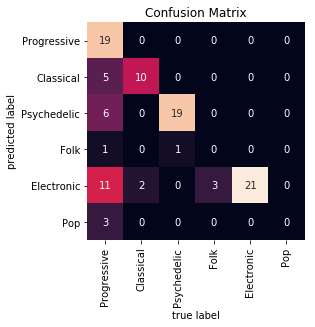

In [122]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(clf_tree, test_data_df)

In [130]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_data_df['decision_tree_predict'], test_data_df['category']))
print('Precision Score: ', sklearn.metrics.precision_score(test_data_df['decision_tree_predict'], test_data_df['category'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_data_df['decision_tree_predict'], test_data_df['category'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_data_df['decision_tree_predict'], test_data_df['category'], average = 'weighted'))

Accuracy Score:  0.6831683168316832
Precision Score:  0.7932566229595933
Recall:  0.6831683168316832
F1 Score:  0.6703309339554645


/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


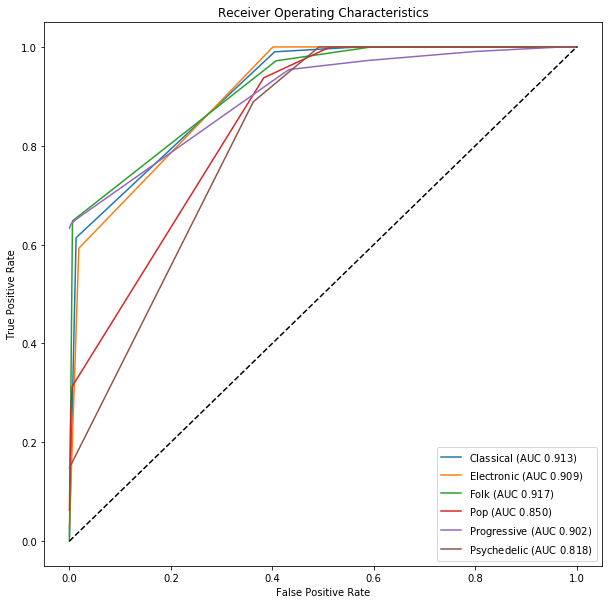

In [145]:
# ROC for Training Data
lucem_illud.plotMultiROC(clf_tree, train_data_df)

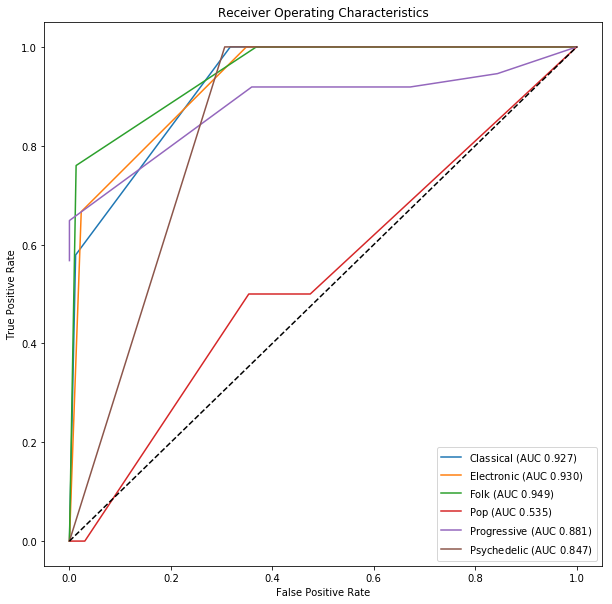

In [146]:
# ROC for Testing Data
lucem_illud.plotMultiROC(clf_tree, test_data_df)

### Random Forest

In [142]:
# Train the model
clf_rf = sklearn.ensemble.RandomForestClassifier() # use default settings
clf_rf.fit(np.stack(train_data_df['vect'], axis =0), train_data_df['category'])

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [155]:
#Add to df
test_data_df['rf_not_bagging'] = clf_rf.predict(np.stack(test_data_df['vect'], axis=0))

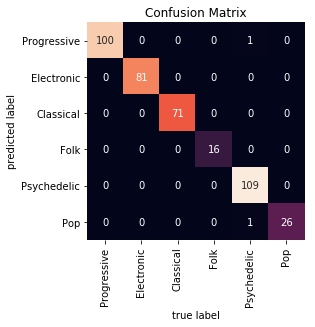

In [156]:
# Confusion Matrix for Training Data
lucem_illud.plotConfusionMatrix(clf_rf, train_data_df)

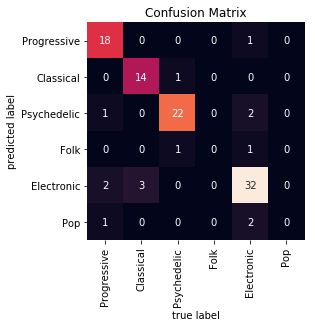

In [157]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(clf_rf, test_data_df)

In [158]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_data_df['rf_not_bagging'], test_data_df['category']))
print('Precision Score: ', sklearn.metrics.precision_score(test_data_df['rf_not_bagging'], test_data_df['category'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_data_df['rf_not_bagging'], test_data_df['category'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_data_df['rf_not_bagging'], test_data_df['category'], average = 'weighted'))

Accuracy Score:  0.8514851485148515
Precision Score:  0.8979567999474202
Recall:  0.8514851485148515
F1 Score:  0.8729679232233825


/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


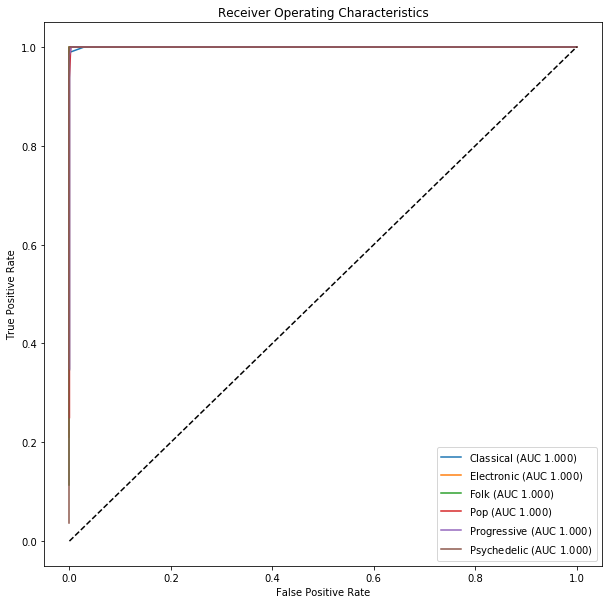

In [159]:
# ROC for Training Data
lucem_illud.plotMultiROC(clf_rf, train_data_df)

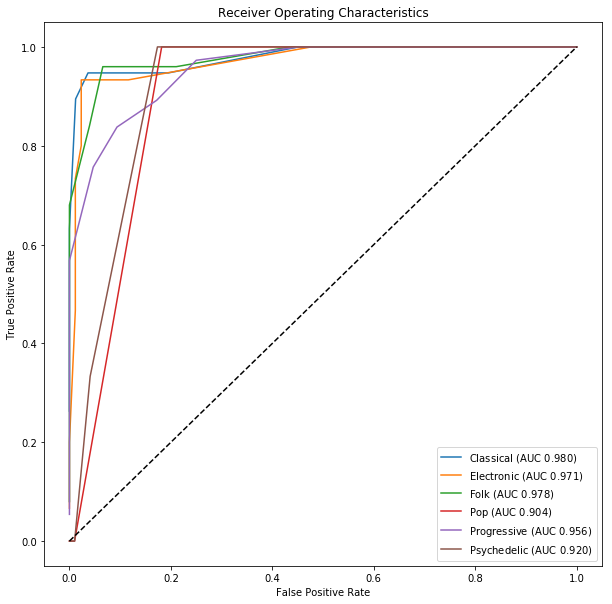

In [160]:
# ROC for Testing Data
lucem_illud.plotMultiROC(clf_rf, test_data_df)

### Bagging Trees 

In [107]:
# Train the model
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10)
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1)

bag.fit(np.stack(train_data_df['vect'], axis =0), train_data_df['category'])

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
         bootstrap=True, bootstrap_features=False, max_features=1.0,
         max_samples=0.8, n_estimators=100, n_jobs=1, oob_score=False,
         random_state=1, verbose=0, warm_start=False)

In [108]:
#Add to df
test_data_df['random_forest_predict'] = bag.predict(np.stack(test_data_df['vect'], axis=0))

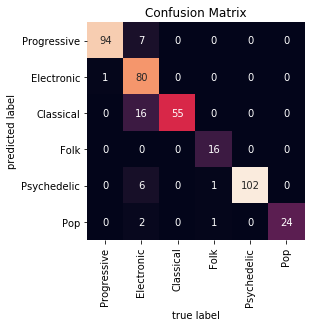

In [152]:
# Confusion Matrix with Training Data
lucem_illud.plotConfusionMatrix(bag, train_data_df)

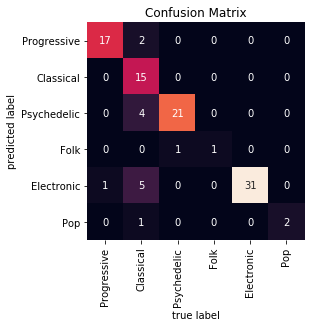

In [121]:
# Confusion Matrix with Testing Data
lucem_illud.plotConfusionMatrix(bag, test_data_df)

In [132]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_data_df['random_forest_predict'], test_data_df['category']))
print('Precision Score: ', sklearn.metrics.precision_score(test_data_df['random_forest_predict'], test_data_df['category'], average = 'weighted')) #precision
print('Recall: ', sklearn.metrics.recall_score(test_data_df['random_forest_predict'], test_data_df['category'], average = 'weighted')) #recall
print('F1 Score: ', sklearn.metrics.f1_score(test_data_df['random_forest_predict'], test_data_df['category'], average = 'weighted')) #F-1 measure

Accuracy Score:  0.8613861386138614
Precision Score:  0.8850650442000103
Recall:  0.8613861386138614
F1 Score:  0.8516554637956391


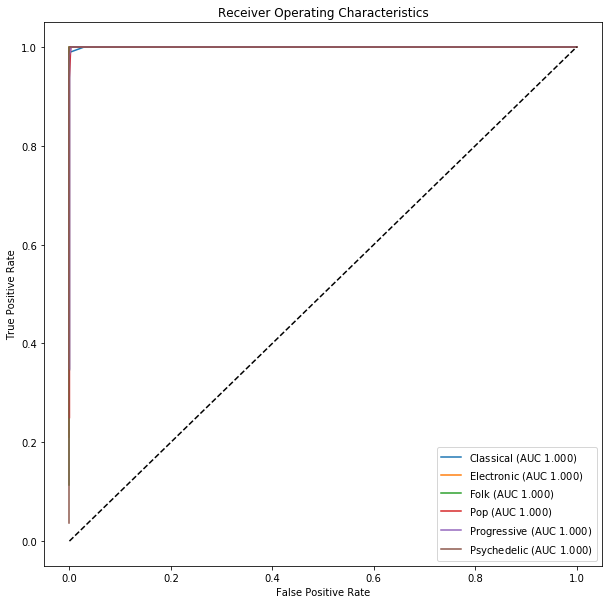

In [153]:
# ROC for Training Data
lucem_illud.plotMultiROC(clf_rf, train_data_df)

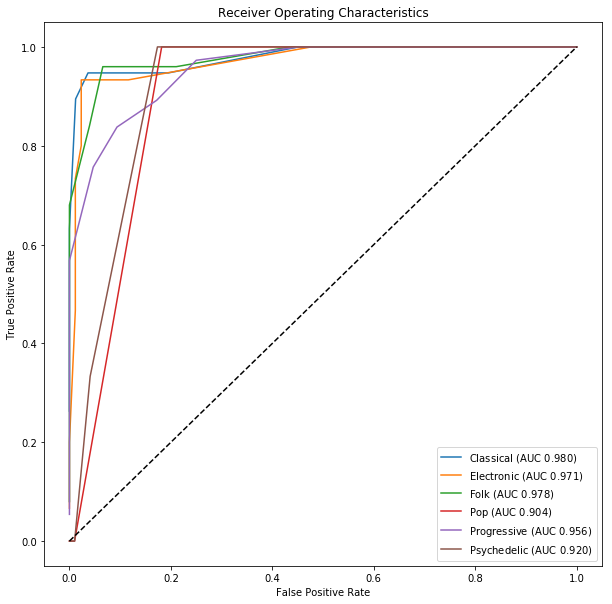

In [154]:
# ROC for Testing Data
lucem_illud.plotMultiROC(clf_rf, test_data_df)

<span style="color:blue"> For my data, Random Forest works better than Decision Tree. And the random forest directly got from the built-in classifier has very similar results to the random forest got from bagging the decision trees. Ensemble methods are learning algorithms that construct a set of classifiers and then classify new data points by taking a (weighted) vote of their predictions. So for complex samples, they might have more accuracy results than the direct predictors.

# K-Nearest Neighbors

The K-Nearest neighbors classifier takes a simpler premise than those before: Find the closest labeled datapoint in set and "borrow" its label.

Let's use newsgroup data again.

In [ ]:
newsgroupsDF[:5]


Make a testing and training set:

In [ ]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

Let's initialize our k-nearest neighbors classifier:

In [ ]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)


Let's try to classify using the TF-IDF vectors:

In [ ]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

In [ ]:
clf_knearest.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])


In [ ]:
lucem_illud.evaluateClassifier(clf_knearest, train_ng_df)


And lets look at the testing data

In [ ]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = clf_knearest.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))


Let's produce another confusion matrix:

In [ ]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_ng_df)


You can produce the PCA space visual if you want, altough it can take a very long time, so we'll leave it optionally commented out:

In [ ]:
#lucem_illud.plotregions(clf_knearest, test_ng_df)


## <span style="color:red">*Exercise 4*</span>

<span style="color:red">In the cells immediately following, perform and visualize k-nearest neighbor classification using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. Visualize the classification of data points and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Articulate how the *k*-nearest neighbor approach relates to *k*-means clustering explored in ***week 3***?

In [111]:
n_neighbors = 5
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

clf_knearest.fit(np.stack(train_data_df['vect'], axis = 0), train_data_df['category'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform')

In [112]:
#Add to df
test_data_df['knn_predict'] = clf_knearest.predict(np.stack(test_data_df['vect'], axis=0))

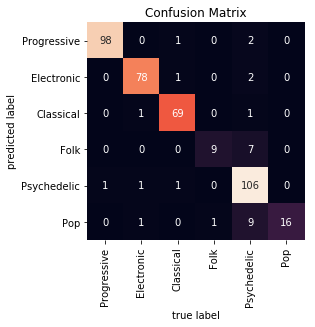

In [161]:
lucem_illud.plotConfusionMatrix(clf_knearest, train_data_df)

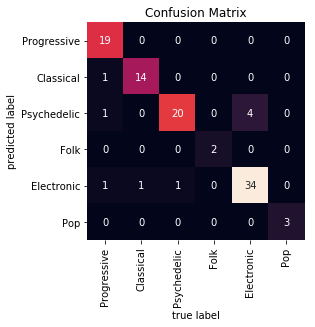

In [120]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_data_df)

In [133]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_data_df['knn_predict'], test_data_df['category']))
print('Precision Score: ', sklearn.metrics.precision_score(test_data_df['knn_predict'], test_data_df['category'], average = 'weighted')) #precision
print('Recall: ', sklearn.metrics.recall_score(test_data_df['knn_predict'], test_data_df['category'], average = 'weighted')) #recall
print('F1 Score: ', sklearn.metrics.f1_score(test_data_df['knn_predict'], test_data_df['category'], average = 'weighted')) #F-1 measure

Accuracy Score:  0.9108910891089109
Precision Score:  0.918009098207118
Recall:  0.9108910891089109
F1 Score:  0.9119252158513836


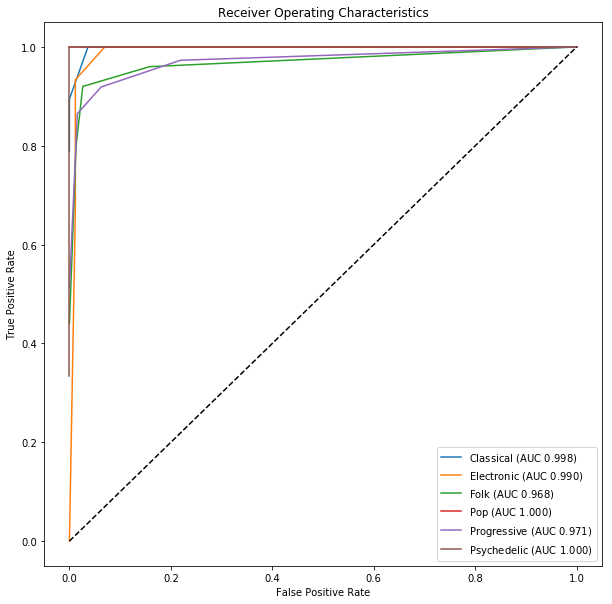

In [162]:
# ROC for Testing Data
lucem_illud.plotMultiROC(clf_knearest, test_data_df)

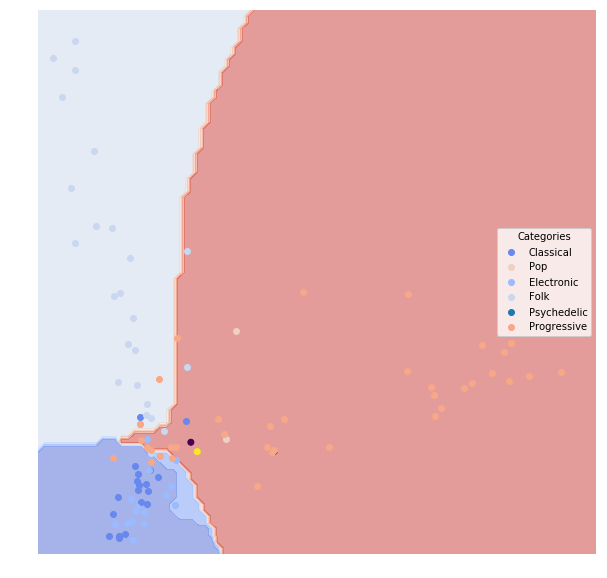

In [163]:
lucem_illud.plotregions(clf_knearest, test_data_df)

<span style="color:blue"> Both of K-Means and KNN try to classify data points with a parameter k. But the difference is that the k in K-Means is the number of clusters, while the k in KNN is the number of nearest neighbors that needs to be considered. The former one is an unsupervised method, while the latter one is a supervised method.

# SVMs

Now we will examine Support Vector Machines, an approach that creates the partition that preserves the "maximum margin" between classes.

We will use a few sub forums from reddit--which tend to share text rather than memes--namely `talesfromtechsupport`, `badroommates`, `weeabootales` and `relationships`. The top 100 text posts from each have been saved to `data/reddit.csv`.

In [ ]:
redditDf = pandas.read_csv('../data/reddit.csv', index_col = 0)

#Drop a couple missing values

redditDf = redditDf.dropna()

#Set category

redditDf['category'] = redditDf['subreddit']

#tokenize and normalize
redditDf['tokenized_text'] = redditDf['text'].apply(lambda x: nltk.word_tokenize(x))
redditDf['normalized_text'] = redditDf['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

We will tf.idf the data to make our vectors:

In [ ]:
redditTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
redditTFVects = redditTFVectorizer.fit_transform([' '.join(l) for l in redditDf['normalized_text']])
redditDf['vect'] = [np.array(v).flatten() for v in redditTFVects.todense()]

Initilize the model and make a train test split:

In [ ]:
holdBackFraction = .2
train_redditDf, test_redditDf = lucem_illud.trainTestSplit(redditDf, holdBackFraction=holdBackFraction)

In [ ]:
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
#probability = True is slower but  lets you call predict_proba()
clf_svm.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])


...and consider the results:

In [ ]:
lucem_illud.evaluateClassifier(clf_svm, test_redditDf)


In [ ]:
lucem_illud.plotConfusionMatrix(clf_svm, test_redditDf)


In [ ]:
lucem_illud.plotregions(clf_svm, test_redditDf)


# Neural Nets

We include an example of a simple neural network, the Multi-layer Perceptron (MLP) that learns a function $f(\cdot): R^m \rightarrow R^o$ by training on a dataset, where $m$ is the number of dimensions for input and $o$ is the number of dimensions for output. Given a set of features $X = {x_1, x_2, ..., x_m}$ and a target $y$, it can learn a non-linear function approximator for either classification or regression. It is different from logistic regression, in that between the input and the output layer, there can be one or more non-linear layers, called hidden layers. The following figure shows a one hidden layer MLP with scalar output. ![title](../data/multilayerperceptron_network.png) The leftmost layer, known as the input layer, consists of a set of "neurons" $\{x_i | x_1, x_2, ..., x_m\}$ representing the input features (e.g., weighted words). Each neuron in the hidden layer transforms the values from the previous layer with a weighted linear summation $w_1x_1 + w_2x_2 + ... + w_mx_m$, followed by a non-linear activation function $g(\cdot):R \rightarrow R$ - like the logistic or hyperbolic tan function. The output layer receives the values from the last hidden layer and transforms them into output values.

In [ ]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])


In [ ]:
lucem_illud.evaluateClassifier(clf_nn, test_redditDf)


In [ ]:
lucem_illud.plotConfusionMatrix(clf_nn, test_redditDf)


In [ ]:
lucem_illud.plotregions(clf_nn, test_redditDf)


It performs very well.

## <span style="color:red">*Exercise 5*</span>

<span style="color:red">In the cells immediately following, perform a neural network classification and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). How does this classify relevant to *k*-nearest neighbor, Naive Bayes, logistic and decision-tree approaches?

In [115]:
# Train the model
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='adam', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False)

In [116]:
#Add to df
test_data_df['nn_predict'] = clf_nn.predict(np.stack(test_data_df['vect'], axis=0))

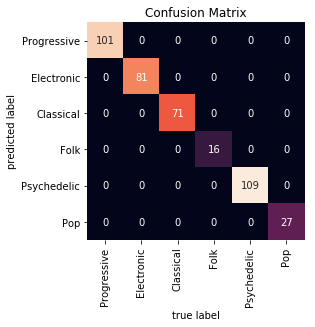

In [164]:
lucem_illud.plotConfusionMatrix(clf_nn, train_data_df)

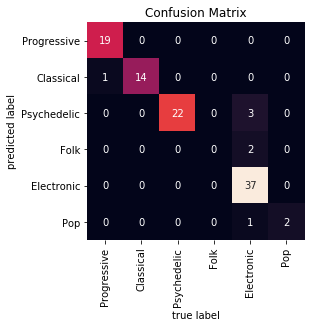

In [118]:
lucem_illud.plotConfusionMatrix(clf_nn, test_data_df)

In [134]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_data_df['nn_predict'], test_data_df['category']))
print('Precision Score: ', sklearn.metrics.precision_score(test_data_df['nn_predict'], test_data_df['category'], average = 'weighted')) #precision
print('Recall: ', sklearn.metrics.recall_score(test_data_df['nn_predict'], test_data_df['category'], average = 'weighted')) #recall
print('F1 Score: ', sklearn.metrics.f1_score(test_data_df['nn_predict'], test_data_df['category'], average = 'weighted')) #F-1 measure

Accuracy Score:  0.9306930693069307
Precision Score:  0.958019801980198
Recall:  0.9306930693069307
F1 Score:  0.9403481737360483


/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


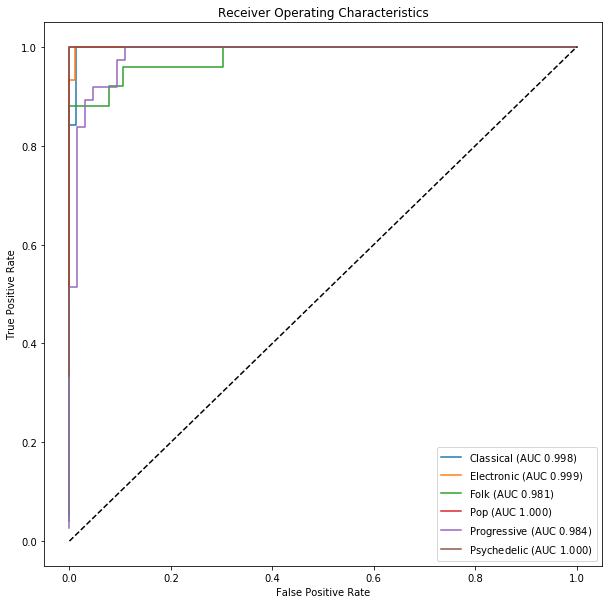

In [165]:
# ROC for Testing Data
lucem_illud.plotMultiROC(clf_nn, test_data_df)

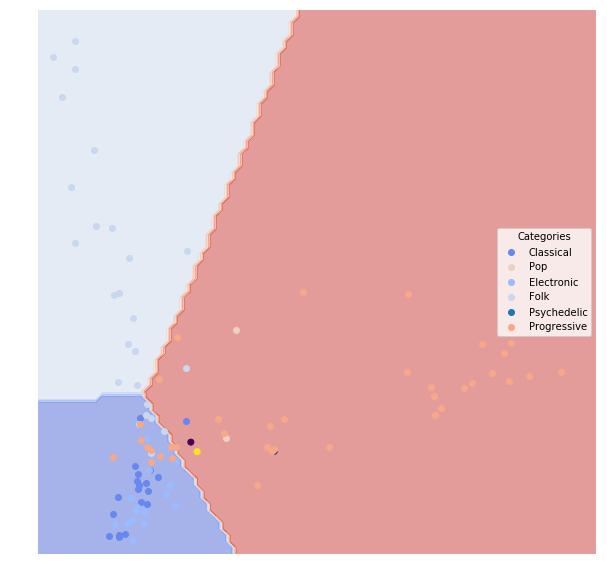

In [167]:
lucem_illud.plotregions(clf_nn, test_data_df)

<span style="color:blue"> For my dataset, compared to results of other classification methods, Neural Network has better test scores. It means it has greater accuracy in prediction. But except for Decision Tree, their test scores are very close, which means my dataset is not very confounding, not very hard to classify. Especially, according to the test scores, Neural Netwrk gives similar performance to KNN. But Neural Network classify the space in a more reasonable way than KNN, according to the plot for regions.